In [1]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from tqdm import trange
from tqdm import tqdm
import time
from numba import jit

import matplotlib.cm as cm
from scientific_colourmaps import *

In [2]:
#from jupyterthemes.stylefx import set_nb_theme
#set_nb_theme('solarizedl')
#set_nb_theme('solarizedd')

In [3]:
np.__version__

'1.16.3'

In [4]:
#LineProfiler

from __future__ import print_function # Always do this >:( 
from __future__ import division
%load_ext line_profiler

In [5]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

In [6]:
@jit
def galdtype_darksage(Nannuli=30):
    floattype = np.float32
    Galdesc_full = [
                    ('Type'                         , np.int32),
                    ('GalaxyIndex'                  , np.int64),
                    ('HaloIndex'                    , np.int32),
                    ('SimulationHaloIndex'          , np.int32),
                    ('TreeIndex'                    , np.int32),
                    ('SnapNum'                      , np.int32),
                    ('CentralGalaxyIndex'           , np.int64),
                    ('CentralMvir'                  , floattype),
                    ('mergeType'                    , np.int32),
                    ('mergeIntoID'                  , np.int32),
                    ('mergeIntoSnapNum'             , np.int32),
                    ('dT'                           , floattype),
                    ('Pos'                          , (floattype, 3)),
                    ('Vel'                          , (floattype, 3)),
                    ('Spin'                         , (floattype, 3)),
                    ('Len'                          , np.int32),
                    ('LenMax'                       , np.int32),
                    ('Mvir'                         , floattype),
                    ('Rvir'                         , floattype),
                    ('Vvir'                         , floattype),
                    ('Vmax'                         , floattype),
                    ('VelDisp'                      , floattype),
                    ('DiscRadii'                    , (floattype, Nannuli+1)), 
                    ('ColdGas'                      , floattype),
                    ('StellarMass'                  , floattype),
                    ('MergerBulgeMass'              , floattype),
                    ('InstabilityBulgeMass'          , floattype),
                    ('HotGas'                       , floattype),
                    ('EjectedMass'                  , floattype),
                    ('BlackHoleMass'                , floattype),
                    ('IntraClusterStars'            , floattype),
                    ('DiscGas'                      , (floattype, Nannuli)),
                    ('DiscStars'                    , (floattype, Nannuli)),
                    ('SpinStars'                    , (floattype, 3)),
                    ('SpinGas'                      , (floattype, 3)),
                    ('SpinClassicalBulge'           , (floattype, 3)),
                    ('StarsInSitu'                  , floattype),
                    ('StarsInstability'             , floattype),
                    ('StarsMergeBurst'              , floattype),
                    ('DiscHI'                       , (floattype, Nannuli)),
                    ('DiscH2'                       , (floattype, Nannuli)),
                    ('DiscSFR'                      , (floattype, Nannuli)), 
                    ('MetalsColdGas'                , floattype),
                    ('MetalsStellarMass'            , floattype),
                    ('ClassicalMetalsBulgeMass'     , floattype),
                    ('SecularMetalsBulgeMass'       , floattype),
                    ('MetalsHotGas'                 , floattype),
                    ('MetalsEjectedMass'            , floattype),
                    ('MetalsIntraClusterStars'      , floattype),
                    ('DiscGasMetals'                , (floattype, Nannuli)),
                    ('DiscStarsMetals'              , (floattype, Nannuli)),
                    ('SfrFromH2'                    , floattype),
                    ('SfrInstab'                    , floattype),
                    ('SfrMergeBurst'                , floattype),
                    ('SfrDiskZ'                     , floattype),
                    ('SfrBulgeZ'                    , floattype),
                    ('DiskScaleRadius'              , floattype),
                    ('CoolScaleRadius'              , floattype), 
                    ('StellarDiscScaleRadius'       , floattype),
                    ('Cooling'                      , floattype),
                    ('Heating'                      , floattype),
                    ('LastMajorMerger'              , floattype),
                    ('LastMinorMerger'              , floattype),
                    ('OutflowRate'                  , floattype),
                    ('infallMvir'                   , floattype),
                    ('infallVvir'                   , floattype),
                    ('infallVmax'                   , floattype)
                    ]
    names = [Galdesc_full[i][0] for i in range(len(Galdesc_full))]
    formats = [Galdesc_full[i][1] for i in range(len(Galdesc_full))]
    Galdesc = np.dtype({'names':names, 'formats':formats}, align=True)
    return Galdesc

# Plot

In [7]:
#print(range(30,60))

In [12]:
# Make plots for z=0 galaxies that are typically used to constrain Dark Sage.

from pylab import *
import os
import routines as r
import random

# Warnings are annoying
import warnings
warnings.filterwarnings("ignore")


###### USER NEEDS TO SET THESE THINGS ######
indir = '/fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/' # directory where the Dark Sage data are
sim = 1 # which simulation Dark Sage has been run on -- if it's new, you will need to set its defaults below.
#   0 = Mini Millennium, 1 = Full Millennium, 2 = SMDPL
n_files = 30
fpre = 'model_z0.000' # what is the prefix name of the z=0 files
files = range(n_files) # list of file numbers you want to read
print('Loaded files:', files)
Nannuli = 30 # number of annuli used for discs in Dark Sage
FirstBin = 1.0 # copy from parameter file -- sets the annuli's sizes
ExponentBin = 1.4
###### ============================== ######



##### SIMULATION DEFAULTS #####
if sim==0:
    h = 0.73
    Lbox = 62.5/h * (len(files)/8.)**(1./3)
elif sim==1:
    h = 0.73
    Lbox = 500.0/h * (len(files)/512.)**(1./3)
elif sim==2:
    h = 0.6777
    Lbox = 400.0/h * (len(files)/1000.)**(1./3)
# add here 'elif sim==3:' etc for a new simulation
else:
    print('Please specify a valid simulation.  You may need to add its defaults to this code.')
    quit()
######  ================= #####


Loaded files: range(0, 30)


In [13]:
##### READ DARK SAGE DATA #####
DiscBinEdge = np.append(0, np.array([FirstBin*ExponentBin**i for i in range(Nannuli)])) / h
G = r.darksage_snap(indir+fpre, files, Nannuli=Nannuli)
######  ================= #####


  7%|▋         | 2/29 [00:00<00:02, 12.13it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_0 has 39278 galaxies.
File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_1 has 29289 galaxies.
File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_2 has 29623 galaxies.
File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_3 has 25840 galaxies.


 14%|█▍        | 4/29 [00:00<00:02,  9.32it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_4 has 33349 galaxies.
File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_5 has 35860 galaxies.


 17%|█▋        | 5/29 [00:00<00:02,  8.28it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_6 has 41438 galaxies.


 21%|██        | 6/29 [00:00<00:03,  7.37it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_7 has 39391 galaxies.


 24%|██▍       | 7/29 [00:01<00:03,  6.62it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_8 has 28109 galaxies.


 28%|██▊       | 8/29 [00:01<00:03,  6.08it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_9 has 31390 galaxies.


 31%|███       | 9/29 [00:01<00:03,  5.63it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_10 has 39977 galaxies.


 34%|███▍      | 10/29 [00:01<00:03,  5.19it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_11 has 34782 galaxies.


 38%|███▊      | 11/29 [00:02<00:03,  4.84it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_12 has 39496 galaxies.


 41%|████▏     | 12/29 [00:02<00:03,  4.53it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_13 has 39383 galaxies.


 45%|████▍     | 13/29 [00:03<00:03,  4.24it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_14 has 35208 galaxies.


 48%|████▊     | 14/29 [00:03<00:03,  4.00it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_15 has 34577 galaxies.


 52%|█████▏    | 15/29 [00:04<00:03,  3.64it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_16 has 32512 galaxies.


 55%|█████▌    | 16/29 [00:04<00:03,  3.30it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_17 has 48231 galaxies.


 59%|█████▊    | 17/29 [00:05<00:03,  3.01it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_18 has 36485 galaxies.


 62%|██████▏   | 18/29 [00:06<00:03,  2.83it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_19 has 24398 galaxies.


 66%|██████▌   | 19/29 [00:07<00:03,  2.65it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_20 has 43011 galaxies.


 69%|██████▉   | 20/29 [00:07<00:03,  2.51it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_21 has 32082 galaxies.


 72%|███████▏  | 21/29 [00:08<00:03,  2.39it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_22 has 37098 galaxies.


 76%|███████▌  | 22/29 [00:09<00:03,  2.27it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_23 has 36172 galaxies.


 79%|███████▉  | 23/29 [00:10<00:02,  2.13it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_24 has 30878 galaxies.


 83%|████████▎ | 24/29 [00:11<00:02,  2.05it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_25 has 32780 galaxies.


 86%|████████▌ | 25/29 [00:12<00:02,  1.97it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_26 has 27697 galaxies.


 90%|████████▉ | 26/29 [00:13<00:01,  1.91it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_27 has 31212 galaxies.


 93%|█████████▎| 27/29 [00:14<00:01,  1.85it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_28 has 30988 galaxies.


 97%|█████████▋| 28/29 [00:15<00:00,  1.80it/s]

File /fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/model_z0.000_29 has 26663 galaxies.


100%|██████████| 29/29 [00:16<00:00,  1.74it/s]


In [14]:
##### SET PLOTTING DEFAULTS #####
fsize = 26
matplotlib.rcParams.update({'font.size': fsize, 'xtick.major.size': 10, 'ytick.major.size': 10, 'xtick.major.width': 1, 'ytick.major.width': 1, 'ytick.minor.size': 5, 'xtick.minor.size': 5, 'xtick.direction': 'in', 'ytick.direction': 'in', 'axes.linewidth': 1, 'text.usetex': True, 'font.family': 'serif', 'font.serif': 'Times New Roman', 'legend.numpoints': 1, 'legend.columnspacing': 1, 'legend.fontsize': fsize-4, 'xtick.top': True, 'ytick.right': True})

NpartMed = 100 # minimum number of particles for finding relevant medians for minima on plots

outdir = '/fred/oz042/rdzudzar/python/' # where the plots will be saved
if not os.path.exists(outdir): os.makedirs(outdir)
######  =================== #####

# Make G dataftrame for galaxies with LenMax>=100

In [15]:
# Make a sub_section of dataframe G so that it is controlled by the LenMax
print(len(G['LenMax']))
G = G [G['LenMax']>=100 ]
print(len(G['LenMax']))

1027197
298287


## Want to store output as Pandas dataframe; Have to convert multidimensional arrays into Pandas series first:

In [16]:
import pandas as pd

In [13]:
# This is a way to converte multi dimensional data into pd.Series and then load these into the pandas dataframe
Pos = []
for p in G['Pos']:
    Pos.append(p)
Pos_df = pd.Series(Pos, dtype=np.dtype("object"))

Vel = []
for v in G['Vel']:
    Vel.append(v)
Vel_df = pd.Series(Vel, dtype=np.dtype("object"))

Spin = []
for s in G['Spin']:
    Spin.append(s)
Spin_df = pd.Series(Spin, dtype=np.dtype("object"))

Disc_r = []
for d in G['DiscRadii']:
    Disc_r.append(d)
Disc_df = pd.Series(Disc_r, dtype=np.dtype("object"))

Disc_gas = []
for g in G['DiscGas']:
    Disc_gas.append(g)
Disc_gas_df = pd.Series(Disc_gas, dtype=np.dtype("object"))

Disc_stars = []
for g in G['DiscStars']:
    Disc_stars.append(g)
Disc_stars_df = pd.Series(Disc_stars, dtype=np.dtype("object"))

SpinStars = []
for g in G['SpinStars']:
    SpinStars.append(g)
SpinStars_df = pd.Series(SpinStars, dtype=np.dtype("object"))

SpinGas = []
for g in G['SpinGas']:
    SpinGas.append(g)
SpinGas_df = pd.Series(SpinGas , dtype=np.dtype("object"))

SpinClassicalBulge = []
for g in G['SpinClassicalBulge']:
    SpinClassicalBulge.append(g)
SpinClassicalBulge_df = pd.Series(SpinClassicalBulge, dtype=np.dtype("object"))

DiscHI = []
for g in G['DiscHI']:
    DiscHI.append(g)
DiscHI_df = pd.Series(DiscHI, dtype=np.dtype("object"))

DiscH2 = []
for g in G['DiscH2']:
    DiscH2.append(g)
DiscH2_df = pd.Series(DiscH2, dtype=np.dtype("object"))

DiscSFR = []
for g in G['DiscSFR']:
    DiscSFR.append(g)
DiscSFR_df = pd.Series(DiscSFR, dtype=np.dtype("object"))

DiscGasMetals = []
for g in G['DiscGasMetals']:
    DiscGasMetals.append(g)
DiscGasMetals_df = pd.Series(DiscGasMetals, dtype=np.dtype("object"))

DiscStarsMetals = []
for g in G['DiscStarsMetals']:
    DiscStarsMetals.append(g)
DiscStarsMetals_df = pd.Series(DiscStarsMetals, dtype=np.dtype("object"))


# Storing DarkSage output as Pandas dataframe: DS

In [14]:
DS = pd.DataFrame({'Type'   : G['Type'                      ],
'GalaxyIndex'               : G['GalaxyIndex'               ],
'HaloIndex'                 : G['HaloIndex'                 ],
'SimulationHaloIndex'       : G['SimulationHaloIndex'       ],
'TreeIndex'                 : G['TreeIndex'                 ],
'SnapNum'                   : G['SnapNum'                   ],
'CentralGalaxyIndex'        : G['CentralGalaxyIndex'        ],
'CentralMvir'               : G['CentralMvir'               ],
'mergeType'                 : G['mergeType'                 ],
'mergeIntoID'               : G['mergeIntoID'               ],
'mergeIntoSnapNum'          : G['mergeIntoSnapNum'          ],
'dT'                        : G['dT'                        ],
'Pos'                       : Pos_df,
'Vel'                       : Vel_df                       ,
'Spin'                      : Spin_df                      ,
'Len'                       : G['Len'                       ],
'LenMax'                    : G['LenMax'                    ],
'Mvir'                      : G['Mvir'                      ],
'Rvir'                      : G['Rvir'                      ],
'Vvir'                      : G['Vvir'                      ],
'Vmax'                      : G['Vmax'                      ],
'VelDisp'                   : G['VelDisp'                   ],
'DiscRadii'                 : Disc_df,
'ColdGas'                   : G['ColdGas'                   ],
'StellarMass'               : G['StellarMass'               ],
'MergerBulgeMass'           : G['MergerBulgeMass'           ],
'InstabilityBulgeMass'      : G['InstabilityBulgeMass'      ],
'HotGas'                    : G['HotGas'                    ],
'EjectedMass'               : G['EjectedMass'               ],
'BlackHoleMass'             : G['BlackHoleMass'             ],
'IntraClusterStars'         : G['IntraClusterStars'         ],
'DiscGas'                   : Disc_gas_df,
'DiscStars'                 : Disc_stars_df,
'SpinStars'                 : SpinStars_df,
'SpinGas'                   : SpinGas_df,
'SpinClassicalBulge'        : SpinClassicalBulge_df,
'StarsInSitu'               : G['StarsInSitu'               ],
'StarsInstability'          : G['StarsInstability'          ],
'StarsMergeBurst'           : G['StarsMergeBurst'           ],
'DiscHI'                    : DiscHI_df,
'DiscH2'                    : DiscH2_df,
'DiscSFR'                   : DiscSFR_df,
'MetalsColdGas'             : G['MetalsColdGas'             ],
'MetalsStellarMass'         : G['MetalsStellarMass'         ],
'ClassicalMetalsBulgeMass'  : G['ClassicalMetalsBulgeMass'  ],
'SecularMetalsBulgeMass'    : G['SecularMetalsBulgeMass'    ],
'MetalsHotGas'              : G['MetalsHotGas'              ],
'MetalsEjectedMass'         : G['MetalsEjectedMass'         ],
'MetalsIntraClusterStars'   : G['MetalsIntraClusterStars'   ],
'DiscGasMetals'             : DiscGasMetals_df,
'DiscStarsMetals'           : DiscStarsMetals_df,
'SfrFromH2'                 : G['SfrFromH2'                 ],
'SfrInstab'                 : G['SfrInstab'                 ],
'SfrMergeBurst'             : G['SfrMergeBurst'             ],
'SfrDiskZ'                  : G['SfrDiskZ'                  ],
'SfrBulgeZ'                 : G['SfrBulgeZ'                 ],
'DiskScaleRadius'           : G['DiskScaleRadius'           ],
'CoolScaleRadius'           : G['CoolScaleRadius'           ],
'StellarDiscScaleRadius'    : G['StellarDiscScaleRadius'    ],
'Cooling'                   : G['Cooling'                   ],
'Heating'                   : G['Heating'                   ],
'LastMajorMerger'           : G['LastMajorMerger'           ],
'LastMinorMerger'           : G['LastMinorMerger'           ],
'OutflowRate'               : G['OutflowRate'               ],
'infallMvir'                : G['infallMvir'                ],
'infallVvir'                : G['infallVvir'                ],
'infallVmax'                : G['infallVmax'                ]})


In [15]:
DS.columns

Index(['Type', 'GalaxyIndex', 'HaloIndex', 'SimulationHaloIndex', 'TreeIndex',
       'SnapNum', 'CentralGalaxyIndex', 'CentralMvir', 'mergeType',
       'mergeIntoID', 'mergeIntoSnapNum', 'dT', 'Pos', 'Vel', 'Spin', 'Len',
       'LenMax', 'Mvir', 'Rvir', 'Vvir', 'Vmax', 'VelDisp', 'DiscRadii',
       'ColdGas', 'StellarMass', 'MergerBulgeMass', 'InstabilityBulgeMass',
       'HotGas', 'EjectedMass', 'BlackHoleMass', 'IntraClusterStars',
       'DiscGas', 'DiscStars', 'SpinStars', 'SpinGas', 'SpinClassicalBulge',
       'StarsInSitu', 'StarsInstability', 'StarsMergeBurst', 'DiscHI',
       'DiscH2', 'DiscSFR', 'MetalsColdGas', 'MetalsStellarMass',
       'ClassicalMetalsBulgeMass', 'SecularMetalsBulgeMass', 'MetalsHotGas',
       'MetalsEjectedMass', 'MetalsIntraClusterStars', 'DiscGasMetals',
       'DiscStarsMetals', 'SfrFromH2', 'SfrInstab', 'SfrMergeBurst',
       'SfrDiskZ', 'SfrBulgeZ', 'DiskScaleRadius', 'CoolScaleRadius',
       'StellarDiscScaleRadius', 'Cooling', 'Heating', 

# My stuff

### Cut based on the stellar mass
### The HI mass: np.sum(G['DiscHI'],axis=1)

In [17]:
#Mass resolution 8.6x10^8 Msun/h  
#Make a cut at stellar masses of logMstar=8.8 -- based on the 100 particle median mass -- shown above
#0.088*h is 0.06424 which then becomes cut of 8.8 when divided with h
Stellar_mass_cut = G['StellarMass'] [ G['StellarMass']>0.06424 ]/h
HI_mass_cut = np.sum(G['DiscHI'],axis=1) [ G['StellarMass']>0.06424 ]/h
Mvir_mass_cut = G['Mvir'] [ G['StellarMass']>0.06424 ]/h

In [18]:
print(len(Stellar_mass_cut))

271657


In [19]:
#CENTRALS
Mstellar_central_galaxies_cut = G['StellarMass'] [ (G['CentralGalaxyIndex']==G['GalaxyIndex']) & (G['StellarMass']>0.06424)]/h
Mcoldgas_central_galaxies_cut = np.sum(G['DiscHI'],axis=1) [ (G['CentralGalaxyIndex']==G['GalaxyIndex']) & (G['StellarMass']>0.06424) ]/h
Mvir_central_galaxies_cut = G['Mvir'] [ (G['CentralGalaxyIndex']==G['GalaxyIndex']) & (G['StellarMass']>0.06424) ]/h


In [20]:
#SATELLITES
Mstellar_satellite_galaxies_cut = G['StellarMass'] [ (G['CentralGalaxyIndex']!=G['GalaxyIndex']) & (G['StellarMass']>0.06424) ]/h
Mcoldgas_satellite_galaxies_cut = np.sum(G['DiscHI'],axis=1) [ (G['CentralGalaxyIndex']!=G['GalaxyIndex']) & (G['StellarMass']>0.06424) ]/h
Mvir_satellite_galaxies_cut = G['Mvir'] [ (G['CentralGalaxyIndex']!=G['GalaxyIndex']) & (G['StellarMass']>0.06424) ]/h


In [20]:
#TO STORE VARIABLES WHICH CAN BE USED IN ANOTHER NOTEBOOK
#central
%store Mstellar_central_galaxies_cut 
%store Mcoldgas_central_galaxies_cut 
%store Mvir_central_galaxies_cut
#satellite
%store Mstellar_satellite_galaxies_cut 
%store Mcoldgas_satellite_galaxies_cut 
%store Mvir_satellite_galaxies_cut

Stored 'Mstellar_central_galaxies_cut' (ndarray)
Stored 'Mcoldgas_central_galaxies_cut' (ndarray)
Stored 'Mvir_central_galaxies_cut' (ndarray)
Stored 'Mstellar_satellite_galaxies_cut' (ndarray)
Stored 'Mcoldgas_satellite_galaxies_cut' (ndarray)
Stored 'Mvir_satellite_galaxies_cut' (ndarray)


# Plot MHI vs M* relation

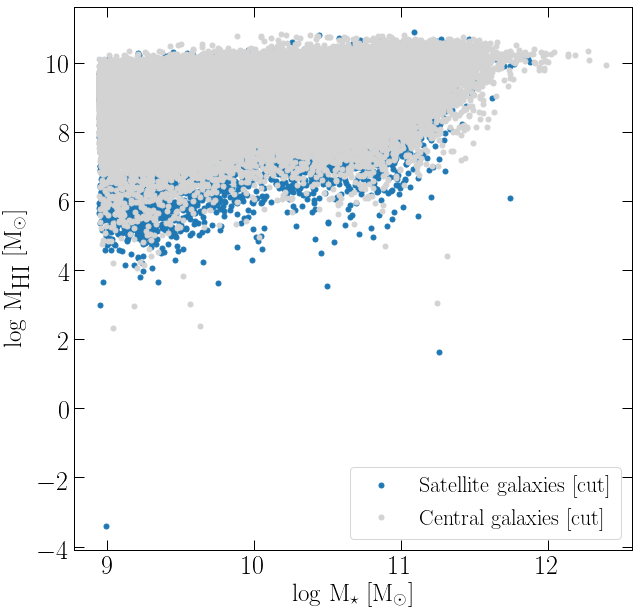

In [21]:
fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

plt.plot( np.log10( (Mstellar_satellite_galaxies_cut*10**10)) ,np.log10( (Mcoldgas_satellite_galaxies_cut*10**10)), 'o', color='#1f78b4', markersize=5, label=r'Satellite galaxies [cut]')
#plt.plot(cut_stell*1e10/h, 'o', color='r')
plt.plot( np.log10( (Mstellar_central_galaxies_cut*10**10)) ,np.log10( (Mcoldgas_central_galaxies_cut*10**10)), 'o', color='lightgrey', markersize=5, label=r'Central galaxies [cut]')


ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

plt.legend()
plt.show()

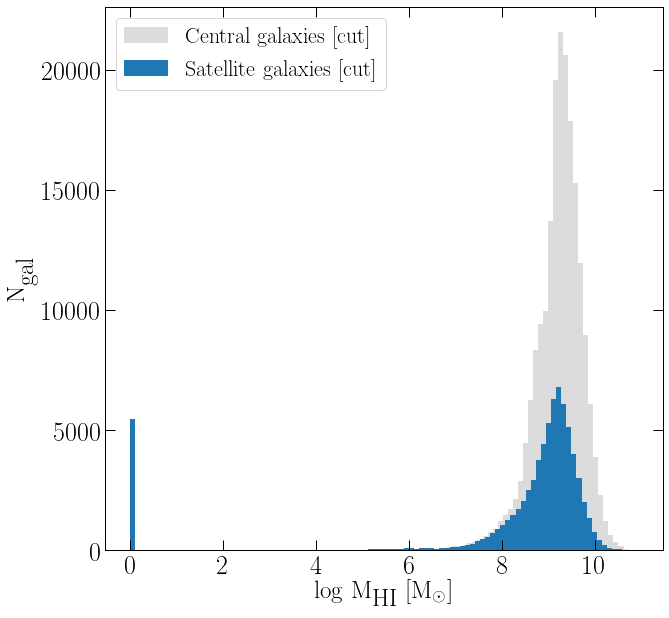

In [22]:
fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

#plt.plot(cut_stell*1e10/h, 'o', color='r')
plt.hist( np.log10(Mcoldgas_central_galaxies_cut*1e10+1), bins=100, color='lightgrey', alpha=0.8, label=r'Central galaxies [cut]')
plt.hist(np.log10(Mcoldgas_satellite_galaxies_cut*1e10+1), bins=100, color='#1f78b4', alpha=1, label=r'Satellite galaxies [cut]')


ax.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=25)
ax.set_xlabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

plt.legend()
#plt.xlim(-0.1, 3)
plt.show()

In [23]:
# Should be the same with and without LenMax cut if I'm using the updated G dataframe where galaxies are already removed which have smaller LenMax
LenMaxCut = 80

Mlen_central = G['LenMax'] [ (G['CentralGalaxyIndex']==G['GalaxyIndex']) & (G['StellarMass']>0.06424)& (G['LenMax']>=LenMaxCut)]/h
Mlen_all_central = G['LenMax'] [ (G['CentralGalaxyIndex']==G['GalaxyIndex']) & (G['StellarMass']>0.06424)]/h
print(len(Mlen_central))
print(len(Mlen_all_central))

Mlen_sat = G['LenMax'] [ (G['CentralGalaxyIndex']!=G['GalaxyIndex']) & (G['StellarMass']>0.06424) & (G['LenMax']>=LenMaxCut)]/h
Mlen_all_sat = G['LenMax'] [ (G['CentralGalaxyIndex']!=G['GalaxyIndex']) & (G['StellarMass']>0.06424) ]/h
print(len(Mlen_sat))
print(len(Mlen_all_sat))

# These numbers are for the first 30 files in BigBox
#50 Particles: 224298   224682   89236   89552
#60 Particles: 223043   224682   88119   89552  ~1700 less centrals; ~1500 less satellites
#70 Particles: 220066   224682   85638   89552  ~5000 less centrals; ~4000 less satellites
#80 Particles: 214977   224682   82003   89552  ~10 000 less centrals; ~4000 less satellites
#90 Particles: 207607   224682   77608   89552
#100 Particles: 198476  224682   73181   89552

198476
198476
73181
73181


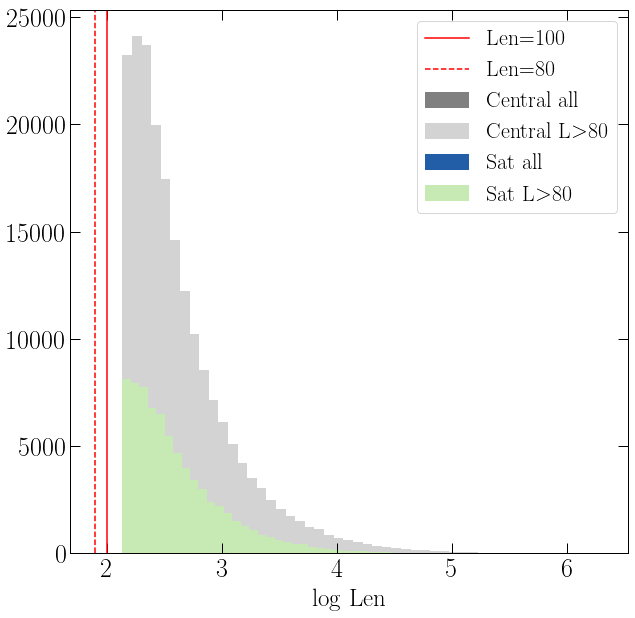

In [24]:

fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

plt.hist( np.log10(Mlen_all_central), bins=50, color='grey',  label=r'Central all')
plt.hist( np.log10(Mlen_central), bins=50, color='lightgrey',  label=r'Central L$>${0}'.format(LenMaxCut))
plt.hist( np.log10(Mlen_all_sat), bins=50, color='#225ea8',  label=r'Sat all')
plt.hist( np.log10(Mlen_sat), bins=50, color='#c7e9b4',  label=r'Sat L$>${0}'.format(LenMaxCut))


plt.axvline(2, 0, label='Len=100', color='red')
plt.axvline(1.903089, 0, label='Len=80', color='red', linestyle='--')

ax.set_xlabel(r'log Len', fontsize=25)
#ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

plt.legend()
plt.show()

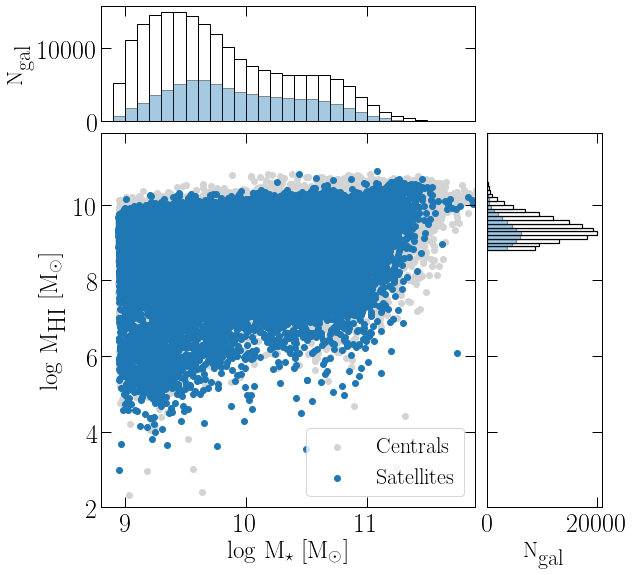

In [25]:
from matplotlib.ticker import NullFormatter

# the random data
x = np.log10( (Mstellar_satellite_galaxies_cut*10**10)) 
y = np.log10( (Mcoldgas_satellite_galaxies_cut*10**10+1))

w = np.log10( (Mstellar_central_galaxies_cut*10**10))
z = np.log10( (Mcoldgas_central_galaxies_cut*10**10+1))

nullfmt = NullFormatter()         # no labels

# definitions for the axes
left, width = 0.1, 0.65
bottom, height = 0.1, 0.65
bottom_h = left_h = left + width + 0.02

rect_scatter = [left, bottom, width, height]
rect_histx = [left, bottom_h, width, 0.2]
rect_histy = [left_h, bottom, 0.2, height]

# start with a rectangular Figure
plt.figure(1, figsize=(8, 8))

axScatter = plt.axes(rect_scatter)
axHistx = plt.axes(rect_histx)
axHisty = plt.axes(rect_histy)

# no labels
axHistx.xaxis.set_major_formatter(nullfmt)
axHisty.yaxis.set_major_formatter(nullfmt)

# the scatter plot:
axScatter.scatter(w, z, color='lightgrey', label='Centrals')
axScatter.scatter(x, y, color='#1f78b4', label='Satellites')

axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
axScatter.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

# now determine nice limits by hand:
binwidth = 0.1
xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(y))])
lim = (int(xymax/binwidth) + 1) * binwidth

axScatter.set_xlim((8.8, lim))
axScatter.set_ylim((2, lim))

bins = np.arange(8.8, lim + binwidth, binwidth)
axHistx.hist(w, bins=bins, color='white', edgecolor='k', linewidth=1)
axHisty.hist(z, bins=bins, orientation='horizontal', color='white', edgecolor='k', linewidth=1.2)

axHistx.hist(x, bins=bins, color='#1f78b4',alpha=0.4, edgecolor='black', linewidth=1)
axHisty.hist(y, bins=bins, orientation='horizontal', color='#1f78b4', alpha=0.4, edgecolor='black', linewidth=1.2)

axHistx.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=22)
axHisty.set_xlabel(r'N$_{\textrm{gal}}$', fontsize=22)

axHistx.set_xlim(axScatter.get_xlim())
axHisty.set_ylim(axScatter.get_ylim())

axScatter.legend()


plt.show()

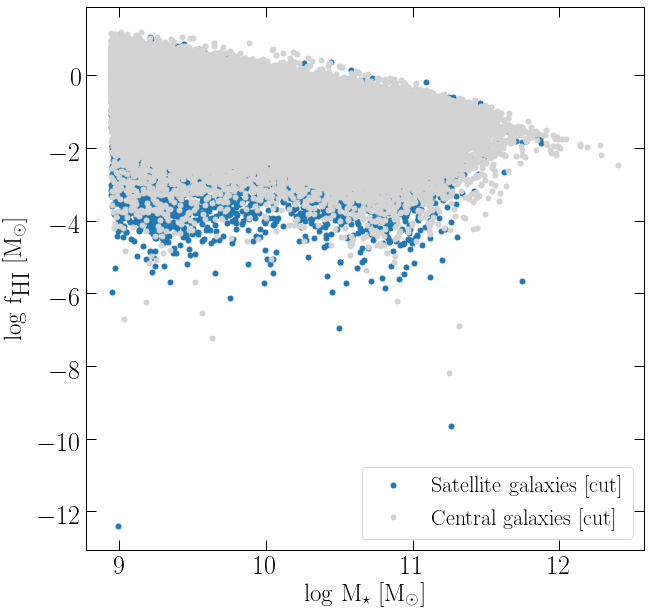

In [26]:
fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

plt.plot( np.log10( (Mstellar_satellite_galaxies_cut*1e10)) ,np.log10( (Mcoldgas_satellite_galaxies_cut*1e10)/(Mstellar_satellite_galaxies_cut*1e10)), 'o', color='#1f78b4', markersize=5, label=r'Satellite galaxies [cut]')
#plt.plot(cut_stell*1e10/h, 'o', color='r')
plt.plot( np.log10( (Mstellar_central_galaxies_cut*1e10)) ,np.log10( (Mcoldgas_central_galaxies_cut*1e10)/(Mstellar_central_galaxies_cut*1e10)), 'o', color='lightgrey', markersize=5, label=r'Central galaxies [cut]')

ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log f$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
 
plt.legend()
plt.show()

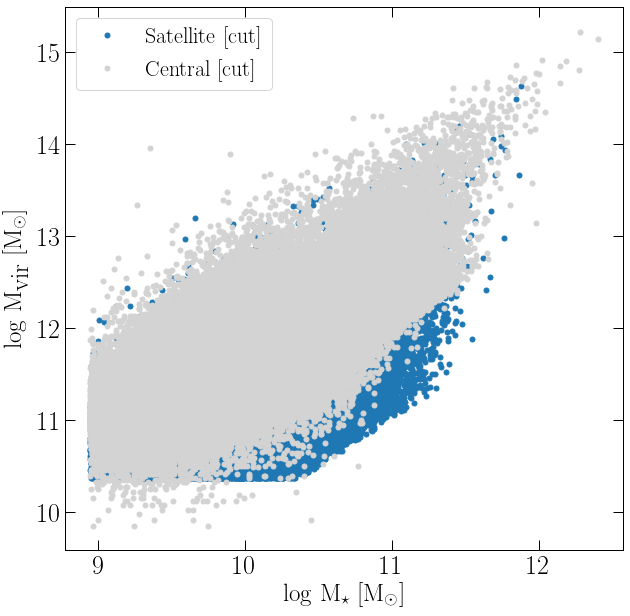

In [27]:
fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

plt.plot( np.log10( (Mstellar_satellite_galaxies_cut*1e10)) ,np.log10( (Mvir_satellite_galaxies_cut*1e10)), 'o', color='#1f78b4', markersize=5, label=r'Satellite [cut]')
#plt.plot(cut_stell*1e10/h, 'o', color='r')
plt.plot( np.log10( (Mstellar_central_galaxies_cut*1e10)) ,np.log10( (Mvir_central_galaxies_cut*1e10)), 'o', color='lightgrey', markersize=5, label=r'Central [cut]')


ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{vir}}$ [M$_{\odot}$]',fontsize=25)

plt.legend()
plt.show()

## Bulge-to-total ratio (All)
##### I want to see only late-type galaxies

In [28]:
BTT = (G['InstabilityBulgeMass'] + G['MergerBulgeMass']) / ( G['StellarMass'] ) # Find bulge to total ratio

# Including a cut in stellar mass
BTT_Disc = BTT[ ( G['StellarMass']>0.06424 ) & (BTT <= 0.5) ] # Disc dominated
BTT_Bulge = BTT[ ( G['StellarMass']>0.06424 ) & (BTT > 0.5) ] # Bulge dominated

Disc_dominated_SM = G['StellarMass'][ (G['StellarMass']>0.06424) & (BTT <= 0.5) ]
Bulge_dominated_SM = G['StellarMass'][ (G['StellarMass']>0.06424) & (BTT > 0.5) ]

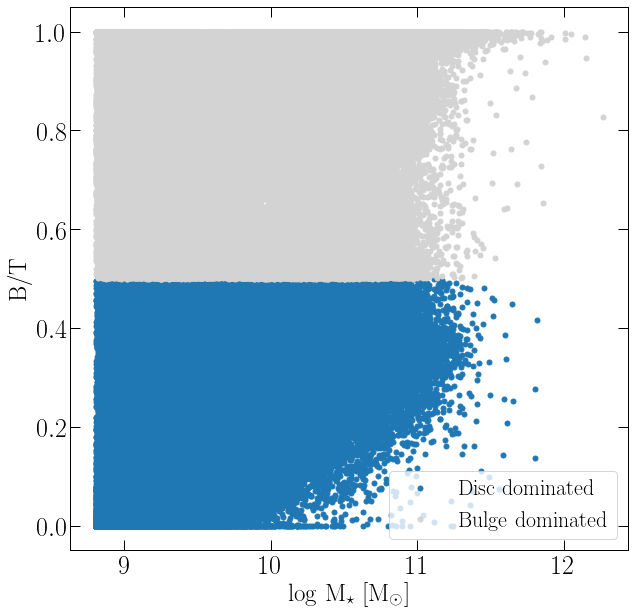

In [29]:
fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

plt.plot( np.log10( (Disc_dominated_SM*1e10)) ,BTT_Disc, 'o', color='#1f78b4', markersize=5, label=r'Disc dominated')
#plt.plot(cut_stell*1e10/h, 'o', color='r')
plt.plot( np.log10( (Bulge_dominated_SM*1e10)) ,BTT_Bulge, 'o', color='lightgrey', markersize=5, label=r'Bulge dominated')


ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'B/T',fontsize=25)

plt.legend()
plt.show()

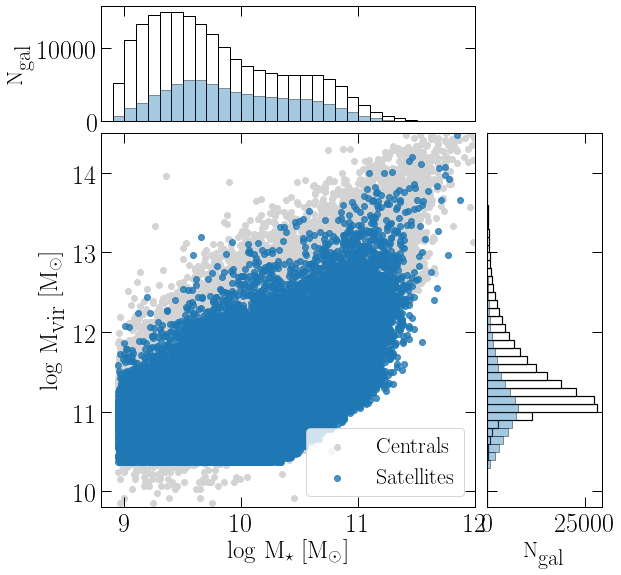

In [30]:
from matplotlib.ticker import NullFormatter

# the random data
x = np.log10( (Mstellar_satellite_galaxies_cut*10**10)) 
y = np.log10( (Mvir_satellite_galaxies_cut*1e10))

w = np.log10( (Mstellar_central_galaxies_cut*10**10))
z = np.log10( (Mvir_central_galaxies_cut*1e10))

nullfmt = NullFormatter()         # no labels

# definitions for the axes
left, width = 0.1, 0.65
bottom, height = 0.1, 0.65
bottom_h = left_h = left + width + 0.02

rect_scatter = [left, bottom, width, height]
rect_histx = [left, bottom_h, width, 0.2]
rect_histy = [left_h, bottom, 0.2, height]

# start with a rectangular Figure
plt.figure(1, figsize=(8, 8))

axScatter = plt.axes(rect_scatter)
axHistx = plt.axes(rect_histx)
axHisty = plt.axes(rect_histy)

# no labels
axHistx.xaxis.set_major_formatter(nullfmt)
axHisty.yaxis.set_major_formatter(nullfmt)

# the scatter plot:
axScatter.scatter(w, z, color='lightgrey', label='Centrals')
axScatter.scatter(x, y, color='#1f78b4', label='Satellites', alpha=0.8)

axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
axScatter.set_ylabel(r'log M$_{\textrm{vir}}$ [M$_{\odot}$]',fontsize=25)

# now determine nice limits by hand:
binwidth = 0.1
xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(y))])
lim = (int(xymax/binwidth) + 1) * binwidth

axScatter.set_xlim((8.8, 12))
axScatter.set_ylim((9.8, 14.5))

bins = np.arange(8.8, lim + binwidth, binwidth)
axHistx.hist(w, bins=bins, color='white', edgecolor='k', linewidth=1)
axHisty.hist(z, bins=bins, orientation='horizontal', color='white', edgecolor='k', linewidth=1.2)

axHistx.hist(x, bins=bins, color='#1f78b4',alpha=0.4, edgecolor='black', linewidth=1)
axHisty.hist(y, bins=bins, orientation='horizontal', color='#1f78b4', alpha=0.4, edgecolor='black', linewidth=1)

axHistx.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=22)
axHisty.set_xlabel(r'N$_{\textrm{gal}}$', fontsize=22)

axHistx.set_xlim(axScatter.get_xlim())
axHisty.set_ylim(axScatter.get_ylim())

axScatter.legend(loc=4)


plt.show()

# Find for each central galaxy its satellites

In [27]:
#Central_g_stellar_mass = G['StellarMass'] [ (G['CentralGalaxyIndex']==G['GalaxyIndex']) & (G['StellarMass']>0.06424) & (np.sum(G['DiscHI'],axis=1)!=0)]/h
#Central_g_hi_mass = np.sum(G['DiscHI'],axis=1) [ (G['CentralGalaxyIndex']==G['GalaxyIndex']) & (G['StellarMass']>0.06424) & (np.sum(G['DiscHI'],axis=1)!=0)]/h
#Central_g_vir_mass = G['Mvir'] [ (G['CentralGalaxyIndex']==G['GalaxyIndex']) & (G['StellarMass']>0.06424) & (np.sum(G['DiscHI'],axis=1)!=0)]/h
#
#
#print(G['CentralGalaxyIndex'] [ G['CentralGalaxyIndex']==G['GalaxyIndex']] )
#print('Length', len(G['CentralGalaxyIndex'] [ G['CentralGalaxyIndex']==G['GalaxyIndex']] ))
#
#print(G['GalaxyIndex'] [ G['CentralGalaxyIndex']!=G['GalaxyIndex']] )
#print('Length', len(G['GalaxyIndex'] [ G['CentralGalaxyIndex']!=G['GalaxyIndex']]))
#
#print(len(G['CentralGalaxyIndex']))
#print(len(G['GalaxyIndex']))
#print(len(np.unique( G['CentralGalaxyIndex'] )))
#print(len(np.unique( G['GalaxyIndex'])))

## Find galaxies

In [28]:
Sat_inds = np.where( G['CentralGalaxyIndex']!=G['GalaxyIndex'])[0]
print('Sat_inds', Sat_inds[:28])
print(len(Sat_inds))
Central_inds = np.where(G['CentralGalaxyIndex']==G['GalaxyIndex'])[0]
print('Central_inds', Central_inds[:15])
print(len(Central_inds))
central_IDs = np.unique( G['CentralGalaxyIndex']  )
print('unique central ID', central_IDs[:10])

Sat_inds [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28]
80047
Central_inds [  0 175 177 178 179 180 181 182 183 184 185 186 187 188 189]
230205
unique central ID [   0  728  827 1302 1412 1656 1710 2108 2141 2179]


## Extract indices and masses of central galaxies

In [31]:
store_cen_indices = []
store_cen_indices = np.where(G["Type"] == 0)[0]

## Extract indices and masses of ALL galaxies in a halo

In [32]:
central_IDs, unique_counts = np.unique(G["CentralGalaxyIndex"], return_counts=True) #find unique ids
group_offset = np.cumsum(unique_counts) #compute offset between ids

count = 0
store_all_indices = []

argsort_central_gal_idx = np.argsort(G["CentralGalaxyIndex"]) #argsort: array[1,0,-1]; sorted[-1,0,1], argsort[2,1,0]

for offset in group_offset:
    inds = np.arange(count, offset) #arrange counter and offsets
    my_list = argsort_central_gal_idx[inds] #make my list where argsort have their indices
    
    store_all_indices.append(my_list)
    
    count += len(my_list)

#print(empty[0:100])

#check if the sorting is good; it it isn't it sill print output    
for group in store_all_indices:
    if not np.all(G["CentralGalaxyIndex"][group] == G["CentralGalaxyIndex"][group][0]):
        print(G["CentralGalaxyIndex"][group])
        print(group)

In [36]:
print(store_cen_indices[0:5])
print((store_all_indices[1000:1090]))
#print(store_all_indices[20:35])


[  0 175 177 178 179]
[array([ 3641, 15606, 15607,  3642]), array([ 3644,  3643, 15608, 15609]), array([ 3645,  3646,  3647, 15612, 15611, 15610]), array([ 3648, 15613]), array([15614,  3649]), array([ 3651,  3650, 15615,  3652, 15616, 15617]), array([ 3654, 15618,  3653, 15619]), array([ 3655, 15620]), array([ 3657, 15622, 15623, 15621,  3658,  3656]), array([ 3659,  3660, 15624, 15625]), array([15627, 15626,  3661,  3662,  3663, 15628]), array([15629,  3664]), array([15630,  3665]), array([15633, 15632, 15631,  3666,  3667,  3668]), array([ 3669,  3670, 15634, 15635]), array([ 3671, 15636]), array([15637,  3672]), array([15639, 15638,  3673,  3674]), array([ 3675, 15640]), array([15643,  3677,  3676, 15642, 15641,  3678]), array([ 3679,  3680,  3681,  3682, 15644, 15645, 15646, 15647]), array([15648,  3683]), array([ 3684, 15649]), array([ 3686, 15650, 15651,  3685]), array([ 3687, 15652]), array([ 3688, 15653]), array([ 3689,  3690, 15655, 15654]), array([ 3691, 15656]), array([1565

# Create dictionary for group sizes 
### Based on the number of galaxies in a group

In [33]:
groups = {} #initiate groups dictionary

#i = range(0, len(store_all_indices)) #gives range of halos

for item in trange(len(store_all_indices)):
#for item in trange(100):
    indices = store_all_indices[item]
    halo_length = len(indices) #gives length of each halo (central+satellite)
    try:
        groups[halo_length].append(indices)
    except KeyError:
        groups[halo_length] = []
        groups[halo_length].append(indices)
#print(groups)    


100%|██████████| 222161/222161 [00:00<00:00, 1725105.89it/s]


# Single galaxies

In [34]:
# SINGLE CENTRALS
Mass_cutoff = 0.06424
Group_of_one = 1

single_gal_ind = []

#initiate condition for group
for group in groups[Group_of_one]:
    if (G["StellarMass"][group] < Mass_cutoff).any(): #creates array of booleans; if theese are true hit continue
        continue
    
    #Store indices of single galaxies 
    single_gal_idx = group
    single_gal_ind.append(single_gal_idx)

In [35]:
Mstellar_single_gal = G["StellarMass"][single_gal_ind]*1e10/h
Mcoldgas_single_gal = np.sum(G['DiscHI'],axis=1)[single_gal_ind]*1e10/h
Mvir_single_gal = G["Mvir"][single_gal_ind]*1e10/h
BTT_single = (G['InstabilityBulgeMass'][single_gal_ind]*1e10/h + G['MergerBulgeMass'][single_gal_ind]*1e10/h) / ( G['StellarMass'][single_gal_ind]*1e10/h )



In [36]:
#These two should be the same if I'm using subsample of G wherer LenMax cut is already applied
print(len(G["StellarMass"][ (G["StellarMass"] > Mass_cutoff) & (G['LenMax']>=100) ]))
print(len(G["StellarMass"][ (G["StellarMass"] > Mass_cutoff)]))

271657
271657


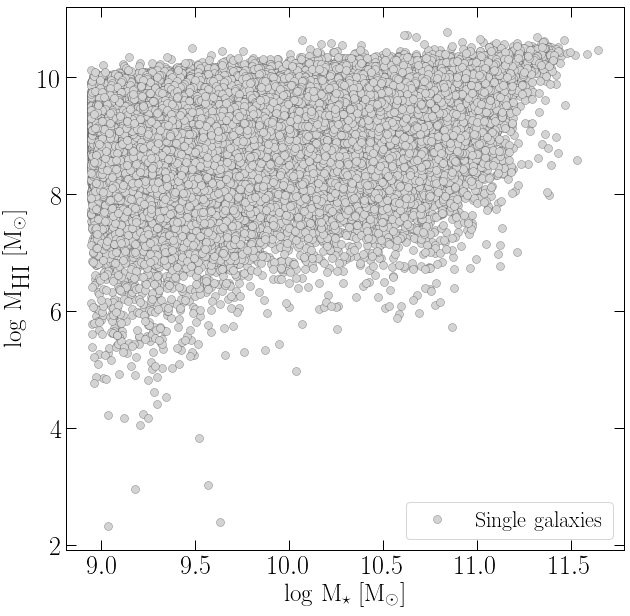

In [37]:

fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)


plt.plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', 
         color='lightgrey', markeredgecolor='k', markersize=8, markeredgewidth=0.2, label='Single galaxies')


ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
plt.legend(loc=4)
plt.show()

# All galaxies in groups that are N=given N
#### if **any galaxy in the group** has Mass less than `Mass_cutoff`, we don't plot the entire group

In [38]:
Mass_cutoff = 0.06424

In [36]:
print(G["StellarMass"][groups[15][1]] > Mass_cutoff)
print(G["StellarMass"][groups[15][1]])

[ True  True  True  True  True  True  True False  True  True  True  True
  True  True  True]
[0.12422184 0.34353274 0.46784288 0.30324367 0.7547251  0.2736666
 2.04137    0.         2.890416   4.0116997  0.5423179  6.1805654
 5.8364344  1.6910073  0.86185014]


### Separated centrals and satellites

In [39]:
#print(G["StellarMass"][groups[4][0]] < Mass_cutoff)
#print(G["StellarMass"][groups[4][0]])

#Group_size = 7 # select number of galaxies per group
@jit()
def central_satellite_distribution_for_N_length_groups(Group_size):
    
    fig = plt.figure(figsize=(10,10))                                                               
    ax = fig.add_subplot(1,1,1)
    plt.plot( np.log10( (Mstellar_central_galaxies_cut*10**10)) ,np.log10( (Mcoldgas_central_galaxies_cut*10**10)), 'o', color='lightgrey', markersize=5, label=r'Central galaxies [cut]')
    
    #initiate condition for plot
    for group in groups[Group_size]:
        if (G["StellarMass"][group] < Mass_cutoff).any(): #creates array of booleans; if theese are true hit continue
            continue
                
            # Do plotting.
        #plot all galaxies here; for loops below plots satellite and centrals separatelly
        #plt.plot(np.log10(G['StellarMass'][group]*1e10/h), np.log10(G['ColdGas'][group]*1e10/h), 'o', color='blue', markersize=12)
        
        for i in group: #find central galaxies and plot them as red
            if i in store_cen_indices: 
                #print(i)
                plt.plot(np.log10(G['StellarMass'][i]*1e10/h), np.log10(np.sum(G['DiscHI'],axis=1)[i]*1e10/h), 
                         'o', color='white', markeredgecolor='#1f78b4', markersize=8, markeredgewidth=2)
            else:
                if (G["StellarMass"][i] > Mass_cutoff).any(): # else find where galaxy is satellite; take into account mass cut
                    plt.plot(np.log10(G['StellarMass'][i]*1e10/h), np.log10(np.sum(G['DiscHI'],axis=1)[i]*1e10/h), 
                             'o', color='#1f78b4', markersize=8)
            
    ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
    plt.plot([], [], 'o', color='#1f78b4', markersize=8, label='Satellite')
    plt.plot([], [], 'o', color='white', markeredgecolor='#1f78b4', markersize=8, markeredgewidth=2, label='Central')
    
    plt.legend(loc=4)
    plt.show()

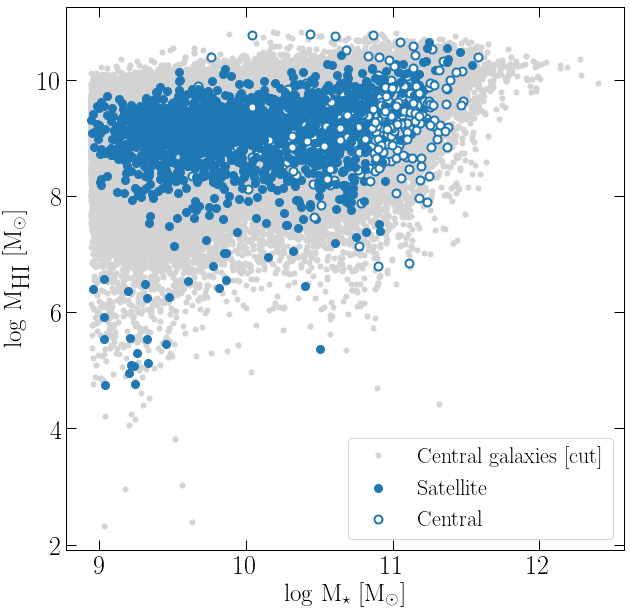

In [40]:
central_satellite_distribution_for_N_length_groups(7)

# All central and satellite galaxies in groups of length 2+ and single galaxies

In [ ]:
#initiate figure and how large it will be
fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

ax.scatter(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), marker='o', s=50, color='#fcc5c0', zorder=-3, alpha=0.4)

#put plot in row and columns:3by3 are 00, 01, 02, 10, 11, 12, 20, 21, 22 
row_count = 0
for size in trange(1, 9, 1): #I'm planning to have 1-9 sized groups

    Group_size = size+1 # select number of galaxies per group --- adding +1 because it is counting from 0.
    

    #plot centrals to be on each plot
  
        #initiate condition for plot
    for group in groups[Group_size]:
        if (G["StellarMass"][group] < Mass_cutoff).any(): #creates array of booleans; if theese are true hit continue
            continue
        
        for i in group: #find central galaxies and plot them as red
            if i in store_cen_indices:
            #print(i)
                ax.plot(np.log10(G['StellarMass'][i]*1e10/h), np.log10(np.sum(G['DiscHI'],axis=1)[i]*1e10/h), 
                     'o', color='white', markeredgecolor='#1f78b4', markersize=8, markeredgewidth=1)
            else:
                #if (G["StellarMass"][i] > Mass_cutoff).any(): # else find where galaxy is satellite; take into account mass cut
                ax.plot(np.log10(G['StellarMass'][i]*1e10/h), np.log10(np.sum(G['DiscHI'],axis=1)[i]*1e10/h), 
                             'o', color='#1f78b4', markersize=8)

    #add label for each sub-plot to know the group size and what is central/satellite
ax.plot([], [], 'o', color='#fcc5c0', label='Single galaxies')
ax.plot([], [], 'o', color='#1f78b4', markersize=8, label='Satellite')
ax.plot([], [], 'o', color='white', markeredgecolor='#1f78b4', markersize=8, markeredgewidth=2, label='Central')


ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

leg = ax.legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)

#add x and y axis labels only on the plot edges since there will be no space between panels

#tight layout and remove spacing between subplots
plt.tight_layout()
#plt.legend(loc=4)
plt.savefig('MHI_vs_Mstar_Groups.png')
plt.show()

  0%|          | 0/8 [00:00<?, ?it/s]

### Now mark central and satellites in the N times N plot
###### Takes 00:00:4 to run

In [ ]:
#initiate figure and how large it will be
fig, ax = plt.subplots(nrows=3, ncols=3, sharex='col', sharey='row', figsize=(18, 15))

#put plot in row and columns:3by3 are 00, 01, 02, 10, 11, 12, 20, 21, 22 
row_count = 0
for size in trange(1, 9, 1): #I'm planning to have 1-9 sized groups
        
    if size % 3 == 0:
        row_count += 1
    this_ax = ax[row_count, size%3]
    
    Group_size = size+1 # select number of galaxies per group --- adding +1 because it is counting from 0.
    

    #plot centrals to be on each plot
    this_ax.plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', color='lightgrey',markersize=8)
  
        #initiate condition for plot
    for group in groups[Group_size]:
        if (G["StellarMass"][group] < Mass_cutoff).any(): #creates array of booleans; if theese are true hit continue
            continue
        
        for i in group: #find central galaxies and plot them as red
            if i in store_cen_indices:
            #print(i)
                this_ax.plot(np.log10(G['StellarMass'][i]*1e10/h), np.log10(np.sum(G['DiscHI'],axis=1)[i]*1e10/h), 
                     'o', color='white', markeredgecolor='#1f78b4', markersize=8, markeredgewidth=2)
            else:
                #if (G["StellarMass"][i] > Mass_cutoff).any(): # else find where galaxy is satellite; take into account mass cut
                this_ax.plot(np.log10(G['StellarMass'][i]*1e10/h), np.log10(np.sum(G['DiscHI'],axis=1)[i]*1e10/h), 
                             'o', color='#1f78b4', markersize=8)

    #add label for each sub-plot to know the group size and what is central/satellite
    this_ax.plot([], [], 'o', color='white', label='Groups of %.f' %Group_size)
    this_ax.plot([], [], 'o', color='lightgrey', label='Single galaxies')
    this_ax.plot([], [], 'o', color='#1f78b4', markersize=8, label='Satellite')
    this_ax.plot([], [], 'o', color='white', markeredgecolor='#1f78b4', markersize=8, markeredgewidth=2, label='Central')

    leg = this_ax.legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)

#add x and y axis labels only on the plot edges since there will be no space between panels
for row in range(3):
    this_ax = ax[row,0]
    this_ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
for col in range(3):
    this_ax = ax[2,col]
    this_ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
#tight layout and remove spacing between subplots
plt.tight_layout()
#plt.legend(loc=4)
plt.subplots_adjust(wspace = 0.0, hspace = 0.0)
plt.savefig('MHI_vs_Mstar_Groups.png')
plt.show()

## Make upper plot muchfaster

# Create cen & sat from groups dictionary

In [39]:
@jit
def create_cen_sat_from_groups_dict(groups, store_cen_indices, my_mass_cutoff=Mass_cutoff):
    """
    Created dictionary which is used to extract indices of central and satellite galaxies, taking into account
    the mass cutoff provided. Also creates "Groups" which store information on a group basis and their sat/cen galaxies.
    
    Parameters
    ==========
    
    groups: dictionary. Keyed by the size of the group, ``groups[group_size]``
            Contains list of arrays of a given group_size length. 
    
    Mass_cutoff: Constant.
                 Equal to 0.06424: defined as median stellar mass for halos composed of 100 particles.
    
    store_cen_indices: List of integers
                       Contains indices which correspond to central galaxies
        
    Returns
    =======
    new_groups_dict: Nested dictionary. Keyed by the `groups`.
                     Contains Centrals and Satellites which are in groups where galaxies are above the my_mass_cutoff
                     
    Usage
    =====
    #This is updated dictionary which one can parse to the plotting function:
    updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices) 
    
    ---------
    #Select groups of 3 and only central galaxies:
    central_inds = updated_dict[3]["Centrals"]
    G["StellarMass"][central_inds] #gives array of central galaxy stellar masses 
    
    """
    new_groups_dict = {}
    
    for group_size in groups.keys(): #go through the keys in groups dictionary
        central_gals = []
        sat_gals = []
        halo_gals = []
        halo_groups = []
        
        new_groups_dict[group_size] = {} #new dictionary based on group size
        new_groups_dict[group_size]["Groups"] = {} #new dictionary for storring whole groups
        counter = 0
        for group in groups[group_size]:
            
            central_gals_group = [] #store central in "Groups"
            sat_gals_group = [] #store satellites in "Groups"
            
            if (G["StellarMass"][group] < my_mass_cutoff).any(): #creates array of booleans; if theese are true hit continue
                continue
            
            halo_groups.append(group)
            
            # Use np.where to find indices of satellites and central galaxies
            for galaxy in group:
                halo_gals.append(galaxy) #add to halo_gals to know galaxies in the halo
                local_idx = np.where(galaxy == store_cen_indices)[0] # Check if the idx is in the store_cen_indices
                
                if len(local_idx) == 0: # If the idx is not present in store_cen_indisces then it is satellite
                    sat_gals.append(galaxy)
                    sat_gals_group.append(galaxy)
                elif len(local_idx) == 1: # If the idx is present then it is central galaxy
                    central_gals.append(galaxy)
                    central_gals_group.append(galaxy)
                else: # Check for funky stuff and raise an error
                    print("Somehow got a duplicate value in store_cen_indices.  Galaxy is {0}, group is {1} and local_idx value is {2}"
                          .format(galaxy, group, local_idx))
                    raise ValueError
            group_key = "Group_{0}".format(counter) #create group_key based on the groups
            new_groups_dict[group_size]["Groups"][group_key] = {} #new dictionary with all groups
            new_groups_dict[group_size]["Groups"][group_key]["Centrals"] = central_gals_group
            new_groups_dict[group_size]["Groups"][group_key]["Satellites"] = sat_gals_group
            counter += 1
            
                              
        # Append to dictionary found centrals and satellites
        new_groups_dict[group_size]["Centrals"] = central_gals
        new_groups_dict[group_size]["Satellites"] = sat_gals
        new_groups_dict[group_size]["All_galaxies"] = halo_gals
        new_groups_dict[group_size]['All_groups'] = halo_groups
        
        
    return new_groups_dict
                    

In [40]:
#This is updated dictionary which one can parse to the plotting function:
updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices) 

### Example of the usage of updated_dict -- taking "Groups"

In [43]:
#Use dictionary and for each galaxy in "Groups" of 3 show central/satellite index
Grp_length = 69
for group_key in updated_dict[Grp_length]["Groups"].keys():
    central_idx = updated_dict[Grp_length]["Groups"][group_key]["Centrals"] #give indices
    central_mass = np.sum(G['DiscHI'],axis=1)[central_idx] #give masses of these galaxies
    
    satellite_inds = updated_dict[Grp_length]["Groups"][group_key]["Satellites"]
    sat_mass = np.sum(G['DiscHI'],axis=1)[satellite_inds]
    
    if (sat_mass > central_mass).any(): #check conditions
        print("Sat more massive than central")
    #print(sat_mass > central_mass)
    
    print("Central mass is {0} and sat masses are {1}".format(central_mass, sat_mass))
    #print(updated_dict[3]["Groups"][group_key]["Centrals"])

    
updated_dict[3]["Groups"]["Group_10"] #shows indices for 10th Group in Groups of length 3

Sat more massive than central
Central mass is [0.44634] and sat masses are [1.27124730e-02 4.64517725e-05 7.64876790e-03 0.00000000e+00
 1.92314410e-03 5.87982610e-02 7.21310675e-02 0.00000000e+00
 2.51991907e-03 5.25948182e-02 2.90131941e-02 3.22326422e-02
 1.85608659e-02 1.41033083e-02 9.01041403e-02 2.47194694e-04
 9.69037488e-02 1.85677726e-02 2.49204949e-01 0.00000000e+00
 0.00000000e+00 1.63874347e-02 0.00000000e+00 0.00000000e+00
 2.34125415e-03 4.90923077e-02 1.10844532e-02 1.31620206e-02
 2.44391914e-02 0.00000000e+00 2.18232032e-02 8.43791068e-02
 0.00000000e+00 8.62625800e-03 0.00000000e+00 0.00000000e+00
 5.43902218e-02 1.24936961e-01 2.77834326e-01 1.47743206e-02
 3.02744269e-01 1.16911598e-01 1.94937363e-02 0.00000000e+00
 2.03298852e-02 4.18392643e-02 7.56448984e-01 1.90398078e-02
 3.55212450e+00 1.00156657e-01 1.67752981e-01 3.87293920e-02
 2.72474270e-02 1.59586668e-01 7.61460396e-05 3.40383127e-02
 2.35514924e-01 1.23479240e-01 2.15707064e-01 1.02420442e-01
 1.3655333

{'Centrals': [25061], 'Satellites': [25062, 25063]}

### Check group sizes

100%|██████████| 100/100 [00:00<00:00, 344926.32it/s]


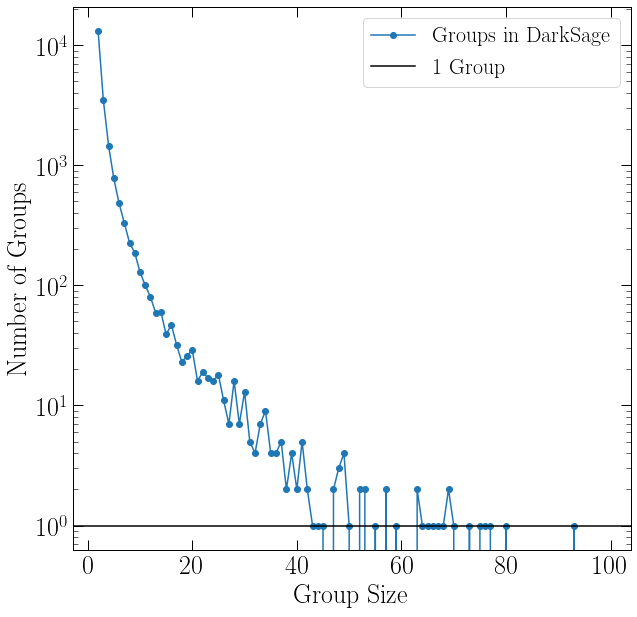

In [41]:
#How many groups are present and what is their length?
Group_statistics = []
Group_len = np.arange(100)
for i in trange(0,100):
    try:
        #print(i, len(updated_dict[i]["Groups"].keys()))
        Group_statistics.append(len(updated_dict[i]["Groups"].keys()))
    except KeyError:
        Group_statistics.append(0)
        continue
       #print(i, 'No such group length')

df_groups = pd.DataFrame({'GroupLength'            : Group_len,
                           'NumberNlengthGroups'    : Group_statistics })

#print(df_groups[1:])
fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)
plt.plot(df_groups['GroupLength'][2:], df_groups['NumberNlengthGroups'][2:], marker='o', label='Groups in DarkSage');
ax.set_yscale('log')
plt.axhline(1, 0, label='1 Group', color='k')
plt.xlabel('Group Size')
plt.ylabel('Number of Groups')
plt.legend(loc=1)
plt.show();

In [42]:
# Initiate figure and how large it will be
@jit(cache=True)
def mhi_vs_ms_3x3(groups_dict):
    
    """
    Make 3x3 plot (HI mass vs Stellar mass) with galaxy groups based on the number of galaxies in a group and separate in each group central
    and satellite galaxy.
    
    Parameters
    ==========
    groups_dict: Dictionary. Keyed by the group size. Use: ``groups_dict[group_size]["Centrals"]``
                 Extracts groups with size N and the satellite & central galaxies
                 Created dictionary from (def create_cen_sat_from_groups_dict)
  
    Returns
    =======
    3x3 Figure with M_HI versus M_*
    
    Usage
    =====
    To use type: ``mhi_vs_ms_3x3(updated_dict) ``
                 Where updated_dict is the dictionary that is parsed to plotting function
                 ``updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices)``
    
    """
    
    
    fig, ax = plt.subplots(nrows=7, ncols=6, sharex='col', sharey='row', figsize=(21, 18))
    
    #ax[0][0].plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', color='lightgrey',markersize=8, label='Single galaxies')
    
    # Put plot in row and columns:3by3 are 00, 01, 02, 10, 11, 12, 20, 21, 22 
    row_count = 0
    for size in trange(1, 40, 1): #I'm planning to have 1-9 sized groups. Made to form trange(1, 9, 1) as 3x3 pannels 
            
        if size % 6 == 0:
            row_count += 1
        this_ax = ax[row_count, size%6] #Axis. Created for plotting 3x3 plots
        
        group_size = size+1 # Select number of galaxies per group --- adding +1 because it is counting from 0.
    
        central_gals = groups_dict[group_size]["Centrals"]  #List of integers. Contains indices of central galaxies.  List is obtained through the dictionary. 
        sat_gals = groups_dict[group_size]["Satellites"] #List of integers. Contains indices of satellite galaxies. List is obtained through the dictionary.
    
        # Plot single galaxies           
        #this_ax.plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', color='lightgrey',markersize=8)
        
            
        # Do plotting of groups of N-length; it will be placed on each subplot + +.
        # Centrals
        this_ax.plot(np.log10(G['StellarMass'][central_gals]*1e10/h), 
                         np.log10(np.sum(G['DiscHI'],axis=1)[central_gals]*1e10/h), 
                         'o', color='white', markeredgecolor='#1f78b4', markersize=6, markeredgewidth=2)
        # Satellites
        this_ax.plot(np.log10(G['StellarMass'][sat_gals]*1e10/h), 
                         np.log10(np.sum(G['DiscHI'],axis=1)[sat_gals]*1e10/h), 
                         'o', color='#1f78b4', markersize=6)
    
        # Add label for each sub-plot to know the group size and what is central/satellite
        this_ax.plot([], [], 'o', color='white', label='Groups of %.f' %group_size)
        #Add legend    
        leg = this_ax.legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)
        
    # Add x and y axis labels only on the plot edges since there will be no space between panels
    for row in range(7):
        this_ax = ax[row,0]
        this_ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=18)
    for col in range(6):
        this_ax = ax[6,col]
        this_ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=18)
        this_ax.xaxis.set_ticks(np.arange(9,11.9, 1))
    # Tight layout and remove spacing between subplots
    plt.tight_layout()
    # My first plot is only single galaxies so I add legend separately
    
    ax[0][0].plot([], [], 'o', color='lightgrey', label='Single galaxies')
    ax[0][0].plot([], [], 'o', color='#1f78b4', markersize=8, label='Satellite')
    ax[0][0].plot([], [], 'o', color='white', markeredgecolor='#1f78b4', markersize=8, markeredgewidth=2, label='Central')
    ax[0][0].legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)


    plt.legend()
    plt.subplots_adjust(wspace = 0.0, hspace = 0.0)
    plt.show()
    #return fig


100%|██████████| 39/39 [00:01<00:00, 19.86it/s]
No handles with labels found to put in legend.


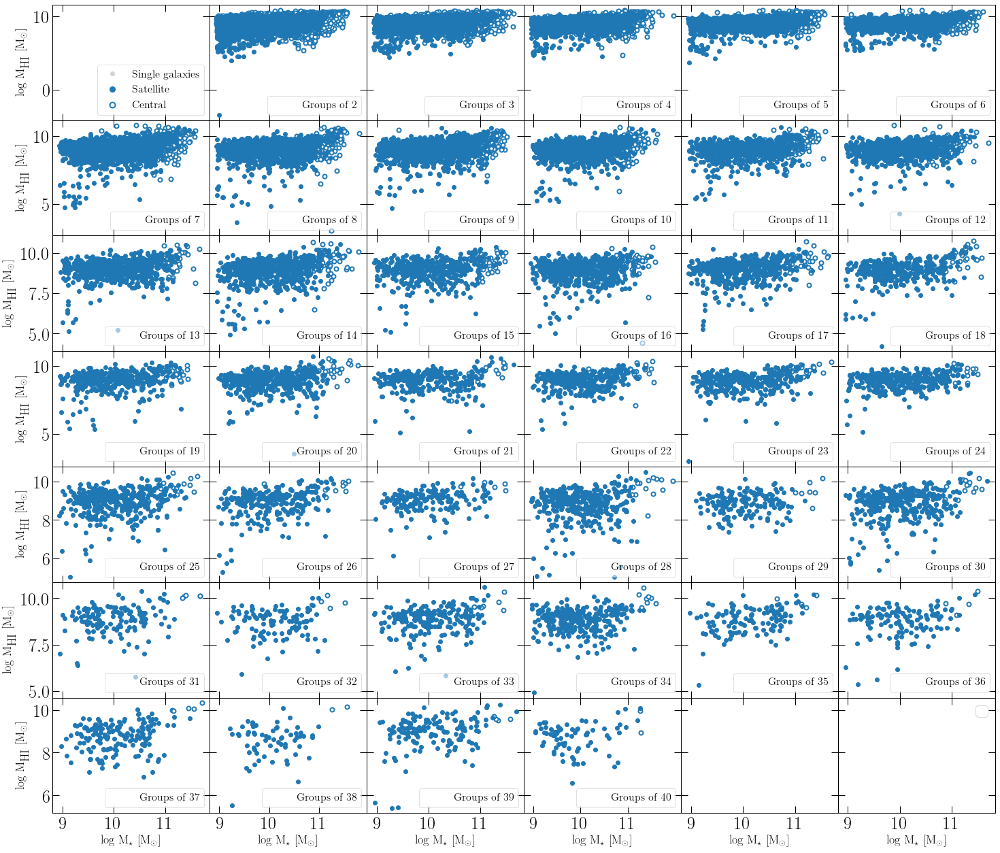

In [43]:
#Use line_profiler to test how fast is each line of the code

#put this line in front of funtion which you are calling:
#%lprun -f mhi_vs_ms_3x3 
mhi_vs_ms_3x3(updated_dict)

# Make a two sided histogram

In [44]:
@jit
def two_sided_histogram_group_and_single(x_cen, y_cen, x_sat, y_sat, x_single, y_single):
    """
    Make a scatter plot with 3 datasets and then place histogram on both x and y axis for them. 
    Here I use logMhi vesus logMstar -- other data will need readjustment of the min/max.
    
    Parameters
    ==========
    x_cen, y_cen: x and y values of the first dataset. Floats. Can be list/array. 
                  In this case, I am using logMHI and logMstar of central galaxies.
    
    x_sat, y_sat: x and y values of the second dataset. Floats. Can be list/array. 
                  In this case, I am using logMHI and logMstar of satellite galaxies.
                  
    x_single, y_single: x and y values of the third dataset. Floats. Can be list/array. 
                        In this case, I am using logMHI and logMstar of single (central) galaxies.
                        
        
    Returns
    =======
    A scatter plot with histogram on x and y axis. 
    
    Usage
    =====
    To use type: ``two_sided_histogram_group_and_single(x_cen, y_cen, x_sat, y_sat, x_single, y_single)``
               I extracted single, satellite and central gal from dictionary using ``updated_dict`` and 
               group_size=1 for single galaxies; group_size=2 for pairs -- can be any group_size number
               
                single = updated_dict[1]['Centrals']
                central_2 = updated_dict[2]["Centrals"]
                satellite_2 = updated_dict[2]["Satellites"]
                
                x_cen = np.log10(G["StellarMass"][central_2]*1e10/h ) #gives array of central galaxy stellar masses 
                y_cen = np.log10(G["ColdGas"][central_2]*1e10/h+1) 
                
                etc. just update central_2 with other keys to specific indices.
                
    """

    nullfmt = NullFormatter()         # no labels
    
    # definitions for the axes
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    bottom_h = left_h = left + width + 0.02
    
    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.2]
    rect_histy = [left_h, bottom, 0.2, height]
    
    # start with a rectangular Figure
    plt.figure( figsize=(8, 8))
    
    axScatter = plt.axes(rect_scatter)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)
    
    # no labels
    axHistx.xaxis.set_major_formatter(nullfmt)
    axHisty.yaxis.set_major_formatter(nullfmt)
    
    # the scatter plot:
    axScatter.scatter(x_single, y_single, color='#fcc5c0', label='Single galaxies', alpha=0.2)
    axScatter.scatter(x_cen, y_cen, color='white', edgecolor='#1f78b4', linewidth=1, label='Centrals')
    axScatter.scatter(x_sat, y_sat, color='#1f78b4', label='Satellites', alpha=0.8)
    
    axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    axScatter.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

    # now determine nice limits by hand:
    binwidth = 0.1
    xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(x))])
    lim = (int(xymax/binwidth) + 1) * binwidth
    
    axScatter.set_xlim((8.5, 11.7))
    axScatter.set_ylim((0, 11.7))
    
    bins = np.arange(5.8, lim + binwidth, binwidth)
    #density=True -- the result is the value of the probability density function at the bin,
    #                normalized such that the integral over the range is 1 (buggy with uneqyal bin widths)
    axHistx.hist(x_sat, bins=bins, density=True, color='#1f78b4', alpha=0.6, edgecolor='k', linewidth=1)
    axHisty.hist(y_sat, bins=bins, density=True, orientation='horizontal', alpha=0.6, color='#1f78b4', edgecolor='k', linewidth=1.2)
    
    axHistx.hist(x_cen, bins=bins, density=True, color='white',alpha=0.4, edgecolor='#1f78b4', linewidth=1)
    axHisty.hist(y_cen, bins=bins, density=True, orientation='horizontal', color='white', alpha=0.4, edgecolor='#1f78b4', linewidth=2)
    
    axHistx.hist(x_single, bins=bins, density=True, color='#fcc5c0',alpha=0.4, edgecolor='black', linewidth=1)
    axHisty.hist(y_single, bins=bins, density=True, orientation='horizontal', color='#fcc5c0', alpha=0.4, edgecolor='black', linewidth=1)
 

    axHistx.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=22)
    axHisty.set_xlabel(r'N$_{\textrm{gal}}$', fontsize=22)
    
    axHistx.set_xlim(axScatter.get_xlim())
    axHisty.set_ylim(axScatter.get_ylim())

    axScatter.legend(loc=3)


    return plt.show()
    

In [45]:
@jit
def two_sided_histogram_groups(x_cen, y_cen, x_sat, y_sat, color='#1f78b4'):
    """

    Make a scatter plot with 2 datasets and then place histogram on both x and y axis for them. 
    Here I use logMhi vesus logMstar -- other data will need readjustment of the min/max.
    
    Parameters
    ==========
    x_cen, y_cen: x and y values of the first dataset. Floats. Can be list/array. 
                  In this case, I am using logMHI and logMstar of central galaxies.
    
    x_sat, y_sat: x and y values of the second dataset. Floats. Can be list/array. 
                  In this case, I am using logMHI and logMstar of satellite galaxies.                        
        
    color : Boolean. Chose color in case you want differen one. If not specified, will be the default one for satellites.
            Use different color in case there is only one dataset, for exaple:
            two_sided_histogram_groups(x, y, [], [], 'grey')
    
    
    Returns
    =======
    A scatter plot with histogram on x and y axis for both datasets. 
    
    Usage
    =====
    To use type: ``two_sided_histogram_groups(x_cen, y_cen, x_sat, y_sat)``
               I extracted satellite and central gal from dictionary using ``updated_dict`` and 
               group_size=2 for pairs -- can be any group_size number
               
                central_2 = updated_dict[2]["Centrals"]
                satellite_2 = updated_dict[2]["Satellites"]
                
                x_cen = np.log10(G["StellarMass"][central_2]*1e10/h ) #gives array of central galaxy stellar masses 
                y_cen = np.log10(G["ColdGas"][central_2]*1e10/h+1) 
                
                etc. just update central_2 with other keys to specific indices.
                
    """

    
    nullfmt = NullFormatter()         # no labels
    
    # definitions for the axes
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    bottom_h = left_h = left + width + 0.02
    
    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.2]
    rect_histy = [left_h, bottom, 0.2, height]
    
    # start with a rectangular Figure
    plt.figure(1, figsize=(8, 8))
    
    axScatter = plt.axes(rect_scatter)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)
    
    # no labels
    axHistx.xaxis.set_major_formatter(nullfmt)
    axHisty.yaxis.set_major_formatter(nullfmt)
    
    # the scatter plot:
    axScatter.scatter(x_cen, y_cen, color='white', edgecolor='#1f78b4', linewidth=1, label='Centrals')
    axScatter.scatter(x_sat, y_sat, color=color, label='Satellites', alpha=0.8)
    
    
    axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    axScatter.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

    # now determine nice limits by hand:
    binwidth = 0.1
    xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(x))])
    lim = (int(xymax/binwidth) + 1) * binwidth
    
    axScatter.set_xlim((8.5, 11.7))
    axScatter.set_ylim((0, 11.7))
    
    bins = np.arange(5.8, lim + binwidth, binwidth)
    axHistx.hist(x_sat, bins=bins, color=color, alpha=0.6, edgecolor='k', linewidth=1)
    axHisty.hist(y_sat, bins=bins, orientation='horizontal', alpha=0.6, color=color, edgecolor='k', linewidth=1.2)
    
    axHistx.hist(x_cen, bins=bins, color='white',alpha=0.4, edgecolor='#1f78b4', linewidth=1)
    axHisty.hist(y_cen, bins=bins, orientation='horizontal', color='white', alpha=0.4, edgecolor='#1f78b4', linewidth=2) 

    axHistx.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=22)
    axHisty.set_xlabel(r'N$_{\textrm{gal}}$', fontsize=22)
    
    axHistx.set_xlim(axScatter.get_xlim())
    axHisty.set_ylim(axScatter.get_ylim())

    axScatter.legend(loc=3)


    return plt.show()



In [48]:
single = updated_dict[1]['Centrals']
central_2 = updated_dict[2]["Centrals"]
satellite_2 = updated_dict[2]["Satellites"]

x_cen = np.log10(G["StellarMass"][central_2]*1e10/h ) #gives array of central galaxy stellar masses 
y_cen = np.log10(np.sum(G['DiscHI'],axis=1)[central_2]*1e10/h+1) #BECAUSE log0 goes to -inf so I add 1! has to be checked/removed!
x_sat = np.log10(G["StellarMass"][satellite_2]*1e10/h) #gives array of satellite galaxy stellar masses 
y_sat = np.log10(np.sum(G['DiscHI'],axis=1)[satellite_2]*1e10/h+1)

x_single = np.log10(G["StellarMass"][single]*1e10/h) #gives array of satellite galaxy stellar masses 
y_single = np.log10(np.sum(G['DiscHI'],axis=1)[single]*1e10/h+1)


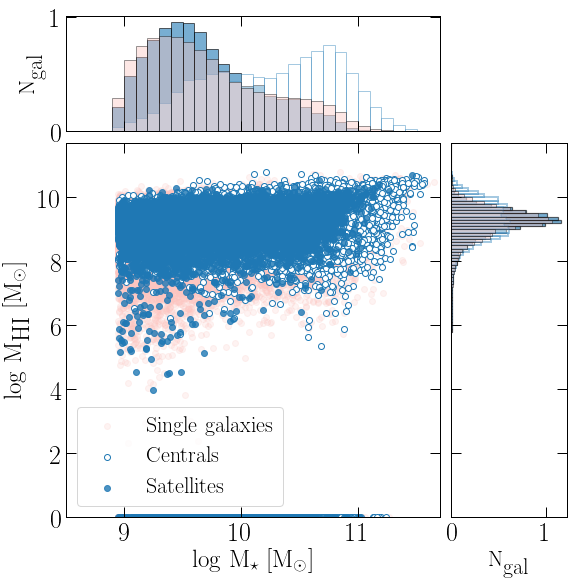

In [49]:
two_sided_histogram_group_and_single(x_cen, y_cen, x_sat, y_sat, x_single, y_single)

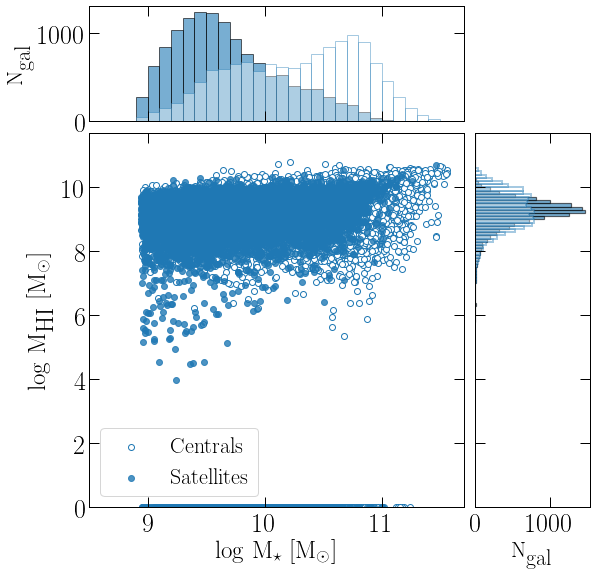

In [50]:
two_sided_histogram_groups(x_cen, y_cen, x_sat, y_sat)

In [49]:
@jit
def hist_Mhi_vs_Mstar_with_singles(groups_dict):
    
    """
    N times the scatter plot with thee datasets and their histograms on x and y axis. One dataset is always single galaxies
    the other two datasets are groups of lenght N++
    Here I use logMhi vesus logMstar -- other data will need readjustment of the min/max.
    
    
    Parameters
    ==========
    groups_dict: Dictionary. Keyed by the group size. Use: ``groups_dict[group_size]["Centrals"]``
                 Extracts groups with size N and the satellite & central galaxies
                 Created dictionary from (def create_cen_sat_from_groups_dict)
  
    Returns
    =======
    N times the scatter plot with two datasets and their histograms on x and y axis.
    
    
    Usage
    =====
    To use type: ``hist_Mhi_vs_Mstar_with_singles(updated_dict) ``
                 Where updated_dict is the dictionary that is parsed to plotting function
                 ``updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices)``
    
    """
        
    row_count = 0
    for size in trange(1, 9, 1): #I'm planning to have 1-9 sized groups
            
        #if size % 3 == 0:
        #    row_count += 1
        #this_ax = ax[row_count, size%3]
        
        group_size = size+1 # Select number of galaxies per group --- adding +1 because it is counting from 0.
    
        central_gals = groups_dict[group_size]["Centrals"]
        sat_gals = groups_dict[group_size]["Satellites"]
        single_gals = groups_dict[1]['Centrals']
     
        # Do plotting of groups of N-length; it will be placed on each figure
        # Centrals and Satellites; x & y axis histogram
        # Using function two_sided_histogram to plot the histogram output so here I call the function and give (x, y), (x, y)
        two_sided_histogram_group_and_single(np.log10(G['StellarMass'][central_gals]*1e10/h),
                            np.log10(np.sum(G['DiscHI'],axis=1)[central_gals]*1e10/h+1), 
                            np.log10(G['StellarMass'][sat_gals]*1e10/h),
                            np.log10(np.sum(G['DiscHI'],axis=1)[sat_gals]*1e10/h+1),
                            np.log10(G['StellarMass'][single_gals]*1e10/h),
                            np.log10(np.sum(G['DiscHI'],axis=1)[single_gals]*1e10/h+1) ) 


  0%|          | 0/8 [00:00<?, ?it/s]

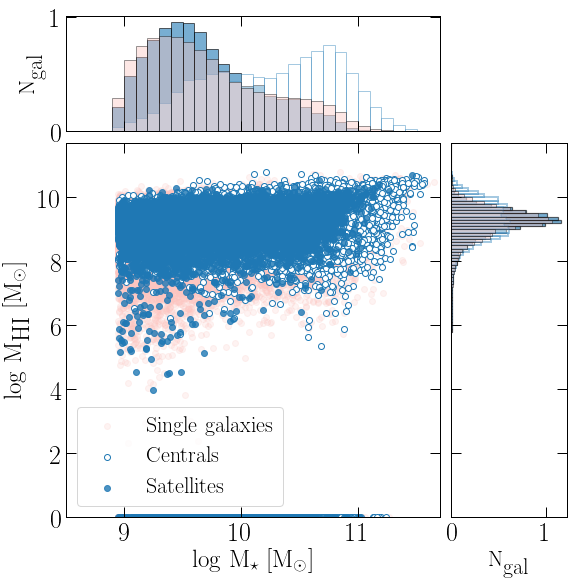

 12%|█▎        | 1/8 [00:03<00:25,  3.60s/it]

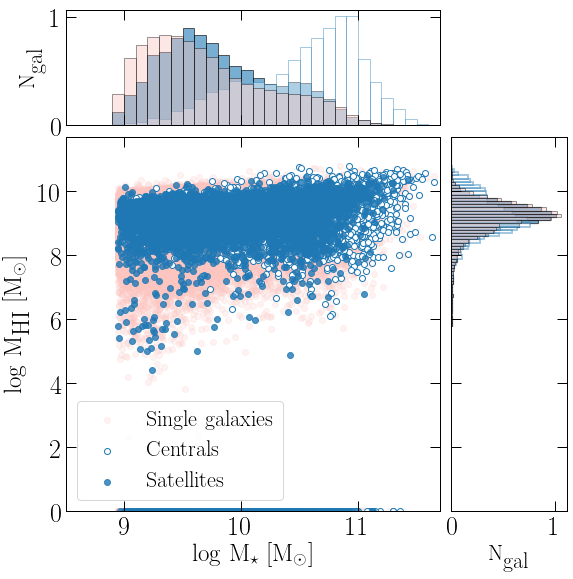

 25%|██▌       | 2/8 [00:06<00:20,  3.39s/it]

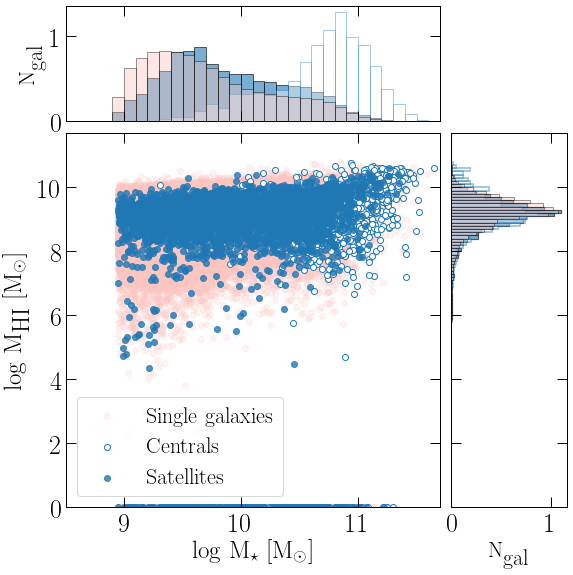

 38%|███▊      | 3/8 [00:09<00:16,  3.29s/it]

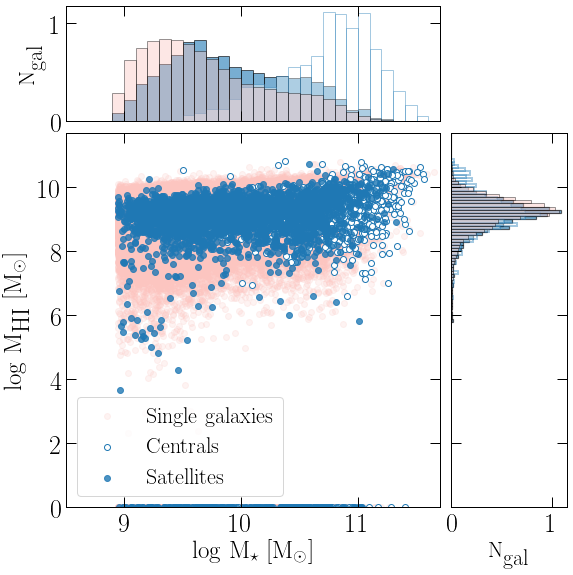

 50%|█████     | 4/8 [00:12<00:12,  3.24s/it]

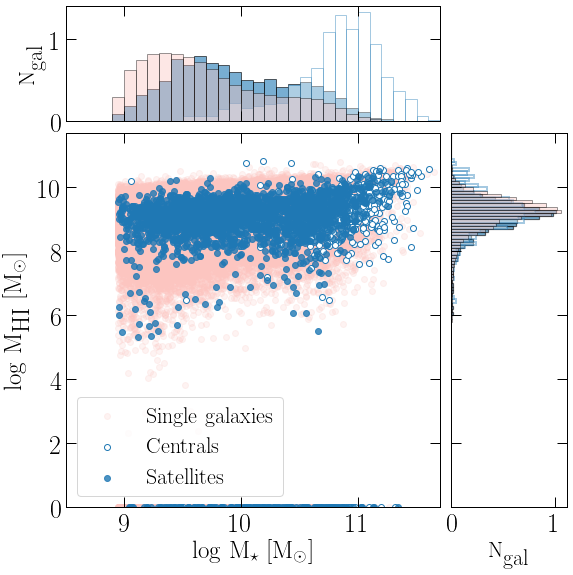

 62%|██████▎   | 5/8 [00:16<00:09,  3.21s/it]

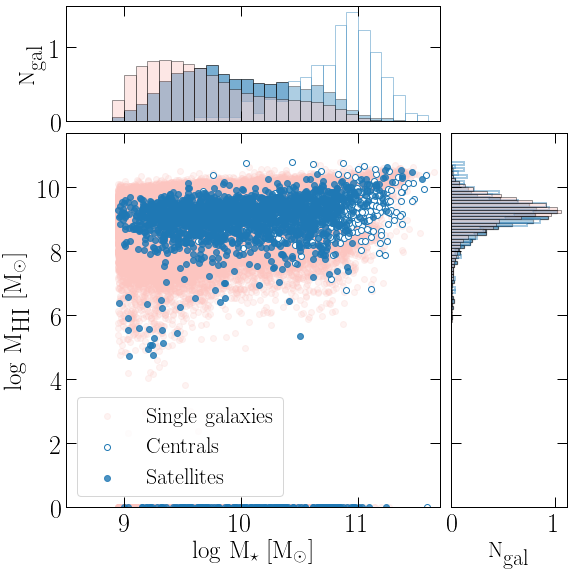

 75%|███████▌  | 6/8 [00:19<00:06,  3.18s/it]

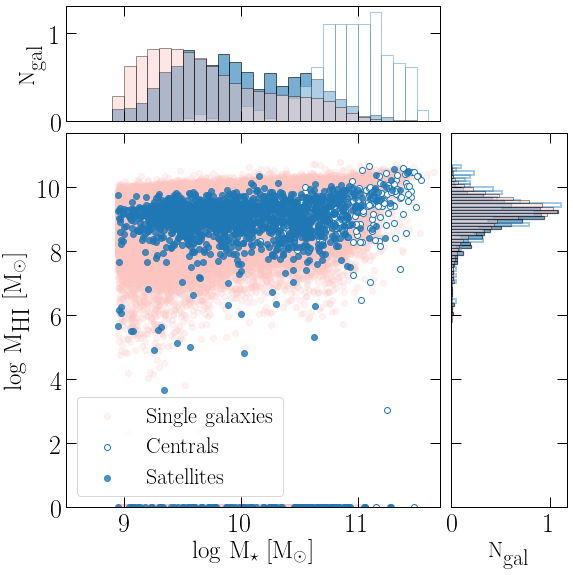

 88%|████████▊ | 7/8 [00:22<00:03,  3.17s/it]

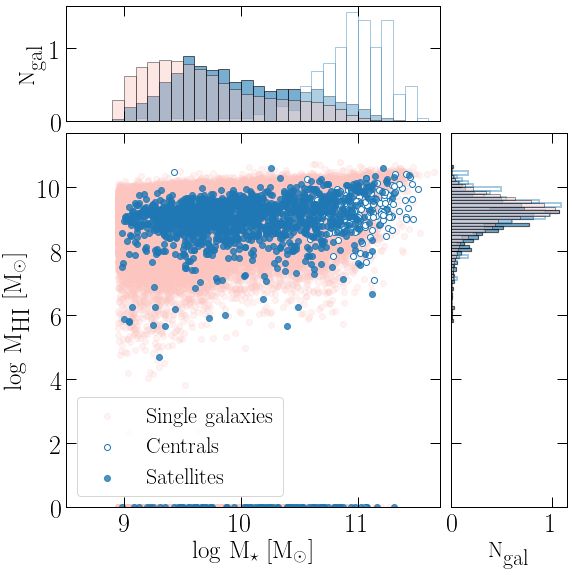

100%|██████████| 8/8 [00:25<00:00,  3.19s/it]


In [52]:
hist_Mhi_vs_Mstar_with_singles(updated_dict)

In [50]:
@jit
def hist_Mhi_vs_Mstar(groups_dict):
    
    """
    N times the scatter plot with two datasets and their histograms on x and y axis.
    Two datasets are groups of lenght N++
    Here I use logMhi vesus logMstar -- other data will need readjustment of the min/max.
    
    
    Parameters
    ==========
    groups_dict: Dictionary. Keyed by the group size. Use: ``groups_dict[group_size]["Centrals"]``
                 Extracts groups with size N and the satellite & central galaxies
                 Created dictionary from (def create_cen_sat_from_groups_dict)
  
    Returns
    =======
    N times the scatter plot with two datasets and their histograms on x and y axis.
    
    
    Usage
    =====
    To use type: ``hist_Mhi_vs_Mstar(updated_dict) ``
                 Where updated_dict is the dictionary that is parsed to plotting function
                 ``updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices)``
    
    """
       

                
                
    row_count = 0
    for size in trange(1, 9, 1): #I'm planning to have 1-9 sized groups
            
        #if size % 3 == 0:
        #    row_count += 1
        #this_ax = ax[row_count, size%3]
        
        group_size = size+1 # Select number of galaxies per group --- adding +1 because it is counting from 0.
    
        central_gals = groups_dict[group_size]["Centrals"]
        sat_gals = groups_dict[group_size]["Satellites"]
        single_gals = groups_dict[1]['Centrals']
     
        # Do plotting of groups of N-length; it will be placed on each figure
        # Centrals and Satellites; x & y axis histogram
        # Using function two_sided_histogram to plot the histogram output so here I call the function and give (x, y), (x, y)
        two_sided_histogram_groups(np.log10(G['StellarMass'][central_gals]*1e10/h),
                            np.log10(np.sum(G['DiscHI'],axis=1)[central_gals]*1e10/h+1), 
                            np.log10(G['StellarMass'][sat_gals]*1e10/h),
                            np.log10(np.sum(G['DiscHI'],axis=1)[sat_gals]*1e10/h+1)) 
        

  0%|          | 0/8 [00:00<?, ?it/s]

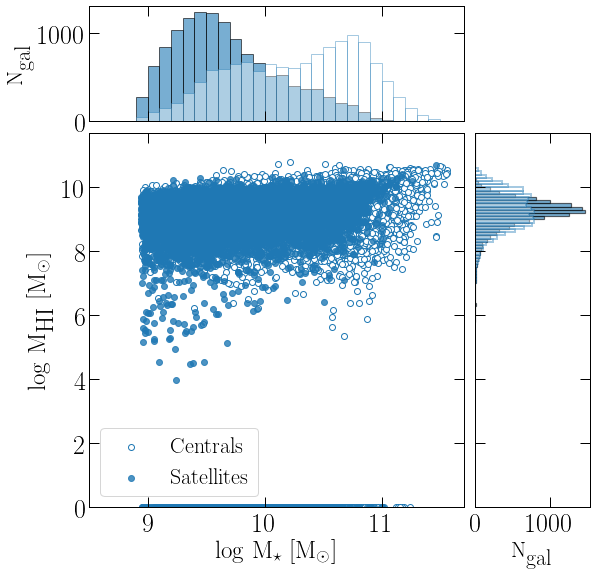

 12%|█▎        | 1/8 [00:01<00:10,  1.54s/it]

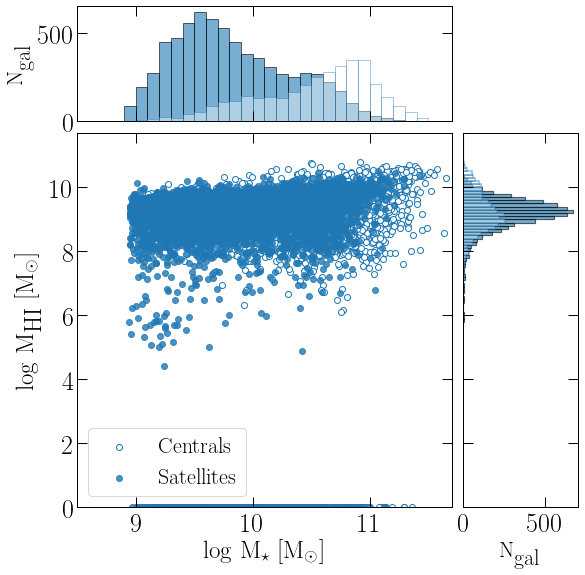

 25%|██▌       | 2/8 [00:02<00:08,  1.45s/it]

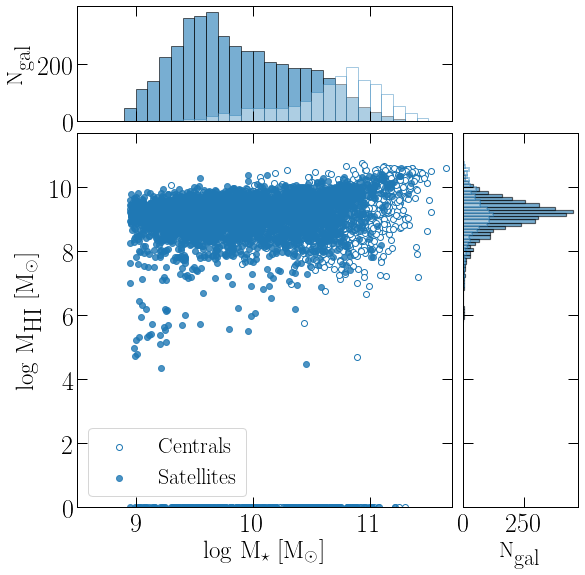

 38%|███▊      | 3/8 [00:04<00:07,  1.41s/it]

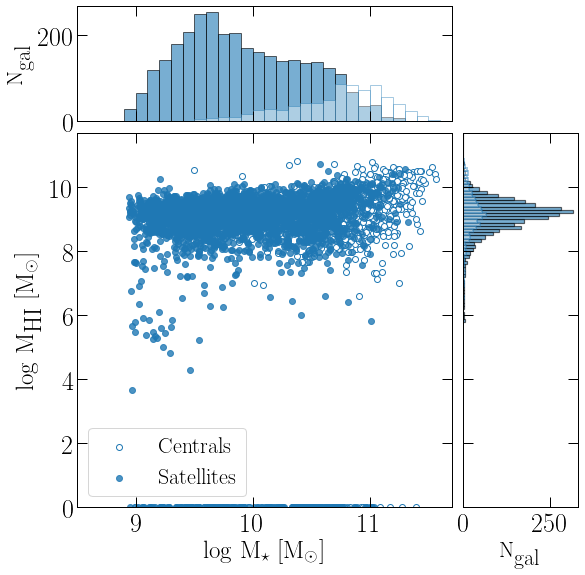

 50%|█████     | 4/8 [00:05<00:05,  1.38s/it]

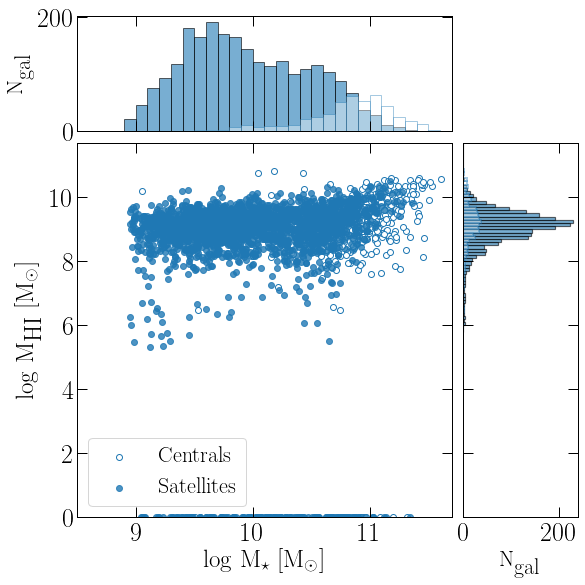

 62%|██████▎   | 5/8 [00:06<00:04,  1.36s/it]

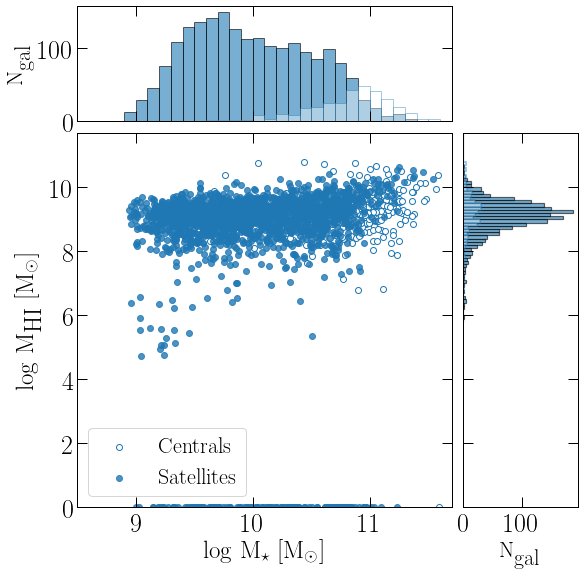

 75%|███████▌  | 6/8 [00:08<00:02,  1.35s/it]

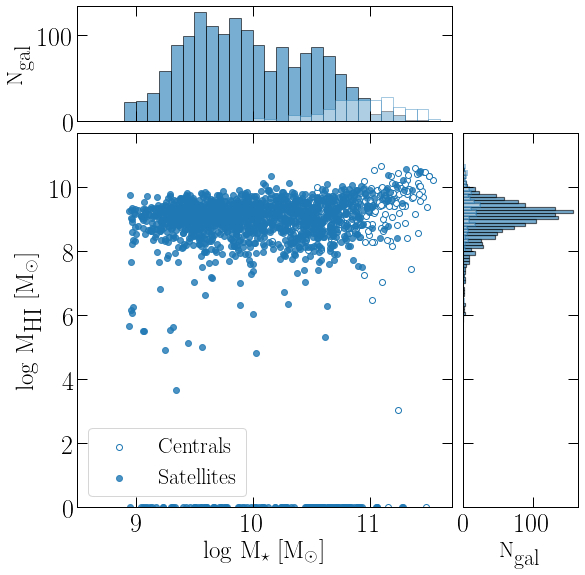

 88%|████████▊ | 7/8 [00:09<00:01,  1.37s/it]

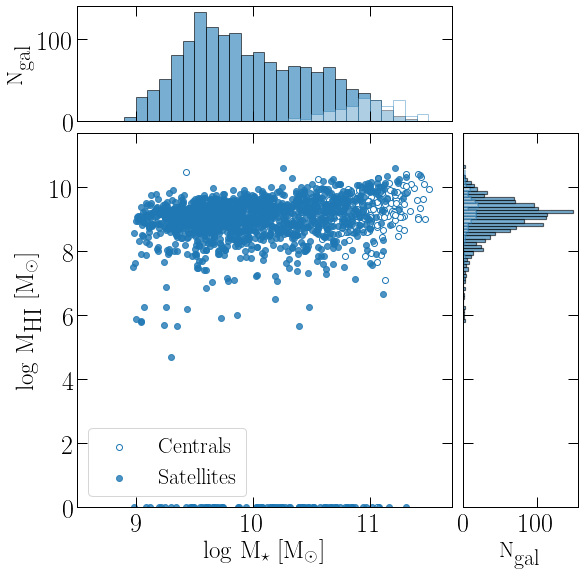

100%|██████████| 8/8 [00:10<00:00,  1.36s/it]


In [54]:
hist_Mhi_vs_Mstar(updated_dict)

# Properties of the group as the whole entity

In [44]:
def two_sided_histogram(x_data, y_data, color='lightgrey', legend=legend, s=90):
    """
    Make a scatter plot with 1 dataset and then place histogram on both x and y axis for them. .
    Here I use logMhi vesus logMstar as the sum values for groups of N length.
    
    Parameters
    ==========
    x_data, y_data: x and y values of the first dataset. Floats. Can be list/array. 
                  In this case, I am using logMHI and logMstar of the sum a group.
    
    color='lightgrey': Default color.
                      This will change when I call a function that has defined its own colors.
    
    legend=legend: Default legend.
                   This will change when I call a function that has defined its own legends.
    
    s=90: Markersize. Default 90.
                This will change when I call a function with its defined markersizes.
   
    Returns
    =======
    A scatter plot with histogram on x and y axis for both datasets. 
    
    Usage
    =====
    To use type: ``two_sided_histogram(x_data, y_data)``
               I extracted satellite and central gal from dictionary using ``updated_dict`` and 
               group_size=2 for pairs -- can be any group_size number
               
                central_2 = updated_dict[2]["Centrals"]
                satellite_2 = updated_dict[2]["Satellites"]
                
                and then sum the x and y properties:
                
                x_sum = np.log10(G["StellarMass"][central_2]*1e10/h +(G["StellarMass"][satellite_2]*1e10/h) ) #gives array of the sum of the stellar masses 
                y_sum = np.log10(G["ColdGas"][central_2]*1e10/h + (G["ColdGas"][satellite_2]*1e10/h+1)) #gives array of the sum of the gas masses
    
                etc. just update central_2 with other keys to specific indices.
                
    """

    
    nullfmt = NullFormatter()         # no labels
    
    # definitions for the axes
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    bottom_h = left_h = left + width + 0.02
    
    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.2]
    rect_histy = [left_h, bottom, 0.2, height]
    
    # start with a rectangular Figure
    plt.figure(1, figsize=(12, 12))
    
    axScatter = plt.axes(rect_scatter)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)
    
    # no labels
    axHistx.xaxis.set_major_formatter(nullfmt)
    axHisty.yaxis.set_major_formatter(nullfmt)
    
    # the scatter plot:
    markersizes=90
    axScatter.scatter(x_data, y_data, color=color, edgecolor='k', s=s, linewidth=0.4, label=legend)
    
    axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    axScatter.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

    # now determine nice limits by hand:
    binwidth = 0.1
    xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(x))])
    lim = (int(xymax/binwidth) + 1) * binwidth
    
    axScatter.set_xlim((9, 11.8))
    axScatter.set_ylim((7.5, 11.5))
    
    bins = np.arange(7.5, lim + binwidth, binwidth)
    
    axHistx.hist(x_data, bins=bins, color=color,alpha=0.8, edgecolor='k', linewidth=1)
    axHisty.hist(y_data, bins=bins, orientation='horizontal', color=color, alpha=0.8, edgecolor='k', linewidth=1) 

    axHistx.set_ylabel(r'N$_{\textrm{groups}}$', fontsize=22)
    axHisty.set_xlabel(r'N$_{\textrm{groups}}$', fontsize=22)
    
    axHistx.set_xlim(axScatter.get_xlim())
    axHisty.set_ylim(axScatter.get_ylim())
    
    
    legend = axScatter.legend(loc=3, fontsize=18)


    return #plt.show()


### All groups separatelly based on the length
#### Group mass represented as sum of the galaxies which are in the group
#### Takes long on big box

In [56]:
#group_size = 2
#halo_2 = updated_dict[group_size]["All_groups"]
#
#x_values = []
#y_values = []
#
#for each_group in halo_2:
#   #print(each_group)
#    x_sum = np.log10( np.sum((G["StellarMass"][each_group]*1e10/h)) ) #gives array of the sum of the stellar masses 
#    y_sum = np.log10( np.sum((np.sum(G['DiscHI'],axis=1)[each_group]*1e10/h+1)) ) #gives array of the sum of the gas masses
#    x_values.append(x_sum)
#    y_values.append(y_sum)
#    
#    
#two_sided_histogram(x_values, y_values, legend='Group of %.f'%group_size)

    

### All groups together

In [52]:
@jit
def hist_group_sum_Mhi_vs_Mstar(groups_dict, colors=['lightgrey','#feebe2','#fcc5c0','#fa9fb5','#f768a1','#dd3497','#ae017e','#7a0177'],
                               legends=['2', '3', '4', '5', '6', '7', '8', '9'], markersizes=[90,150,210,270,330,400,470,540,610]):
    
    """
    N times the scatter plot with dataset and their histograms on x and y axis.
    Datasets are groups of lenght N++
    Here I use logMhi vesus logMstar -- the sum values for the entire group
    
    
    Parameters
    ==========
    groups_dict: Dictionary. Keyed by the group size. Use: ``groups_dict[group_size]["Centrals"]``
                 Extracts groups with size N and the satellite & central galaxies
                 Created dictionary from (def create_cen_sat_from_groups_dict)
  
    colors=['r', 'b' ... ]: List of colors. To be replaced with default ones in two_sided_histogram.
                Here is used list of lenght 8 because I'm plotting N sized groups where N 2-9
    
    legends=['2', '3', '4', '5', '6', '7', '8', '9']: List of legends. To be places as a length of each group.
            Here is used list of lenght 8 because I'm plotting N sized groups where N 2-9
    
    markersizes=[90,150,210,270,330,400,470,540,610]: Array of integers. 
                Replaces the markersize for each iteration.
    
    Returns
    =======
    N times the scatter plot with dataset as a sum of the masses and their histograms on x and y axis.
    
    
    Usage
    =====
    To use type: ``hist_group_sum_Mhi_vs_Mstar(updated_dict) ``
                 Where updated_dict is the dictionary that is parsed to plotting function
                 ``updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices)``
    
    """
       

    for size in trange(1, 9, 1): #I'm planning to have 1-9 sized groups

        group_size = size+1 # Select number of galaxies per group --- adding +1 because it is counting from 0.

        halo_groups = updated_dict[group_size]["All_groups"]
        
        x_values = []
        y_values = []

        for each_group in halo_groups:
        #print(each_group)
            x_sum = np.log10( np.sum((G["StellarMass"][each_group]*1e10/h)) ) #gives array of the sum of the stellar masses 
            y_sum = np.log10( np.sum((np.sum(G['DiscHI'],axis=1)[each_group]*1e10/h+1)) ) #gives array of the sum of the gas masses
            x_values.append(x_sum)
            y_values.append(y_sum)
        
        # Do plotting of groups of N-length; it will be placed on each figure
        # Centrals and Satellites; x & y axis histogram
        # Using function two_sided_histogram to plot the histogram output so here I call the function and give (x, y), (x, y)
        two_sided_histogram(x_values, y_values, colors[size-1], legends[size-1], markersizes[size-1]) # Call the function with specified colors to have different colors for each group.
                            
         


100%|██████████| 8/8 [07:02<00:00, 52.83s/it] 


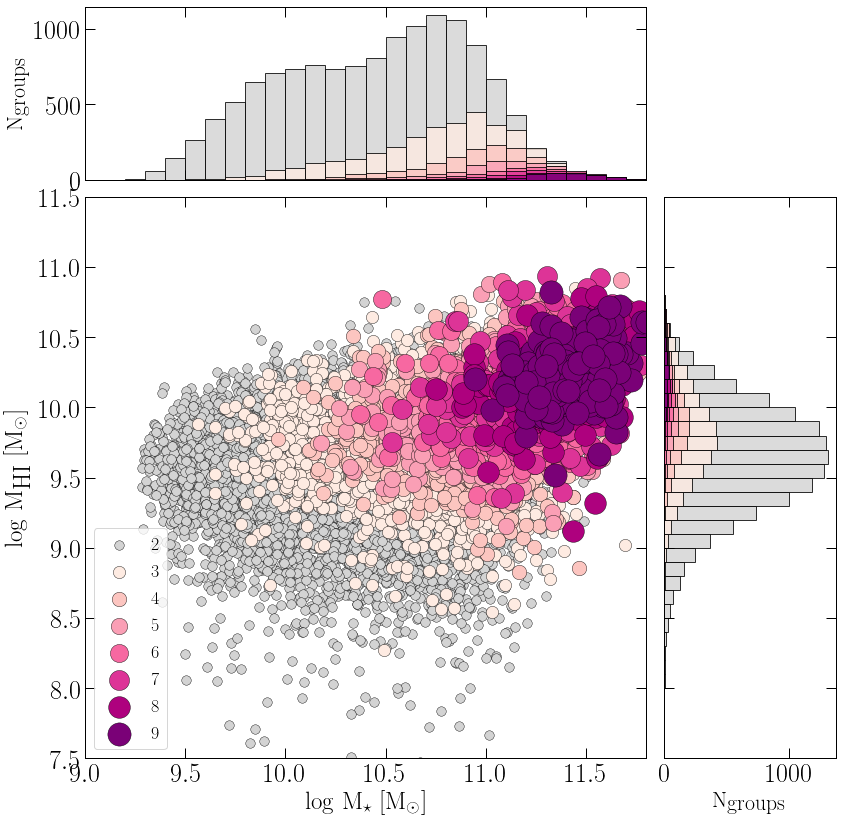

In [58]:
hist_group_sum_Mhi_vs_Mstar(updated_dict)

In [59]:
def histogram_wrapper(dataset_length):
    """
    """
    
    if dataset_length == 1:
        hist_group_sum_Mhi_vs_Mstar(updated_dict)
    elif dataset_length ==2:
        hist_Mhi_vs_Mstar(updated_dict)
    elif dataset_length == 3:
        hist_Mhi_vs_Mstar_with_singles(updated_dict)
    else:# Check for funky stuff and raise an error
        print("Wrong dataset length. Dataset length should be: 1, 2 or 3.")
        raise ValueError

# Use dictionary based on "Groups" which also has info abour cen/sat
## Find where central galaxy is the most gas rich galaxy in each group

In [53]:
#Use dictionary and for each galaxy in "Groups" of 3 show central/satellite index

richer_central_ind = []
poorer_central_ind = []

richer_sat_ind = []
poorer_sat_ind = []

#Grp_length = 5
@jit
def find_richer_central_for_Nsized_group(Grp_length):
    for group_key in tqdm(updated_dict[Grp_length]["Groups"].keys()):
        central_idx = updated_dict[Grp_length]["Groups"][group_key]["Centrals"] #give indices
        central_mass = np.sum(G['DiscHI'],axis=1)[central_idx] #give masses of these galaxies
        
        satellite_inds = updated_dict[Grp_length]["Groups"][group_key]["Satellites"]
        sat_mass = np.sum(G['DiscHI'],axis=1)[satellite_inds]
        
        if (central_mass > sat_mass).all(): #check conditions
            print("Central is the most HI massive")
            richer_central_ind.append(central_idx)
            richer_sat_ind.append(satellite_inds)
        else:
            print("Satellite is more HI massive thatn central")
            poorer_central_ind.append(central_idx)
            poorer_sat_ind.append(satellite_inds)
        #print(sat_mass > central_mass)
        
        print("Central mass is {0} and sat masses are {1}".format(central_mass, sat_mass))
        print("")


In [54]:
find_richer_central_for_Nsized_group(5)

  0%|          | 3/737 [00:00<00:36, 20.01it/s]

Satellite is more HI massive thatn central
Central mass is [0.22089067] and sat masses are [0.19724864 0.13423851 0.09381649 0.22420886]

Satellite is more HI massive thatn central
Central mass is [0.07252686] and sat masses are [0.06281331 0.10191825 0.02681517 0.11155279]

Satellite is more HI massive thatn central
Central mass is [0.02792175] and sat masses are [0.10260858 0.0495873  0.15372859 0.12077709]

Satellite is more HI massive thatn central
Central mass is [0.08263776] and sat masses are [0.25765854 0.06201192 0.03910343 0.15847848]



  1%|          | 7/737 [00:00<00:37, 19.59it/s]

Satellite is more HI massive thatn central
Central mass is [0.11264803] and sat masses are [0.03877947 0.         0.16891481 0.01698559]

Central is the most HI massive
Central mass is [2.006952] and sat masses are [0.20057103 0.14336227 0.02259701 0.6785307 ]

Central is the most HI massive
Central mass is [0.25013003] and sat masses are [0.00061437 0.02482973 0.09485038 0.02606252]

Central is the most HI massive
Central mass is [0.47705364] and sat masses are [1.5546569e-01 5.2202282e-05 8.7197430e-02 6.6825658e-02]



  1%|▏         | 11/737 [00:00<00:37, 19.56it/s]

Satellite is more HI massive thatn central
Central mass is [0.12031402] and sat masses are [0.11195923 0.18128106 0.01677694 0.04015997]

Satellite is more HI massive thatn central
Central mass is [0.01802048] and sat masses are [0.         0.24572852 0.1459961  0.11816201]

Satellite is more HI massive thatn central
Central mass is [0.02367003] and sat masses are [0.02106495 0.22729878 0.27029085 0.07634547]

Satellite is more HI massive thatn central
Central mass is [0.09825254] and sat masses are [0.1295142  0.03898087 0.08264738 0.23625621]



  2%|▏         | 15/737 [00:00<00:37, 19.47it/s]

Satellite is more HI massive thatn central
Central mass is [0.08584465] and sat masses are [0.10127537 0.05773228 0.8501526  0.375706  ]

Satellite is more HI massive thatn central
Central mass is [0.14912143] and sat masses are [0.29670125 0.02730385 0.27794454 0.92585206]

Central is the most HI massive
Central mass is [1.1714981] and sat masses are [0.00165406 0.1542605  0.56125474 0.35340557]

Satellite is more HI massive thatn central
Central mass is [0.12855509] and sat masses are [0.05034685 0.01930722 0.3095177  0.04317895]



  3%|▎         | 19/737 [00:00<00:36, 19.50it/s]

Central is the most HI massive
Central mass is [0.31997618] and sat masses are [0.12501211 0.05799173 0.01253055 0.07244299]

Satellite is more HI massive thatn central
Central mass is [0.0087272] and sat masses are [0.13950725 0.6375006  0.1391637  0.1847659 ]

Satellite is more HI massive thatn central
Central mass is [0.08133414] and sat masses are [0.20374721 0.04485349 0.22801282 0.39142007]

Central is the most HI massive
Central mass is [0.3291569] and sat masses are [0.02285949 0.08808092 0.29251522 0.06663073]



  3%|▎         | 23/737 [00:01<00:36, 19.48it/s]

Central is the most HI massive
Central mass is [0.89804083] and sat masses are [0.00681645 0.12312926 0.07181926 0.03943379]

Satellite is more HI massive thatn central
Central mass is [0.10290028] and sat masses are [0.04105159 0.02191019 0.17890278 0.02852321]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.22845967 0.1330837  0.01912268 0.1526024 ]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.20816505 0.20153412 0.23631819 0.0771992 ]



  4%|▎         | 27/737 [00:01<00:36, 19.46it/s]

Central is the most HI massive
Central mass is [0.27666175] and sat masses are [0.19219917 0.03255049 0.14397895 0.13757673]

Satellite is more HI massive thatn central
Central mass is [0.07593933] and sat masses are [0.15683997 0.21933615 0.35002846 0.532541  ]

Satellite is more HI massive thatn central
Central mass is [0.05321855] and sat masses are [0.00314652 0.07382017 0.18236384 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.06937207] and sat masses are [0.15202965 0.19132243 0.12352093 0.        ]



  4%|▍         | 31/737 [00:01<00:36, 19.47it/s]

Satellite is more HI massive thatn central
Central mass is [0.06437466] and sat masses are [0.11299993 0.66706556 0.13841859 0.14757383]

Satellite is more HI massive thatn central
Central mass is [0.11428399] and sat masses are [0.23097897 0.03887586 0.04160087 0.22385648]

Satellite is more HI massive thatn central
Central mass is [0.00933683] and sat masses are [0.04436594 0.13433924 0.0247496  0.10731088]

Satellite is more HI massive thatn central
Central mass is [0.10957869] and sat masses are [0.05816416 0.05427891 0.17847908 0.03862897]



  5%|▍         | 35/737 [00:01<00:36, 19.47it/s]

Satellite is more HI massive thatn central
Central mass is [0.05681398] and sat masses are [0.11880954 0.03345943 0.30124694 0.        ]

Central is the most HI massive
Central mass is [0.18703814] and sat masses are [0.12077323 0.15601687 0.1397477  0.0001899 ]

Central is the most HI massive
Central mass is [0.6305512] and sat masses are [0.51815206 0.00407376 0.26002264 0.1956774 ]

Central is the most HI massive
Central mass is [0.31556755] and sat masses are [0.13116814 0.18337603 0.2180188  0.14720677]



  5%|▌         | 39/737 [00:02<00:35, 19.47it/s]

Central is the most HI massive
Central mass is [0.14685327] and sat masses are [0.07021955 0.06086772 0.1027821  0.04380228]

Satellite is more HI massive thatn central
Central mass is [0.03888633] and sat masses are [0.         0.02850276 0.0411785  0.08482496]

Satellite is more HI massive thatn central
Central mass is [0.07140616] and sat masses are [0.12328552 0.02472902 0.00493859 0.06300301]

Satellite is more HI massive thatn central
Central mass is [0.09533025] and sat masses are [0.01296719 0.3701811  0.28168023 0.01591463]



  6%|▌         | 43/737 [00:02<00:35, 19.44it/s]

Satellite is more HI massive thatn central
Central mass is [0.06012877] and sat masses are [0.05216224 0.1453396  0.04428847 0.07233734]

Satellite is more HI massive thatn central
Central mass is [0.05691377] and sat masses are [0.32321888 0.1718573  0.16652198 0.10830485]

Satellite is more HI massive thatn central
Central mass is [0.01657314] and sat masses are [0.5614203  0.         0.05683283 0.11338142]

Satellite is more HI massive thatn central
Central mass is [0.01176727] and sat masses are [0.03536265 0.0346646  0.10701909 0.01006524]



  6%|▋         | 47/737 [00:02<00:35, 19.44it/s]

Satellite is more HI massive thatn central
Central mass is [0.0228122] and sat masses are [0.08014984 0.13335776 0.01038559 0.0792147 ]

Central is the most HI massive
Central mass is [0.8333395] and sat masses are [0.27788422 0.19531572 0.1547569  0.02259106]

Satellite is more HI massive thatn central
Central mass is [0.01232909] and sat masses are [0.07882851 0.11172947 0.71254975 0.4541832 ]

Satellite is more HI massive thatn central
Central mass is [0.10025052] and sat masses are [0.0165073  0.2595811  0.12076602 0.14534284]



  7%|▋         | 51/737 [00:02<00:35, 19.42it/s]

Central is the most HI massive
Central mass is [1.6712978] and sat masses are [0.06262602 0.94100165 0.15497059 0.13106176]

Satellite is more HI massive thatn central
Central mass is [0.25542998] and sat masses are [0.3096186  0.19841331 0.07577258 0.05034031]

Satellite is more HI massive thatn central
Central mass is [0.12217487] and sat masses are [0.31137335 0.02881342 0.23030822 0.05018516]

Central is the most HI massive
Central mass is [0.6458671] and sat masses are [0.04165949 0.16694696 0.05306196 0.24369785]



  7%|▋         | 55/737 [00:02<00:35, 19.42it/s]

Central is the most HI massive
Central mass is [0.45536298] and sat masses are [0.20368263 0.07795289 0.0558252  0.06276424]

Central is the most HI massive
Central mass is [2.1484554] and sat masses are [0.05226123 0.00027779 0.08008132 0.07656407]

Satellite is more HI massive thatn central
Central mass is [0.05984565] and sat masses are [0.14766985 0.         0.1893341  0.5478285 ]

Satellite is more HI massive thatn central
Central mass is [0.05271349] and sat masses are [0.04172304 0.02068826 0.1242573  0.        ]



  8%|▊         | 59/737 [00:03<00:34, 19.41it/s]

Satellite is more HI massive thatn central
Central mass is [0.0476294] and sat masses are [0.00397332 0.15927412 0.15753375 0.03837953]

Satellite is more HI massive thatn central
Central mass is [0.05411164] and sat masses are [0.10800332 0.15206881 0.12537123 0.15355426]

Satellite is more HI massive thatn central
Central mass is [0.00102065] and sat masses are [0.38947064 1.0419403  0.03302926 0.06893715]

Satellite is more HI massive thatn central
Central mass is [0.00929968] and sat masses are [0.         0.21986638 0.06554037 0.0153991 ]



  9%|▊         | 63/737 [00:03<00:34, 19.42it/s]

Satellite is more HI massive thatn central
Central mass is [0.1088108] and sat masses are [0.42658216 0.15393361 0.17946759 0.23250529]

Satellite is more HI massive thatn central
Central mass is [0.08920844] and sat masses are [0.23919061 0.14670575 0.04393516 0.10587654]

Satellite is more HI massive thatn central
Central mass is [0.07350849] and sat masses are [0.2074424  0.20887594 0.03676444 0.00465598]

Satellite is more HI massive thatn central
Central mass is [0.03377172] and sat masses are [0.54630077 0.39453804 0.12438756 0.03153289]



  9%|▉         | 67/737 [00:03<00:34, 19.41it/s]

Central is the most HI massive
Central mass is [1.5100963] and sat masses are [0.6090451  0.45887497 0.087176   0.04611434]

Central is the most HI massive
Central mass is [0.41881165] and sat masses are [0.0872464  0.3243836  0.1756908  0.21334112]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.11917497 0.12198626 0.11474408 0.15611666]

Central is the most HI massive
Central mass is [0.794035] and sat masses are [0.05489937 0.05516333 0.19223513 0.11383776]



 10%|▉         | 71/737 [00:03<00:34, 19.40it/s]

Central is the most HI massive
Central mass is [1.3444023] and sat masses are [0.00863378 0.         0.09919921 0.14896488]

Satellite is more HI massive thatn central
Central mass is [0.05468434] and sat masses are [0.31086385 0.34068656 0.01461935 0.02714457]

Satellite is more HI massive thatn central
Central mass is [0.03220749] and sat masses are [0.07035014 0.26038125 0.09376176 0.79540086]

Satellite is more HI massive thatn central
Central mass is [0.11168099] and sat masses are [0.2538985  0.13065904 0.02454514 0.17843994]



 10%|█         | 75/737 [00:03<00:34, 19.41it/s]

Satellite is more HI massive thatn central
Central mass is [0.38907304] and sat masses are [0.09391201 0.93769324 0.73844016 0.4521841 ]

Satellite is more HI massive thatn central
Central mass is [0.28751895] and sat masses are [0.00067189 0.03165691 0.5368295  0.        ]

Satellite is more HI massive thatn central
Central mass is [0.2845355] and sat masses are [0.3449936  0.15214746 0.04105639 0.16650511]

Satellite is more HI massive thatn central
Central mass is [0.0352549] and sat masses are [0.29655385 0.15895957 0.05347834 0.20980616]



 11%|█         | 79/737 [00:04<00:33, 19.40it/s]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.4685235  0.1299582  0.         0.06526092]

Satellite is more HI massive thatn central
Central mass is [0.26996592] and sat masses are [0.4917267  0.00454259 0.22161281 0.63637596]

Central is the most HI massive
Central mass is [0.34074584] and sat masses are [0.0630281  0.20900176 0.1116813  0.01554481]

Central is the most HI massive
Central mass is [0.15512331] and sat masses are [0.04464785 0.02173381 0.09154116 0.08643486]



 11%|█▏        | 83/737 [00:04<00:33, 19.38it/s]

Central is the most HI massive
Central mass is [2.375148] and sat masses are [0.01445132 0.2870673  0.21796407 0.35407594]

Central is the most HI massive
Central mass is [0.3131614] and sat masses are [0.02501295 0.02819077 0.07702012 0.12167261]

Central is the most HI massive
Central mass is [0.33213684] and sat masses are [0.14453743 0.14406264 0.03723923 0.08883769]

Satellite is more HI massive thatn central
Central mass is [0.01769748] and sat masses are [0.12731259 0.04664763 0.05942625 0.22770402]



 12%|█▏        | 87/737 [00:04<00:33, 19.38it/s]

Satellite is more HI massive thatn central
Central mass is [0.05998578] and sat masses are [0.09242694 0.17908552 0.1108472  0.10957985]

Satellite is more HI massive thatn central
Central mass is [0.14386618] and sat masses are [0.68404156 0.08209047 0.02401773 0.03326759]

Satellite is more HI massive thatn central
Central mass is [0.13322197] and sat masses are [0.1415773  0.2899723  0.03958714 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.2820436] and sat masses are [0.09474813 0.336575   0.3686544  0.05427473]



 12%|█▏        | 91/737 [00:04<00:33, 19.38it/s]

Satellite is more HI massive thatn central
Central mass is [0.01203399] and sat masses are [0.00474801 0.01439087 0.18570873 0.11670686]

Central is the most HI massive
Central mass is [1.236188] and sat masses are [0.04572101 0.15230376 0.16224188 0.06985467]

Satellite is more HI massive thatn central
Central mass is [0.00888956] and sat masses are [1.2996291  0.14039066 0.14535694 0.01262219]

Satellite is more HI massive thatn central
Central mass is [0.00524164] and sat masses are [0.16749693 0.013192   0.0023579  0.00020996]



 13%|█▎        | 95/737 [00:04<00:33, 19.37it/s]

Satellite is more HI massive thatn central
Central mass is [0.08083637] and sat masses are [0.12523168 0.2939971  1.1838452  0.2945251 ]

Satellite is more HI massive thatn central
Central mass is [0.10309201] and sat masses are [0.48424828 0.00380883 0.44910577 0.26334274]

Satellite is more HI massive thatn central
Central mass is [0.08775693] and sat masses are [0.03398714 0.02415176 0.1608519  0.250134  ]

Central is the most HI massive
Central mass is [0.49773788] and sat masses are [0.07979968 0.07423175 0.0644744  0.14986534]



 13%|█▎        | 99/737 [00:05<00:32, 19.37it/s]

Satellite is more HI massive thatn central
Central mass is [0.08448747] and sat masses are [0.6693048  0.1177736  0.21063806 0.27919194]

Satellite is more HI massive thatn central
Central mass is [0.02273707] and sat masses are [0.03296695 0.05227378 0.04330918 0.25999218]

Satellite is more HI massive thatn central
Central mass is [0.14447272] and sat masses are [0.2348831  0.15117034 0.11007548 0.11928869]

Central is the most HI massive
Central mass is [0.15848784] and sat masses are [0.04297843 0.11527936 0.04158999 0.06770575]



 14%|█▍        | 103/737 [00:05<00:32, 19.36it/s]

Satellite is more HI massive thatn central
Central mass is [0.08790292] and sat masses are [0.04221282 1.5263397  0.5505247  0.5422145 ]

Central is the most HI massive
Central mass is [0.18762986] and sat masses are [0.01494462 0.01512684 0.         0.04512437]

Satellite is more HI massive thatn central
Central mass is [0.05693585] and sat masses are [0.02268643 0.04078393 0.09711118 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.02249959] and sat masses are [0.11560037 0.16352125 0.20218138 0.09687182]



 15%|█▍        | 107/737 [00:05<00:32, 19.35it/s]

Satellite is more HI massive thatn central
Central mass is [0.08867131] and sat masses are [0.05246008 0.09124924 0.04286733 0.        ]

Central is the most HI massive
Central mass is [0.846758] and sat masses are [0.12752403 0.04070858 0.48011425 0.26473424]

Satellite is more HI massive thatn central
Central mass is [0.24496487] and sat masses are [0.08653034 0.11816407 0.37661335 0.07039859]

Satellite is more HI massive thatn central
Central mass is [0.00680894] and sat masses are [0.00884934 0.0720516  0.21641612 0.10316924]



 15%|█▌        | 111/737 [00:05<00:32, 19.36it/s]

Satellite is more HI massive thatn central
Central mass is [0.02674357] and sat masses are [0.06852701 0.25519747 0.08979    0.15480952]

Satellite is more HI massive thatn central
Central mass is [0.08865449] and sat masses are [0.11518912 0.09676921 0.02836199 0.17908818]

Central is the most HI massive
Central mass is [0.33632362] and sat masses are [0.12374404 0.2849713  0.10289387 0.13608108]

Central is the most HI massive
Central mass is [0.19293247] and sat masses are [0.         0.13867311 0.13465483 0.05613918]



 16%|█▌        | 115/737 [00:05<00:32, 19.36it/s]

Satellite is more HI massive thatn central
Central mass is [0.0016401] and sat masses are [0.09783674 0.07292907 0.10193355 0.27985486]

Satellite is more HI massive thatn central
Central mass is [0.06392263] and sat masses are [0.34671837 0.1344845  0.16901495 0.19397767]

Satellite is more HI massive thatn central
Central mass is [0.0960672] and sat masses are [0.07052223 0.11800219 0.10298777 0.02492213]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.33615878 0.21080625 0.43038806 0.0932305 ]



 16%|█▌        | 119/737 [00:06<00:31, 19.36it/s]

Central is the most HI massive
Central mass is [3.281479] and sat masses are [0.09770959 0.26052126 0.08806414 0.02188466]

Central is the most HI massive
Central mass is [3.5039046] and sat masses are [0.06250629 0.20412807 0.02956824 0.04305061]

Satellite is more HI massive thatn central
Central mass is [0.1556191] and sat masses are [0.04516376 0.1943765  0.1646252  0.13291872]

Satellite is more HI massive thatn central
Central mass is [0.19181713] and sat masses are [0.02204071 0.126917   0.04748348 0.26597396]



 17%|█▋        | 123/737 [00:06<00:31, 19.36it/s]

Satellite is more HI massive thatn central
Central mass is [0.10722768] and sat masses are [0.02747654 0.19531213 0.36356008 0.09490911]

Satellite is more HI massive thatn central
Central mass is [0.00333354] and sat masses are [0.17624211 0.         0.11196771 0.12821393]

Satellite is more HI massive thatn central
Central mass is [0.05994931] and sat masses are [0.22240642 0.03364736 0.6860721  0.        ]

Central is the most HI massive
Central mass is [0.44125023] and sat masses are [5.1160750e-05 4.0846568e-01 7.8856319e-02 3.1319734e-02]



 17%|█▋        | 127/737 [00:06<00:31, 19.36it/s]

Satellite is more HI massive thatn central
Central mass is [0.01625071] and sat masses are [0.1383083  0.29989508 0.5502531  0.        ]

Central is the most HI massive
Central mass is [0.8839722] and sat masses are [0.09071158 0.00700378 0.20904014 0.2939437 ]

Central is the most HI massive
Central mass is [0.5225201] and sat masses are [0.18883233 0.11275788 0.0229181  0.05365068]

Satellite is more HI massive thatn central
Central mass is [0.23428416] and sat masses are [0.02834027 0.13779536 0.06089826 0.31568456]



 18%|█▊        | 131/737 [00:06<00:31, 19.35it/s]

Satellite is more HI massive thatn central
Central mass is [0.01255075] and sat masses are [0.06304693 0.02923463 0.03358854 0.05413678]

Satellite is more HI massive thatn central
Central mass is [0.01048274] and sat masses are [0.92749673 0.08792758 0.05359311 0.16086   ]

Satellite is more HI massive thatn central
Central mass is [0.00153113] and sat masses are [0.07585608 0.36817366 0.01865085 0.16650887]

Satellite is more HI massive thatn central
Central mass is [0.24395984] and sat masses are [0.06800297 0.         0.         0.5365019 ]



 18%|█▊        | 135/737 [00:06<00:31, 19.36it/s]

Satellite is more HI massive thatn central
Central mass is [0.0919429] and sat masses are [0.03293324 0.32240945 0.17802796 0.13079125]

Central is the most HI massive
Central mass is [0.24587393] and sat masses are [0.03691766 0.08551449 0.1669792  0.03295874]

Central is the most HI massive
Central mass is [1.8815515] and sat masses are [0.20739445 0.01011319 0.21894565 0.38975444]

Satellite is more HI massive thatn central
Central mass is [0.04022637] and sat masses are [0.00863595 0.09366418 0.04505553 0.11246607]



 19%|█▉        | 139/737 [00:07<00:30, 19.36it/s]

Satellite is more HI massive thatn central
Central mass is [0.0946523] and sat masses are [0.12920463 0.3373345  0.14655095 0.03135458]

Satellite is more HI massive thatn central
Central mass is [0.08696501] and sat masses are [0.051818   0.12114621 0.0699282  0.044531  ]

Satellite is more HI massive thatn central
Central mass is [0.05969669] and sat masses are [0.15821019 0.30752668 0.13171084 0.10475516]

Central is the most HI massive
Central mass is [0.511691] and sat masses are [0.04131136 0.08846694 0.21034908 0.27575   ]



 19%|█▉        | 143/737 [00:07<00:30, 19.36it/s]

Satellite is more HI massive thatn central
Central mass is [0.01779385] and sat masses are [0.04595331 0.04009593 0.02044048 0.06238446]

Central is the most HI massive
Central mass is [0.47113472] and sat masses are [0.1981659  0.06537259 0.03838563 0.00544933]

Satellite is more HI massive thatn central
Central mass is [0.07145853] and sat masses are [0.14840087 0.         0.05562454 0.0802083 ]

Satellite is more HI massive thatn central
Central mass is [0.24905068] and sat masses are [0.05251728 0.75515777 0.02543521 0.08468239]



 20%|█▉        | 147/737 [00:07<00:30, 19.36it/s]

Central is the most HI massive
Central mass is [1.1021204] and sat masses are [0.12560546 0.16675365 0.22246325 0.06225392]

Central is the most HI massive
Central mass is [0.8468671] and sat masses are [0.35611415 0.08413137 0.13880976 0.09580954]

Satellite is more HI massive thatn central
Central mass is [0.04364499] and sat masses are [0.12806721 0.09217368 0.12610671 0.43829414]

Satellite is more HI massive thatn central
Central mass is [0.10817855] and sat masses are [0.7538723  0.81819457 0.12547165 0.20308547]



 20%|██        | 151/737 [00:07<00:30, 19.36it/s]

Central is the most HI massive
Central mass is [1.4800327] and sat masses are [0.39694554 0.06297263 0.14676717 0.13002615]

Satellite is more HI massive thatn central
Central mass is [0.03641161] and sat masses are [0.04857013 0.16389671 0.         0.1522268 ]

Satellite is more HI massive thatn central
Central mass is [0.40754056] and sat masses are [0.24327323 0.16901757 0.36592752 0.60201627]

Satellite is more HI massive thatn central
Central mass is [0.14275078] and sat masses are [0.09942733 0.00821256 0.60595286 0.16045336]



 21%|██        | 155/737 [00:08<00:30, 19.36it/s]

Satellite is more HI massive thatn central
Central mass is [0.19338694] and sat masses are [0.12224106 0.31542274 0.03867932 0.08698323]

Satellite is more HI massive thatn central
Central mass is [0.28832898] and sat masses are [0.45128283 0.01458283 0.12454633 0.1646837 ]

Satellite is more HI massive thatn central
Central mass is [0.21337047] and sat masses are [0.10696922 0.24526197 0.01808289 0.03801278]

Satellite is more HI massive thatn central
Central mass is [0.12372705] and sat masses are [0.15192331 0.3183782  0.08958466 0.07324372]



 22%|██▏       | 159/737 [00:08<00:29, 19.36it/s]

Satellite is more HI massive thatn central
Central mass is [0.13650806] and sat masses are [0.16110219 0.051514   0.03578571 0.09546272]

Satellite is more HI massive thatn central
Central mass is [0.20959103] and sat masses are [0.24476564 0.04330532 0.11442877 0.01518651]

Central is the most HI massive
Central mass is [1.1486126] and sat masses are [0.17482063 0.1273362  0.11528281 0.07863829]

Satellite is more HI massive thatn central
Central mass is [0.244511] and sat masses are [0.0335679  0.2895493  0.13289294 0.29487795]



 22%|██▏       | 163/737 [00:08<00:29, 19.36it/s]

Central is the most HI massive
Central mass is [0.04916827] and sat masses are [0.04445216 0.00693986 0.03053244 0.00084659]

Central is the most HI massive
Central mass is [1.867025] and sat masses are [0.00016423 0.13858142 0.08698437 0.09413391]

Satellite is more HI massive thatn central
Central mass is [0.03791581] and sat masses are [0.         0.65554494 0.44041637 0.12031682]

Satellite is more HI massive thatn central
Central mass is [0.045673] and sat masses are [0.03512235 0.21772201 0.04364461 0.04590614]



 23%|██▎       | 167/737 [00:08<00:29, 19.35it/s]

Satellite is more HI massive thatn central
Central mass is [0.05463516] and sat masses are [0.33755812 0.10233874 0.16615894 0.14982554]

Satellite is more HI massive thatn central
Central mass is [0.306133] and sat masses are [0.39672416 0.26340756 0.12254056 1.3687941 ]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.05238264 0.1748657  0.33126867 0.15902966]

Satellite is more HI massive thatn central
Central mass is [0.00073395] and sat masses are [0.04129348 1.9317074  0.82328385 0.09017003]



 23%|██▎       | 171/737 [00:08<00:29, 19.36it/s]

Satellite is more HI massive thatn central
Central mass is [0.02224462] and sat masses are [0.10752165 0.03095089 0.04265222 0.13438405]

Satellite is more HI massive thatn central
Central mass is [0.01987863] and sat masses are [0.08550071 0.04149425 0.72761124 0.10800907]

Central is the most HI massive
Central mass is [0.43687198] and sat masses are [0.01851994 0.0894272  0.24786745 0.003099  ]

Satellite is more HI massive thatn central
Central mass is [0.05581439] and sat masses are [0.12375943 0.06598651 0.05638817 0.09517626]



 24%|██▎       | 175/737 [00:09<00:29, 19.35it/s]

Satellite is more HI massive thatn central
Central mass is [0.25722286] and sat masses are [0.         0.03097832 0.056563   0.3652046 ]

Central is the most HI massive
Central mass is [0.14248718] and sat masses are [0.09015645 0.09542306 0.10555549 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.06850126] and sat masses are [0.7045146  0.02454455 0.17316683 0.07887409]

Satellite is more HI massive thatn central
Central mass is [0.03570674] and sat masses are [0.08196334 0.05889591 0.11446626 0.01918194]



 24%|██▍       | 179/737 [00:09<00:28, 19.35it/s]

Satellite is more HI massive thatn central
Central mass is [0.06673019] and sat masses are [0.13981098 0.03681647 0.29161233 0.12685235]

Central is the most HI massive
Central mass is [3.853903] and sat masses are [0.1366896  0.03472137 0.53546643 0.13415267]

Satellite is more HI massive thatn central
Central mass is [0.0325937] and sat masses are [0.2748194  0.11630818 0.         0.02600637]

Satellite is more HI massive thatn central
Central mass is [0.12401453] and sat masses are [0.04651683 0.53038543 0.04564797 0.0841559 ]



 25%|██▍       | 183/737 [00:09<00:28, 19.35it/s]

Satellite is more HI massive thatn central
Central mass is [0.05937089] and sat masses are [0.00848538 0.08739763 0.49054053 0.05890627]

Central is the most HI massive
Central mass is [0.19488521] and sat masses are [0.06543039 0.10756566 0.00511069 0.09694362]

Satellite is more HI massive thatn central
Central mass is [0.02379601] and sat masses are [6.1746442e-01 1.6731852e-01 1.7069669e-01 3.3988163e-05]

Satellite is more HI massive thatn central
Central mass is [0.05433276] and sat masses are [0.14236002 0.         0.02929688 0.52252066]



 25%|██▌       | 187/737 [00:09<00:28, 19.35it/s]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.12704583 0.05437373 0.07919863 0.09680255]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.02698936 0.29408222 0.         0.11117966]

Central is the most HI massive
Central mass is [0.5013713] and sat masses are [0.3295717  0.34372982 0.08752734 0.00610926]

Satellite is more HI massive thatn central
Central mass is [0.19503266] and sat masses are [0.15924859 0.24839456 0.61202157 0.03270523]



 26%|██▌       | 191/737 [00:09<00:28, 19.34it/s]

Satellite is more HI massive thatn central
Central mass is [0.01523848] and sat masses are [0.01842598 0.31908438 0.         0.05924191]

Satellite is more HI massive thatn central
Central mass is [0.12153271] and sat masses are [0.20940678 0.14037919 0.17333321 0.15628377]

Satellite is more HI massive thatn central
Central mass is [0.10688408] and sat masses are [0.10680449 0.03130628 0.19551459 0.06460157]

Satellite is more HI massive thatn central
Central mass is [0.06078285] and sat masses are [0.1200311  0.11541471 0.16736522 0.06969226]



 26%|██▋       | 195/737 [00:10<00:28, 19.34it/s]

Satellite is more HI massive thatn central
Central mass is [0.02287997] and sat masses are [0.13391949 0.14754146 0.04543836 0.344016  ]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.14985403 0.26167327 0.07636198 0.00987206]

Satellite is more HI massive thatn central
Central mass is [0.15639883] and sat masses are [0.06283213 0.13501924 0.29997924 0.01291124]

Central is the most HI massive
Central mass is [0.36668867] and sat masses are [0.278598   0.3658945  0.19581892 0.02578784]



 27%|██▋       | 199/737 [00:10<00:27, 19.34it/s]

Satellite is more HI massive thatn central
Central mass is [0.10515954] and sat masses are [0.04666721 0.3583799  0.04271955 0.00471941]

Satellite is more HI massive thatn central
Central mass is [0.11027268] and sat masses are [0.00592124 0.17403898 0.02794135 0.08765644]

Central is the most HI massive
Central mass is [0.20045786] and sat masses are [0.03239825 0.13747206 0.03020683 0.18358935]

Satellite is more HI massive thatn central
Central mass is [0.03104015] and sat masses are [0.08803034 0.18834275 0.15342365 0.        ]



 28%|██▊       | 203/737 [00:10<00:27, 19.34it/s]

Satellite is more HI massive thatn central
Central mass is [0.13676578] and sat masses are [0.10508886 0.07319268 0.1824303  0.10889461]

Central is the most HI massive
Central mass is [0.36684108] and sat masses are [0.15141569 0.07221807 0.04314752 0.0264321 ]

Satellite is more HI massive thatn central
Central mass is [0.09378913] and sat masses are [0.34080386 0.13496903 0.15408947 0.03683728]

Satellite is more HI massive thatn central
Central mass is [0.36987343] and sat masses are [0.01397278 0.02737395 0.16040595 0.65968007]



 28%|██▊       | 207/737 [00:10<00:27, 19.34it/s]

Satellite is more HI massive thatn central
Central mass is [0.11460874] and sat masses are [0.36930695 0.366868   0.05791711 0.14165895]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.15805918 0.5678493  0.12059408 0.20932932]

Central is the most HI massive
Central mass is [0.38978657] and sat masses are [0.02054109 0.1999461  0.12404372 0.09518633]

Satellite is more HI massive thatn central
Central mass is [0.28288865] and sat masses are [0.05493874 0.01616061 0.38810492 0.01114924]



 29%|██▊       | 211/737 [00:10<00:27, 19.34it/s]

Central is the most HI massive
Central mass is [2.1519291] and sat masses are [0.04384999 0.22121191 0.04458826 0.09001637]

Central is the most HI massive
Central mass is [0.23245373] and sat masses are [0.         0.07253541 0.10710479 0.1289179 ]

Satellite is more HI massive thatn central
Central mass is [0.03878212] and sat masses are [0.05214644 0.         0.04881632 0.38917363]

Satellite is more HI massive thatn central
Central mass is [0.09259108] and sat masses are [0.12255681 0.9702903  0.236512   0.6347186 ]



 29%|██▉       | 215/737 [00:11<00:26, 19.34it/s]

Satellite is more HI massive thatn central
Central mass is [0.0325265] and sat masses are [0.         0.16079247 0.02186263 0.2594812 ]

Satellite is more HI massive thatn central
Central mass is [0.34675097] and sat masses are [0.         0.0540459  0.47739333 0.38949737]

Satellite is more HI massive thatn central
Central mass is [0.04898089] and sat masses are [0.07588825 0.45781124 0.00948912 0.28299007]

Satellite is more HI massive thatn central
Central mass is [0.05669985] and sat masses are [0.08022812 0.12857473 0.12379698 0.06980734]



 30%|██▉       | 219/737 [00:11<00:26, 19.33it/s]

Central is the most HI massive
Central mass is [0.6259799] and sat masses are [0.13065289 0.18320441 0.06300421 0.        ]

Central is the most HI massive
Central mass is [1.8689886] and sat masses are [0.1578564  0.33802223 0.06955691 0.09474447]

Central is the most HI massive
Central mass is [0.23343362] and sat masses are [0.21820289 0.15597835 0.         0.05350473]

Central is the most HI massive
Central mass is [0.32934874] and sat masses are [0.         0.15081947 0.14484595 0.11984342]



 30%|███       | 223/737 [00:11<00:26, 19.33it/s]

Satellite is more HI massive thatn central
Central mass is [0.19496335] and sat masses are [0.01580803 0.07352492 0.3396607  0.73101753]

Satellite is more HI massive thatn central
Central mass is [0.15142426] and sat masses are [0.03873405 0.22974434 0.1478811  0.19801657]

Satellite is more HI massive thatn central
Central mass is [0.09625641] and sat masses are [0.04128461 0.18842381 0.         0.03632013]

Satellite is more HI massive thatn central
Central mass is [0.00510016] and sat masses are [0.02779248 0.11502539 0.00999841 0.06885581]



 31%|███       | 227/737 [00:11<00:26, 19.33it/s]

Satellite is more HI massive thatn central
Central mass is [0.15231895] and sat masses are [0.07708893 0.03591346 0.40578607 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.07460503] and sat masses are [0.02215701 0.19342083 0.08170013 0.12538344]

Central is the most HI massive
Central mass is [0.65452516] and sat masses are [0.165095   0.06855488 0.12939538 0.33053032]

Satellite is more HI massive thatn central
Central mass is [0.16708057] and sat masses are [0.17581318 0.14906092 0.03638912 0.1046063 ]



 31%|███▏      | 231/737 [00:11<00:26, 19.33it/s]

Satellite is more HI massive thatn central
Central mass is [0.3475153] and sat masses are [0.45019662 0.00214427 0.09849741 0.24357405]

Satellite is more HI massive thatn central
Central mass is [0.06386779] and sat masses are [0.14956954 0.06006294 0.0127005  0.13639174]

Central is the most HI massive
Central mass is [0.1512297] and sat masses are [0.08156984 0.08110234 0.02352236 0.08431561]

Satellite is more HI massive thatn central
Central mass is [0.08547548] and sat masses are [0.10190956 0.12843123 0.00981299 0.06255053]



 32%|███▏      | 235/737 [00:12<00:25, 19.33it/s]

Satellite is more HI massive thatn central
Central mass is [0.1567468] and sat masses are [0.09157414 0.4802701  0.6033869  0.14611572]

Satellite is more HI massive thatn central
Central mass is [0.0450477] and sat masses are [0.18315427 0.10125554 0.10761009 0.12134998]

Central is the most HI massive
Central mass is [0.810551] and sat masses are [0.08354484 0.12633465 0.         0.09276333]

Satellite is more HI massive thatn central
Central mass is [0.02380698] and sat masses are [0.16365068 0.10287644 0.03670502 0.11585005]



 32%|███▏      | 239/737 [00:12<00:25, 19.33it/s]

Satellite is more HI massive thatn central
Central mass is [0.16640273] and sat masses are [0.02590051 0.34138432 0.12288897 0.        ]

Central is the most HI massive
Central mass is [2.276996] and sat masses are [0.         0.0119745  0.15316199 0.251407  ]

Satellite is more HI massive thatn central
Central mass is [0.05306084] and sat masses are [0.42663175 0.21079369 0.11417582 0.07159409]

Satellite is more HI massive thatn central
Central mass is [0.01417568] and sat masses are [0.0000000e+00 3.1160132e-05 3.4298804e-01 0.0000000e+00]



 33%|███▎      | 243/737 [00:12<00:25, 19.33it/s]

Satellite is more HI massive thatn central
Central mass is [0.00782873] and sat masses are [0.03085512 0.06371706 0.02437755 0.06917822]

Central is the most HI massive
Central mass is [2.3631434] and sat masses are [0.23573788 0.00517962 0.10453655 0.03009459]

Central is the most HI massive
Central mass is [2.032137] and sat masses are [0.17631513 0.0464824  0.14039062 0.        ]

Central is the most HI massive
Central mass is [0.23485605] and sat masses are [0.0427162  0.14399993 0.17005107 0.1236844 ]



 34%|███▎      | 247/737 [00:12<00:25, 19.33it/s]

Satellite is more HI massive thatn central
Central mass is [0.01546785] and sat masses are [0.         0.05509218 0.4205337  0.08368844]

Satellite is more HI massive thatn central
Central mass is [0.05037585] and sat masses are [0.14511177 0.08317345 0.02258432 0.04257687]

Satellite is more HI massive thatn central
Central mass is [0.02237697] and sat masses are [0.24274336 0.375026   0.6227297  0.11409886]

Satellite is more HI massive thatn central
Central mass is [0.04359667] and sat masses are [0.11722583 0.         0.14283107 0.9439898 ]



 34%|███▍      | 251/737 [00:12<00:25, 19.33it/s]

Satellite is more HI massive thatn central
Central mass is [0.02151599] and sat masses are [0.80240124 0.21712834 0.22188437 0.2443741 ]

Central is the most HI massive
Central mass is [0.05523527] and sat masses are [0.        0.0392151 0.        0.0104189]

Satellite is more HI massive thatn central
Central mass is [0.09018153] and sat masses are [0.2755272  0.04997292 0.06767184 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.15435901] and sat masses are [0.08038685 0.18831065 0.12647207 0.14258057]



 35%|███▍      | 255/737 [00:13<00:24, 19.33it/s]

Central is the most HI massive
Central mass is [0.16032171] and sat masses are [0.09942935 0.10867374 0.0797081  0.0790651 ]

Satellite is more HI massive thatn central
Central mass is [0.05250579] and sat masses are [0.00753833 0.06823468 0.04825941 0.0526296 ]

Satellite is more HI massive thatn central
Central mass is [0.16124988] and sat masses are [0.2898189  0.13064629 0.         0.10266291]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.02235735 0.24241619 0.08839245 0.05159992]



 35%|███▌      | 259/737 [00:13<00:24, 19.33it/s]

Satellite is more HI massive thatn central
Central mass is [0.05937855] and sat masses are [0.03152803 0.16269986 0.09088041 0.63957393]

Central is the most HI massive
Central mass is [0.30207342] and sat masses are [0.01177068 0.15728581 0.05218885 0.05604404]

Satellite is more HI massive thatn central
Central mass is [0.0338718] and sat masses are [0.09734729 0.07903253 0.00122436 0.12015054]

Satellite is more HI massive thatn central
Central mass is [0.07061531] and sat masses are [0.16770408 0.5419129  0.09644639 0.07837945]



 36%|███▌      | 263/737 [00:13<00:24, 19.32it/s]

Satellite is more HI massive thatn central
Central mass is [0.07234252] and sat masses are [0.02087519 0.2792861  0.00475149 0.12546936]

Central is the most HI massive
Central mass is [0.49727234] and sat masses are [2.2306356e-05 1.0873432e-01 1.2666601e-01 1.5976527e-01]

Satellite is more HI massive thatn central
Central mass is [0.20009884] and sat masses are [0.4976789  0.12229855 0.05854629 0.07869814]

Central is the most HI massive
Central mass is [0.30238256] and sat masses are [0.05103885 0.10782742 0.16615225 0.01318759]



 36%|███▌      | 267/737 [00:13<00:24, 19.32it/s]

Satellite is more HI massive thatn central
Central mass is [0.02934888] and sat masses are [0.01014637 0.01917415 0.00572436 0.4826662 ]

Satellite is more HI massive thatn central
Central mass is [0.04707919] and sat masses are [0.2791957  0.07813229 0.0134408  0.12559706]

Satellite is more HI massive thatn central
Central mass is [0.02425418] and sat masses are [0.34583062 0.13498498 0.26759186 0.1208902 ]

Central is the most HI massive
Central mass is [0.45361063] and sat masses are [0.31204265 0.2120037  0.05779444 0.04896774]



 37%|███▋      | 271/737 [00:14<00:24, 19.33it/s]

Satellite is more HI massive thatn central
Central mass is [0.08323855] and sat masses are [0.01975419 0.06736956 0.08781316 0.03675509]

Satellite is more HI massive thatn central
Central mass is [0.03531849] and sat masses are [0.06820343 0.0873512  0.30656275 0.17269734]

Satellite is more HI massive thatn central
Central mass is [0.004044] and sat masses are [0.10977114 0.00339358 0.09588774 0.07408688]

Central is the most HI massive
Central mass is [0.7416346] and sat masses are [0.5324655  0.16331351 0.18399644 0.0656001 ]



 37%|███▋      | 275/737 [00:14<00:23, 19.33it/s]

Satellite is more HI massive thatn central
Central mass is [0.14585991] and sat masses are [0.43655387 0.02158528 0.         0.09742294]

Satellite is more HI massive thatn central
Central mass is [0.14094345] and sat masses are [0.03060571 0.10266345 0.3347985  0.04217852]

Central is the most HI massive
Central mass is [1.6941918] and sat masses are [0.06276785 0.         0.06340639 0.03340442]

Satellite is more HI massive thatn central
Central mass is [0.1349113] and sat masses are [0.17662333 0.19842696 0.3551238  0.1100279 ]



 38%|███▊      | 279/737 [00:14<00:23, 19.32it/s]

Central is the most HI massive
Central mass is [0.32242802] and sat masses are [0.0314562  0.05341168 0.00689622 0.09449847]

Satellite is more HI massive thatn central
Central mass is [0.18307754] and sat masses are [0.43159187 0.07551555 0.03768806 0.00527848]

Satellite is more HI massive thatn central
Central mass is [0.08607835] and sat masses are [0.25537992 0.00495325 0.14564285 0.0398654 ]

Satellite is more HI massive thatn central
Central mass is [0.06952515] and sat masses are [0.02365123 0.00877972 0.18163624 0.00036596]



 38%|███▊      | 283/737 [00:14<00:23, 19.32it/s]

Central is the most HI massive
Central mass is [0.16284806] and sat masses are [0.07069431 0.         0.1451257  0.03278836]

Satellite is more HI massive thatn central
Central mass is [0.18310337] and sat masses are [0.         0.20172402 0.13882229 0.44264466]

Satellite is more HI massive thatn central
Central mass is [0.07786915] and sat masses are [0.08391294 0.         0.         0.3769161 ]

Central is the most HI massive
Central mass is [0.5438853] and sat masses are [0.03621358 0.12563731 0.14555435 0.09046519]



 39%|███▉      | 287/737 [00:14<00:23, 19.32it/s]

Central is the most HI massive
Central mass is [0.20842794] and sat masses are [0.04831379 0.08359198 0.10376046 0.11999023]

Central is the most HI massive
Central mass is [1.0923547] and sat masses are [0.16162544 0.03365732 0.         0.00255814]

Satellite is more HI massive thatn central
Central mass is [0.08246602] and sat masses are [0.1594009  0.13099615 0.08213874 0.02573342]

Satellite is more HI massive thatn central
Central mass is [0.19207868] and sat masses are [0.14637151 0.6133694  0.4197713  0.6206005 ]



 39%|███▉      | 291/737 [00:15<00:23, 19.32it/s]

Satellite is more HI massive thatn central
Central mass is [0.00312955] and sat masses are [0.5228697  0.1467761  0.01743433 0.07212116]

Satellite is more HI massive thatn central
Central mass is [0.3228016] and sat masses are [0.         0.10403758 0.01525355 0.41327155]

Central is the most HI massive
Central mass is [0.4735547] and sat masses are [0.14365594 0.44705576 0.02472841 0.01573208]

Satellite is more HI massive thatn central
Central mass is [0.2816892] and sat masses are [0.00657572 0.08479905 0.69013685 0.11492336]



 40%|████      | 295/737 [00:15<00:22, 19.32it/s]

Satellite is more HI massive thatn central
Central mass is [0.02497947] and sat masses are [0.04351734 0.01675472 0.28184325 0.12100929]

Satellite is more HI massive thatn central
Central mass is [0.06941064] and sat masses are [0.05080756 0.03718999 0.14072624 0.03736204]

Central is the most HI massive
Central mass is [0.83864963] and sat masses are [0.22821096 0.15159197 0.09981659 0.22027132]

Satellite is more HI massive thatn central
Central mass is [0.06305157] and sat masses are [0.         0.10068196 0.05919925 0.22852263]



 41%|████      | 299/737 [00:15<00:22, 19.32it/s]

Central is the most HI massive
Central mass is [0.2850238] and sat masses are [0.16097803 0.07610518 0.         0.12255986]

Satellite is more HI massive thatn central
Central mass is [0.04646282] and sat masses are [0.16274521 0.10152851 0.13371496 0.7180421 ]

Central is the most HI massive
Central mass is [0.21187857] and sat masses are [0.09461846 0.06704682 0.02521455 0.120894  ]

Central is the most HI massive
Central mass is [1.3695369] and sat masses are [0.00482324 0.25283805 0.7420851  0.05549329]



 41%|████      | 303/737 [00:15<00:22, 19.31it/s]

Central is the most HI massive
Central mass is [0.55425423] and sat masses are [0.03996304 0.38771287 0.22792675 0.26698497]

Central is the most HI massive
Central mass is [2.2757301] and sat masses are [0.02795591 0.01619323 0.54849327 0.1649098 ]

Satellite is more HI massive thatn central
Central mass is [0.12692721] and sat masses are [0.03842736 0.03731676 0.08267124 0.1484518 ]

Satellite is more HI massive thatn central
Central mass is [0.11735427] and sat masses are [0.04031815 0.06961802 0.22887842 0.24213172]



 42%|████▏     | 307/737 [00:15<00:22, 19.31it/s]

Satellite is more HI massive thatn central
Central mass is [0.00659782] and sat masses are [0.04307175 0.08001417 0.1992316  0.01858251]

Central is the most HI massive
Central mass is [0.39260858] and sat masses are [0.         0.2598739  0.0574865  0.24937713]

Satellite is more HI massive thatn central
Central mass is [0.04106148] and sat masses are [0.         0.         0.12071925 0.03727715]

Satellite is more HI massive thatn central
Central mass is [0.00029059] and sat masses are [0.24258891 0.21355397 0.2575584  0.01354444]



 42%|████▏     | 311/737 [00:16<00:22, 19.31it/s]

Central is the most HI massive
Central mass is [3.4425106] and sat masses are [0.20699391 0.08373788 0.08333078 0.05066077]

Satellite is more HI massive thatn central
Central mass is [0.1525433] and sat masses are [0.2757959  0.04326547 0.         0.08350912]

Satellite is more HI massive thatn central
Central mass is [0.17960301] and sat masses are [0.57440174 0.21129084 0.28571466 0.03654917]

Satellite is more HI massive thatn central
Central mass is [0.0968003] and sat masses are [0.03285448 0.14418788 0.11110748 0.1330985 ]



 43%|████▎     | 315/737 [00:16<00:21, 19.31it/s]

Satellite is more HI massive thatn central
Central mass is [0.06005391] and sat masses are [0.07687813 0.06487887 0.7447789  0.09005586]

Satellite is more HI massive thatn central
Central mass is [0.17966798] and sat masses are [0.09115456 0.30817926 0.05631511 0.06446221]

Satellite is more HI massive thatn central
Central mass is [0.01528552] and sat masses are [0.11114263 0.06142277 0.14266917 0.14541477]

Satellite is more HI massive thatn central
Central mass is [0.06600706] and sat masses are [0.08134024 1.1014097  0.         0.07998803]



 43%|████▎     | 319/737 [00:16<00:21, 19.31it/s]

Satellite is more HI massive thatn central
Central mass is [0.06798685] and sat masses are [0.15677637 0.02542388 0.05522449 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.01521576] and sat masses are [0.0542433  0.22818035 0.         0.        ]

Satellite is more HI massive thatn central
Central mass is [0.08678366] and sat masses are [0.03396576 0.         1.1857092  0.01576628]

Satellite is more HI massive thatn central
Central mass is [0.10370735] and sat masses are [0.03242319 0.3109235  0.32610965 0.08676841]



 44%|████▍     | 323/737 [00:16<00:21, 19.30it/s]

Central is the most HI massive
Central mass is [1.5728514] and sat masses are [0.30715978 0.03299602 0.1744971  0.03401678]

Central is the most HI massive
Central mass is [0.6286347] and sat masses are [0.5235697  0.07986175 0.14798646 0.2710162 ]

Satellite is more HI massive thatn central
Central mass is [0.05466826] and sat masses are [0.04148851 0.20811482 0.11375874 0.22000906]

Satellite is more HI massive thatn central
Central mass is [0.03839839] and sat masses are [0.13193543 0.08801351 0.07446743 0.21288109]



 44%|████▍     | 327/737 [00:16<00:21, 19.30it/s]

Satellite is more HI massive thatn central
Central mass is [0.16486613] and sat masses are [0.02613408 0.4279075  0.00302878 0.19554763]

Central is the most HI massive
Central mass is [0.63633823] and sat masses are [0.00461046 0.01025433 0.01129438 0.4531166 ]

Central is the most HI massive
Central mass is [0.17977633] and sat masses are [0.         0.0912129  0.00170304 0.03534517]

Central is the most HI massive
Central mass is [0.33007678] and sat masses are [0.28130567 0.09101158 0.08279686 0.02851945]



 45%|████▍     | 331/737 [00:17<00:21, 19.30it/s]

Central is the most HI massive
Central mass is [0.46991444] and sat masses are [0.29014444 0.19165343 0.0957308  0.07552968]

Satellite is more HI massive thatn central
Central mass is [0.13105303] and sat masses are [0.16632265 0.28179047 0.05908481 0.03488125]

Satellite is more HI massive thatn central
Central mass is [0.08468444] and sat masses are [0.13113867 0.25172162 0.25597414 0.2993694 ]

Satellite is more HI massive thatn central
Central mass is [0.14275607] and sat masses are [0.14474854 0.30894923 0.12602404 0.        ]



 45%|████▌     | 335/737 [00:17<00:20, 19.30it/s]

Central is the most HI massive
Central mass is [0.27712214] and sat masses are [0.07644811 0.05824205 0.14250101 0.04504073]

Satellite is more HI massive thatn central
Central mass is [0.15793094] and sat masses are [0.03172505 0.22971949 0.05972572 0.        ]

Central is the most HI massive
Central mass is [0.54884696] and sat masses are [0.1039644 0.1112776 0.0258919 0.1878778]

Satellite is more HI massive thatn central
Central mass is [0.02848807] and sat masses are [0.37082198 0.25302783 0.39441139 0.1489205 ]



 46%|████▌     | 339/737 [00:17<00:20, 19.30it/s]

Satellite is more HI massive thatn central
Central mass is [0.09586666] and sat masses are [0.09952369 0.12823279 2.8209088  0.08746324]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.21007398 0.15302618 0.24446143 0.03411077]

Central is the most HI massive
Central mass is [0.821786] and sat masses are [0.11410403 0.         0.09008889 0.38388106]

Satellite is more HI massive thatn central
Central mass is [0.05669424] and sat masses are [0.08674458 0.01917996 0.22547571 0.25202644]



 47%|████▋     | 343/737 [00:17<00:20, 19.30it/s]

Satellite is more HI massive thatn central
Central mass is [0.1816311] and sat masses are [0.09137563 0.0143962  0.04523017 0.51733917]

Satellite is more HI massive thatn central
Central mass is [0.06853226] and sat masses are [0.0176368  0.0684789  0.31034684 0.6244726 ]

Satellite is more HI massive thatn central
Central mass is [0.01825417] and sat masses are [5.3696740e-02 4.0003297e-01 1.9694471e-01 9.0762216e-05]

Central is the most HI massive
Central mass is [0.5565231] and sat masses are [0.19843403 0.22603795 0.17716204 0.26927507]



 47%|████▋     | 347/737 [00:17<00:20, 19.30it/s]

Satellite is more HI massive thatn central
Central mass is [0.04810529] and sat masses are [0.04209961 0.01535926 0.04708119 0.16526175]

Satellite is more HI massive thatn central
Central mass is [0.03820499] and sat masses are [0.27559382 0.11460382 0.11077797 0.08862038]

Satellite is more HI massive thatn central
Central mass is [0.10423575] and sat masses are [0.00655746 0.22825488 0.09884058 0.        ]

Central is the most HI massive
Central mass is [0.55171305] and sat masses are [0.11582023 0.05384281 0.05269293 0.00870026]



 48%|████▊     | 351/737 [00:18<00:20, 19.29it/s]

Central is the most HI massive
Central mass is [1.1010852] and sat masses are [0.18295372 0.13851145 0.03146107 0.22047055]

Satellite is more HI massive thatn central
Central mass is [0.11454864] and sat masses are [0.12387019 0.01306752 0.1387164  0.03134577]

Central is the most HI massive
Central mass is [0.76772696] and sat masses are [0.4808315  0.0052117  0.18126245 0.01920771]

Central is the most HI massive
Central mass is [4.74201] and sat masses are [0.0250639  0.40873593 0.2536206  0.06382738]



 48%|████▊     | 355/737 [00:18<00:19, 19.29it/s]

Central is the most HI massive
Central mass is [0.87855536] and sat masses are [0.4839682  0.36843872 0.4115946  0.04942076]

Central is the most HI massive
Central mass is [2.685854] and sat masses are [0.16983178 0.05459827 0.03826844 0.00310712]

Satellite is more HI massive thatn central
Central mass is [0.05134865] and sat masses are [0.05735718 0.1782868  0.05837472 0.25252974]

Satellite is more HI massive thatn central
Central mass is [0.20676897] and sat masses are [0.2580412  0.07490242 0.30664775 0.0201961 ]



 49%|████▊     | 359/737 [00:18<00:19, 19.29it/s]

Central is the most HI massive
Central mass is [0.31968492] and sat masses are [0.18175052 0.29000843 0.01779999 0.13755263]

Central is the most HI massive
Central mass is [0.13941987] and sat masses are [1.00830436e-01 2.37164758e-02 5.04885393e-05 4.69574183e-02]

Central is the most HI massive
Central mass is [2.5055184] and sat masses are [0.10128368 0.62073904 0.         0.13480681]

Satellite is more HI massive thatn central
Central mass is [0.01879141] and sat masses are [0.         0.2963474  0.5252948  0.06771128]



 49%|████▉     | 363/737 [00:18<00:19, 19.29it/s]

Satellite is more HI massive thatn central
Central mass is [0.09232791] and sat masses are [0.01339513 0.11889529 0.17023884 0.09125578]

Satellite is more HI massive thatn central
Central mass is [0.11541112] and sat masses are [1.4724138e-01 5.3293899e-02 2.0313220e-05 1.7429414e-01]

Central is the most HI massive
Central mass is [0.16819613] and sat masses are [0.11448333 0.12137933 0.09516942 0.11999397]

Satellite is more HI massive thatn central
Central mass is [0.4263101] and sat masses are [0.5013923  0.04355862 0.08547232 0.17480046]



 50%|████▉     | 367/737 [00:19<00:19, 19.29it/s]

Satellite is more HI massive thatn central
Central mass is [0.73786974] and sat masses are [0.80640596 0.38669294 0.19756854 0.14741933]

Central is the most HI massive
Central mass is [1.1133417] and sat masses are [0.33971548 0.53488773 0.1966972  0.28728187]

Central is the most HI massive
Central mass is [2.4345968] and sat masses are [1.3138447e-04 2.7076134e-01 2.7095953e-01 8.4335163e-02]

Central is the most HI massive
Central mass is [0.43742308] and sat masses are [0.11008063 0.00928861 0.00820549 0.04034905]



 50%|█████     | 371/737 [00:19<00:18, 19.28it/s]

Satellite is more HI massive thatn central
Central mass is [0.0217029] and sat masses are [0.17401212 0.10728558 0.08009905 0.0677251 ]

Satellite is more HI massive thatn central
Central mass is [0.11625388] and sat masses are [0.04935553 0.7017814  0.13675825 0.10521915]

Central is the most HI massive
Central mass is [1.9354368] and sat masses are [0.07246968 0.1395487  0.18881951 0.0297117 ]

Satellite is more HI massive thatn central
Central mass is [0.16370042] and sat masses are [0.05413539 0.04141679 0.17803465 0.        ]



 51%|█████     | 375/737 [00:19<00:18, 19.28it/s]

Satellite is more HI massive thatn central
Central mass is [0.19094135] and sat masses are [0.0000000e+00 2.8995654e-01 4.7291937e-06 8.0004998e-02]

Central is the most HI massive
Central mass is [0.9798009] and sat masses are [0.13779534 0.07979773 0.2733105  0.05401563]

Central is the most HI massive
Central mass is [0.14843762] and sat masses are [0.11618721 0.00645886 0.1330695  0.09443983]

Satellite is more HI massive thatn central
Central mass is [0.00721295] and sat masses are [0.22108714 0.0266047  0.         0.13855559]



 51%|█████▏    | 379/737 [00:19<00:18, 19.28it/s]

Central is the most HI massive
Central mass is [0.49481225] and sat masses are [0.02416174 0.0871219  0.08947644 0.0117239 ]

Central is the most HI massive
Central mass is [0.20615332] and sat masses are [0.04427635 0.02423285 0.01318531 0.11813147]

Satellite is more HI massive thatn central
Central mass is [0.07818793] and sat masses are [0.38337386 0.03755553 0.13885559 0.08191182]

Satellite is more HI massive thatn central
Central mass is [0.18810102] and sat masses are [0.03851168 0.04549228 0.29553226 0.06176613]



 52%|█████▏    | 383/737 [00:19<00:18, 19.28it/s]

Satellite is more HI massive thatn central
Central mass is [0.17332081] and sat masses are [0.93822324 0.29585338 0.11055898 0.11392669]

Satellite is more HI massive thatn central
Central mass is [0.048758] and sat masses are [0.1342384  0.05469922 0.1560635  0.11090352]

Satellite is more HI massive thatn central
Central mass is [0.04513742] and sat masses are [0.04421356 0.13132845 0.21500282 0.17675847]

Satellite is more HI massive thatn central
Central mass is [0.01880319] and sat masses are [0.17120007 0.03483195 0.09353052 0.20738319]



 53%|█████▎    | 387/737 [00:20<00:18, 19.28it/s]

Satellite is more HI massive thatn central
Central mass is [0.06407342] and sat masses are [0.13784906 0.41215974 0.43669885 0.12356542]

Central is the most HI massive
Central mass is [0.24880129] and sat masses are [0.         0.02925344 0.         0.11279485]

Central is the most HI massive
Central mass is [0.2639287] and sat masses are [0.12470148 0.07349046 0.12739787 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.19945934] and sat masses are [0.21556619 0.04171958 0.32086644 0.00226468]



 53%|█████▎    | 391/737 [00:20<00:17, 19.28it/s]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.1392566  0.25047332 0.09747587 0.12483811]

Satellite is more HI massive thatn central
Central mass is [0.16615456] and sat masses are [0.17584641 0.02793972 0.49227494 0.04016861]

Satellite is more HI massive thatn central
Central mass is [0.05218327] and sat masses are [0.02701316 0.06996691 0.16868934 0.15588251]

Central is the most HI massive
Central mass is [1.7413816] and sat masses are [0.14483973 0.11681999 0.3790375  0.20247044]



 54%|█████▎    | 395/737 [00:20<00:17, 19.27it/s]

Satellite is more HI massive thatn central
Central mass is [0.04279143] and sat masses are [0.00755297 0.03242907 0.         0.39532977]

Satellite is more HI massive thatn central
Central mass is [0.13146459] and sat masses are [0.05525527 0.25099805 0.04549003 0.18086258]

Satellite is more HI massive thatn central
Central mass is [0.0318175] and sat masses are [0.057337   0.04375266 0.39188546 0.00213026]

Satellite is more HI massive thatn central
Central mass is [0.19956769] and sat masses are [0.32015687 0.5691989  0.05941583 0.02291266]



 54%|█████▍    | 399/737 [00:20<00:17, 19.27it/s]

Satellite is more HI massive thatn central
Central mass is [0.05957661] and sat masses are [0.06700268 0.05618437 0.01377787 0.01802059]

Satellite is more HI massive thatn central
Central mass is [0.12043265] and sat masses are [0.4428646  0.02176815 0.22698402 1.7611265 ]

Central is the most HI massive
Central mass is [0.19602539] and sat masses are [9.410634e-02 7.612088e-05 6.624305e-02 0.000000e+00]

Central is the most HI massive
Central mass is [0.4226764] and sat masses are [0.03798855 0.1700733  0.02114229 0.08878146]



 55%|█████▍    | 403/737 [00:20<00:17, 19.27it/s]

Satellite is more HI massive thatn central
Central mass is [0.05002155] and sat masses are [0.07947985 0.0435577  0.05851653 0.29493323]

Satellite is more HI massive thatn central
Central mass is [0.00699636] and sat masses are [0.6482821  0.14326592 0.23854032 0.04114875]

Satellite is more HI massive thatn central
Central mass is [0.03137293] and sat masses are [0.01362016 0.         0.04631957 0.15160684]

Central is the most HI massive
Central mass is [0.7266802] and sat masses are [0.3976794  0.08200079 0.3523561  0.12881985]



 55%|█████▌    | 407/737 [00:21<00:17, 19.27it/s]

Central is the most HI massive
Central mass is [3.7515662] and sat masses are [0.14306709 0.19507888 0.309878   0.22331625]

Satellite is more HI massive thatn central
Central mass is [0.10055862] and sat masses are [1.6187413e-02 1.4369778e-01 7.7309586e-02 2.1926769e-05]

Satellite is more HI massive thatn central
Central mass is [0.11262987] and sat masses are [0.19998941 0.20837055 0.10282776 0.08207049]

Central is the most HI massive
Central mass is [1.35058] and sat masses are [0.01497732 0.03992035 0.20971647 0.14928806]



 56%|█████▌    | 411/737 [00:21<00:16, 19.26it/s]

Satellite is more HI massive thatn central
Central mass is [0.0461162] and sat masses are [0.11681046 0.         0.08311978 0.05909311]

Satellite is more HI massive thatn central
Central mass is [0.02991967] and sat masses are [0.26130876 0.16882646 0.00026363 0.10995784]

Satellite is more HI massive thatn central
Central mass is [0.32393837] and sat masses are [0.17332157 0.12360402 0.37500668 0.08271848]

Satellite is more HI massive thatn central
Central mass is [0.58975285] and sat masses are [0.3319034  0.08218696 0.05492176 0.820682  ]



 56%|█████▋    | 415/737 [00:21<00:16, 19.26it/s]

Satellite is more HI massive thatn central
Central mass is [0.04072006] and sat masses are [0.32118157 0.30145794 0.6006867  0.17060076]

Satellite is more HI massive thatn central
Central mass is [0.13196084] and sat masses are [0.26168352 0.25992957 0.12535942 0.44884607]

Central is the most HI massive
Central mass is [0.8317854] and sat masses are [0.39788464 0.1332819  0.16134527 0.11500069]

Central is the most HI massive
Central mass is [0.584848] and sat masses are [0.         0.21113133 0.01571829 0.142352  ]



 57%|█████▋    | 419/737 [00:21<00:16, 19.26it/s]

Satellite is more HI massive thatn central
Central mass is [0.1500171] and sat masses are [0.086514   0.24695735 0.17173903 0.21279283]

Satellite is more HI massive thatn central
Central mass is [0.10110237] and sat masses are [0.18330474 0.02691443 0.07656701 0.09531339]

Satellite is more HI massive thatn central
Central mass is [0.02988792] and sat masses are [0.28033796 0.36904368 0.16649304 0.00843561]

Satellite is more HI massive thatn central
Central mass is [0.0670254] and sat masses are [0.21494299 0.07482497 0.7367239  0.17928167]



 57%|█████▋    | 423/737 [00:21<00:16, 19.26it/s]

Satellite is more HI massive thatn central
Central mass is [0.18294977] and sat masses are [0.50990146 0.07516637 0.2458937  0.07002106]

Satellite is more HI massive thatn central
Central mass is [0.08549364] and sat masses are [0.00472885 0.07465498 0.10859663 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.04279597] and sat masses are [0.00815281 0.44695827 0.17507534 0.25342396]

Satellite is more HI massive thatn central
Central mass is [0.01835962] and sat masses are [0.00132367 0.10977302 0.61367375 0.12017566]



 58%|█████▊    | 427/737 [00:22<00:16, 19.26it/s]

Satellite is more HI massive thatn central
Central mass is [0.03810442] and sat masses are [0.10353237 0.         0.20471087 1.0048486 ]

Satellite is more HI massive thatn central
Central mass is [0.02787425] and sat masses are [0.09313079 0.16386515 0.04063407 0.02672761]

Satellite is more HI massive thatn central
Central mass is [0.11025355] and sat masses are [4.8436940e-01 1.6295347e-01 0.0000000e+00 1.6923896e-05]

Satellite is more HI massive thatn central
Central mass is [0.03660069] and sat masses are [0.09317157 0.08837272 0.0051601  0.44107077]



 58%|█████▊    | 431/737 [00:22<00:15, 19.25it/s]

Satellite is more HI massive thatn central
Central mass is [0.40240827] and sat masses are [0.20254344 0.02226512 0.16830243 0.716679  ]

Satellite is more HI massive thatn central
Central mass is [0.03085422] and sat masses are [0.07759339 0.14236555 0.01654034 0.01873796]

Satellite is more HI massive thatn central
Central mass is [0.1260985] and sat masses are [0.0591682  0.5464822  0.21484584 0.25129136]

Satellite is more HI massive thatn central
Central mass is [0.05234684] and sat masses are [0.0454946  0.07610349 0.0133305  0.07154363]



 59%|█████▉    | 435/737 [00:22<00:15, 19.25it/s]

Satellite is more HI massive thatn central
Central mass is [0.11786251] and sat masses are [4.0405467e-02 1.7496599e-05 1.0420859e+00 8.2452178e-02]

Satellite is more HI massive thatn central
Central mass is [0.09056667] and sat masses are [0.15049568 0.56863093 0.06147325 0.17679644]

Central is the most HI massive
Central mass is [1.1664261] and sat masses are [0.14531419 0.1191078  0.7041348  0.02921807]

Satellite is more HI massive thatn central
Central mass is [0.11459231] and sat masses are [0.23141208 0.16465513 0.33188996 0.05232577]



 60%|█████▉    | 439/737 [00:22<00:15, 19.25it/s]

Satellite is more HI massive thatn central
Central mass is [0.03771026] and sat masses are [0.10494144 0.35782996 0.51400787 0.30855346]

Satellite is more HI massive thatn central
Central mass is [0.00345436] and sat masses are [0.07414647 0.08560057 0.18637285 0.04405542]

Satellite is more HI massive thatn central
Central mass is [0.11385038] and sat masses are [0.29625332 0.31322595 0.28378886 0.11942832]

Satellite is more HI massive thatn central
Central mass is [0.03420646] and sat masses are [0.06061361 0.18066406 0.24186894 0.12166636]



 60%|██████    | 443/737 [00:23<00:15, 19.25it/s]

Satellite is more HI massive thatn central
Central mass is [0.02749395] and sat masses are [0.12708542 0.42046475 0.34325054 0.04626274]

Central is the most HI massive
Central mass is [0.8326835] and sat masses are [0.0454842  0.12660362 0.12666671 0.01722616]

Satellite is more HI massive thatn central
Central mass is [0.4355634] and sat masses are [0.37718654 0.23767689 0.3815993  0.95297974]

Central is the most HI massive
Central mass is [0.23038395] and sat masses are [0.         0.         0.13882957 0.02539939]



 61%|██████    | 447/737 [00:23<00:15, 19.25it/s]

Satellite is more HI massive thatn central
Central mass is [0.14985763] and sat masses are [0.12507315 0.23195307 0.10473759 0.        ]

Central is the most HI massive
Central mass is [0.12707174] and sat masses are [0.04739688 0.05883799 0.09213579 0.01068622]

Satellite is more HI massive thatn central
Central mass is [0.05482671] and sat masses are [0.23850738 0.         0.10679265 0.04060195]

Satellite is more HI massive thatn central
Central mass is [0.03246207] and sat masses are [0.11574468 0.01505931 0.23015484 0.12346587]



 61%|██████    | 451/737 [00:23<00:14, 19.24it/s]

Satellite is more HI massive thatn central
Central mass is [0.30841932] and sat masses are [0.04494797 0.50292325 0.02584323 0.1356537 ]

Central is the most HI massive
Central mass is [2.7508476] and sat masses are [0.30140066 0.27159595 0.31732863 0.03002586]

Satellite is more HI massive thatn central
Central mass is [0.13465059] and sat masses are [1.0354541e-01 6.9124870e-02 1.4007051e-01 1.4143501e-05]

Satellite is more HI massive thatn central
Central mass is [0.887498] and sat masses are [0.17420253 1.8861969  0.12020296 0.19327053]



 62%|██████▏   | 455/737 [00:23<00:14, 19.24it/s]

Satellite is more HI massive thatn central
Central mass is [0.04372061] and sat masses are [0.04104313 0.1411852  0.05588513 0.02379946]

Satellite is more HI massive thatn central
Central mass is [0.02920615] and sat masses are [0.12798014 0.22225234 0.24987769 0.04530465]

Satellite is more HI massive thatn central
Central mass is [0.10622561] and sat masses are [0.06631079 0.11286538 0.0533715  0.11269472]

Satellite is more HI massive thatn central
Central mass is [0.0467197] and sat masses are [0.1604801  0.08431069 0.03898451 0.06729182]



 62%|██████▏   | 459/737 [00:23<00:14, 19.24it/s]

Central is the most HI massive
Central mass is [1.5560684] and sat masses are [0.04095238 0.00905675 0.07994089 0.10192332]

Satellite is more HI massive thatn central
Central mass is [0.08774412] and sat masses are [0.29269248 0.43649793 0.05918359 0.19032459]

Satellite is more HI massive thatn central
Central mass is [0.10662238] and sat masses are [0.21597607 0.1602014  0.         0.1124879 ]

Satellite is more HI massive thatn central
Central mass is [0.14560911] and sat masses are [0.39783207 0.20131913 0.30226463 0.13909626]



 63%|██████▎   | 463/737 [00:24<00:14, 19.23it/s]

Central is the most HI massive
Central mass is [2.3136005] and sat masses are [0.28311747 0.00723417 0.01091808 0.14039932]

Satellite is more HI massive thatn central
Central mass is [0.04290732] and sat masses are [0.12143594 0.8769644  0.03364993 0.0331386 ]

Central is the most HI massive
Central mass is [0.369758] and sat masses are [0.10101764 0.13029343 0.20211522 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.17210728] and sat masses are [0.11425564 0.02297438 0.2849419  0.06755208]



 63%|██████▎   | 467/737 [00:24<00:14, 19.23it/s]

Satellite is more HI massive thatn central
Central mass is [0.05862376] and sat masses are [0.05998559 0.00544458 0.06914052 0.31029707]

Satellite is more HI massive thatn central
Central mass is [0.01495697] and sat masses are [0.19139408 0.11848889 0.2962189  0.17954542]

Satellite is more HI massive thatn central
Central mass is [0.04040142] and sat masses are [0.11787341 0.04788476 0.05394404 0.02009822]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.14169091 0.09904633 0.11339831 0.09178781]



 64%|██████▍   | 471/737 [00:24<00:13, 19.23it/s]

Central is the most HI massive
Central mass is [0.359405] and sat masses are [0.07495939 0.01126829 0.00697381 0.04321739]

Satellite is more HI massive thatn central
Central mass is [0.05390178] and sat masses are [0.0424626  0.0572601  0.15703285 0.07210444]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.14339192 0.         0.02244961 0.01792437]

Central is the most HI massive
Central mass is [1.2833544] and sat masses are [0.25663096 0.23369151 0.24846926 0.10028116]



 64%|██████▍   | 475/737 [00:24<00:13, 19.23it/s]

Central is the most HI massive
Central mass is [0.35927364] and sat masses are [0.07357129 0.23511265 0.01641237 0.12070158]

Central is the most HI massive
Central mass is [0.2020069] and sat masses are [0.         0.03108423 0.10345188 0.19477375]

Central is the most HI massive
Central mass is [0.5949507] and sat masses are [0.52689093 0.         0.10326842 0.1474466 ]

Satellite is more HI massive thatn central
Central mass is [0.0198667] and sat masses are [0.05728978 0.19974306 0.11322153 0.02231801]



 65%|██████▍   | 479/737 [00:24<00:13, 19.23it/s]

Satellite is more HI massive thatn central
Central mass is [0.05121391] and sat masses are [0.07090745 0.03868418 0.08004241 0.29565027]

Satellite is more HI massive thatn central
Central mass is [0.08788455] and sat masses are [0.03225111 0.15044197 0.17066793 0.30784553]

Central is the most HI massive
Central mass is [0.14150882] and sat masses are [0.08416376 0.05171994 0.10297504 0.10641618]

Central is the most HI massive
Central mass is [2.091823] and sat masses are [0.22738008 0.14135948 0.2602977  0.15635352]



 66%|██████▌   | 483/737 [00:25<00:13, 19.22it/s]

Satellite is more HI massive thatn central
Central mass is [0.05807244] and sat masses are [0.00120172 0.28272542 0.02448309 0.0539743 ]

Satellite is more HI massive thatn central
Central mass is [0.03267853] and sat masses are [0.93443024 0.19365537 0.03540487 0.17196722]

Satellite is more HI massive thatn central
Central mass is [0.04906679] and sat masses are [0.16617297 0.01072006 0.18010612 0.12750788]

Central is the most HI massive
Central mass is [2.1784904] and sat masses are [0.         0.0110754  0.11542922 0.02276366]



 66%|██████▌   | 487/737 [00:25<00:13, 19.22it/s]

Satellite is more HI massive thatn central
Central mass is [0.08395077] and sat masses are [0.         0.13129477 0.53946364 0.3775465 ]

Satellite is more HI massive thatn central
Central mass is [0.0189469] and sat masses are [0.08936647 0.06597771 0.12183413 0.00888702]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.09020226 0.06174346 0.13016397 0.1028903 ]

Satellite is more HI massive thatn central
Central mass is [0.07555722] and sat masses are [0.24652119 0.04872274 0.23198378 0.04819003]



 67%|██████▋   | 491/737 [00:25<00:12, 19.22it/s]

Satellite is more HI massive thatn central
Central mass is [0.06647309] and sat masses are [0.21524791 0.         0.04575044 0.02853135]

Central is the most HI massive
Central mass is [0.48719195] and sat masses are [0.10795097 0.20335206 0.0111346  0.0060708 ]

Central is the most HI massive
Central mass is [0.13747187] and sat masses are [0.04132244 0.02711624 0.04507358 0.05061623]

Satellite is more HI massive thatn central
Central mass is [0.13460074] and sat masses are [0.0623873  0.         0.2044611  0.13091786]



 67%|██████▋   | 495/737 [00:25<00:12, 19.22it/s]

Satellite is more HI massive thatn central
Central mass is [0.20689052] and sat masses are [0.2592687  0.1168047  0.018856   0.08611318]

Central is the most HI massive
Central mass is [0.46193114] and sat masses are [0.05647408 0.10066468 0.15322258 0.17984164]

Satellite is more HI massive thatn central
Central mass is [0.03241825] and sat masses are [0.3567115  0.         0.06304891 0.08142302]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.03353413 0.14867821 0.         0.09911964]



 68%|██████▊   | 499/737 [00:25<00:12, 19.21it/s]

Central is the most HI massive
Central mass is [0.38735285] and sat masses are [0.10309943 0.09332527 0.28250444 0.05316759]

Central is the most HI massive
Central mass is [0.2050657] and sat masses are [0.1575555  0.01606935 0.         0.01082362]

Central is the most HI massive
Central mass is [0.69453394] and sat masses are [0.16743922 0.0484551  0.22747737 0.1280522 ]

Satellite is more HI massive thatn central
Central mass is [0.04968184] and sat masses are [0.12010314 0.03504722 0.10053301 0.03200116]



 68%|██████▊   | 503/737 [00:26<00:12, 19.21it/s]

Satellite is more HI massive thatn central
Central mass is [0.18932791] and sat masses are [0.3704802  0.05192925 0.20888714 0.083716  ]

Satellite is more HI massive thatn central
Central mass is [0.01116777] and sat masses are [1.0025721  0.17877817 0.14732604 0.1413302 ]

Satellite is more HI massive thatn central
Central mass is [0.11542218] and sat masses are [0.02850498 0.08340064 0.21259572 0.1863343 ]

Satellite is more HI massive thatn central
Central mass is [0.00902863] and sat masses are [6.8833567e-02 4.6567959e-05 5.4636888e-02 2.3019921e-02]



 69%|██████▉   | 507/737 [00:26<00:11, 19.21it/s]

Central is the most HI massive
Central mass is [0.2785699] and sat masses are [0.00276411 0.27275157 0.08825853 0.05272926]

Satellite is more HI massive thatn central
Central mass is [0.04711891] and sat masses are [0.03391364 0.10512161 0.0326115  0.09542067]

Satellite is more HI massive thatn central
Central mass is [0.12317318] and sat masses are [0.03705543 0.04297572 0.13062996 0.04022393]

Central is the most HI massive
Central mass is [0.78348285] and sat masses are [0.04840278 0.12174436 0.10153332 0.0968001 ]



 69%|██████▉   | 511/737 [00:26<00:11, 19.21it/s]

Satellite is more HI massive thatn central
Central mass is [0.12401161] and sat masses are [0.05507575 0.01837326 0.14768818 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.03150796] and sat masses are [0.27234533 0.34492967 0.3458975  0.1885511 ]

Satellite is more HI massive thatn central
Central mass is [0.03817495] and sat masses are [0.15265328 0.11889404 0.60025215 0.42351547]

Satellite is more HI massive thatn central
Central mass is [0.02330925] and sat masses are [1.0683830e-01 1.6675782e-01 9.5479205e-02 2.8673285e-05]



 70%|██████▉   | 515/737 [00:26<00:11, 19.20it/s]

Central is the most HI massive
Central mass is [2.714172] and sat masses are [0.05298524 0.2629494  0.23890865 0.02063026]

Central is the most HI massive
Central mass is [2.7608624] and sat masses are [0.15549533 0.16829506 0.02774476 0.10790683]

Satellite is more HI massive thatn central
Central mass is [0.01903482] and sat masses are [0.13577926 0.16475736 0.12325432 0.09859955]

Central is the most HI massive
Central mass is [0.16990018] and sat masses are [0.01533458 0.03764542 0.13352597 0.00251839]



 70%|███████   | 519/737 [00:27<00:11, 19.20it/s]

Satellite is more HI massive thatn central
Central mass is [0.08456301] and sat masses are [0.23190953 0.19891948 0.08733774 0.00057705]

Satellite is more HI massive thatn central
Central mass is [0.03270109] and sat masses are [0.04552241 0.12559731 0.4098138  0.14098339]

Satellite is more HI massive thatn central
Central mass is [0.08088401] and sat masses are [0.181987   0.17345537 0.23895773 0.04504477]

Satellite is more HI massive thatn central
Central mass is [0.07343782] and sat masses are [0.10423879 0.0425564  0.03382274 0.00373795]



 71%|███████   | 523/737 [00:27<00:11, 19.20it/s]

Satellite is more HI massive thatn central
Central mass is [0.0535644] and sat masses are [0.19226462 0.06538761 0.04615311 0.04895428]

Central is the most HI massive
Central mass is [0.6748259] and sat masses are [0.0861289  0.2665396  0.03365707 0.08776148]

Satellite is more HI massive thatn central
Central mass is [0.04435985] and sat masses are [0.02242444 0.34409875 0.03195765 0.24918203]

Central is the most HI massive
Central mass is [0.24184799] and sat masses are [0.0629713  0.07367536 0.01453928 0.06818957]



 72%|███████▏  | 527/737 [00:27<00:10, 19.19it/s]

Central is the most HI massive
Central mass is [0.18969613] and sat masses are [1.1694768e-01 8.4436901e-02 1.2894540e-05 6.3409656e-02]

Satellite is more HI massive thatn central
Central mass is [0.14770012] and sat masses are [0.52054644 0.2664064  0.10754146 0.11823195]

Satellite is more HI massive thatn central
Central mass is [0.13969716] and sat masses are [0.01265667 0.02516825 0.20255172 0.        ]

Central is the most HI massive
Central mass is [0.42677093] and sat masses are [0.00014152 0.01143147 0.10497017 0.04906106]



 72%|███████▏  | 531/737 [00:27<00:10, 19.19it/s]

Satellite is more HI massive thatn central
Central mass is [0.0461413] and sat masses are [0.09124459 0.07370713 0.17747597 0.03716681]

Satellite is more HI massive thatn central
Central mass is [0.00667057] and sat masses are [0.07266336 0.05311218 0.44387597 0.12516513]

Central is the most HI massive
Central mass is [1.7705743] and sat masses are [0.06193362 0.0185805  0.12880158 0.10147643]

Central is the most HI massive
Central mass is [0.3534853] and sat masses are [0.         0.00357021 0.3227994  0.        ]



 73%|███████▎  | 535/737 [00:27<00:10, 19.19it/s]

Satellite is more HI massive thatn central
Central mass is [0.03634067] and sat masses are [0.         0.11950193 0.17429659 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.28077018 0.30074185 0.         0.09966716]

Satellite is more HI massive thatn central
Central mass is [0.11048859] and sat masses are [0.2402848  0.12471171 0.15371853 0.10959573]

Central is the most HI massive
Central mass is [4.6471195] and sat masses are [0.11688216 0.         0.20367736 0.05992983]



 73%|███████▎  | 539/737 [00:28<00:10, 19.19it/s]

Satellite is more HI massive thatn central
Central mass is [0.01596826] and sat masses are [0.15045321 0.08351216 0.08537909 0.        ]

Central is the most HI massive
Central mass is [1.5792807] and sat masses are [0.06649484 0.         0.15512808 0.01254822]

Satellite is more HI massive thatn central
Central mass is [0.25627849] and sat masses are [0.1563917  0.5993274  0.12030005 0.03127033]

Satellite is more HI massive thatn central
Central mass is [0.10379527] and sat masses are [0.16296513 0.19544418 0.41035664 0.00268431]



 74%|███████▎  | 543/737 [00:28<00:10, 19.18it/s]

Satellite is more HI massive thatn central
Central mass is [0.72657263] and sat masses are [0.04678719 0.84369934 0.5183007  0.52129745]

Satellite is more HI massive thatn central
Central mass is [0.05548393] and sat masses are [0.04415038 0.05155381 0.28385574 0.11078095]

Central is the most HI massive
Central mass is [0.46354145] and sat masses are [0.11593993 0.16586618 0.12010858 0.09832915]

Central is the most HI massive
Central mass is [0.13842034] and sat masses are [0.04837475 0.         0.0762755  0.07055643]



 74%|███████▍  | 547/737 [00:28<00:09, 19.18it/s]

Central is the most HI massive
Central mass is [1.4283662] and sat masses are [0.10233422 0.30781466 0.09625666 0.16264075]

Satellite is more HI massive thatn central
Central mass is [0.17879169] and sat masses are [0.01498999 0.06165042 0.4703306  0.24123897]

Satellite is more HI massive thatn central
Central mass is [0.17138746] and sat masses are [0.17872886 0.6645835  0.09295572 0.19376037]

Satellite is more HI massive thatn central
Central mass is [0.05478747] and sat masses are [0.28658378 0.31763637 0.22847573 0.05594781]



 75%|███████▍  | 551/737 [00:28<00:09, 19.18it/s]

Satellite is more HI massive thatn central
Central mass is [0.0388469] and sat masses are [0.15197793 0.14607422 0.44195065 0.4913332 ]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [3.3905624e-07 1.2581664e-02 7.6308683e-02 1.7517798e-01]

Satellite is more HI massive thatn central
Central mass is [0.07670152] and sat masses are [0.09148651 0.07422209 0.10539155 0.3188826 ]

Satellite is more HI massive thatn central
Central mass is [0.19208589] and sat masses are [0.04483462 0.         0.23437147 0.1157809 ]



 75%|███████▌  | 555/737 [00:28<00:09, 19.17it/s]

Central is the most HI massive
Central mass is [0.17450324] and sat masses are [0.09957377 0.11017598 0.05702568 0.04391852]

Central is the most HI massive
Central mass is [0.11404482] and sat masses are [0.08282294 0.01615227 0.00185932 0.01714782]

Satellite is more HI massive thatn central
Central mass is [0.22850208] and sat masses are [0.29944554 0.01604243 0.0783668  0.04137142]

Satellite is more HI massive thatn central
Central mass is [0.02893232] and sat masses are [0.62895465 0.04159012 0.21144342 0.0540388 ]



 76%|███████▌  | 559/737 [00:29<00:09, 19.17it/s]

Central is the most HI massive
Central mass is [0.68808335] and sat masses are [0.11493543 0.         0.13140388 0.05953199]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.11001144 0.00374314 0.01247288 0.01162713]

Satellite is more HI massive thatn central
Central mass is [0.0570741] and sat masses are [0.11194745 0.         0.22837572 0.5112758 ]

Satellite is more HI massive thatn central
Central mass is [0.1119503] and sat masses are [0.08814002 0.03401626 0.         0.1403926 ]



 76%|███████▋  | 563/737 [00:29<00:09, 19.17it/s]

Central is the most HI massive
Central mass is [0.07596681] and sat masses are [0.01587939 0.00125932 0.01726613 0.        ]

Central is the most HI massive
Central mass is [0.13201447] and sat masses are [0.00650278 0.1011385  0.10939909 0.10443192]

Satellite is more HI massive thatn central
Central mass is [0.09043077] and sat masses are [0.09290855 0.         0.08280642 0.27670488]

Satellite is more HI massive thatn central
Central mass is [0.32838884] and sat masses are [2.2307791e-01 4.7778946e-01 1.4046788e-06 3.2079130e-02]



 77%|███████▋  | 567/737 [00:29<00:08, 19.17it/s]

Satellite is more HI massive thatn central
Central mass is [0.04461638] and sat masses are [0.         0.12579599 0.06616499 0.13815194]

Central is the most HI massive
Central mass is [0.17402847] and sat masses are [0.11158282 0.05430156 0.09768045 0.1474838 ]

Satellite is more HI massive thatn central
Central mass is [0.04053815] and sat masses are [0.03688646 0.         0.27084592 0.04536032]

Satellite is more HI massive thatn central
Central mass is [0.19271408] and sat masses are [0.28874317 0.15345332 0.3395674  0.05931326]



 77%|███████▋  | 571/737 [00:29<00:08, 19.16it/s]

Central is the most HI massive
Central mass is [0.95794547] and sat masses are [0.44884422 0.23134865 0.3039745  0.        ]

Satellite is more HI massive thatn central
Central mass is [0.09413175] and sat masses are [0.11172007 0.08506206 0.11956099 0.01601674]

Central is the most HI massive
Central mass is [1.0506148] and sat masses are [0.05322403 0.24492191 0.05226083 0.2294825 ]

Satellite is more HI massive thatn central
Central mass is [0.05311039] and sat masses are [0.11575792 0.1868119  0.43984675 0.25249642]



 78%|███████▊  | 575/737 [00:30<00:08, 19.16it/s]

Satellite is more HI massive thatn central
Central mass is [0.00878127] and sat masses are [0.03509756 0.02890009 0.0966794  0.06465971]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.14697322 0.04208509 0.12696359 0.05783052]

Satellite is more HI massive thatn central
Central mass is [0.01885355] and sat masses are [0.07103245 0.14155392 0.06162607 0.06541801]

Satellite is more HI massive thatn central
Central mass is [0.18070336] and sat masses are [0.04272525 0.23072822 0.         0.08545198]



 79%|███████▊  | 579/737 [00:30<00:08, 19.15it/s]

Satellite is more HI massive thatn central
Central mass is [0.00152714] and sat masses are [0.1901668  0.01421518 0.11261655 0.03429914]

Satellite is more HI massive thatn central
Central mass is [0.10819955] and sat masses are [0.11646372 0.39224792 0.05841594 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.2445223] and sat masses are [0.16864462 0.12264065 0.08389443 0.25513196]

Satellite is more HI massive thatn central
Central mass is [0.11359397] and sat masses are [0.3601821  0.11364897 0.05904339 0.11666924]



 79%|███████▉  | 583/737 [00:30<00:08, 19.15it/s]

Central is the most HI massive
Central mass is [0.16306067] and sat masses are [0.02897192 0.01992381 0.06376229 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.01605983] and sat masses are [0.05211463 0.13341269 0.05848479 0.21114999]

Satellite is more HI massive thatn central
Central mass is [0.04279764] and sat masses are [0.22029126 0.0159337  0.106855   0.08263658]

Satellite is more HI massive thatn central
Central mass is [0.0147942] and sat masses are [0.08474133 0.11993153 0.10319098 0.2456299 ]



 80%|███████▉  | 587/737 [00:30<00:07, 19.14it/s]

Central is the most HI massive
Central mass is [0.3243816] and sat masses are [0.06966336 0.10346521 0.08209927 0.20067473]

Satellite is more HI massive thatn central
Central mass is [0.07759839] and sat masses are [0.02793427 0.6596526  0.04970195 0.04370461]

Central is the most HI massive
Central mass is [0.19549304] and sat masses are [0.00899589 0.         0.01699733 0.19369489]

Satellite is more HI massive thatn central
Central mass is [1.3559046] and sat masses are [3.8162997  0.5549129  0.09376743 0.07666542]



 80%|████████  | 591/737 [00:30<00:07, 19.14it/s]

Central is the most HI massive
Central mass is [0.25217155] and sat masses are [0.05174068 0.07448244 0.11885217 0.03981249]

Central is the most HI massive
Central mass is [0.11445037] and sat masses are [0.09178331 0.05490152 0.         0.00688458]

Satellite is more HI massive thatn central
Central mass is [0.07414499] and sat masses are [0.09089358 0.04460546 0.         0.        ]

Satellite is more HI massive thatn central
Central mass is [0.12026211] and sat masses are [0.06749858 0.00184798 0.         0.25479177]



 81%|████████  | 595/737 [00:31<00:07, 19.14it/s]

Central is the most HI massive
Central mass is [1.3313887] and sat masses are [0.0580134  0.8115715  0.11461361 0.15264504]

Satellite is more HI massive thatn central
Central mass is [0.14392982] and sat masses are [0.00853814 0.15521157 0.18425836 0.52302116]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.06789394 0.03299668 2.307504   0.1628727 ]

Satellite is more HI massive thatn central
Central mass is [0.07977783] and sat masses are [0.1634541  0.40225998 0.08131473 0.46671999]



 81%|████████▏ | 599/737 [00:31<00:07, 19.14it/s]

Satellite is more HI massive thatn central
Central mass is [0.08205175] and sat masses are [0.02840621 0.242175   0.03085345 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.1135191] and sat masses are [0.34051758 0.02227915 0.24563432 0.09432238]

Satellite is more HI massive thatn central
Central mass is [0.09455653] and sat masses are [0.11294161 0.05565261 0.9929549  0.04543035]

Satellite is more HI massive thatn central
Central mass is [0.11999232] and sat masses are [0.08801906 0.25627798 0.11084326 0.17240342]



 82%|████████▏ | 603/737 [00:31<00:07, 19.13it/s]

Satellite is more HI massive thatn central
Central mass is [0.0721963] and sat masses are [0.23298433 0.15930113 0.20641434 0.00907435]

Satellite is more HI massive thatn central
Central mass is [0.11232346] and sat masses are [0.19450259 0.4914232  0.06777181 0.02075057]

Satellite is more HI massive thatn central
Central mass is [0.21910885] and sat masses are [0.05089287 0.6734536  0.02289925 0.15874235]

Satellite is more HI massive thatn central
Central mass is [0.04814659] and sat masses are [0.13274989 0.16183484 0.47656402 0.44847804]



 82%|████████▏ | 607/737 [00:31<00:06, 19.13it/s]

Central is the most HI massive
Central mass is [0.37375334] and sat masses are [0.04548865 0.21215484 0.15221617 0.08341725]

Satellite is more HI massive thatn central
Central mass is [0.07813892] and sat masses are [0.10828888 0.10363541 0.03063201 0.16318648]

Central is the most HI massive
Central mass is [1.3941454] and sat masses are [0.26417756 0.00613456 0.34989718 0.73117673]

Central is the most HI massive
Central mass is [0.23746535] and sat masses are [0.02619419 0.20642753 0.21060579 0.22923955]



 83%|████████▎ | 611/737 [00:31<00:06, 19.12it/s]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.14778325 0.58753437 0.08786465 0.20352411]

Central is the most HI massive
Central mass is [0.19694553] and sat masses are [0.01042021 0.03681237 0.03332454 0.17341213]

Satellite is more HI massive thatn central
Central mass is [0.16319841] and sat masses are [0.5967213  0.11381246 0.134303   0.04343199]

Central is the most HI massive
Central mass is [0.27541614] and sat masses are [0.09478336 0.00029261 0.09671602 0.0969426 ]



 83%|████████▎ | 615/737 [00:32<00:06, 19.12it/s]

Central is the most HI massive
Central mass is [0.33595765] and sat masses are [0.01125559 0.21606007 0.04991595 0.06909984]

Satellite is more HI massive thatn central
Central mass is [0.06309839] and sat masses are [0.09113587 0.01913574 0.11936192 0.3520406 ]

Satellite is more HI massive thatn central
Central mass is [0.02389667] and sat masses are [0.10187392 0.00310111 0.16710724 0.05268549]

Satellite is more HI massive thatn central
Central mass is [0.10202602] and sat masses are [0.17159113 0.49616054 0.02176604 0.38938734]



 84%|████████▍ | 619/737 [00:32<00:06, 19.11it/s]

Satellite is more HI massive thatn central
Central mass is [0.04624753] and sat masses are [0.25146994 0.15488979 0.10981671 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.04516548] and sat masses are [0.05780998 0.04999907 0.11324524 0.1159251 ]

Satellite is more HI massive thatn central
Central mass is [0.07881379] and sat masses are [0.0618987  0.15556136 0.04358838 0.2917759 ]

Satellite is more HI massive thatn central
Central mass is [0.04313155] and sat masses are [0.23892932 0.15981933 0.00974127 0.04468492]



 85%|████████▍ | 623/737 [00:32<00:05, 19.11it/s]

Satellite is more HI massive thatn central
Central mass is [0.07593841] and sat masses are [0.09051242 0.07841687 0.08256292 0.0424488 ]

Satellite is more HI massive thatn central
Central mass is [0.01818625] and sat masses are [0.42592674 0.10617585 0.22964242 0.02487902]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.9019646  0.00330434 0.25777256 0.1396297 ]

Central is the most HI massive
Central mass is [0.47130734] and sat masses are [0.02920937 0.10483928 0.04519275 0.07886762]



 85%|████████▌ | 627/737 [00:32<00:05, 19.11it/s]

Satellite is more HI massive thatn central
Central mass is [0.12675339] and sat masses are [0.0779178  0.09021133 0.11692809 0.1585072 ]

Satellite is more HI massive thatn central
Central mass is [0.07520227] and sat masses are [0.34779835 0.02534393 0.10022832 0.088169  ]

Satellite is more HI massive thatn central
Central mass is [0.02734361] and sat masses are [0.00626573 0.32536083 0.09637819 0.12757316]

Satellite is more HI massive thatn central
Central mass is [0.02677302] and sat masses are [0.302562   0.09794479 0.00347332 0.13722552]



 86%|████████▌ | 631/737 [00:33<00:05, 19.11it/s]

Satellite is more HI massive thatn central
Central mass is [0.04376117] and sat masses are [0.15121828 0.15682478 0.139252   0.04759177]

Central is the most HI massive
Central mass is [0.4309247] and sat masses are [0.32598263 0.08149829 0.10498366 0.07060316]

Satellite is more HI massive thatn central
Central mass is [0.10386363] and sat masses are [0.32847756 0.16049384 0.02463578 0.15146053]

Central is the most HI massive
Central mass is [0.27030447] and sat masses are [0.20515905 0.         0.04786852 0.08168537]



 86%|████████▌ | 635/737 [00:33<00:05, 19.11it/s]

Satellite is more HI massive thatn central
Central mass is [0.19661133] and sat masses are [1.2925613e-01 7.2684834e-06 9.9623412e-02 2.5733995e-01]

Central is the most HI massive
Central mass is [0.1362805] and sat masses are [0.07018514 0.0397623  0.         0.10988365]

Satellite is more HI massive thatn central
Central mass is [0.14147402] and sat masses are [0.16138506 0.14378297 0.05845841 0.04014722]

Satellite is more HI massive thatn central
Central mass is [0.18093805] and sat masses are [0.         0.19382697 0.22449882 0.00762895]



 87%|████████▋ | 639/737 [00:33<00:05, 19.10it/s]

Satellite is more HI massive thatn central
Central mass is [0.09846786] and sat masses are [0.16536544 0.05108435 0.2619764  0.        ]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.253113   0.2909604  0.05487791 0.17597625]

Satellite is more HI massive thatn central
Central mass is [0.61725557] and sat masses are [0.76277316 0.0635336  0.09672687 0.11954241]

Satellite is more HI massive thatn central
Central mass is [0.05507487] and sat masses are [0.02773193 0.00720986 0.086409   0.09661756]



 87%|████████▋ | 643/737 [00:33<00:04, 19.10it/s]

Satellite is more HI massive thatn central
Central mass is [0.29448962] and sat masses are [0.13517658 0.35512838 1.9016781  0.26320043]

Central is the most HI massive
Central mass is [0.21055144] and sat masses are [0.04548221 0.05974258 0.02799086 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.09815754] and sat masses are [0.10101208 0.22905615 0.2985636  0.        ]

Satellite is more HI massive thatn central
Central mass is [0.03599323] and sat masses are [0.04009536 0.03941381 0.26879364 0.010175  ]



 88%|████████▊ | 647/737 [00:33<00:04, 19.10it/s]

Central is the most HI massive
Central mass is [0.16646916] and sat masses are [0.         0.         0.05893594 0.01527125]

Satellite is more HI massive thatn central
Central mass is [0.00413281] and sat masses are [0.021725   0.43731445 0.05297249 0.02534164]

Satellite is more HI massive thatn central
Central mass is [0.04135785] and sat masses are [1.0730692  0.04319427 0.06254343 0.07757563]

Central is the most HI massive
Central mass is [0.2887268] and sat masses are [0.0432026  0.01014223 0.08689804 0.02747472]



 88%|████████▊ | 651/737 [00:34<00:04, 19.10it/s]

Satellite is more HI massive thatn central
Central mass is [0.12122425] and sat masses are [0.11848435 0.00072753 0.14475979 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.05196675] and sat masses are [0.17340773 0.0340393  0.176839   0.14156465]

Satellite is more HI massive thatn central
Central mass is [0.17724963] and sat masses are [0.02661659 0.54987454 0.         0.1756067 ]

Satellite is more HI massive thatn central
Central mass is [0.15040195] and sat masses are [0.98580545 0.01885107 0.13337752 0.08897043]



 89%|████████▉ | 655/737 [00:34<00:04, 19.10it/s]

Satellite is more HI massive thatn central
Central mass is [0.10897887] and sat masses are [0.10895054 0.03063467 0.02889554 0.35192066]

Satellite is more HI massive thatn central
Central mass is [0.01166949] and sat masses are [0.06802404 0.36793005 0.20085555 0.12966625]

Central is the most HI massive
Central mass is [0.5511344] and sat masses are [0.4551757  0.02900215 0.14798358 0.14486855]

Satellite is more HI massive thatn central
Central mass is [0.28525546] and sat masses are [0.08702965 0.16361295 0.47880104 0.6417146 ]



 89%|████████▉ | 659/737 [00:34<00:04, 19.10it/s]

Satellite is more HI massive thatn central
Central mass is [0.01782251] and sat masses are [0.03069391 0.24041091 0.         0.09529307]

Central is the most HI massive
Central mass is [0.3075653] and sat masses are [0.13342398 0.29712728 0.20563987 0.23356058]

Satellite is more HI massive thatn central
Central mass is [0.01992521] and sat masses are [0.02090545 0.12095979 0.11101133 0.28136855]

Satellite is more HI massive thatn central
Central mass is [0.35010684] and sat masses are [0.40252435 0.41720638 0.21038543 0.14958604]



 90%|████████▉ | 663/737 [00:34<00:03, 19.10it/s]

Satellite is more HI massive thatn central
Central mass is [0.20417804] and sat masses are [0.07544735 0.00324144 0.47419864 0.1054018 ]

Satellite is more HI massive thatn central
Central mass is [0.07615375] and sat masses are [0.10032792 0.03695504 0.21979436 0.03883988]

Central is the most HI massive
Central mass is [1.3090659] and sat masses are [0.         0.1070772  0.4105312  0.15836856]

Satellite is more HI massive thatn central
Central mass is [0.18471628] and sat masses are [0.419887   0.19518627 0.20306177 0.55618304]



 91%|█████████ | 667/737 [00:34<00:03, 19.09it/s]

Satellite is more HI massive thatn central
Central mass is [0.00895262] and sat masses are [0.01472699 0.18496084 0.06121242 0.00572682]

Satellite is more HI massive thatn central
Central mass is [0.09696853] and sat masses are [0.07681517 0.18509972 0.39853725 0.0425313 ]

Central is the most HI massive
Central mass is [1.2978563] and sat masses are [0.01125874 0.02489171 0.16679537 0.22653131]

Satellite is more HI massive thatn central
Central mass is [0.00722005] and sat masses are [0.08264053 0.16892949 0.30874416 0.15787777]



 91%|█████████ | 671/737 [00:35<00:03, 19.09it/s]

Satellite is more HI massive thatn central
Central mass is [0.00162044] and sat masses are [0.0125005  0.         0.09496    0.23713711]

Satellite is more HI massive thatn central
Central mass is [0.04179938] and sat masses are [0.01068734 0.09555781 0.07837373 0.06846389]

Satellite is more HI massive thatn central
Central mass is [0.11644325] and sat masses are [0.0315349  0.24027406 0.0250416  0.04806897]

Central is the most HI massive
Central mass is [0.18834785] and sat masses are [0.00853725 0.06549274 0.01477783 0.        ]



 92%|█████████▏| 675/737 [00:35<00:03, 19.09it/s]

Satellite is more HI massive thatn central
Central mass is [0.03668058] and sat masses are [0.12325846 0.         0.08708405 0.09485957]

Satellite is more HI massive thatn central
Central mass is [0.11479415] and sat masses are [0.18340415 0.07008129 0.17582783 0.09639154]

Central is the most HI massive
Central mass is [0.19847408] and sat masses are [0.18660119 0.11165652 0.         0.01814745]

Central is the most HI massive
Central mass is [0.17671181] and sat masses are [0.05591787 0.12846212 0.12403098 0.        ]



 92%|█████████▏| 679/737 [00:35<00:03, 19.09it/s]

Satellite is more HI massive thatn central
Central mass is [0.09981776] and sat masses are [0.31098527 0.02939583 0.29216397 0.12018777]

Satellite is more HI massive thatn central
Central mass is [0.13892531] and sat masses are [1.7963146e-01 1.2476789e-05 2.7565038e-02 2.9458705e-01]

Satellite is more HI massive thatn central
Central mass is [0.02506063] and sat masses are [0.7077919  0.17330536 0.16925536 0.06275694]

Central is the most HI massive
Central mass is [1.9061059] and sat masses are [0.2017661  0.05458242 0.10334247 0.6661369 ]



 93%|█████████▎| 683/737 [00:35<00:02, 19.09it/s]

Satellite is more HI massive thatn central
Central mass is [0.20260932] and sat masses are [0.1388801  0.01995183 0.3316301  0.4066608 ]

Satellite is more HI massive thatn central
Central mass is [0.04019052] and sat masses are [0.07096136 0.10976636 0.08145007 0.2672481 ]

Central is the most HI massive
Central mass is [0.36302575] and sat masses are [0.04473501 0.01826766 0.07346366 0.05925081]

Central is the most HI massive
Central mass is [0.33941847] and sat masses are [0.03846725 0.05653057 0.02661727 0.03378563]



 93%|█████████▎| 687/737 [00:35<00:02, 19.09it/s]

Satellite is more HI massive thatn central
Central mass is [0.03193627] and sat masses are [0.3594578  0.01569213 0.28644732 0.08812215]

Satellite is more HI massive thatn central
Central mass is [0.10783862] and sat masses are [0.06014227 0.09544535 0.15459004 0.31485355]

Satellite is more HI massive thatn central
Central mass is [0.09202062] and sat masses are [0.         0.00162707 0.00735006 0.7015085 ]

Central is the most HI massive
Central mass is [1.0824926] and sat masses are [0.02267427 0.31704926 0.13558534 0.09961639]



 94%|█████████▍| 691/737 [00:36<00:02, 19.09it/s]

Central is the most HI massive
Central mass is [2.9086804] and sat masses are [0.06415658 0.38710046 0.00668628 0.27548143]

Central is the most HI massive
Central mass is [0.72619736] and sat masses are [0.12522349 0.14409095 0.18297674 0.06729175]

Satellite is more HI massive thatn central
Central mass is [0.10505386] and sat masses are [0.06117971 0.18088877 0.34490848 0.13842513]

Central is the most HI massive
Central mass is [0.471718] and sat masses are [0.26938856 0.32248387 0.1876422  0.20575407]



 94%|█████████▍| 695/737 [00:36<00:02, 19.09it/s]

Central is the most HI massive
Central mass is [1.8764614] and sat masses are [0.15195897 0.10751913 0.04163777 0.02507547]

Satellite is more HI massive thatn central
Central mass is [0.0726708] and sat masses are [0.11356638 0.12166993 0.         0.        ]

Satellite is more HI massive thatn central
Central mass is [0.0947636] and sat masses are [0.09376983 0.08845582 0.08395819 0.21242604]

Satellite is more HI massive thatn central
Central mass is [0.1446932] and sat masses are [0.14745224 0.4600754  0.06050319 0.04844985]



 95%|█████████▍| 699/737 [00:36<00:01, 19.09it/s]

Satellite is more HI massive thatn central
Central mass is [0.07138682] and sat masses are [0.         0.03639118 0.00042084 0.12425861]

Satellite is more HI massive thatn central
Central mass is [0.01008856] and sat masses are [0.0923662  0.08203238 0.26413187 0.06952909]

Central is the most HI massive
Central mass is [1.1688716] and sat masses are [0.32641363 0.13020146 0.03053488 0.12341142]

Satellite is more HI massive thatn central
Central mass is [0.02997975] and sat masses are [0.04722338 0.23390722 0.00773004 0.14586678]



 95%|█████████▌| 703/737 [00:36<00:01, 19.08it/s]

Satellite is more HI massive thatn central
Central mass is [0.3274927] and sat masses are [0.6071623  0.22987515 0.10161787 0.09845967]

Central is the most HI massive
Central mass is [0.7905152] and sat masses are [0.07953438 0.49658996 0.26109597 0.05331895]

Satellite is more HI massive thatn central
Central mass is [0.04384338] and sat masses are [0.25772512 0.01740409 0.03678308 0.19978577]

Satellite is more HI massive thatn central
Central mass is [0.02144946] and sat masses are [0.08372024 0.         0.1431106  0.00819669]



 96%|█████████▌| 707/737 [00:37<00:01, 19.08it/s]

Satellite is more HI massive thatn central
Central mass is [0.09000435] and sat masses are [1.006015   0.0711533  0.06203543 0.08815493]

Satellite is more HI massive thatn central
Central mass is [0.24952202] and sat masses are [0.01289423 0.31763554 0.35397708 0.2300032 ]

Central is the most HI massive
Central mass is [1.7544273] and sat masses are [0.16188581 0.07795934 0.00749406 0.47975975]

Satellite is more HI massive thatn central
Central mass is [0.0856996] and sat masses are [0.00157251 0.10917188 0.07695561 0.06338823]



 96%|█████████▋| 711/737 [00:37<00:01, 19.08it/s]

Central is the most HI massive
Central mass is [2.4022522] and sat masses are [0.3338571  0.27189824 0.14278357 0.19117853]

Satellite is more HI massive thatn central
Central mass is [0.060134] and sat masses are [0.28368843 0.         0.03273968 0.12256281]

Satellite is more HI massive thatn central
Central mass is [0.13204157] and sat masses are [0.45696747 0.08858461 0.00690544 0.03290827]

Satellite is more HI massive thatn central
Central mass is [0.07429993] and sat masses are [0.11624604 0.0107517  0.08501724 0.07836321]



 97%|█████████▋| 715/737 [00:37<00:01, 19.08it/s]

Central is the most HI massive
Central mass is [0.58302975] and sat masses are [0.18522187 0.10327843 0.00812423 0.08203089]

Central is the most HI massive
Central mass is [0.16876805] and sat masses are [0.07222772 0.11278243 0.02624642 0.15277447]

Satellite is more HI massive thatn central
Central mass is [0.04461539] and sat masses are [0.5308589  0.3120848  0.12196898 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.13353233] and sat masses are [0.49375147 0.04398547 0.12164836 0.07437219]



 98%|█████████▊| 719/737 [00:37<00:00, 19.08it/s]

Satellite is more HI massive thatn central
Central mass is [0.14541477] and sat masses are [0.1772375  0.10052869 0.09268906 0.27603146]

Central is the most HI massive
Central mass is [0.9704188] and sat masses are [0.07376889 0.18374959 0.22815973 0.1213793 ]

Central is the most HI massive
Central mass is [0.3853048] and sat masses are [0.06075623 0.04573447 0.04554429 0.14053625]

Satellite is more HI massive thatn central
Central mass is [0.01011975] and sat masses are [0.2668307  0.         0.15595157 0.4309988 ]



 98%|█████████▊| 723/737 [00:37<00:00, 19.08it/s]

Satellite is more HI massive thatn central
Central mass is [0.00607937] and sat masses are [0.05157934 0.18706167 0.8312937  0.20777637]

Central is the most HI massive
Central mass is [0.5687848] and sat masses are [0.14339241 0.0692839  0.2349822  0.17414376]

Central is the most HI massive
Central mass is [1.7721224] and sat masses are [0.03344365 0.00909713 0.11874133 0.02243816]

Satellite is more HI massive thatn central
Central mass is [0.16667978] and sat masses are [0.756619   0.7304814  0.18535504 0.16080792]



 99%|█████████▊| 727/737 [00:38<00:00, 19.08it/s]

Central is the most HI massive
Central mass is [0.28457212] and sat masses are [0.08172367 0.17922431 0.08316419 0.1774844 ]

Satellite is more HI massive thatn central
Central mass is [0.0006616] and sat masses are [0.03989361 0.04656083 0.2955408  0.338499  ]

Central is the most HI massive
Central mass is [0.508033] and sat masses are [0.03501042 0.02059081 0.1289868  0.03039909]

Satellite is more HI massive thatn central
Central mass is [0.02281918] and sat masses are [0.35054237 0.         0.08149112 0.04519467]



 99%|█████████▉| 731/737 [00:38<00:00, 19.08it/s]

Satellite is more HI massive thatn central
Central mass is [0.1263079] and sat masses are [0.07936078 0.01634547 0.07760055 0.3044396 ]

Satellite is more HI massive thatn central
Central mass is [0.09330564] and sat masses are [0.04758827 0.13471165 0.0546627  0.0847328 ]

Satellite is more HI massive thatn central
Central mass is [0.02419429] and sat masses are [0.08657578 0.         1.3288512  0.05480423]

Satellite is more HI massive thatn central
Central mass is [0.00281349] and sat masses are [0.10778457 0.33711004 0.03160181 0.12242859]



100%|█████████▉| 735/737 [00:38<00:00, 19.08it/s]

Central is the most HI massive
Central mass is [0.334149] and sat masses are [0.11974451 0.08472646 0.0708687  0.23839909]

Satellite is more HI massive thatn central
Central mass is [0.0826709] and sat masses are [0.6487557  0.19603616 0.35695586 0.11187539]

Central is the most HI massive
Central mass is [1.2608081] and sat masses are [0.13983077 0.         0.06077081 1.0323199 ]

Satellite is more HI massive thatn central
Central mass is [0.055088] and sat masses are [0.00116585 0.16490209 0.         0.11252955]



100%|██████████| 737/737 [00:38<00:00, 19.08it/s]

Satellite is more HI massive thatn central
Central mass is [0.08432018] and sat masses are [0.08975341 0.22556855 0.1562005  0.02687581]



In [55]:
print(list(poorer_central_ind))

print(updated_dict[3]["Groups"]["Group_10"]) #shows indices for 10th Group in Groups of length 3

print(updated_dict[3]["Groups"][group_key]["Satellites"])

#print(G['ColdGas'][updated_dict[3]['Centrals']][:5])
#print(G['ColdGas'][updated_dict[3]['Satellites']][:5])
#print(G['ColdGas'][updated_dict[3]['All_galaxies']][:5])
#print(G['ColdGas'][updated_dict[3]['All_groups']][:5])


[[24953], [24958], [25003], [25029], [25042], [25217], [25246], [25259], [25304], [25343], [25352], [25474], [25661], [25758], [32191], [32226], [32260], [32304], [33209], [33749], [33782], [34004], [34050], [34055], [34101], [34262], [34284], [34306], [34315], [34376], [34386], [34562], [34627], [35039], [35871], [40787], [40793], [40832], [40869], [41081], [44243], [44313], [44364], [48115], [48301], [48349], [48431], [48508], [48579], [48584], [48623], [48681], [48691], [48802], [48995], [49008], [49081], [55232], [58249], [58255], [58322], [58396], [58564], [58700], [58751], [58829], [58836], [58872], [58910], [58966], [59303], [65269], [65405], [65454], [65523], [68636], [69017], [69022], [69034], [69133], [69196], [69206], [69243], [69321], [69448], [69472], [69518], [69654], [70352], [76429], [76500], [76519], [76527], [76612], [76617], [76722], [76730], [76743], [76952], [80709], [80791], [80801], [80991], [80999], [81243], [81436], [86056], [86099], [86158], [86170], [86216], 

In [56]:
#HI Masses, obtained from the indices: 
richer_central_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[richer_central_ind] *1e10/h )+1)
poorer_central_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[poorer_central_ind] *1e10/h )+1)

richer_sat_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[richer_sat_ind] *1e10/h )+1)
poorer_sat_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[poorer_sat_ind] *1e10/h )+1)

richer_central_s_m = np.log10( G['StellarMass'][richer_central_ind] *1e10/h +1)
poorer_central_s_m = np.log10( G['StellarMass'][poorer_central_ind] *1e10/h +1)

richer_sat_s_m = np.log10( G['StellarMass'][richer_sat_ind] *1e10/h +1)
poorer_sat_s_m = np.log10( G['StellarMass'][poorer_sat_ind] *1e10/h +1)

In [57]:
b = richer_sat_hi_m.ravel() #RESHAPE 2D array into 1D
#print(b)

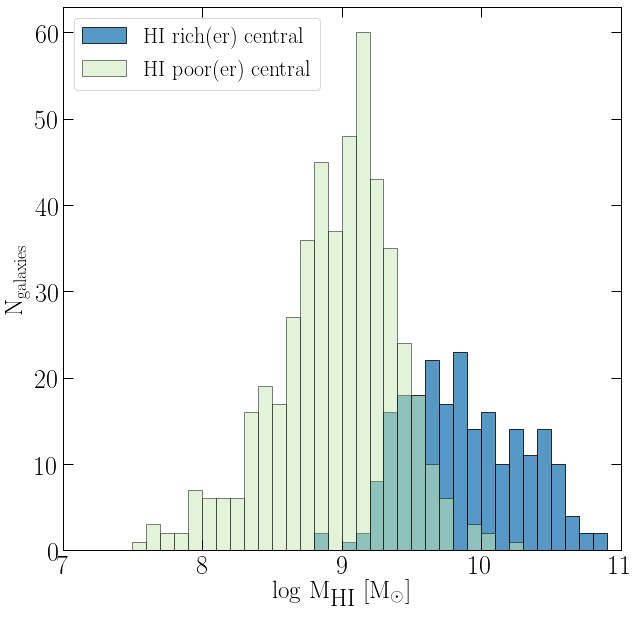

In [58]:
fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

binwidth=0.1
bins = np.arange(7.5, 11 + binwidth, binwidth)
    
#axHistx.hist(x_data, bins=bins, color=color,alpha=0.8, edgecolor='k', linewidth=1)
#axHisty.hist(y_data, bins=bins, orientation='horizontal', color=color, alpha=0.8, edgecolor='k', linewidth=1) 

plt.hist(richer_central_hi_m, bins=bins, color='#2c7fb8', edgecolor='k', linewidth=1, alpha=0.8, label='HI rich(er) central')
plt.hist(poorer_central_hi_m, bins=bins, color='#c7e9b4', edgecolor='k', linewidth=1, alpha=0.5, label='HI poor(er) central')

ax.set_ylabel(r'N$_{\mathrm{galaxies}}$', fontsize=25)
ax.set_xlabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

plt.xlim(7,11)
plt.legend(loc=2)
plt.show()

In [59]:
@jit
def two_sided_histogram_rich(x_cen_rich, y_cen_rich, x_cen_poor, y_cen_poor):
    """
    Make a scatter plot with 2 datasets and then place histogram on both x and y axis for them. 
    Here I use logMhi vesus logMstar -- other data will need readjustment of the min/max.
    
    Parameters
    ==========
    x_cen_rich, y_cen_rich: x and y values of the first dataset. Floats. Can be list/array. 
                  In this case, I am using logMHI and logMstar of central galaxies.
    
    x_cen_poor, y_cen_poor: x and y values of the second dataset. Floats. Can be list/array. 
                  In this case, I am using logMHI and logMstar of satellite galaxies.                        
        
    color : Boolean. Chose color in case you want differen one. If not specified, will be the default one for satellites.
            Use different color in case there is only one dataset, for exaple:
            two_sided_histogram_groups(x, y, [], [], 'grey')
    
    
    Returns
    =======
    A scatter plot with histogram on x and y axis for both datasets. 
    
    Usage
    =====
    To use type: ``two_sided_histogram_groups(x_cen, y_cen, x_sat, y_sat)``
               I extracted satellite and central gal from dictionary using ``updated_dict`` and 
               group_size=2 for pairs -- can be any group_size number
               
               I extracted satellite and central gal from dictionary using ``updated_dict`` and 
               group_size=2 for pairs -- can be any group_size number
                
               Indices:
               central_idx = updated_dict[3]["Groups"][group_key]["Centrals"]
               satellite_inds = updated_dict[3]["Groups"][group_key]["Satellites"]
                
               To this, condition is added which check the mass of the central vs. satellites.
    """

    
    nullfmt = NullFormatter()         # no labels
    
    # definitions for the axes
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    bottom_h = left_h = left + width + 0.02
    
    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.2]
    rect_histy = [left_h, bottom, 0.2, height]
    
    # start with a rectangular Figure
    plt.figure(1, figsize=(12, 12))
    
    axScatter = plt.axes(rect_scatter)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)
    
    # no labels
    axHistx.xaxis.set_major_formatter(nullfmt)
    axHisty.yaxis.set_major_formatter(nullfmt)
    
    # the scatter plot:
    axScatter.scatter(x_cen_rich, y_cen_rich, color='#2c7fb8', label='HI rich(er) central')
    axScatter.scatter(x_cen_poor, y_cen_poor, color='#c7e9b4', label='HI poor(er) central', alpha=0.8)
    
    axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    axScatter.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

    # now determine nice limits by hand:
    binwidth = 0.1
    xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(x))])
    lim = (int(xymax/binwidth) + 1) * binwidth
    
    axScatter.set_xlim((8.5, 11.7))
    axScatter.set_ylim((5.8, 11.7))
    
    bins = np.arange(5.8, lim + binwidth, binwidth)
    axHistx.hist(x_cen_rich, bins=bins, color='#2c7fb8', alpha=0.6, edgecolor='k', linewidth=1)
    axHisty.hist(y_cen_rich, bins=bins, orientation='horizontal', alpha=0.6, color='#2c7fb8', edgecolor='k', linewidth=1)
    
    axHistx.hist(x_cen_poor, bins=bins, color='#c7e9b4',alpha=0.4, edgecolor='k', linewidth=1)
    axHisty.hist(y_cen_poor, bins=bins, orientation='horizontal', color='#c7e9b4', alpha=0.4, edgecolor='k', linewidth=1) 

    axHistx.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=22)
    axHisty.set_xlabel(r'N$_{\textrm{gal}}$', fontsize=22)
    
    axHistx.set_xlim(axScatter.get_xlim())
    axHisty.set_ylim(axScatter.get_ylim())

    axScatter.legend(loc=3)


    return plt.show()
    

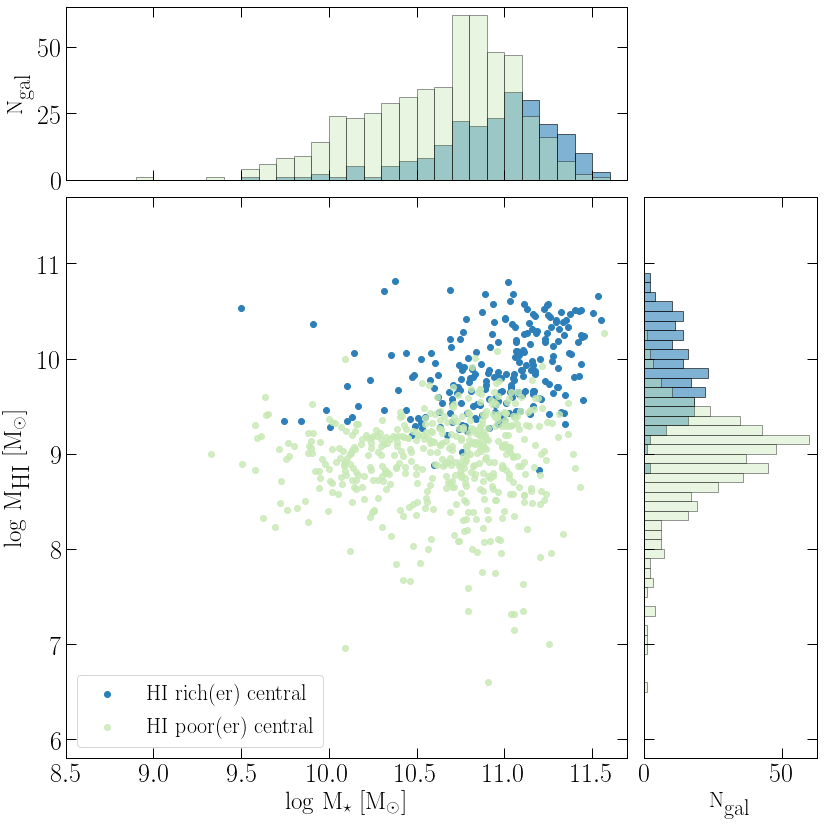

In [60]:
#Centrals more HI rich than the sum of their satellites
two_sided_histogram_rich(richer_central_s_m, richer_central_hi_m, poorer_central_s_m, poorer_central_hi_m) 

In [61]:
@jit
def two_sided_histogram_rich_groups(x_cen_rich, y_cen_rich, x_cen_poor, y_cen_poor,
                                   x_sat_rich, y_sat_rich, x_sat_poor, y_sat_poor):
    """
    Make a scatter plot with 8 datasets and then place histogram on both x and y axis for them as rich/poor central groups. 
    Here I use logMhi vesus logMstar -- other data will need readjustment of the min/max.
    
    Parameters
    ==========
    x_cen_rich, y_cen_rich: x and y values of the first dataset - here are centrals which are HI richer than their
                            satellites. Floats. Should be list/array; use .ravel() if needed
                            to reduce the dimensionality.  
                            In this case, I am using logMHI and logMstar of central galaxies.
    
    x_cen_poor, y_cen_poor: x and y values of the second dataset - here are centrals which are poorer than their
                            satellites. Should be list/array; use .ravel() if needed to reduce the dimensionality.
                            In this case, I am using logMHI and logMstar of satellite galaxies.                        
        
    x_sat_rich, y_sat_rich, x_sat_poor, y_sat_poor:
                            Same as above; just uses satellites around their respective central galaxy.
    
    Returns
    =======
    A scatter plot with histogram on x and y axis for both datasets. 
    
    Usage
    =====
    To use type: ``two_sided_histogram_rich_groups(richer_central_s_m.ravel(), richer_central_hi_m.ravel(), poorer_central_s_m.ravel(), poorer_central_hi_m.ravel(),
                                richer_sat_s_m.ravel(), richer_sat_hi_m.ravel(), poorer_sat_s_m.ravel(), poorer_sat_hi_m.ravel()) 
``
               I extracted satellite and central gal from dictionary using ``updated_dict`` and 
               group_size=2 for pairs -- can be any group_size number
                Indices:
                central_idx = updated_dict[3]["Groups"][group_key]["Centrals"]
                satellite_inds = updated_dict[3]["Groups"][group_key]["Satellites"]
                
                To this, condition is added which check the mass of the central vs. satellites.
                
                
    """

    
    nullfmt = NullFormatter()         # no labels
    
    # definitions for the axes
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    bottom_h = left_h = left + width + 0.02
    
    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.2]
    rect_histy = [left_h, bottom, 0.2, height]
    
    # start with a rectangular Figure
    plt.figure(1, figsize=(12, 12))
    
    axScatter = plt.axes(rect_scatter)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)
    
    # no labels
    axHistx.xaxis.set_major_formatter(nullfmt)
    axHisty.yaxis.set_major_formatter(nullfmt)
    
    # the scatter plot:
    axScatter.scatter(x_cen_rich, y_cen_rich, color='white', edgecolor='#2c7fb8', s=80, linewidth=2, label='HI rich(er) central')
    axScatter.scatter(x_sat_rich, y_sat_rich, color='#2c7fb8', edgecolor='#2c7fb8', s=80, linewidth=2, label='HI rich(er) central\'s satellite')

    axScatter.scatter(x_cen_poor, y_cen_poor, color='white', edgecolor='lightgrey', s=80, linewidth=2, label='HI poor(er) central', alpha=0.8)
    axScatter.scatter(x_sat_poor, y_sat_poor, color='lightgrey', edgecolor='lightgrey', s=80, linewidth=2, label='HI poor(er) central\'s satellite', alpha=0.8, zorder=-10)
    
    
    axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    axScatter.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

    # now determine nice limits by hand:
    binwidth = 0.1
    xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(x))])
    lim = (int(xymax/binwidth) + 1) * binwidth
    
    axScatter.set_xlim((8.5, 11.7))
    axScatter.set_ylim((5.8, 11.7))
    
    bins = np.arange(5.8, lim + binwidth, binwidth)
    
    
    x_rich = sorted(list(set(x_cen_rich)) + list(set(x_sat_rich)))
    y_rich = sorted(list(set(y_cen_rich)) + list(set(y_sat_rich)))
    
    x_poor = sorted(list(set(x_cen_poor)) + list(set(x_sat_poor)))
    y_poor = sorted(list(set(y_cen_poor)) + list(set(y_sat_poor)))
    
    axHistx.hist(x_rich, bins=bins, color='#2c7fb8', alpha=0.6, edgecolor='k', linewidth=1)
    axHisty.hist(y_rich, bins=bins, orientation='horizontal', alpha=0.6, color='#2c7fb8', edgecolor='k', linewidth=1)
    
    axHistx.hist(x_poor, bins=bins, color='lightgrey',alpha=0.4, edgecolor='k', linewidth=1)
    axHisty.hist(y_poor, bins=bins, orientation='horizontal', color='lightgrey', alpha=0.4, edgecolor='k', linewidth=1) 

    axHistx.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=22)
    axHisty.set_xlabel(r'N$_{\textrm{gal}}$', fontsize=22)
    
    axHistx.set_xlim(axScatter.get_xlim())
    axHisty.set_ylim(axScatter.get_ylim())

    axScatter.legend(loc=3, fontsize=13)


    return plt.show()
    

In [62]:
@jit
def two_sided_histogram_difference(x_cen_rich, y_cen_rich, x_cen_poor, y_cen_poor,
                                   x_sat_rich, y_sat_rich, x_sat_poor, y_sat_poor):
    """
    Make a scatter plot with 8 datasets and then place histogram on both x and y axis for them
    Here plot groups with small difference in stellar mass but large in HI mass between cen/sat. 
    Here I use logMhi vesus logMstar -- other data will need readjustment of the min/max.
    
    Parameters
    ==========
    x_cen_rich, y_cen_rich: x and y values of the first dataset - here are centrals with small Mstar diff and large
                            Mhi difference. Floats. Should be list/array; use .ravel() if needed
                            to reduce the dimensionality.  
                            In this case, I am using logMHI and logMstar of central galaxies.
    
    x_cen_poor, y_cen_poor: x and y values of the second dataset - other/normal groups. 
                            Should be list/array; use .ravel() if needed to reduce the dimensionality.
                            In this case, I am using logMHI and logMstar of satellite galaxies.                        
        
    x_sat_rich, y_sat_rich, x_sat_poor, y_sat_poor:
                            Same as above; just uses satellites around their respective central galaxy.
    
    Returns
    =======
    A scatter plot with histogram on x and y axis for both datasets. 
    
    Usage
    =====
    To use type: ``two_sided_histogram_rich_groups(richer_central_s_m.ravel(), richer_central_hi_m.ravel(), poorer_central_s_m.ravel(), poorer_central_hi_m.ravel(),
                                richer_sat_s_m.ravel(), richer_sat_hi_m.ravel(), poorer_sat_s_m.ravel(), poorer_sat_hi_m.ravel()) 
``
               I extracted satellite and central gal from dictionary using ``updated_dict`` and 
               group_size=2 for pairs -- can be any group_size number
                Indices:
                central_idx = updated_dict[3]["Groups"][group_key]["Centrals"]
                satellite_inds = updated_dict[3]["Groups"][group_key]["Satellites"]
                
                To this, condition is added which check the mass of the central vs. satellites.
                
                
    """

    
    nullfmt = NullFormatter()         # no labels
    
    # definitions for the axes
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    bottom_h = left_h = left + width + 0.02
    
    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.2]
    rect_histy = [left_h, bottom, 0.2, height]
    
    # start with a rectangular Figure
    plt.figure(1, figsize=(12, 12))
    
    axScatter = plt.axes(rect_scatter)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)
    
    # no labels
    axHistx.xaxis.set_major_formatter(nullfmt)
    axHisty.yaxis.set_major_formatter(nullfmt)
    
    # the scatter plot:

    axScatter.scatter(x_cen_poor, y_cen_poor, color='white', edgecolor='lightgrey', s=80, linewidth=2, label='Other central', alpha=0.8)
    axScatter.scatter(x_sat_poor, y_sat_poor, color='lightgrey', edgecolor='lightgrey', s=80, linewidth=2, label='Other central\'s satellite', alpha=0.8)

    axScatter.scatter(x_cen_rich, y_cen_rich, color='white', edgecolor='#2c7fb8', s=80, linewidth=2, label='Large diff central')
    axScatter.scatter(x_sat_rich, y_sat_rich, color='#2c7fb8', edgecolor='#2c7fb8', s=80, linewidth=2, label='Large diff central\'s satellite')

    
    axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    axScatter.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

    # now determine nice limits by hand:
    binwidth = 0.1
    xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(x))])
    lim = (int(xymax/binwidth) + 1) * binwidth
    
    axScatter.set_xlim((8.5, 11.7))
    axScatter.set_ylim((5.8, 11.7))
    
    bins = np.arange(5.8, lim + binwidth, binwidth)
    
    
    x_rich = sorted(list(set(x_cen_rich)) + list(set(x_sat_rich)))
    y_rich = sorted(list(set(y_cen_rich)) + list(set(y_sat_rich)))
    
    x_poor = sorted(list(set(x_cen_poor)) + list(set(x_sat_poor)))
    y_poor = sorted(list(set(y_cen_poor)) + list(set(y_sat_poor)))
    
    axHistx.hist(x_rich, bins=bins, color='#2c7fb8', alpha=0.6, edgecolor='k', linewidth=1)
    axHisty.hist(y_rich, bins=bins, orientation='horizontal', alpha=0.6, color='#2c7fb8', edgecolor='k', linewidth=1)
    
    axHistx.hist(x_poor, bins=bins, color='lightgrey',alpha=0.4, edgecolor='k', linewidth=1)
    axHisty.hist(y_poor, bins=bins, orientation='horizontal', color='lightgrey', alpha=0.4, edgecolor='k', linewidth=1) 

    axHistx.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=22)
    axHisty.set_xlabel(r'N$_{\textrm{gal}}$', fontsize=22)
    
    axHistx.set_xlim(axScatter.get_xlim())
    axHisty.set_ylim(axScatter.get_ylim())

    axScatter.legend(loc=3, fontsize=13)


    return plt.show()
    

In [63]:
@jit
def two_sided_histogram_difference_groups(x_cen_rich, y_cen_rich, x_cen_poor, y_cen_poor,
                                   x_sat_rich, y_sat_rich, x_sat_poor, y_sat_poor,
                                  x_group, y_group):
    """
    Make a scatter plot with 8 datasets and then place histogram on both x and y axis for them
    Here plot groups with small difference in stellar mass but large in HI mass between cen/sat. 
    Here I use logMhi vesus logMstar -- other data will need readjustment of the min/max.
    
    Parameters
    ==========
    x_cen_rich, y_cen_rich: x and y values of the first dataset - here are centrals with small Mstar diff and large
                            Mhi difference. Floats. Should be list/array; use .ravel() if needed
                            to reduce the dimensionality.  
                            In this case, I am using logMHI and logMstar of central galaxies.
    
    x_cen_poor, y_cen_poor: x and y values of the second dataset - other/normal groups. 
                            Should be list/array; use .ravel() if needed to reduce the dimensionality.
                            In this case, I am using logMHI and logMstar of satellite galaxies.                        
        
    x_sat_rich, y_sat_rich, x_sat_poor, y_sat_poor:
                            Same as above; just uses satellites around their respective central galaxy.
    
    Returns
    =======
    A scatter plot with histogram on x and y axis for both datasets. 
    
    Usage
    =====
    To use type: ``two_sided_histogram_rich_groups(richer_central_s_m.ravel(), richer_central_hi_m.ravel(), poorer_central_s_m.ravel(), poorer_central_hi_m.ravel(),
                                richer_sat_s_m.ravel(), richer_sat_hi_m.ravel(), poorer_sat_s_m.ravel(), poorer_sat_hi_m.ravel()) 
``
               I extracted satellite and central gal from dictionary using ``updated_dict`` and 
               group_size=2 for pairs -- can be any group_size number
                Indices:
                central_idx = updated_dict[3]["Groups"][group_key]["Centrals"]
                satellite_inds = updated_dict[3]["Groups"][group_key]["Satellites"]
                
                To this, condition is added which check the mass of the central vs. satellites.
                
                
    """

    
    nullfmt = NullFormatter()         # no labels
    
    # definitions for the axes
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    bottom_h = left_h = left + width + 0.02
    
    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.2]
    rect_histy = [left_h, bottom, 0.2, height]
    
    # start with a rectangular Figure
    plt.figure(1, figsize=(12, 12))
    
    axScatter = plt.axes(rect_scatter)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)
    
    # no labels
    axHistx.xaxis.set_major_formatter(nullfmt)
    axHisty.yaxis.set_major_formatter(nullfmt)
    
    # the scatter plot:
        
    axScatter.scatter(x_cen_poor, y_cen_poor, color='white', edgecolor='lightgrey', s=80, linewidth=2, label='Other central', alpha=0.6)
    axScatter.scatter(x_sat_poor, y_sat_poor, color='lightgrey', edgecolor='lightgrey', s=80, linewidth=2, label='Other central\'s satellite', alpha=0.6)
   
    
    axScatter.scatter(x_cen_rich, y_cen_rich, color='white', edgecolor='#2c7fb8', s=80, linewidth=2, label='Large diff central')
    axScatter.scatter(x_sat_rich, y_sat_rich, color='#2c7fb8', edgecolor='#2c7fb8', s=80, linewidth=2, label='Large diff central\'s satellite')

    #MARK THE RICH ONES
    markers = itertools.cycle(('o', 'o', 'o', 's', 's', 's','D', 'D', 'D','p', 'p', 'p', 'd', 'd', 'd',
                             'P', 'P', 'P', '*', '*', '*','<', '<', '<','v', 'v', 'v', '^', '^', '^',
                              'x', 'x', 'x')) 
 
    #col = matplotlib.cm.viridis(np.linspace(0, 1, len(x_group)))
    #colors = itertools.cycle(col)
    
    for i in range(0,len(x_group),1):
        axScatter.scatter(x_group[i],y_group[i], marker = next(markers), color = '',edgecolor='k', s=400)
        
    #marker = itertools.cycle(('o', 's', 'p', 'P', '*', 'h', 'D', 'd'))
    #axScatter.scatter(x_group, y_group, color='#fa9fb5', marker=next(marker), s=250, label='Groups', alpha=0.8)
    #print(len(x_group)) == 15 
    #print(len(x_group[1]))
    
    axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    axScatter.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

    # now determine nice limits by hand:
    binwidth = 0.1
    xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(x))])
    lim = (int(xymax/binwidth) + 1) * binwidth
    
    axScatter.set_xlim((8.5, 11.7))
    axScatter.set_ylim((5.8, 11.7))
    
    bins = np.arange(5.8, lim + binwidth, binwidth)
    
    
    x_rich = sorted(list(set(x_cen_rich)) + list(set(x_sat_rich)))
    y_rich = sorted(list(set(y_cen_rich)) + list(set(y_sat_rich)))
    
    x_poor = sorted(list(set(x_cen_poor)) + list(set(x_sat_poor)))
    y_poor = sorted(list(set(y_cen_poor)) + list(set(y_sat_poor)))
    
    axHistx.hist(x_rich, bins=bins, color='#2c7fb8', alpha=0.6, edgecolor='k', linewidth=1)
    axHisty.hist(y_rich, bins=bins, orientation='horizontal', alpha=0.6, color='#2c7fb8', edgecolor='k', linewidth=1)
    
    axHistx.hist(x_poor, bins=bins, color='lightgrey',alpha=0.4, edgecolor='k', linewidth=1)
    axHisty.hist(y_poor, bins=bins, orientation='horizontal', color='lightgrey', alpha=0.4, edgecolor='k', linewidth=1) 

    axHistx.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=22)
    axHisty.set_xlabel(r'N$_{\textrm{gal}}$', fontsize=22)
    
    axHistx.set_xlim(axScatter.get_xlim())
    axHisty.set_ylim(axScatter.get_ylim())

    axScatter.legend(loc=3, fontsize=13)


    return plt.show()
    

## Groups Length-3

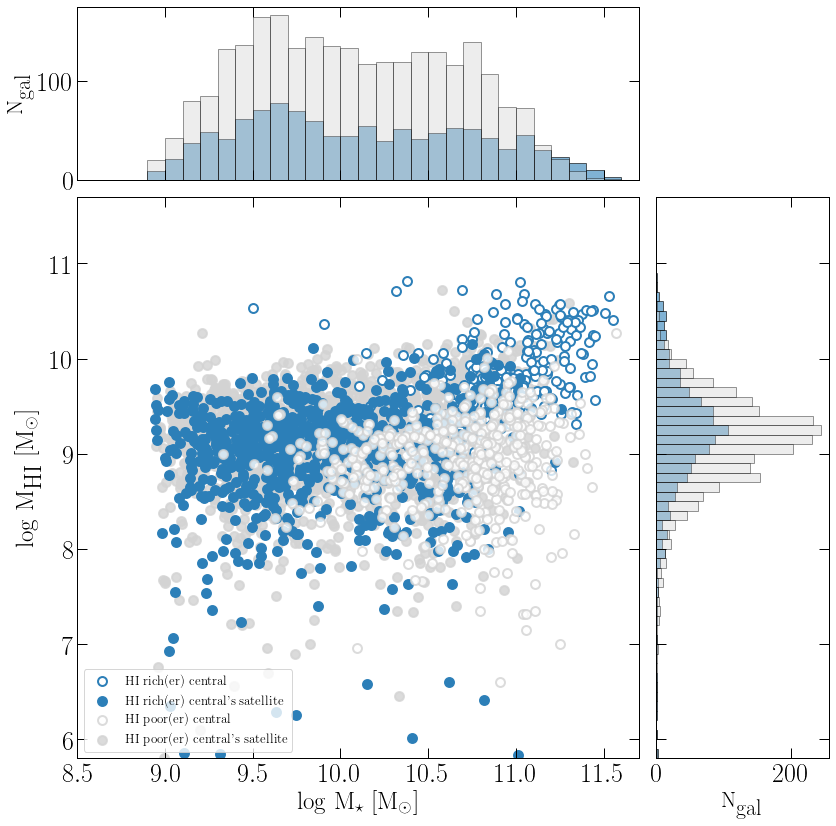

In [64]:
# Central gals which are more HI rich than the sum of their satellites --- also marks position of their satellites
# And vice versa
two_sided_histogram_rich_groups(richer_central_s_m.ravel(), richer_central_hi_m.ravel(), poorer_central_s_m.ravel(), poorer_central_hi_m.ravel(),
                                richer_sat_s_m.ravel(), richer_sat_hi_m.ravel(), poorer_sat_s_m.ravel(), poorer_sat_hi_m.ravel()) 


# Extract rich(er) and poor(er) from all size-d groups

In [65]:
#Use dictionary and for each galaxy in "Groups" of 3 show central/satellite index

all_richer_central_ind = []
all_poorer_central_ind = []

all_richer_sat_ind = [] #satellites that belong to richer central
all_poorer_sat_ind = [] #satellites that belong to poorer central

for i in trange(3,10,1): #starting grom galaxy pairs
    for group_key in updated_dict[i]["Groups"].keys():
        central_idx = updated_dict[i]["Groups"][group_key]["Centrals"] #give indices
        central_mass = np.sum(G['DiscHI'],axis=1)[central_idx] #give masses of these galaxies
    
        satellite_inds = updated_dict[i]["Groups"][group_key]["Satellites"]
        sat_mass = np.sum(G['DiscHI'],axis=1)[satellite_inds]
    
        if (central_mass > sat_mass).all(): #check conditions
            print("Central is the most HI massive")
            all_richer_central_ind.append(central_idx) 
            all_richer_sat_ind.extend(satellite_inds) #it complains and complicates when i want to do .append
        else:
            print("Satellite is more HI massive thatn central")
            all_poorer_central_ind.append(central_idx)
            all_poorer_sat_ind.extend(satellite_inds)
        #print(sat_mass > central_mass)
    
        print("Central mass is {0} and sat masses are {1}".format(central_mass, sat_mass))
        print("")


  0%|          | 0/7 [00:00<?, ?it/s]

Satellite is more HI massive thatn central
Central mass is [0.07457463] and sat masses are [0.3159631  0.33624956]

Satellite is more HI massive thatn central
Central mass is [0.06724518] and sat masses are [0.16330373 0.080512  ]

Satellite is more HI massive thatn central
Central mass is [0.04540379] and sat masses are [0.09183761 0.4624423 ]

Satellite is more HI massive thatn central
Central mass is [0.08794619] and sat masses are [0.26002505 0.10029811]

Satellite is more HI massive thatn central
Central mass is [0.06030489] and sat masses are [0.09074341 0.01999057]

Central is the most HI massive
Central mass is [0.10222007] and sat masses are [0.03954664 0.0552886 ]

Satellite is more HI massive thatn central
Central mass is [0.00778264] and sat masses are [0.05437473 0.13071506]

Satellite is more HI massive thatn central
Central mass is [0.03629047] and sat masses are [0.1584476  0.23075162]

Satellite is more HI massive thatn central
Central mass is [0.10192867] and sat mass

Satellite is more HI massive thatn central
Central mass is [0.01334302] and sat masses are [0.03114055 0.1741062 ]

Satellite is more HI massive thatn central
Central mass is [0.04778019] and sat masses are [0.02766829 0.1287932 ]

Central is the most HI massive
Central mass is [0.9357466] and sat masses are [0.03396578 0.06668664]

Central is the most HI massive
Central mass is [0.9141131] and sat masses are [0.09099633 0.07544146]

Central is the most HI massive
Central mass is [1.1490215] and sat masses are [0.         0.01923379]

Central is the most HI massive
Central mass is [0.93481874] and sat masses are [0.19482279 0.14179686]

Satellite is more HI massive thatn central
Central mass is [0.04442176] and sat masses are [0.04896715 0.23105824]

Central is the most HI massive
Central mass is [1.0104688] and sat masses are [0.2799465  0.10105802]

Central is the most HI massive
Central mass is [0.31836265] and sat masses are [0.18875004 0.25746673]

Satellite is more HI massive tha

Central mass is [0.07235341] and sat masses are [0.1254785  0.05124778]

Satellite is more HI massive thatn central
Central mass is [0.02062676] and sat masses are [0.00316048 0.22015092]

Central is the most HI massive
Central mass is [1.0276691] and sat masses are [0.02025818 0.73946744]

Satellite is more HI massive thatn central
Central mass is [0.07134634] and sat masses are [0.28671926 0.03311625]

Central is the most HI massive
Central mass is [0.60782045] and sat masses are [0.4852842  0.19355334]

Central is the most HI massive
Central mass is [0.8977232] and sat masses are [0.2289938  0.14086705]

Satellite is more HI massive thatn central
Central mass is [0.04639842] and sat masses are [0.15638307 0.09899509]

Satellite is more HI massive thatn central
Central mass is [0.0612787] and sat masses are [0.0982517  0.17236252]

Satellite is more HI massive thatn central
Central mass is [0.00405991] and sat masses are [0.05824836 0.22057876]

Satellite is more HI massive thatn cen

Central is the most HI massive
Central mass is [0.6896133] and sat masses are [0.05412668 0.06430798]

Satellite is more HI massive thatn central
Central mass is [0.11841337] and sat masses are [0.         0.21188231]

Central is the most HI massive
Central mass is [0.48411775] and sat masses are [0.07519637 0.18591417]

Satellite is more HI massive thatn central
Central mass is [0.04288542] and sat masses are [0.35756445 0.06233578]

Satellite is more HI massive thatn central
Central mass is [0.14548184] and sat masses are [0.08706545 0.2507125 ]

Central is the most HI massive
Central mass is [0.2649882] and sat masses are [0.10527115 0.16143051]

Satellite is more HI massive thatn central
Central mass is [0.03980672] and sat masses are [0.19069743 0.01568075]

Satellite is more HI massive thatn central
Central mass is [0.05831818] and sat masses are [0.2931157 0.45203  ]

Satellite is more HI massive thatn central
Central mass is [0.07871296] and sat masses are [0.01232625 0.0931826

Satellite is more HI massive thatn central
Central mass is [0.06708535] and sat masses are [0.01454359 0.0892626 ]

Satellite is more HI massive thatn central
Central mass is [0.0146896] and sat masses are [0.38396025 0.05052441]

Central is the most HI massive
Central mass is [0.0349042] and sat masses are [0.02833525 0.01977043]

Satellite is more HI massive thatn central
Central mass is [0.02576197] and sat masses are [0.104785   0.20639901]

Satellite is more HI massive thatn central
Central mass is [0.10129005] and sat masses are [0.9044826 0.0171718]

Satellite is more HI massive thatn central
Central mass is [0.08229368] and sat masses are [0.2144777 0.0037137]

Central is the most HI massive
Central mass is [0.803319] and sat masses are [0.12788266 0.23011795]

Satellite is more HI massive thatn central
Central mass is [0.00140825] and sat masses are [0.18015678 0.56953824]

Central is the most HI massive
Central mass is [0.2805814] and sat masses are [0.18912178 0.08507326]

S

Satellite is more HI massive thatn central
Central mass is [0.02892593] and sat masses are [0.10943451 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.07431974] and sat masses are [0.14970547 0.23304634]

Central is the most HI massive
Central mass is [0.2512664] and sat masses are [0.07354944 0.16653398]

Central is the most HI massive
Central mass is [1.2697539] and sat masses are [0.02622236 0.09989425]

Central is the most HI massive
Central mass is [0.5736383] and sat masses are [0.10268205 0.00906891]

Satellite is more HI massive thatn central
Central mass is [0.11026262] and sat masses are [0.13572085 0.08752946]

Satellite is more HI massive thatn central
Central mass is [0.03410772] and sat masses are [1.0682355  0.04851537]

Central is the most HI massive
Central mass is [0.7184904] and sat masses are [0.2758784  0.08370012]

Satellite is more HI massive thatn central
Central mass is [0.19954655] and sat masses are [0.20175919 0.06927472]

Central 

Central mass is [0.00519576] and sat masses are [0.21716991 0.03922233]

Satellite is more HI massive thatn central
Central mass is [0.10754373] and sat masses are [0.31723285 0.04470255]

Central is the most HI massive
Central mass is [0.5247882] and sat masses are [0.08255777 0.02934158]

Central is the most HI massive
Central mass is [0.12495357] and sat masses are [0.05257658 0.06672906]

Satellite is more HI massive thatn central
Central mass is [0.10935669] and sat masses are [0.02675145 0.6540878 ]

Central is the most HI massive
Central mass is [0.3367135] and sat masses are [0.12445968 0.11395064]

Central is the most HI massive
Central mass is [0.22787905] and sat masses are [0.04580827 0.08123232]

Satellite is more HI massive thatn central
Central mass is [0.01278058] and sat masses are [0.1132036  0.09550255]

Satellite is more HI massive thatn central
Central mass is [0.02463776] and sat masses are [0.06475064 0.08583792]

Satellite is more HI massive thatn central
Centra

Satellite is more HI massive thatn central
Central mass is [0.01556583] and sat masses are [0.13526627 0.30721304]

Central is the most HI massive
Central mass is [1.5219041] and sat masses are [0.0398563  0.38425282]

Satellite is more HI massive thatn central
Central mass is [0.02843077] and sat masses are [0.0824272 0.3360045]

Satellite is more HI massive thatn central
Central mass is [0.0824315] and sat masses are [0.10490681 0.06145091]

Satellite is more HI massive thatn central
Central mass is [0.02172145] and sat masses are [0.32160693 0.09354973]

Satellite is more HI massive thatn central
Central mass is [0.0317699] and sat masses are [0.10391807 0.09683637]

Satellite is more HI massive thatn central
Central mass is [0.10411321] and sat masses are [0.25464907 0.00509598]

Satellite is more HI massive thatn central
Central mass is [0.02037] and sat masses are [0.33003438 0.0390923 ]

Satellite is more HI massive thatn central
Central mass is [0.24102055] and sat masses are [

Satellite is more HI massive thatn central
Central mass is [0.0090111] and sat masses are [0.11328034 0.11615796]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.21946983 0.22552924]

Central is the most HI massive
Central mass is [1.2325499] and sat masses are [0.4487251  0.22850409]

Central is the most HI massive
Central mass is [0.5485754] and sat masses are [0.02009704 0.09682947]

Central is the most HI massive
Central mass is [0.4332062] and sat masses are [0.06343796 0.02695532]

Satellite is more HI massive thatn central
Central mass is [0.05566956] and sat masses are [1.050674   0.19159032]

Satellite is more HI massive thatn central
Central mass is [0.03470191] and sat masses are [0.09080712 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.08882484 0.48820123]

Satellite is more HI massive thatn central
Central mass is [0.01794348] and sat masses are [0.45783514 0.04110766]

Central is t

Satellite is more HI massive thatn central
Central mass is [0.07513401] and sat masses are [0.        0.0896256]

Central is the most HI massive
Central mass is [0.15489252] and sat masses are [0.13475236 0.13058364]

Satellite is more HI massive thatn central
Central mass is [0.09561338] and sat masses are [0.13463187 0.10621233]

Central is the most HI massive
Central mass is [0.11130159] and sat masses are [0.02986183 0.0792053 ]

Central is the most HI massive
Central mass is [0.5842825] and sat masses are [0.07277882 0.11495501]

Satellite is more HI massive thatn central
Central mass is [0.040893] and sat masses are [0.20623057 0.1486036 ]

Satellite is more HI massive thatn central
Central mass is [0.04205609] and sat masses are [0.6224621  0.02758658]

Central is the most HI massive
Central mass is [0.09177223] and sat masses are [0.06531875 0.08323389]

Central is the most HI massive
Central mass is [0.08636459] and sat masses are [0.04440074 0.00761466]

Satellite is more HI 

Satellite is more HI massive thatn central
Central mass is [0.1104838] and sat masses are [0.07337388 0.15386792]

Satellite is more HI massive thatn central
Central mass is [0.0155898] and sat masses are [0.08168531 0.3980677 ]

Satellite is more HI massive thatn central
Central mass is [0.11240102] and sat masses are [0.19141446 0.13071664]

Satellite is more HI massive thatn central
Central mass is [0.10692433] and sat masses are [0.06389694 0.1487245 ]

Central is the most HI massive
Central mass is [0.22530316] and sat masses are [0.21071462 0.12953268]

Satellite is more HI massive thatn central
Central mass is [0.03137433] and sat masses are [0.21675211 0.12399868]

Central is the most HI massive
Central mass is [0.51721793] and sat masses are [0.08112576 0.14588873]

Satellite is more HI massive thatn central
Central mass is [0.05276503] and sat masses are [0.51046526 0.22366235]

Satellite is more HI massive thatn central
Central mass is [0.06804986] and sat masses are [0.0137

Central is the most HI massive
Central mass is [0.07553169] and sat masses are [0.04572847 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.03252289] and sat masses are [0.17153011 0.09390156]

Central is the most HI massive
Central mass is [0.64733815] and sat masses are [0.05086984 0.11212747]

Satellite is more HI massive thatn central
Central mass is [0.06589531] and sat masses are [0.17354283 0.0772419 ]

Central is the most HI massive
Central mass is [0.57419753] and sat masses are [0.12481536 0.30052394]

Satellite is more HI massive thatn central
Central mass is [0.02903388] and sat masses are [0.18388985 0.12315236]

Satellite is more HI massive thatn central
Central mass is [0.15106931] and sat masses are [0.23105803 0.03389683]

Satellite is more HI massive thatn central
Central mass is [0.06107658] and sat masses are [0.09956855 0.03890257]

Central is the most HI massive
Central mass is [0.41981804] and sat masses are [0.07059251 0.09202172]

Sate

Central is the most HI massive
Central mass is [0.38891804] and sat masses are [0.09589799 0.02048901]

Satellite is more HI massive thatn central
Central mass is [0.30886358] and sat masses are [0.11979541 0.40237045]

Satellite is more HI massive thatn central
Central mass is [0.20795779] and sat masses are [0.01757156 0.50844353]

Central is the most HI massive
Central mass is [0.25906098] and sat masses are [0.11881328 0.0454175 ]

Satellite is more HI massive thatn central
Central mass is [0.05748687] and sat masses are [0.13653357 0.02486331]

Satellite is more HI massive thatn central
Central mass is [0.05359857] and sat masses are [0.08509025 0.46997297]

Central is the most HI massive
Central mass is [1.1336195] and sat masses are [0.         0.04440651]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.00327036 0.3887883 ]

Satellite is more HI massive thatn central
Central mass is [0.0531074] and sat masses are [0.10185765 0.        ]

Ce

Satellite is more HI massive thatn central
Central mass is [0.08719398] and sat masses are [0.09221774 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.04588151] and sat masses are [0.0247083 0.2755298]

Satellite is more HI massive thatn central
Central mass is [0.08375374] and sat masses are [0.18464985 0.15161511]

Satellite is more HI massive thatn central
Central mass is [0.10536472] and sat masses are [0.25846875 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.06044327] and sat masses are [0.00116768 0.18977183]

Satellite is more HI massive thatn central
Central mass is [0.06450273] and sat masses are [0.11484368 0.04234084]

Satellite is more HI massive thatn central
Central mass is [0.04938406] and sat masses are [0.0270723  0.13107239]

Central is the most HI massive
Central mass is [0.73804045] and sat masses are [0.01729761 0.12702054]

Satellite is more HI massive thatn central
Central mass is [0.011954] and sat masses a

Satellite is more HI massive thatn central
Central mass is [0.02587815] and sat masses are [0.02095583 0.06796775]

Central is the most HI massive
Central mass is [2.525176] and sat masses are [0.6737037  0.40449065]

Satellite is more HI massive thatn central
Central mass is [0.1428367] and sat masses are [0.31517932 0.16477475]

Satellite is more HI massive thatn central
Central mass is [0.05074757] and sat masses are [0.84584045 0.06487238]

Central is the most HI massive
Central mass is [1.0325458] and sat masses are [0.07320552 0.147507  ]

Satellite is more HI massive thatn central
Central mass is [0.07729382] and sat masses are [0.20992652 0.0276016 ]

Central is the most HI massive
Central mass is [1.1532556] and sat masses are [0.10337225 0.30251402]

Satellite is more HI massive thatn central
Central mass is [0.34752545] and sat masses are [0.6990479  0.23722735]

Satellite is more HI massive thatn central
Central mass is [0.17345014] and sat masses are [0.117939  0.4299427]


Central is the most HI massive
Central mass is [0.16162796] and sat masses are [0.09978762 0.11674599]

Satellite is more HI massive thatn central
Central mass is [0.03687144] and sat masses are [0.4269397  0.16445097]

Satellite is more HI massive thatn central
Central mass is [0.03728329] and sat masses are [0.04069683 0.09779978]

Satellite is more HI massive thatn central
Central mass is [0.15289043] and sat masses are [0.52735025 0.        ]

Central is the most HI massive
Central mass is [0.7350095] and sat masses are [0.16676119 0.16967861]

Satellite is more HI massive thatn central
Central mass is [0.05972619] and sat masses are [0.00150561 0.20227006]

Central is the most HI massive
Central mass is [4.0532217] and sat masses are [0.12360869 0.00040097]

Satellite is more HI massive thatn central
Central mass is [0.02599181] and sat masses are [0.24577147 0.1038892 ]

Satellite is more HI massive thatn central
Central mass is [0.01703253] and sat masses are [0.10846359 0.04619

Satellite is more HI massive thatn central
Central mass is [0.03772876] and sat masses are [0.01180116 0.18036763]

Central is the most HI massive
Central mass is [0.17371346] and sat masses are [1.1886543e-01 3.4985587e-05]

Satellite is more HI massive thatn central
Central mass is [0.06242358] and sat masses are [0.5094889  0.28702256]

Central is the most HI massive
Central mass is [1.8144665] and sat masses are [0.07231056 0.08185841]

Satellite is more HI massive thatn central
Central mass is [0.15259632] and sat masses are [0.0689573  0.17889714]

Satellite is more HI massive thatn central
Central mass is [0.16829096] and sat masses are [0.25467646 0.06037512]

Central is the most HI massive
Central mass is [0.76553255] and sat masses are [0.08542667 0.2205506 ]

Central is the most HI massive
Central mass is [0.09843681] and sat masses are [0.01819338 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.36856833] and sat masses are [0.66981477 0.13343516]


Satellite is more HI massive thatn central
Central mass is [0.11128077] and sat masses are [0.176791   0.20386544]

Satellite is more HI massive thatn central
Central mass is [0.21829255] and sat masses are [0.32618237 0.0908175 ]

Satellite is more HI massive thatn central
Central mass is [0.01866789] and sat masses are [0.02098675 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.16716112] and sat masses are [0.5643363  0.09860557]

Central is the most HI massive
Central mass is [0.6070237] and sat masses are [0.46652794 0.15146743]

Satellite is more HI massive thatn central
Central mass is [0.06643346] and sat masses are [0.23970334 0.10945383]

Central is the most HI massive
Central mass is [0.61243653] and sat masses are [0.03745738 0.00230227]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.01959598 0.10212828]

Satellite is more HI massive thatn central
Central mass is [0.00891832] and sat masses are [0.04217955 0.

Central is the most HI massive
Central mass is [0.28907445] and sat masses are [0.17581588 0.15617874]

Satellite is more HI massive thatn central
Central mass is [0.00817102] and sat masses are [0.02411698 0.11027393]

Satellite is more HI massive thatn central
Central mass is [0.28489667] and sat masses are [0.00269583 0.44124648]

Satellite is more HI massive thatn central
Central mass is [0.11253874] and sat masses are [0.11342324 0.06742565]

Satellite is more HI massive thatn central
Central mass is [0.3592451] and sat masses are [0.06544457 0.5917063 ]

Satellite is more HI massive thatn central
Central mass is [0.04882603] and sat masses are [0.12534173 0.02563665]

Satellite is more HI massive thatn central
Central mass is [0.04426953] and sat masses are [0.27945024 0.5181159 ]

Satellite is more HI massive thatn central
Central mass is [0.16231349] and sat masses are [6.8126537e-05 6.5766114e-01]

Central is the most HI massive
Central mass is [0.4626655] and sat masses are [

Satellite is more HI massive thatn central
Central mass is [0.02810009] and sat masses are [0.05037332 0.28668478]

Central is the most HI massive
Central mass is [0.28093424] and sat masses are [0.01616366 0.08342433]

Satellite is more HI massive thatn central
Central mass is [0.21602118] and sat masses are [0.22541016 0.17529978]

Satellite is more HI massive thatn central
Central mass is [0.14017014] and sat masses are [0.08989752 0.41807604]

Satellite is more HI massive thatn central
Central mass is [0.04514692] and sat masses are [0.3937086  0.10516438]

Satellite is more HI massive thatn central
Central mass is [0.03560029] and sat masses are [0.09997712 0.43620658]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.2716869  0.14356527]

Satellite is more HI massive thatn central
Central mass is [0.03039966] and sat masses are [0.18846107 0.02656674]

Satellite is more HI massive thatn central
Central mass is [0.22408998] and sat masses are [

Satellite is more HI massive thatn central
Central mass is [0.09754211] and sat masses are [0.2216682  0.03205371]

Satellite is more HI massive thatn central
Central mass is [0.25624424] and sat masses are [0.43553632 0.43306568]

Central is the most HI massive
Central mass is [0.5348251] and sat masses are [0.25838694 0.04180809]

Central is the most HI massive
Central mass is [0.5780328] and sat masses are [0.27732164 0.0989568 ]

Central is the most HI massive
Central mass is [0.5396933] and sat masses are [0.18325575 0.13063577]

Satellite is more HI massive thatn central
Central mass is [0.06571638] and sat masses are [0.5422713 0.       ]

Central is the most HI massive
Central mass is [0.09407433] and sat masses are [0.00890363 0.0227947 ]

Satellite is more HI massive thatn central
Central mass is [0.09640134] and sat masses are [0.04469861 0.11362478]

Satellite is more HI massive thatn central
Central mass is [0.06760429] and sat masses are [0.05896998 0.07100725]

Satellite

Satellite is more HI massive thatn central
Central mass is [0.3321138] and sat masses are [0.3680476 0.2162898]

Satellite is more HI massive thatn central
Central mass is [0.16242388] and sat masses are [0.64346343 0.09187482]

Satellite is more HI massive thatn central
Central mass is [0.19588599] and sat masses are [0.56315506 0.04284761]

Central is the most HI massive
Central mass is [0.24346712] and sat masses are [0.1393835  0.08712205]

Satellite is more HI massive thatn central
Central mass is [0.00472851] and sat masses are [0.25062832 0.04162079]

Satellite is more HI massive thatn central
Central mass is [0.02583247] and sat masses are [0.37232614 0.05745677]

Central is the most HI massive
Central mass is [0.07012963] and sat masses are [0.01175564 0.00586968]

Satellite is more HI massive thatn central
Central mass is [0.04885593] and sat masses are [0.01804033 0.10190448]

Central is the most HI massive
Central mass is [1.5104991] and sat masses are [0.08869988 0.0135301

Satellite is more HI massive thatn central
Central mass is [0.03642435] and sat masses are [0.47624376 0.30703118]

Satellite is more HI massive thatn central
Central mass is [0.08268657] and sat masses are [0.71664816 0.11774389]

Satellite is more HI massive thatn central
Central mass is [0.15924284] and sat masses are [0.23154595 0.18989757]

Central is the most HI massive
Central mass is [0.11355349] and sat masses are [0.00099705 0.        ]

Central is the most HI massive
Central mass is [1.2456628] and sat masses are [0.06235514 0.0539187 ]

Satellite is more HI massive thatn central
Central mass is [0.09551081] and sat masses are [0.10591834 0.06777242]

Central is the most HI massive
Central mass is [0.6901024] and sat masses are [0.00103652 0.19199604]

Central is the most HI massive
Central mass is [0.1089953] and sat masses are [0.06166024 0.01209372]

Central is the most HI massive
Central mass is [0.1509468] and sat masses are [0.         0.07972373]

Satellite is more HI

Satellite is more HI massive thatn central
Central mass is [0.0336795] and sat masses are [0.04203092 0.10531387]

Central is the most HI massive
Central mass is [0.14598411] and sat masses are [0.00998392 0.04097082]

Satellite is more HI massive thatn central
Central mass is [0.15891127] and sat masses are [0.12441469 0.42341197]

Central is the most HI massive
Central mass is [0.3477502] and sat masses are [0.2023534  0.22421056]

Satellite is more HI massive thatn central
Central mass is [0.13670376] and sat masses are [0.5025475 0.1594917]

Satellite is more HI massive thatn central
Central mass is [0.07907725] and sat masses are [0.20377478 0.09232329]

Satellite is more HI massive thatn central
Central mass is [0.0770743] and sat masses are [0.0886261  0.03904691]

Satellite is more HI massive thatn central
Central mass is [0.06608614] and sat masses are [0.37741584 0.10420478]

Satellite is more HI massive thatn central
Central mass is [0.00374918] and sat masses are [0.0414709

Satellite is more HI massive thatn central
Central mass is [0.06056883] and sat masses are [0.47869557 0.20677975]

Satellite is more HI massive thatn central
Central mass is [0.24438667] and sat masses are [0.11967508 0.35495925]

Satellite is more HI massive thatn central
Central mass is [0.08963482] and sat masses are [0.11297907 0.19117916]

Satellite is more HI massive thatn central
Central mass is [0.02104645] and sat masses are [0.05853153 0.08173868]

Satellite is more HI massive thatn central
Central mass is [0.0618258] and sat masses are [0.20369974 0.28105968]

Satellite is more HI massive thatn central
Central mass is [0.11812542] and sat masses are [0.68712705 0.21060544]

Satellite is more HI massive thatn central
Central mass is [0.06029896] and sat masses are [0.5595871  0.07224003]

Satellite is more HI massive thatn central
Central mass is [0.10537851] and sat masses are [0.91163164 0.09847167]

Satellite is more HI massive thatn central
Central mass is [0.03014135] a

Central mass is [0.9369684] and sat masses are [0.68584824 0.07000097]

Central is the most HI massive
Central mass is [2.4498274] and sat masses are [0.         0.22631349]

Satellite is more HI massive thatn central
Central mass is [0.0658149] and sat masses are [0.29329702 0.08322495]

Central is the most HI massive
Central mass is [0.11547557] and sat masses are [0.06915071 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.09469161] and sat masses are [0.         0.11707742]

Satellite is more HI massive thatn central
Central mass is [0.1502493] and sat masses are [0.77846766 0.12460928]

Central is the most HI massive
Central mass is [0.69891423] and sat masses are [0.07251903 0.17167573]

Satellite is more HI massive thatn central
Central mass is [0.05879382] and sat masses are [0.2625561  0.13479805]

Central is the most HI massive
Central mass is [1.6616853] and sat masses are [0.06585555 0.        ]

Central is the most HI massive
Central mass is [0.42

Central is the most HI massive
Central mass is [2.603306] and sat masses are [0.3295618  0.03572688]

Satellite is more HI massive thatn central
Central mass is [0.14365272] and sat masses are [0.08317503 0.15771565]

Central is the most HI massive
Central mass is [0.6532559] and sat masses are [0.10965405 0.05375957]

Central is the most HI massive
Central mass is [0.14667326] and sat masses are [0.02329383 0.07508402]

Satellite is more HI massive thatn central
Central mass is [0.11007023] and sat masses are [0.3661754 0.       ]

Satellite is more HI massive thatn central
Central mass is [0.00724483] and sat masses are [0.00790945 0.51417786]

Central is the most HI massive
Central mass is [0.04952426] and sat masses are [4.5909476e-02 5.4861215e-05]

Satellite is more HI massive thatn central
Central mass is [0.06977132] and sat masses are [0.06890422 0.16073242]

Central is the most HI massive
Central mass is [0.21919882] and sat masses are [0.        0.1846925]

Central is the mo

Central is the most HI massive
Central mass is [0.2303665] and sat masses are [0.17217574 0.05689903]

Central is the most HI massive
Central mass is [0.4556217] and sat masses are [0.44087294 0.13898247]

Satellite is more HI massive thatn central
Central mass is [0.10439798] and sat masses are [0.2537276 0.3881395]

Central is the most HI massive
Central mass is [1.8203204] and sat masses are [0.23129186 0.11586509]

Central is the most HI massive
Central mass is [1.0159602] and sat masses are [0.01820093 0.12825419]

Central is the most HI massive
Central mass is [0.21980883] and sat masses are [0.04906384 0.04740584]

Satellite is more HI massive thatn central
Central mass is [0.06435568] and sat masses are [0.09134741 0.12908106]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.3510157  0.25451797]

Satellite is more HI massive thatn central
Central mass is [0.01358425] and sat masses are [0.35294247 0.0965277 ]

Satellite is more HI massive t

Satellite is more HI massive thatn central
Central mass is [0.10014087] and sat masses are [0.2068108  0.46223477]

Satellite is more HI massive thatn central
Central mass is [0.04639642] and sat masses are [0.03880698 0.24793193]

Satellite is more HI massive thatn central
Central mass is [0.1806116] and sat masses are [0.12848371 0.6894259 ]

Satellite is more HI massive thatn central
Central mass is [0.4379335] and sat masses are [0.40124938 0.72276396]

Satellite is more HI massive thatn central
Central mass is [0.06206895] and sat masses are [0.08287052 0.19905068]

Satellite is more HI massive thatn central
Central mass is [0.0968129] and sat masses are [0.10081359 0.20926176]

Central is the most HI massive
Central mass is [0.25204393] and sat masses are [0.15082774 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.19416118] and sat masses are [0.43642592 0.14064625]

Satellite is more HI massive thatn central
Central mass is [0.08943915] and sat masses 

Satellite is more HI massive thatn central
Central mass is [0.0994115] and sat masses are [0.42920282 0.08674715]

Central is the most HI massive
Central mass is [0.5081688] and sat masses are [0.24553855 0.19870947]

Satellite is more HI massive thatn central
Central mass is [0.08393244] and sat masses are [0.48586932 0.04612934]

Satellite is more HI massive thatn central
Central mass is [0.02949101] and sat masses are [0.00446853 0.0929863 ]

Central is the most HI massive
Central mass is [1.5610945] and sat masses are [0.32185814 0.04023148]

Satellite is more HI massive thatn central
Central mass is [0.0081553] and sat masses are [0.46105155 0.18180533]

Central is the most HI massive
Central mass is [2.7782385] and sat masses are [0.01816396 0.18238883]

Satellite is more HI massive thatn central
Central mass is [0.02551031] and sat masses are [0.3549525  0.09743229]

Satellite is more HI massive thatn central
Central mass is [0.1049114] and sat masses are [0.22613749 0.02046388]

Satellite is more HI massive thatn central
Central mass is [0.02944993] and sat masses are [0.0897266  0.04457045]

Central is the most HI massive
Central mass is [0.19203934] and sat masses are [0.14051333 0.01302535]

Central is the most HI massive
Central mass is [1.525935] and sat masses are [0.07985881 0.09663069]

Satellite is more HI massive thatn central
Central mass is [0.04091271] and sat masses are [0.03259666 0.60656637]

Satellite is more HI massive thatn central
Central mass is [0.18222883] and sat masses are [0.20462598 0.        ]

Central is the most HI massive
Central mass is [0.10234761] and sat masses are [0.06493521 0.03876179]

Satellite is more HI massive thatn central
Central mass is [0.04647734] and sat masses are [0.43688363 0.11580046]

Satellite is more HI massive thatn central
Central mass is [0.00794595] and sat masses are [0.4007477  0.15489602]

Central is the most HI massive
Central mass is [0.15835215] and sat masses are [0.11823819 0.04147028]

Centra

Central is the most HI massive
Central mass is [1.5565168] and sat masses are [0.4061242  0.09898008]

Central is the most HI massive
Central mass is [0.22199646] and sat masses are [0.20027395 0.15483694]

Central is the most HI massive
Central mass is [0.04670598] and sat masses are [0.01269167 0.00079583]

Satellite is more HI massive thatn central
Central mass is [0.04722675] and sat masses are [0.05239033 0.05884529]

Central is the most HI massive
Central mass is [0.847706] and sat masses are [0.3823635  0.04393651]

Central is the most HI massive
Central mass is [0.33583093] and sat masses are [0.         0.03633436]

Satellite is more HI massive thatn central
Central mass is [0.09789275] and sat masses are [0.44116774 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.05997877] and sat masses are [0.5296148  0.04440941]

Satellite is more HI massive thatn central
Central mass is [0.04992126] and sat masses are [0.01615278 0.06768327]

Satellite is more H

Satellite is more HI massive thatn central
Central mass is [0.07959263] and sat masses are [0.13655415 0.1021739 ]

Satellite is more HI massive thatn central
Central mass is [0.03582896] and sat masses are [0.11370584 0.0218724 ]

Central is the most HI massive
Central mass is [0.3961522] and sat masses are [0.11060176 0.2078756 ]

Satellite is more HI massive thatn central
Central mass is [0.12143485] and sat masses are [0.33783284 0.11197975]

Central is the most HI massive
Central mass is [0.19057782] and sat masses are [0.18082915 0.13446204]

Satellite is more HI massive thatn central
Central mass is [0.14646702] and sat masses are [0.35235235 0.21767369]

Central is the most HI massive
Central mass is [0.38831785] and sat masses are [0.06259011 0.13556919]

Central is the most HI massive
Central mass is [0.63675267] and sat masses are [0.57489896 0.05867202]

Satellite is more HI massive thatn central
Central mass is [0.06480233] and sat masses are [0.09528869 0.0166179 ]

Satel

Central is the most HI massive
Central mass is [0.42884237] and sat masses are [0.31357694 0.06093666]

Satellite is more HI massive thatn central
Central mass is [0.07065541] and sat masses are [0.07140908 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.06159484] and sat masses are [0.13654132 0.03043267]

Central is the most HI massive
Central mass is [0.7036631] and sat masses are [0.07101738 0.18143041]

Satellite is more HI massive thatn central
Central mass is [0.0827288] and sat masses are [0.10162003 0.015299  ]

Satellite is more HI massive thatn central
Central mass is [0.18574646] and sat masses are [0.6142471  0.02091368]

Satellite is more HI massive thatn central
Central mass is [0.28160298] and sat masses are [0.30293366 0.103332  ]

Satellite is more HI massive thatn central
Central mass is [0.05133318] and sat masses are [0.27209362 0.10490239]

Central is the most HI massive
Central mass is [0.5336932] and sat masses are [0.46805635 0.104214

Central is the most HI massive
Central mass is [0.8771473] and sat masses are [0.12341885 0.20245916]

Central is the most HI massive
Central mass is [0.22868302] and sat masses are [0.09385367 0.13116626]

Satellite is more HI massive thatn central
Central mass is [0.01823585] and sat masses are [0.11450002 0.52789474]

Satellite is more HI massive thatn central
Central mass is [0.0414433] and sat masses are [0.2769453  0.10495698]

Central is the most HI massive
Central mass is [0.31766388] and sat masses are [0.03366384 0.24818672]

Satellite is more HI massive thatn central
Central mass is [0.02827149] and sat masses are [0.3449548  0.02755133]

Central is the most HI massive
Central mass is [0.2838394] and sat masses are [0.20890707 0.26449326]

Satellite is more HI massive thatn central
Central mass is [0.22480367] and sat masses are [0.31191483 0.21351983]

Satellite is more HI massive thatn central
Central mass is [0.02323876] and sat masses are [0.28052157 0.03825228]

Satelli

Satellite is more HI massive thatn central
Central mass is [0.0485114] and sat masses are [0.13085732 0.17201993]

Satellite is more HI massive thatn central
Central mass is [0.10757829] and sat masses are [0.1248895  0.15296258]

Central is the most HI massive
Central mass is [0.10047308] and sat masses are [0.08583646 0.06147314]

Satellite is more HI massive thatn central
Central mass is [0.038863] and sat masses are [0.7279166  0.09731226]

Satellite is more HI massive thatn central
Central mass is [0.0422035] and sat masses are [0.31344944 0.07977755]

Central is the most HI massive
Central mass is [0.3736844] and sat masses are [0.19699281 0.05219197]

Satellite is more HI massive thatn central
Central mass is [0.39157772] and sat masses are [0.46477088 0.29245576]

Central is the most HI massive
Central mass is [0.03088685] and sat masses are [0.01262228 0.00247044]

Satellite is more HI massive thatn central
Central mass is [0.04379791] and sat masses are [0.1002746 0.3439893]


Satellite is more HI massive thatn central
Central mass is [0.04618089] and sat masses are [0.09169915 0.03947305]

Satellite is more HI massive thatn central
Central mass is [0.2272544] and sat masses are [0.         0.30019084]

Satellite is more HI massive thatn central
Central mass is [0.07856912] and sat masses are [0.10742061 0.26567763]

Satellite is more HI massive thatn central
Central mass is [0.06734955] and sat masses are [0.7951828  0.02523895]

Satellite is more HI massive thatn central
Central mass is [0.00929501] and sat masses are [0.57604015 0.06229557]

Satellite is more HI massive thatn central
Central mass is [0.13759385] and sat masses are [0.522317 0.      ]

Satellite is more HI massive thatn central
Central mass is [0.0196199] and sat masses are [0.06105056 0.57009834]

Satellite is more HI massive thatn central
Central mass is [0.05228624] and sat masses are [0.766573   0.02602337]

Satellite is more HI massive thatn central
Central mass is [0.07586603] and sa

Satellite is more HI massive thatn central
Central mass is [0.03766622] and sat masses are [0.35205603 0.00335721]

Central is the most HI massive
Central mass is [0.09281556] and sat masses are [0.00479342 0.0872101 ]

Satellite is more HI massive thatn central
Central mass is [0.06819448] and sat masses are [0.474353  0.3737393]

Satellite is more HI massive thatn central
Central mass is [0.80414754] and sat masses are [0.8273919  0.06410298]

Central is the most HI massive
Central mass is [0.2174094] and sat masses are [0.18294075 0.09038211]

Central is the most HI massive
Central mass is [0.8137246] and sat masses are [0.35487613 0.28517395]

Satellite is more HI massive thatn central
Central mass is [0.1687583] and sat masses are [0.17162079 0.9918252 ]

Central is the most HI massive
Central mass is [0.89747167] and sat masses are [0.22482109 0.08217134]

Satellite is more HI massive thatn central
Central mass is [0.18691945] and sat masses are [0.6204006  0.06844585]

Central i

Central is the most HI massive
Central mass is [0.09503951] and sat masses are [0.05402047 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.1018951] and sat masses are [0.33215025 0.2158424 ]

Satellite is more HI massive thatn central
Central mass is [0.01316451] and sat masses are [0.34155992 0.0056063 ]

Satellite is more HI massive thatn central
Central mass is [0.02305269] and sat masses are [0.17183703 0.07709609]

Satellite is more HI massive thatn central
Central mass is [0.03698644] and sat masses are [0.20384015 0.0177413 ]

Central is the most HI massive
Central mass is [0.10197618] and sat masses are [0.02990166 0.06536324]

Satellite is more HI massive thatn central
Central mass is [0.0103975] and sat masses are [0.16508566 0.02434716]

Satellite is more HI massive thatn central
Central mass is [0.0526747] and sat masses are [0.08192507 0.02965012]

Central is the most HI massive
Central mass is [0.18566646] and sat masses are [0.17206237 0.165700

Central is the most HI massive
Central mass is [0.29011977] and sat masses are [0.         0.28199828]

Central is the most HI massive
Central mass is [1.2629032] and sat masses are [2.5788830e-05 2.4975868e-02]

Satellite is more HI massive thatn central
Central mass is [0.09009592] and sat masses are [0.06087876 0.0938171 ]

Central is the most HI massive
Central mass is [0.05695191] and sat masses are [0.03448261 0.        ]

Central is the most HI massive
Central mass is [0.90557355] and sat masses are [0.09158156 0.15496743]

Central is the most HI massive
Central mass is [0.3492821] and sat masses are [0.20780179 0.1754157 ]

Satellite is more HI massive thatn central
Central mass is [0.07996685] and sat masses are [0.9916906 0.       ]

Satellite is more HI massive thatn central
Central mass is [0.09326352] and sat masses are [0.0304702  0.18694693]

Central is the most HI massive
Central mass is [0.23133327] and sat masses are [0.01802297 0.1874153 ]

Satellite is more HI massi

 14%|█▍        | 1/7 [02:47<16:46, 167.73s/it]

Satellite is more HI massive thatn central
Central mass is [0.08096997] and sat masses are [0.01644699 0.444132  ]

Satellite is more HI massive thatn central
Central mass is [0.0850518 0.0850518] and sat masses are [0.12844023 0.12844023]

Satellite is more HI massive thatn central
Central mass is [0.03969542 0.03969542] and sat masses are [0.0986907 0.0986907]

Central is the most HI massive
Central mass is [0.11440053 0.11440053] and sat masses are [0.08568542 0.08568542]

Satellite is more HI massive thatn central
Central mass is [0.00093658 0.00093658] and sat masses are [0.01967289 0.01967289]

Central is the most HI massive
Central mass is [0.56524515 0.56524515] and sat masses are [0.06156213 0.06156213]

Satellite is more HI massive thatn central
Central mass is [0.02073832 0.02073832] and sat masses are [0.08173512 0.08173512]

Central is the most HI massive
Central mass is [0.18565024 0.18565024] and sat masses are [0.18285388 0.18285388]

Satellite is more HI massive thatn 

Central mass is [0.05449373 0.05449373] and sat masses are [0.153312 0.153312]

Central is the most HI massive
Central mass is [0.09579913 0.09579913] and sat masses are [0.07028837 0.07028837]

Satellite is more HI massive thatn central
Central mass is [0. 0.] and sat masses are [0.05038453 0.05038453]

Satellite is more HI massive thatn central
Central mass is [0.19608589 0.19608589] and sat masses are [0.32827857 0.32827857]

Central is the most HI massive
Central mass is [0.08534534 0.08534534] and sat masses are [0.04873392 0.04873392]

Satellite is more HI massive thatn central
Central mass is [0.1380584 0.1380584] and sat masses are [0.15735176 0.15735176]

Satellite is more HI massive thatn central
Central mass is [0.04754276 0.04754276] and sat masses are [0.08252418 0.08252418]

Satellite is more HI massive thatn central
Central mass is [0.01586743 0.01586743] and sat masses are [0.28946346 0.28946346]

Central is the most HI massive
Central mass is [0.4597151 0.4597151] and 

Central mass is [0.16811475 0.16811475] and sat masses are [0.12428713 0.12428713]

Central is the most HI massive
Central mass is [0.6682878 0.6682878] and sat masses are [0.05120323 0.05120323]

Satellite is more HI massive thatn central
Central mass is [0.04542839 0.04542839] and sat masses are [0.31829375 0.31829375]

Satellite is more HI massive thatn central
Central mass is [0.06067737 0.06067737] and sat masses are [0.21832553 0.21832553]

Central is the most HI massive
Central mass is [0.6837084 0.6837084] and sat masses are [0.5758489 0.5758489]

Satellite is more HI massive thatn central
Central mass is [0.07802008 0.07802008] and sat masses are [0.13051885 0.13051885]

Central is the most HI massive
Central mass is [0.29858828 0.29858828] and sat masses are [0.11250964 0.11250964]

Central is the most HI massive
Central mass is [0.05945697 0.05945697] and sat masses are [0.03498965 0.03498965]

Satellite is more HI massive thatn central
Central mass is [0.01200278 0.01200278

Central is the most HI massive
Central mass is [0.03113444 0.03113444] and sat masses are [0. 0.]

Satellite is more HI massive thatn central
Central mass is [0.03487534 0.03487534] and sat masses are [0.13114138 0.13114138]

Satellite is more HI massive thatn central
Central mass is [0.05029206 0.05029206] and sat masses are [0.11214004 0.11214004]

Central is the most HI massive
Central mass is [0.09473245 0.09473245] and sat masses are [0.08977422 0.08977422]

Central is the most HI massive
Central mass is [0.42317683 0.42317683] and sat masses are [0.09347921 0.09347921]

Central is the most HI massive
Central mass is [0.3484846 0.3484846] and sat masses are [0.03196828 0.03196828]

Satellite is more HI massive thatn central
Central mass is [0.04401845 0.04401845] and sat masses are [0.05661078 0.05661078]

Central is the most HI massive
Central mass is [0.6596085 0.6596085] and sat masses are [0.21767025 0.21767025]

Central is the most HI massive
Central mass is [0.46741316 0.467

Central is the most HI massive
Central mass is [0.34640384 0.34640384] and sat masses are [0.2675862 0.2675862]

Satellite is more HI massive thatn central
Central mass is [0.02673617 0.02673617] and sat masses are [0.07233343 0.07233343]

Central is the most HI massive
Central mass is [0.07344238 0.07344238] and sat masses are [0.01093315 0.01093315]

Central is the most HI massive
Central mass is [1.0328186 1.0328186] and sat masses are [0.15942153 0.15942153]

Central is the most HI massive
Central mass is [1.5365236 1.5365236] and sat masses are [0.05720796 0.05720796]

Central is the most HI massive
Central mass is [0.86868286 0.86868286] and sat masses are [0.00998771 0.00998771]

Central is the most HI massive
Central mass is [0.03128721 0.03128721] and sat masses are [0.0072773 0.0072773]

Central is the most HI massive
Central mass is [0.78292114 0.78292114] and sat masses are [0.14076509 0.14076509]

Central is the most HI massive
Central mass is [1.1149912 1.1149912] and sat

Central is the most HI massive
Central mass is [0.30416974 0.30416974] and sat masses are [0.0791259 0.0791259]

Satellite is more HI massive thatn central
Central mass is [0.02573198 0.02573198] and sat masses are [0.11178046 0.11178046]

Central is the most HI massive
Central mass is [0.6521034 0.6521034] and sat masses are [0.14091676 0.14091676]

Satellite is more HI massive thatn central
Central mass is [0.00558169 0.00558169] and sat masses are [0.12050514 0.12050514]

Satellite is more HI massive thatn central
Central mass is [0.01758048 0.01758048] and sat masses are [0.17478564 0.17478564]

Central is the most HI massive
Central mass is [0.6059115 0.6059115] and sat masses are [0.2529592 0.2529592]

Central is the most HI massive
Central mass is [0.14116278 0.14116278] and sat masses are [0.07952723 0.07952723]

Satellite is more HI massive thatn central
Central mass is [0.22100243 0.22100243] and sat masses are [0.3549337 0.3549337]

Central is the most HI massive
Central mas

Central is the most HI massive
Central mass is [0.13897902 0.13897902] and sat masses are [0.02084832 0.02084832]

Central is the most HI massive
Central mass is [0.2708914 0.2708914] and sat masses are [0.15291762 0.15291762]

Satellite is more HI massive thatn central
Central mass is [0.13487084 0.13487084] and sat masses are [0.14039156 0.14039156]

Central is the most HI massive
Central mass is [0.24733639 0.24733639] and sat masses are [0.12834167 0.12834167]

Satellite is more HI massive thatn central
Central mass is [0.01091102 0.01091102] and sat masses are [0.03945661 0.03945661]

Central is the most HI massive
Central mass is [0.11639573 0.11639573] and sat masses are [0.11124285 0.11124285]

Central is the most HI massive
Central mass is [0.3057605 0.3057605] and sat masses are [0.09216411 0.09216411]

Central is the most HI massive
Central mass is [0.06022466 0.06022466] and sat masses are [0.05031462 0.05031462]

Central is the most HI massive
Central mass is [0.10533033 0

Satellite is more HI massive thatn central
Central mass is [0.05825825] and sat masses are [0.03058902 0.02607943 0.13440233]

Satellite is more HI massive thatn central
Central mass is [0.20075764] and sat masses are [0.02387628 0.15507874 0.23344949]

Satellite is more HI massive thatn central
Central mass is [0.12548096] and sat masses are [0.59089863 0.2869097  0.06598389]

Central is the most HI massive
Central mass is [0.3550535] and sat masses are [0.0933018  0.01610816 0.09839373]

Central is the most HI massive
Central mass is [0.7565331] and sat masses are [0.08362889 0.1205916  0.03600072]

Central is the most HI massive
Central mass is [0.17547515] and sat masses are [0.         0.09627691 0.05103682]

Central is the most HI massive
Central mass is [0.62376624] and sat masses are [0.5067686  0.04541433 0.17493376]

Satellite is more HI massive thatn central
Central mass is [0.00136686] and sat masses are [0.00074141 0.07683904 0.026014  ]

Satellite is more HI massive thatn

Satellite is more HI massive thatn central
Central mass is [0.12599583] and sat masses are [0.15550488 0.6804387  0.36968896]

Satellite is more HI massive thatn central
Central mass is [0.03148934] and sat masses are [0.09153517 0.31009954 0.26764157]

Central is the most HI massive
Central mass is [0.7458239] and sat masses are [0.04173163 0.10424107 0.71555686]

Satellite is more HI massive thatn central
Central mass is [0.11348615] and sat masses are [0.10343374 0.1991394  0.5386202 ]

Satellite is more HI massive thatn central
Central mass is [0.13700652] and sat masses are [0.01524932 0.26024577 0.01640153]

Satellite is more HI massive thatn central
Central mass is [0.00209216] and sat masses are [0.05480926 0.03418486 0.30379742]

Satellite is more HI massive thatn central
Central mass is [0.04949015] and sat masses are [0.10406862 0.14430413 0.19508627]

Central is the most HI massive
Central mass is [0.59321547] and sat masses are [0.3397803  0.00388168 0.3316711 ]

Central i

Satellite is more HI massive thatn central
Central mass is [0.05615819] and sat masses are [0.23644245 0.         0.38416463]

Satellite is more HI massive thatn central
Central mass is [0.031104] and sat masses are [0.28404984 0.1108766  0.01035673]

Central is the most HI massive
Central mass is [0.38325796] and sat masses are [0.030655   0.0097193  0.06231279]

Satellite is more HI massive thatn central
Central mass is [0.04538235] and sat masses are [0.1119287  0.13701874 0.01627736]

Satellite is more HI massive thatn central
Central mass is [0.11579926] and sat masses are [0.01884249 0.02817075 0.17515475]

Satellite is more HI massive thatn central
Central mass is [0.05187173] and sat masses are [0.         0.13762622 0.23099498]

Satellite is more HI massive thatn central
Central mass is [0.0517802] and sat masses are [0.12666158 0.00142302 0.04885479]

Satellite is more HI massive thatn central
Central mass is [0.04142725] and sat masses are [0.06300189 0.09193787 0.04722603]


Central is the most HI massive
Central mass is [0.24497919] and sat masses are [0.12365688 0.06997564 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.07526175] and sat masses are [0.05798585 0.         0.37594053]

Central is the most HI massive
Central mass is [0.7404915] and sat masses are [0.2307948 0.        0.4301675]

Central is the most HI massive
Central mass is [0.12464423] and sat masses are [0.05175185 0.01788289 0.10893638]

Central is the most HI massive
Central mass is [0.22158861] and sat masses are [0.20553066 0.12113407 0.08311073]

Central is the most HI massive
Central mass is [0.38203746] and sat masses are [0.18295112 0.17728086 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.04250204] and sat masses are [0.1409412  0.09882038 0.01216394]

Satellite is more HI massive thatn central
Central mass is [0.3416692] and sat masses are [0.3732586  0.22970432 0.43975967]

Satellite is more HI massive thatn central
Centra

Central is the most HI massive
Central mass is [0.5032701] and sat masses are [0.04735132 0.05087524 0.08517774]

Satellite is more HI massive thatn central
Central mass is [0.11091547] and sat masses are [0.5559301  0.09325983 0.03355046]

Satellite is more HI massive thatn central
Central mass is [0.03928769] and sat masses are [0.24939395 0.22246747 0.09763413]

Satellite is more HI massive thatn central
Central mass is [0.09922951] and sat masses are [5.3348877e-03 2.5066116e-01 1.9274576e-05]

Satellite is more HI massive thatn central
Central mass is [0.09697042] and sat masses are [0.29502186 0.06615914 0.1557058 ]

Satellite is more HI massive thatn central
Central mass is [0.10459127] and sat masses are [0.01355831 0.18738295 0.19266608]

Satellite is more HI massive thatn central
Central mass is [0.6852077] and sat masses are [0.76309514 0.10395264 0.05878732]

Central is the most HI massive
Central mass is [0.6167462] and sat masses are [0.0614466  0.09531561 0.0428967 ]

Ce

Satellite is more HI massive thatn central
Central mass is [0.10189196] and sat masses are [0.08203702 0.16020982 0.00531777]

Satellite is more HI massive thatn central
Central mass is [0.06277309] and sat masses are [0.3602493  0.10824805 0.11462376]

Satellite is more HI massive thatn central
Central mass is [0.13319077] and sat masses are [0.18236728 0.08942478 0.0655617 ]

Satellite is more HI massive thatn central
Central mass is [0.07873571] and sat masses are [0.12334841 0.         0.10904496]

Satellite is more HI massive thatn central
Central mass is [0.01745668] and sat masses are [0.12218188 0.2485826  0.01946253]

Satellite is more HI massive thatn central
Central mass is [0.05747414] and sat masses are [0.14341955 0.37113136 0.10066149]

Satellite is more HI massive thatn central
Central mass is [0.00145884] and sat masses are [0.12444878 0.1279942  0.15696724]

Satellite is more HI massive thatn central
Central mass is [0.05537482] and sat masses are [0.10678715 0.123334

Satellite is more HI massive thatn central
Central mass is [0.40434426] and sat masses are [0.6089375  0.11711586 0.09576326]

Satellite is more HI massive thatn central
Central mass is [0.10676596] and sat masses are [0.25567898 0.10294634 0.16218115]

Satellite is more HI massive thatn central
Central mass is [0.01367512] and sat masses are [0.04855561 0.100031   0.07909131]

Central is the most HI massive
Central mass is [1.0469627] and sat masses are [0.11677919 0.1945995  0.20219566]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.41775632 0.12875238 0.11936173]

Satellite is more HI massive thatn central
Central mass is [0.12728885] and sat masses are [0.19440983 0.07127748 0.10494695]

Satellite is more HI massive thatn central
Central mass is [0.03583922] and sat masses are [0.24663335 0.09343228 0.23694775]

Satellite is more HI massive thatn central
Central mass is [0.02078811] and sat masses are [0.00667966 0.01731093 0.02720897]

Satel

Satellite is more HI massive thatn central
Central mass is [0.02999255] and sat masses are [0.06489737 0.         0.17669265]

Central is the most HI massive
Central mass is [2.9565473] and sat masses are [0.14471847 0.04123281 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.12943809] and sat masses are [0.09306356 0.16322322 0.2003228 ]

Satellite is more HI massive thatn central
Central mass is [0.0795254] and sat masses are [4.512236e-01 2.793554e-01 1.805279e-05]

Satellite is more HI massive thatn central
Central mass is [0.05396301] and sat masses are [0.0999223  0.17324449 0.17735852]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.04895626 0.8024138  0.3297358 ]

Central is the most HI massive
Central mass is [0.20842542] and sat masses are [0.04141527 0.02704625 0.05808234]

Central is the most HI massive
Central mass is [0.13929226] and sat masses are [0.13705128 0.07582514 0.        ]

Satellite is more HI mas

Satellite is more HI massive thatn central
Central mass is [0.27716795] and sat masses are [0.00654916 0.31218112 0.13419539]

Satellite is more HI massive thatn central
Central mass is [0.03434359] and sat masses are [0.         0.07201488 0.15503402]

Satellite is more HI massive thatn central
Central mass is [0.16156118] and sat masses are [0.5015505  0.27462065 0.1710012 ]

Satellite is more HI massive thatn central
Central mass is [0.11805548] and sat masses are [0.12754942 0.         0.0488103 ]

Central is the most HI massive
Central mass is [0.32286188] and sat masses are [0.10517611 0.05899618 0.01777208]

Satellite is more HI massive thatn central
Central mass is [0.03964496] and sat masses are [0.5445294  0.1325643  0.11832633]

Satellite is more HI massive thatn central
Central mass is [0.09704335] and sat masses are [0.09206939 0.62199163 0.09183377]

Satellite is more HI massive thatn central
Central mass is [0.04166184] and sat masses are [0.48903573 0.53796554 0.6432359

Satellite is more HI massive thatn central
Central mass is [0.11052123] and sat masses are [0.3093176  0.13651852 0.15147138]

Satellite is more HI massive thatn central
Central mass is [0.05190413] and sat masses are [1.4138804e-01 1.3819301e-01 7.0690944e-06]

Satellite is more HI massive thatn central
Central mass is [0.04199399] and sat masses are [0.06828112 0.03679434 0.1619839 ]

Satellite is more HI massive thatn central
Central mass is [0.0792738] and sat masses are [0.11171535 0.14321078 0.04888341]

Satellite is more HI massive thatn central
Central mass is [0.06656846] and sat masses are [0.537237   0.04387235 0.24325053]

Satellite is more HI massive thatn central
Central mass is [0.07975785] and sat masses are [0.20693061 0.16422753 0.05654541]

Satellite is more HI massive thatn central
Central mass is [0.10399906] and sat masses are [0.43018547 0.14196268 0.10668644]

Satellite is more HI massive thatn central
Central mass is [0.01294231] and sat masses are [0.48452562 

Satellite is more HI massive thatn central
Central mass is [0.14931753] and sat masses are [0.81221324 0.08439493 0.06666023]

Satellite is more HI massive thatn central
Central mass is [0.04764162] and sat masses are [0.40116978 0.28402764 0.13132945]

Satellite is more HI massive thatn central
Central mass is [0.07498635] and sat masses are [0.00669972 0.11174625 0.01732772]

Satellite is more HI massive thatn central
Central mass is [0.21562561] and sat masses are [0.45411915 0.07933359 0.06529482]

Satellite is more HI massive thatn central
Central mass is [0.09981681] and sat masses are [0.1760654  0.05762128 0.06242342]

Satellite is more HI massive thatn central
Central mass is [0.10314367] and sat masses are [0.01626909 0.10324088 0.07777944]

Satellite is more HI massive thatn central
Central mass is [0.17672786] and sat masses are [0.3028095  0.08258619 0.15270036]

Satellite is more HI massive thatn central
Central mass is [0.06114946] and sat masses are [1.1865815  0.100333

Central is the most HI massive
Central mass is [0.6972512] and sat masses are [0.05924205 0.         0.11827269]

Satellite is more HI massive thatn central
Central mass is [0.15253219] and sat masses are [0.09845509 0.29935703 0.39112827]

Central is the most HI massive
Central mass is [0.5897946] and sat masses are [0.18879566 0.01584999 0.15192878]

Satellite is more HI massive thatn central
Central mass is [0.09263775] and sat masses are [0.02123478 0.15418136 0.03458077]

Satellite is more HI massive thatn central
Central mass is [0.07902171] and sat masses are [0.50139594 0.11819941 0.04379694]

Satellite is more HI massive thatn central
Central mass is [0.1399978] and sat masses are [0.07418584 0.14237575 0.03598022]

Satellite is more HI massive thatn central
Central mass is [0.07325367] and sat masses are [0.         0.09042821 0.32039127]

Satellite is more HI massive thatn central
Central mass is [0.17754023] and sat masses are [0.0143682  0.27115977 0.00495366]

Central is 

Satellite is more HI massive thatn central
Central mass is [0.00920833] and sat masses are [0.21419774 0.0199833  0.        ]

Central is the most HI massive
Central mass is [0.27128014] and sat masses are [0.07084993 0.00710171 0.00731524]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.8284472  0.03482535 0.10178374]

Satellite is more HI massive thatn central
Central mass is [0.03397163] and sat masses are [0.08395074 0.06480169 0.1813833 ]

Satellite is more HI massive thatn central
Central mass is [0.03380104] and sat masses are [0.1669357  0.28122425 0.06653969]

Satellite is more HI massive thatn central
Central mass is [0.16079691] and sat masses are [0.15723932 0.23527645 0.03018673]

Satellite is more HI massive thatn central
Central mass is [0.25330982] and sat masses are [0.1273484  0.32679224 0.08220288]

Central is the most HI massive
Central mass is [0.9503796] and sat masses are [0.05034031 0.00924626 0.1353055 ]

Satellite is more

Central is the most HI massive
Central mass is [0.17981242] and sat masses are [0.06496772 0.06942115 0.0639028 ]

Satellite is more HI massive thatn central
Central mass is [0.01057023] and sat masses are [0.08854839 0.05541284 0.12482577]

Satellite is more HI massive thatn central
Central mass is [0.17678109] and sat masses are [0.55171174 0.12640573 0.16532655]

Central is the most HI massive
Central mass is [0.50020236] and sat masses are [0.29216784 0.43480855 0.31306213]

Satellite is more HI massive thatn central
Central mass is [0.11426985] and sat masses are [0.14025623 0.02556974 0.00120538]

Satellite is more HI massive thatn central
Central mass is [0.02581346] and sat masses are [0.41275167 0.11238682 0.1808142 ]

Satellite is more HI massive thatn central
Central mass is [0.11878741] and sat masses are [0.45272702 0.10588674 0.19325942]

Satellite is more HI massive thatn central
Central mass is [0.03987928] and sat masses are [0.         0.05428569 0.00063755]

Satellit

Satellite is more HI massive thatn central
Central mass is [0.10395174] and sat masses are [0.03770841 0.13045816 0.03908492]

Satellite is more HI massive thatn central
Central mass is [0.09097105] and sat masses are [0.01838506 0.3709489  0.1786007 ]

Satellite is more HI massive thatn central
Central mass is [0.05132182] and sat masses are [0.13170826 0.18216959 0.41755328]

Satellite is more HI massive thatn central
Central mass is [0.14283536] and sat masses are [0.21582296 0.13608137 0.18143131]

Satellite is more HI massive thatn central
Central mass is [0.02364476] and sat masses are [0.50728464 0.45975372 0.09429333]

Central is the most HI massive
Central mass is [0.19976653] and sat masses are [0.04965575 0.03868195 0.03466881]

Satellite is more HI massive thatn central
Central mass is [0.10318711] and sat masses are [0.23501784 0.0667518  0.24617434]

Satellite is more HI massive thatn central
Central mass is [0.00708886] and sat masses are [0.1931939  0.14440428 0.0711788

Central is the most HI massive
Central mass is [0.8412972] and sat masses are [0.5519774  0.06225876 0.22227165]

Satellite is more HI massive thatn central
Central mass is [0.020375] and sat masses are [0.19536282 0.17223136 0.08789662]

Central is the most HI massive
Central mass is [0.6789332] and sat masses are [0.00566357 0.1713294  0.        ]

Central is the most HI massive
Central mass is [0.5570924] and sat masses are [0.00783192 0.10382254 0.10764275]

Satellite is more HI massive thatn central
Central mass is [0.21458788] and sat masses are [0.41496167 0.16145346 0.0108255 ]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.00059149 0.27875587 0.07451929]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.42033753 0.18987359 0.08636594]

Satellite is more HI massive thatn central
Central mass is [0.05720489] and sat masses are [0.10809645 0.02793437 0.06567328]

Satellite is more HI massive thatn centra

Satellite is more HI massive thatn central
Central mass is [0.10350901] and sat masses are [0.4202154  0.4215729  0.12340865]

Satellite is more HI massive thatn central
Central mass is [0.04645285] and sat masses are [0.15427627 0.17887934 0.03118286]

Central is the most HI massive
Central mass is [2.5468361] and sat masses are [0.19917281 0.08387995 0.0004788 ]

Satellite is more HI massive thatn central
Central mass is [0.11645783] and sat masses are [0.02457146 0.12699835 0.4817195 ]

Satellite is more HI massive thatn central
Central mass is [0.00208203] and sat masses are [0.26726165 0.08657224 0.19592193]

Central is the most HI massive
Central mass is [0.3427229] and sat masses are [0.10133743 0.14848934 0.1717829 ]

Satellite is more HI massive thatn central
Central mass is [0.11555065] and sat masses are [0.30405468 0.2405586  0.02887566]

Satellite is more HI massive thatn central
Central mass is [0.13372348] and sat masses are [0.21849911 0.45575163 0.0791993 ]

Satellite 

Central is the most HI massive
Central mass is [0.14570247] and sat masses are [0.        0.1341708 0.0048961]

Satellite is more HI massive thatn central
Central mass is [0.03718241] and sat masses are [0.05983897 0.36230704 0.2934705 ]

Central is the most HI massive
Central mass is [0.32053986] and sat masses are [0.10217428 0.14882478 0.10942651]

Satellite is more HI massive thatn central
Central mass is [0.02501005] and sat masses are [0.3291871  0.04092809 0.02847392]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.         0.21558312 0.06091527]

Central is the most HI massive
Central mass is [0.59417564] and sat masses are [0.06449873 0.21274953 0.14600399]

Satellite is more HI massive thatn central
Central mass is [0.03781166] and sat masses are [0.10723517 0.05867313 0.03512564]

Satellite is more HI massive thatn central
Central mass is [0.04195265] and sat masses are [0.12942207 0.1033022  0.40888348]

Satellite is more HI massive th

Satellite is more HI massive thatn central
Central mass is [0.01634115] and sat masses are [0.         0.12868504 0.0465841 ]

Satellite is more HI massive thatn central
Central mass is [0.057806] and sat masses are [0.34120628 0.45422798 0.05781201]

Satellite is more HI massive thatn central
Central mass is [0.04188174] and sat masses are [0.33189014 0.11254092 0.20073292]

Satellite is more HI massive thatn central
Central mass is [0.03792579] and sat masses are [0.7049666  0.11818752 0.17348461]

Satellite is more HI massive thatn central
Central mass is [0.06602514] and sat masses are [0.82397234 0.11123729 0.01158961]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.         0.20475402 0.21498053]

Satellite is more HI massive thatn central
Central mass is [0.19803298] and sat masses are [0.01009948 0.3531746  0.00951612]

Central is the most HI massive
Central mass is [0.8797244] and sat masses are [1.0611797e-01 4.9256548e-01 1.9925500e-04]

Satellite is more HI massive thatn central
Central mass is [0.2061794] and sat masses are [0.44770855 0.09941151 0.13958053]

Satellite is more HI massive thatn central
Central mass is [0.04764607] and sat masses are [0.0050427  0.14594808 0.14869681]

Satellite is more HI massive thatn central
Central mass is [0.07325707] and sat masses are [0.0256137  0.37521997 0.1314229 ]

Satellite is more HI massive thatn central
Central mass is [0.0750725] and sat masses are [0.         0.0766339  0.01603832]

Central is the most HI massive
Central mass is [2.3982012] and sat masses are [0.18744364 0.0639686  0.04644438]

Satellite is more HI massive thatn central
Central mass is [0.05286309] and sat masses are [0.5715622  0.23307835 0.21072254]

Central is the most HI massive
Central mass is [0.63154155] and sat masses are [0.37151116 0.05502992 0.0387487 ]

Satellite is more HI massive thatn central
Central mass is [0.06153218] and sat masses are [0.2676294  0.01957765 0.16414818]

Central is 

 29%|██▊       | 2/7 [04:23<10:57, 131.54s/it]


Central mass is [0.0536912] and sat masses are [0.28414515 0.38918567 0.22135407]

Central is the most HI massive
Central mass is [1.159537] and sat masses are [0.17057532 0.41946763 0.10470091]

Satellite is more HI massive thatn central
Central mass is [0.22089067] and sat masses are [0.19724864 0.13423851 0.09381649 0.22420886]

Satellite is more HI massive thatn central
Central mass is [0.07252686] and sat masses are [0.06281331 0.10191825 0.02681517 0.11155279]

Satellite is more HI massive thatn central
Central mass is [0.02792175] and sat masses are [0.10260858 0.0495873  0.15372859 0.12077709]

Satellite is more HI massive thatn central
Central mass is [0.08263776] and sat masses are [0.25765854 0.06201192 0.03910343 0.15847848]

Satellite is more HI massive thatn central
Central mass is [0.11264803] and sat masses are [0.03877947 0.         0.16891481 0.01698559]

Central is the most HI massive
Central mass is [2.006952] and sat masses are [0.20057103 0.14336227 0.02259701 0.

Satellite is more HI massive thatn central
Central mass is [0.1088108] and sat masses are [0.42658216 0.15393361 0.17946759 0.23250529]

Satellite is more HI massive thatn central
Central mass is [0.08920844] and sat masses are [0.23919061 0.14670575 0.04393516 0.10587654]

Satellite is more HI massive thatn central
Central mass is [0.07350849] and sat masses are [0.2074424  0.20887594 0.03676444 0.00465598]

Satellite is more HI massive thatn central
Central mass is [0.03377172] and sat masses are [0.54630077 0.39453804 0.12438756 0.03153289]

Central is the most HI massive
Central mass is [1.5100963] and sat masses are [0.6090451  0.45887497 0.087176   0.04611434]

Central is the most HI massive
Central mass is [0.41881165] and sat masses are [0.0872464  0.3243836  0.1756908  0.21334112]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.11917497 0.12198626 0.11474408 0.15611666]

Central is the most HI massive
Central mass is [0.794035] and sat ma

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.02698936 0.29408222 0.         0.11117966]

Central is the most HI massive
Central mass is [0.5013713] and sat masses are [0.3295717  0.34372982 0.08752734 0.00610926]

Satellite is more HI massive thatn central
Central mass is [0.19503266] and sat masses are [0.15924859 0.24839456 0.61202157 0.03270523]

Satellite is more HI massive thatn central
Central mass is [0.01523848] and sat masses are [0.01842598 0.31908438 0.         0.05924191]

Satellite is more HI massive thatn central
Central mass is [0.12153271] and sat masses are [0.20940678 0.14037919 0.17333321 0.15628377]

Satellite is more HI massive thatn central
Central mass is [0.10688408] and sat masses are [0.10680449 0.03130628 0.19551459 0.06460157]

Satellite is more HI massive thatn central
Central mass is [0.06078285] and sat masses are [0.1200311  0.11541471 0.16736522 0.06969226]

Satellite is more HI massive thatn central
Central mass

Central is the most HI massive
Central mass is [0.05523527] and sat masses are [0.        0.0392151 0.        0.0104189]

Satellite is more HI massive thatn central
Central mass is [0.09018153] and sat masses are [0.2755272  0.04997292 0.06767184 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.15435901] and sat masses are [0.08038685 0.18831065 0.12647207 0.14258057]

Central is the most HI massive
Central mass is [0.16032171] and sat masses are [0.09942935 0.10867374 0.0797081  0.0790651 ]

Satellite is more HI massive thatn central
Central mass is [0.05250579] and sat masses are [0.00753833 0.06823468 0.04825941 0.0526296 ]

Satellite is more HI massive thatn central
Central mass is [0.16124988] and sat masses are [0.2898189  0.13064629 0.         0.10266291]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.02235735 0.24241619 0.08839245 0.05159992]

Satellite is more HI massive thatn central
Central mass is [0.05937855

Satellite is more HI massive thatn central
Central mass is [0.17966798] and sat masses are [0.09115456 0.30817926 0.05631511 0.06446221]

Satellite is more HI massive thatn central
Central mass is [0.01528552] and sat masses are [0.11114263 0.06142277 0.14266917 0.14541477]

Satellite is more HI massive thatn central
Central mass is [0.06600706] and sat masses are [0.08134024 1.1014097  0.         0.07998803]

Satellite is more HI massive thatn central
Central mass is [0.06798685] and sat masses are [0.15677637 0.02542388 0.05522449 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.01521576] and sat masses are [0.0542433  0.22818035 0.         0.        ]

Satellite is more HI massive thatn central
Central mass is [0.08678366] and sat masses are [0.03396576 0.         1.1857092  0.01576628]

Satellite is more HI massive thatn central
Central mass is [0.10370735] and sat masses are [0.03242319 0.3109235  0.32610965 0.08676841]

Central is the most HI massive
Cen

Central is the most HI massive
Central mass is [0.20615332] and sat masses are [0.04427635 0.02423285 0.01318531 0.11813147]

Satellite is more HI massive thatn central
Central mass is [0.07818793] and sat masses are [0.38337386 0.03755553 0.13885559 0.08191182]

Satellite is more HI massive thatn central
Central mass is [0.18810102] and sat masses are [0.03851168 0.04549228 0.29553226 0.06176613]

Satellite is more HI massive thatn central
Central mass is [0.17332081] and sat masses are [0.93822324 0.29585338 0.11055898 0.11392669]

Satellite is more HI massive thatn central
Central mass is [0.048758] and sat masses are [0.1342384  0.05469922 0.1560635  0.11090352]

Satellite is more HI massive thatn central
Central mass is [0.04513742] and sat masses are [0.04421356 0.13132845 0.21500282 0.17675847]

Satellite is more HI massive thatn central
Central mass is [0.01880319] and sat masses are [0.17120007 0.03483195 0.09353052 0.20738319]

Satellite is more HI massive thatn central
Centr

Satellite is more HI massive thatn central
Central mass is [0.02749395] and sat masses are [0.12708542 0.42046475 0.34325054 0.04626274]

Central is the most HI massive
Central mass is [0.8326835] and sat masses are [0.0454842  0.12660362 0.12666671 0.01722616]

Satellite is more HI massive thatn central
Central mass is [0.4355634] and sat masses are [0.37718654 0.23767689 0.3815993  0.95297974]

Central is the most HI massive
Central mass is [0.23038395] and sat masses are [0.         0.         0.13882957 0.02539939]

Satellite is more HI massive thatn central
Central mass is [0.14985763] and sat masses are [0.12507315 0.23195307 0.10473759 0.        ]

Central is the most HI massive
Central mass is [0.12707174] and sat masses are [0.04739688 0.05883799 0.09213579 0.01068622]

Satellite is more HI massive thatn central
Central mass is [0.05482671] and sat masses are [0.23850738 0.         0.10679265 0.04060195]

Satellite is more HI massive thatn central
Central mass is [0.03246207] 

Satellite is more HI massive thatn central
Central mass is [0.04711891] and sat masses are [0.03391364 0.10512161 0.0326115  0.09542067]

Satellite is more HI massive thatn central
Central mass is [0.12317318] and sat masses are [0.03705543 0.04297572 0.13062996 0.04022393]

Central is the most HI massive
Central mass is [0.78348285] and sat masses are [0.04840278 0.12174436 0.10153332 0.0968001 ]

Satellite is more HI massive thatn central
Central mass is [0.12401161] and sat masses are [0.05507575 0.01837326 0.14768818 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.03150796] and sat masses are [0.27234533 0.34492967 0.3458975  0.1885511 ]

Satellite is more HI massive thatn central
Central mass is [0.03817495] and sat masses are [0.15265328 0.11889404 0.60025215 0.42351547]

Satellite is more HI massive thatn central
Central mass is [0.02330925] and sat masses are [1.0683830e-01 1.6675782e-01 9.5479205e-02 2.8673285e-05]

Central is the most HI massive
Cen

Satellite is more HI massive thatn central
Central mass is [0.09413175] and sat masses are [0.11172007 0.08506206 0.11956099 0.01601674]

Central is the most HI massive
Central mass is [1.0506148] and sat masses are [0.05322403 0.24492191 0.05226083 0.2294825 ]

Satellite is more HI massive thatn central
Central mass is [0.05311039] and sat masses are [0.11575792 0.1868119  0.43984675 0.25249642]

Satellite is more HI massive thatn central
Central mass is [0.00878127] and sat masses are [0.03509756 0.02890009 0.0966794  0.06465971]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.14697322 0.04208509 0.12696359 0.05783052]

Satellite is more HI massive thatn central
Central mass is [0.01885355] and sat masses are [0.07103245 0.14155392 0.06162607 0.06541801]

Satellite is more HI massive thatn central
Central mass is [0.18070336] and sat masses are [0.04272525 0.23072822 0.         0.08545198]

Satellite is more HI massive thatn central
Central mass

Central is the most HI massive
Central mass is [0.1362805] and sat masses are [0.07018514 0.0397623  0.         0.10988365]

Satellite is more HI massive thatn central
Central mass is [0.14147402] and sat masses are [0.16138506 0.14378297 0.05845841 0.04014722]

Satellite is more HI massive thatn central
Central mass is [0.18093805] and sat masses are [0.         0.19382697 0.22449882 0.00762895]

Satellite is more HI massive thatn central
Central mass is [0.09846786] and sat masses are [0.16536544 0.05108435 0.2619764  0.        ]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.253113   0.2909604  0.05487791 0.17597625]

Satellite is more HI massive thatn central
Central mass is [0.61725557] and sat masses are [0.76277316 0.0635336  0.09672687 0.11954241]

Satellite is more HI massive thatn central
Central mass is [0.05507487] and sat masses are [0.02773193 0.00720986 0.086409   0.09661756]

Satellite is more HI massive thatn central
Central mass

Satellite is more HI massive thatn central
Central mass is [0.01008856] and sat masses are [0.0923662  0.08203238 0.26413187 0.06952909]

Central is the most HI massive
Central mass is [1.1688716] and sat masses are [0.32641363 0.13020146 0.03053488 0.12341142]

Satellite is more HI massive thatn central
Central mass is [0.02997975] and sat masses are [0.04722338 0.23390722 0.00773004 0.14586678]

Satellite is more HI massive thatn central
Central mass is [0.3274927] and sat masses are [0.6071623  0.22987515 0.10161787 0.09845967]

Central is the most HI massive
Central mass is [0.7905152] and sat masses are [0.07953438 0.49658996 0.26109597 0.05331895]

Satellite is more HI massive thatn central
Central mass is [0.04384338] and sat masses are [0.25772512 0.01740409 0.03678308 0.19978577]

Satellite is more HI massive thatn central
Central mass is [0.02144946] and sat masses are [0.08372024 0.         0.1431106  0.00819669]

Satellite is more HI massive thatn central
Central mass is [0

 43%|████▎     | 3/7 [05:00<06:40, 100.14s/it]

Central is the most HI massive
Central mass is [0.334149] and sat masses are [0.11974451 0.08472646 0.0708687  0.23839909]

Satellite is more HI massive thatn central
Central mass is [0.0826709] and sat masses are [0.6487557  0.19603616 0.35695586 0.11187539]

Central is the most HI massive
Central mass is [1.2608081] and sat masses are [0.13983077 0.         0.06077081 1.0323199 ]

Satellite is more HI massive thatn central
Central mass is [0.055088] and sat masses are [0.00116585 0.16490209 0.         0.11252955]

Satellite is more HI massive thatn central
Central mass is [0.08432018] and sat masses are [0.08975341 0.22556855 0.1562005  0.02687581]



ValueError: operands could not be broadcast together with shapes (2,) (4,) 

In [ ]:
#HI Masses, obtained from the indices: 
all_richer_central_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[all_richer_central_ind] *1e10/h )+1)
all_poorer_central_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[all_poorer_central_ind] *1e10/h )+1)
all_richer_central_s_m = np.log10( G['StellarMass'][all_richer_central_ind] *1e10/h +1)
all_poorer_central_s_m = np.log10( G['StellarMass'][all_poorer_central_ind] *1e10/h +1)

#have to store satellites like this; otherwise it complains
all_richer_sat_hi_m = []
all_richer_sat_s_m = []

for item in all_richer_sat_ind:
    a_richer_sat_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[item] *1e10/h )+1)
    a_richer_sat_s_m = np.log10( G['StellarMass'][item] *1e10/h +1)
    all_richer_sat_hi_m.append(a_richer_sat_hi_m)
    all_richer_sat_s_m.append(a_richer_sat_s_m)

all_poorer_sat_hi_m = []
all_poorer_sat_s_m = []
for item in all_poorer_sat_ind:    
    a_poorer_sat_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[item] *1e10/h )+1)
    a_poorer_sat_s_m = np.log10( G['StellarMass'][item] *1e10/h +1)
    all_poorer_sat_hi_m.append(a_poorer_sat_hi_m)
    all_poorer_sat_s_m.append(a_poorer_sat_s_m)


In [ ]:
two_sided_histogram_rich(all_richer_central_s_m, all_richer_central_hi_m, 
                         all_poorer_central_s_m, all_poorer_central_hi_m) 

In [ ]:
two_sided_histogram_rich_groups(all_richer_central_s_m.ravel(), all_richer_central_hi_m.ravel(), 
                                all_poorer_central_s_m.ravel(), all_poorer_central_hi_m.ravel(),
                                all_richer_sat_s_m, all_richer_sat_hi_m, 
                                all_poorer_sat_s_m, all_poorer_sat_hi_m) 


# See the distribution of groups where central galaxy is X% HI richer than the sum of the satellites around that central
### Percent = M_HI_central/ (Sum[ M_HI_satellites ])

In [46]:
per_cent_with_pairs =[]

In [47]:
#Use dictionary and for each galaxy in "Groups" of 3 show central/satellite index

perc_richer_central_ind = [] #storring where central/satellite is above/below some percentage
perc_poorer_central_ind = []

perc_richer_sat_ind = [] #satellites that belong to richer central
perc_poorer_sat_ind = [] #satellites that belong to poorer central

per_cent = [] # How much of HI mass is in central galaxy (in %)

central_hi_mass_per_cent = []
central_st_mass_per_cent = []
group_size_per_cent = []

BTT_central = []
BTT_satellite = []

group_HI_mass = []
group_St_mass = []

In [48]:
# STORE INDICES

c_ind = []
s_ind = []
g_ind = []

for i in trange(3,21,1): #starting grom galaxy pairs
    for group_key in updated_dict[i]["Groups"].keys():
        central_idx = updated_dict[i]["Groups"][group_key]["Centrals"] #give indices
        c_ind.append(central_idx)
               
        all_idx = updated_dict[i]["Groups"][group_key]["Centrals"]+updated_dict[i]["Groups"][group_key]["Satellites"]
        g_ind.append(all_idx)
        
        satellite_inds = updated_dict[i]["Groups"][group_key]["Satellites"]
        s_ind.append(satellite_inds)

# Compute central galaxies
#c_ind_tmp = np.hstack(c_ind)

central_mass = np.sum(G['DiscHI'],axis=1)[c_ind]*1e10/h
central_st_mass = G['StellarMass'][c_ind]*1e10/h

100%|██████████| 18/18 [00:00<00:00, 1661.44it/s]


In [49]:
print(c_ind[0:10])
print(g_ind[0:5])

[[981], [994], [1324], [1511], [2152], [2393], [2530], [2647], [2701], [2705]]
[[981, 983, 982], [994, 995, 996], [1324, 1326, 1325], [1511, 1512, 1513], [2152, 2154, 2153]]


In [50]:
#g_mass = np.sum(G['DiscHI'],axis=1)[g_ind]*1e10/h
print('type', type(g_ind))
print(asarray(g_ind).shape)
#type(g_m)

type <class 'list'>
(7546,)


In [51]:
# Compute group properties 
g_m = []
g_st = []

def compute_group_properties():
    for i in tqdm(g_ind):
        g_mass = np.sum(G['DiscHI'],axis=1)[i]*1e10/h
        g_st_mass = G['StellarMass'][i]*1e10/h

        g_m.append(np.sum(g_mass, axis=0))
        g_st.append(np.sum(g_st_mass, axis=0))
    

#### Group properties and Percentage

In [52]:
#%lprun -f compute_group_properties
compute_group_properties()

100%|██████████| 7546/7546 [02:43<00:00, 46.04it/s]


In [53]:
percentage = (central_mass.ravel()/g_m)*100

In [54]:
# Compute percentage
print(central_mass[0:10])
print(g_m[0:10])
#print(percentage)
#percentage_test = (central_mass.ravel()/g_m)*100
print(percentage[0:5])
#check output
#print(central_mass[0:5].ravel())
#print(g_m[0:5])
#print(percentage)

[[2.3497892e+10]
 [6.9134433e+09]
 [2.1288705e+09]
 [2.2807429e+09]
 [2.2714413e+08]
 [6.1888870e+09]
 [4.4285665e+09]
 [8.1947552e+08]
 [6.1809088e+08]
 [4.1801766e+09]]
[25772446000.0, 8312382500.0, 6254537700.0, 5497761300.0, 2860501000.0, 11920430000.0, 9103444000.0, 5700339000.0, 5111101000.0, 10323481000.0]
[91.17447  83.17042  34.037216 41.48494   7.940711]


In [55]:
#Limit_ranges = ([0, 10], [10, 20], [20, 30], [30, 40], [40, 50], [50, 60], [60, 70], [70, 80], [80, 90], [90, 100])
#print(Limit_ranges)


In [56]:
        #Bulge-to-total ratio
#BTT_sat = (G['InstabilityBulgeMass'][s_ind] + G['MergerBulgeMass'][s_ind]) / ( G['StellarMass'][s_ind] )
BTT_cen = (G['InstabilityBulgeMass'][c_ind] + G['MergerBulgeMass'][c_ind]) / ( G['StellarMass'][c_ind] )
Lenght_cen = G['Len'][c_ind]
Mvir_cen = np.log10( (G['Mvir'][c_ind])*1e10/h)
Rvir_cen = G['Rvir'][c_ind]


In [57]:
print(np.array(Rvir_cen)[0:4])

[[0.27567366]
 [0.18490659]
 [0.18081096]
 [0.08291441]]


In [58]:
grp_length = []
for i in g_ind:
    size = len(i)
    grp_length.append(size)

### Make dataframe

In [59]:
df_percent = pd.DataFrame({'GroupStellarMass'   : g_st,
                           'GroupHIMass'        : g_m,
                           'Percent'            : percentage,
                           'GroupSize'          : grp_length,
                           'BTT_central'        : BTT_cen.ravel().tolist(),# })
                           'Len_cen'            : Lenght_cen.ravel(),
                           'Mvir_cen'           : Mvir_cen.ravel(),
                           'Rvir_cen'           : Rvir_cen.ravel() })
#print(df_percent)

In [60]:
print(df_percent['Percent'][0:4])

0    91.174469
1    83.170418
2    34.037216
3    41.484940
Name: Percent, dtype: float32


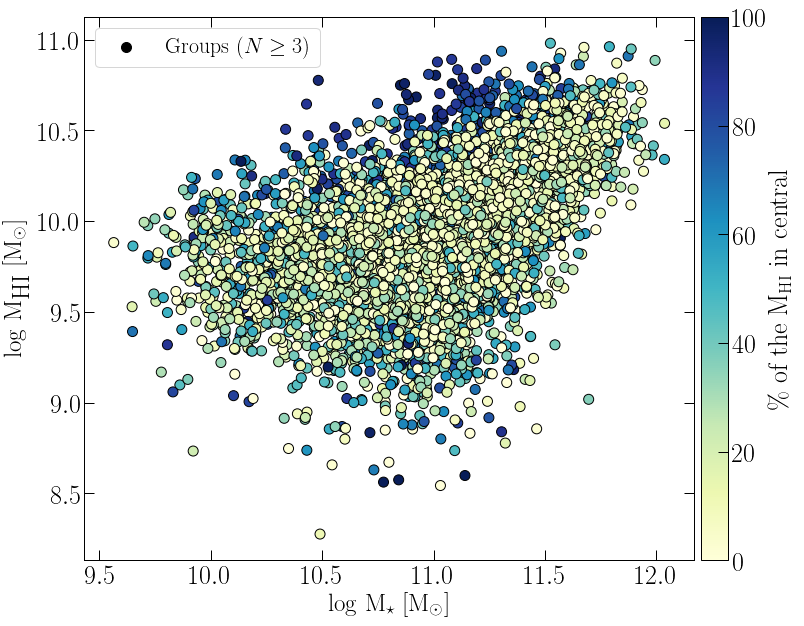

In [61]:

fig = plt.figure(figsize=(13,10))                                                               
ax = fig.add_subplot(1,1,1)

cm = plt.cm.get_cmap('YlGnBu')
#Numpy doesn't know what you might have stored in a object array, 
df_percent['GroupStellarMass'] = df_percent['GroupStellarMass'].astype(np.float64) 
df_percent['GroupHIMass'] = df_percent['GroupHIMass'].astype(np.float64)

#BE CAREFUL HERE! Constructed sizes are OK for current groups; will need change
#s = 80*df_percent['Group_size']

sizes = [100,300,500,700,900]
im = plt.scatter(np.log10(df_percent['GroupStellarMass']), np.log10(df_percent['GroupHIMass']), s=100,
                        c=df_percent['Percent'], edgecolor='k', cmap=cm, label=r'Groups ($N\geq3$)')

fig.colorbar(im, ax=ax, orientation='vertical', label=r'\% of the M$_{\mathrm{HI}}$ in central',
            pad=0.01)

ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
ax.legend(loc=2)
leg = ax.get_legend()
leg.legendHandles[0].set_color('k')

#l1 = plt.scatter([],[], s=100, color='white',edgecolors='k')
#l2 = plt.scatter([],[], s=300, color='white',edgecolors='k')
#l3 = plt.scatter([],[], s=500, color='white',edgecolors='k')
#l4 = plt.scatter([],[], s=700, color='white',edgecolors='k')
#l5 = plt.scatter([],[], s=900, color='white',edgecolors='k')
#
#labels = ["3", "4", "5", "6", '7']
#
#leg = plt.legend([l1, l2, l3, l4, l5], labels, ncol=1, loc=3, framealpha=0.5)
#leg.set_title('Group size')                   
                   
#plt.ylim(6,11)
plt.savefig('Groups_HIinCentral.png')

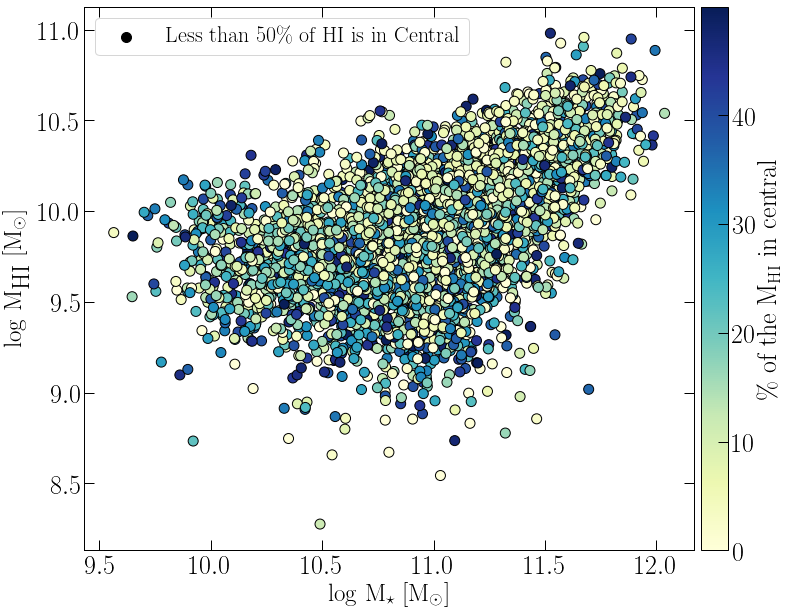

In [62]:
HI_per_cent = 50

fig = plt.figure(figsize=(13,10))                                                               
ax = fig.add_subplot(1,1,1)

cm = plt.cm.get_cmap('YlGnBu')
#Numpy doesn't know what you might have stored in a object array, 
df_percent['GroupStellarMass'] = df_percent['GroupStellarMass'].astype(np.float64) 
df_percent['GroupHIMass'] = df_percent['GroupHIMass'].astype(np.float64)

#BE CAREFUL HERE! Constructed sizes are OK for current groups; will need change
#s = 80*df_percent['Group_size']

sizes = [100,300,500,700,900]
im = plt.scatter(np.log10(df_percent['GroupStellarMass'][df_percent['Percent']<HI_per_cent]), np.log10(df_percent['GroupHIMass'][df_percent['Percent']<HI_per_cent]), s=100,
                        c=df_percent['Percent'][df_percent['Percent']<HI_per_cent], edgecolor='k', cmap=cm, label=r'Less than {0}\% of HI is in Central'.format(HI_per_cent))

fig.colorbar(im, ax=ax, orientation='vertical', label=r'\% of the M$_{\mathrm{HI}}$ in central',
            pad=0.01)

ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
ax.legend(loc=2)
leg = ax.get_legend()
leg.legendHandles[0].set_color('k')

#l1 = plt.scatter([],[], s=100, color='white',edgecolors='k')
#l2 = plt.scatter([],[], s=300, color='white',edgecolors='k')
#l3 = plt.scatter([],[], s=500, color='white',edgecolors='k')
#l4 = plt.scatter([],[], s=700, color='white',edgecolors='k')
#l5 = plt.scatter([],[], s=900, color='white',edgecolors='k')
#
#labels = ["3", "4", "5", "6", '7']
#
#leg = plt.legend([l1, l2, l3, l4, l5], labels, ncol=1, loc=3, framealpha=0.5)
#leg.set_title('Group size')                   
                   
#plt.ylim(6,11)
plt.savefig('Groups_HIinCentral.png')

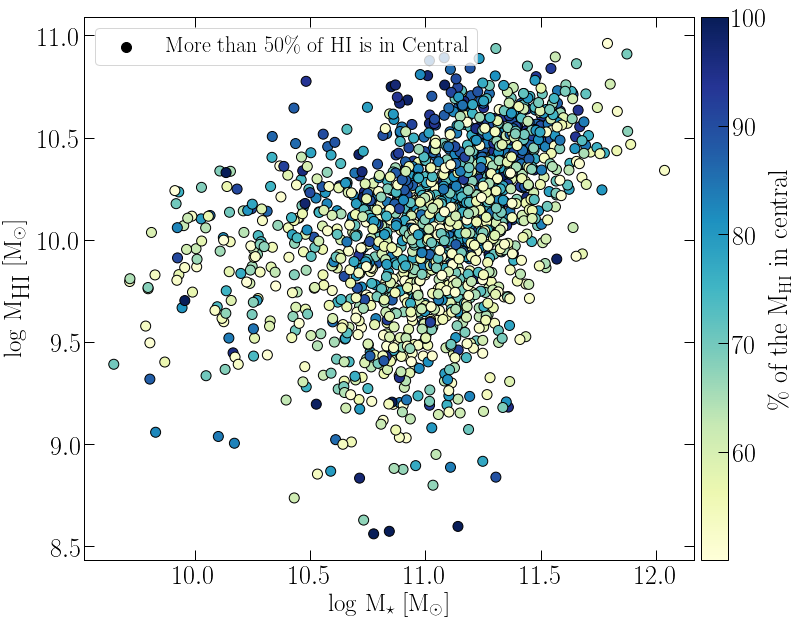

In [63]:

fig = plt.figure(figsize=(13,10))                                                               
ax = fig.add_subplot(1,1,1)

cm = plt.cm.get_cmap('YlGnBu')
#Numpy doesn't know what you might have stored in a object array, 
df_percent['GroupStellarMass'] = df_percent['GroupStellarMass'].astype(np.float64) 
df_percent['GroupHIMass'] = df_percent['GroupHIMass'].astype(np.float64)

#BE CAREFUL HERE! Constructed sizes are OK for current groups; will need change
#s = 80*df_percent['Group_size']

sizes = [100,300,500,700,900]
im = plt.scatter(np.log10(df_percent['GroupStellarMass'][df_percent['Percent']>HI_per_cent]), np.log10(df_percent['GroupHIMass'][df_percent['Percent']>HI_per_cent]), s=100,
                        c=df_percent['Percent'][df_percent['Percent']>HI_per_cent], edgecolor='k', cmap=cm, label=r'More than {0}\% of HI is in Central'.format(HI_per_cent))

fig.colorbar(im, ax=ax, orientation='vertical', label=r'\% of the M$_{\mathrm{HI}}$ in central',
            pad=0.01)

ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
ax.legend(loc=2)
leg = ax.get_legend()
leg.legendHandles[0].set_color('k')

#l1 = plt.scatter([],[], s=100, color='white',edgecolors='k')
#l2 = plt.scatter([],[], s=300, color='white',edgecolors='k')
#l3 = plt.scatter([],[], s=500, color='white',edgecolors='k')
#l4 = plt.scatter([],[], s=700, color='white',edgecolors='k')
#l5 = plt.scatter([],[], s=900, color='white',edgecolors='k')
#
#labels = ["3", "4", "5", "6", '7']
#
#leg = plt.legend([l1, l2, l3, l4, l5], labels, ncol=1, loc=3, framealpha=0.5)
#leg.set_title('Group size')                   
                   
#plt.ylim(6,11)
plt.savefig('Groups_HIinCentral.png')

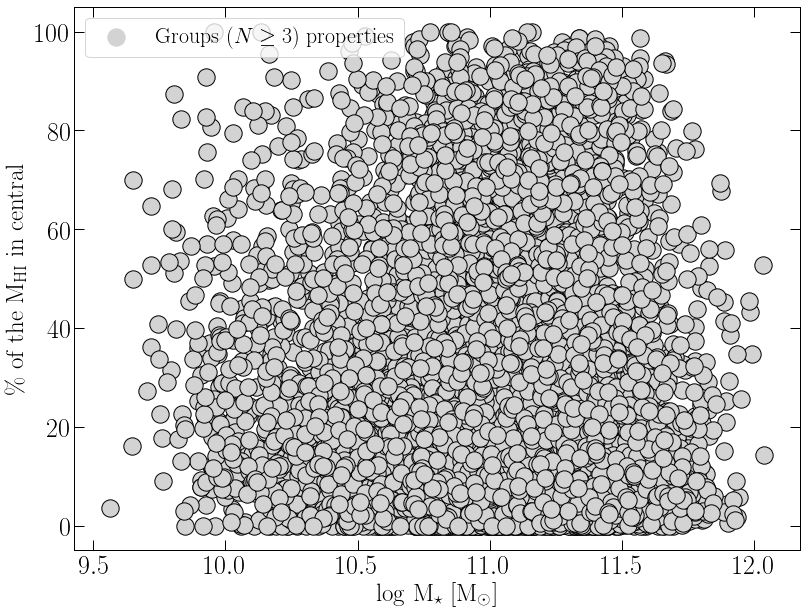

In [64]:

fig = plt.figure(figsize=(13,10))                                                               
ax = fig.add_subplot(1,1,1)

cm = plt.cm.get_cmap('YlGnBu')
#Numpy doesn't know what you might have stored in a object array, 
df_percent['GroupStellarMass'] = df_percent['GroupStellarMass'].astype(np.float64) 
df_percent['GroupHIMass'] = df_percent['GroupHIMass'].astype(np.float64)

#BE CAREFUL HERE! Constructed sizes are OK for current groups; will need change
#s = 80*df_percent['Group_size']

sizes = [100,300,500,700,900]
im = plt.scatter(np.log10(df_percent['GroupStellarMass']), df_percent['Percent'], s=300,
                        color='lightgrey', edgecolor='k', label=r'Groups ($N\geq3$) properties')

#fig.colorbar(im, ax=ax, orientation='vertical', label=r'\% of the M$_{\mathrm{HI}}$ in central',
#            pad=0.01)

ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'\% of the M$_{\mathrm{HI}}$ in central',fontsize=25)
ax.legend(loc=2)
leg = ax.get_legend()
leg.legendHandles[0].set_color('lightgrey')

#l1 = plt.scatter([],[], s=100, color='white',edgecolors='k')
#l2 = plt.scatter([],[], s=300, color='white',edgecolors='k')
#l3 = plt.scatter([],[], s=500, color='white',edgecolors='k')
#l4 = plt.scatter([],[], s=700, color='white',edgecolors='k')
#l5 = plt.scatter([],[], s=900, color='white',edgecolors='k')
#
#labels = ["3", "4", "5", "6", '7']
#
#leg = plt.legend([l1, l2, l3, l4, l5], labels, ncol=1, loc=3, framealpha=0.5)
#leg.set_title('Group size')                   
                   
#plt.ylim(6,11)
#plt.savefig('Groups_HIinCentral.png')

# Fixed N-sized groups

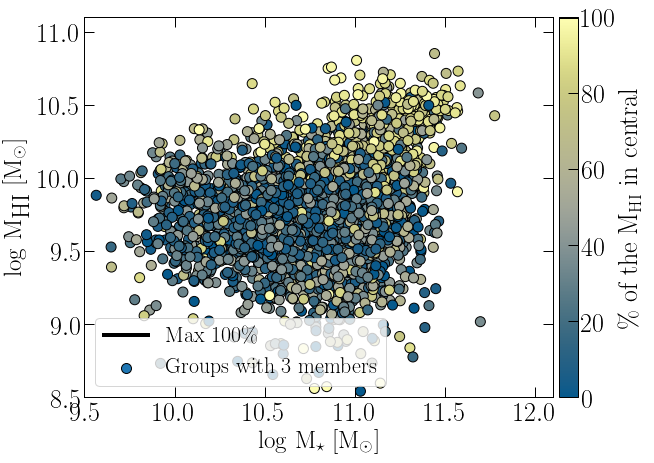

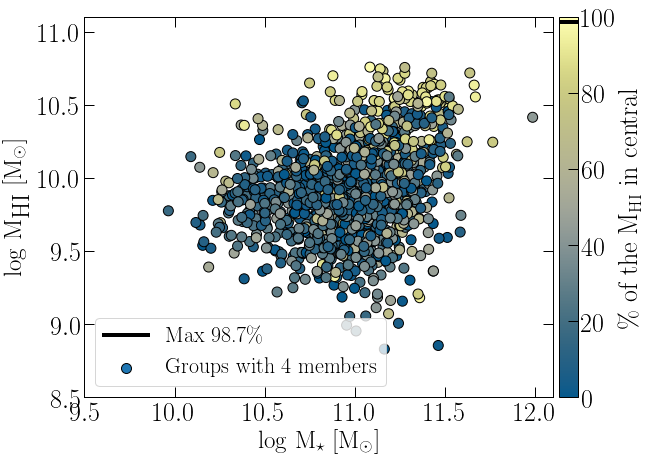

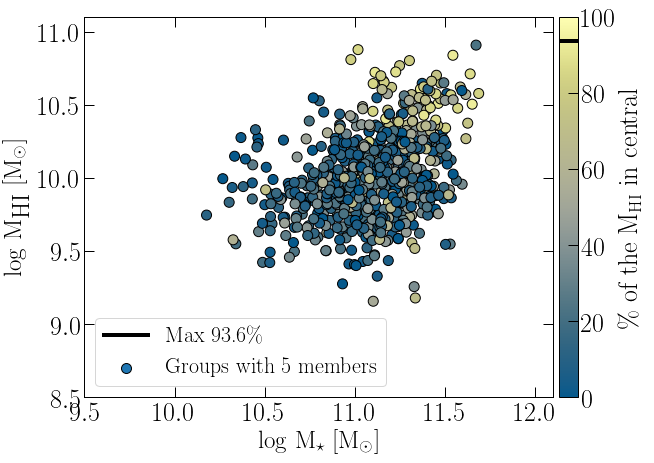

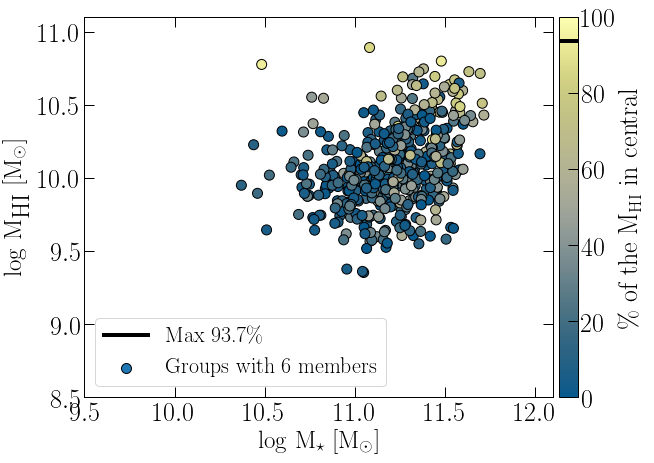

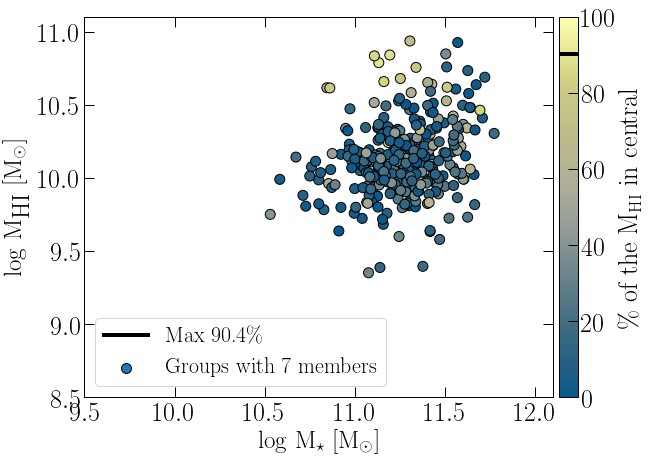

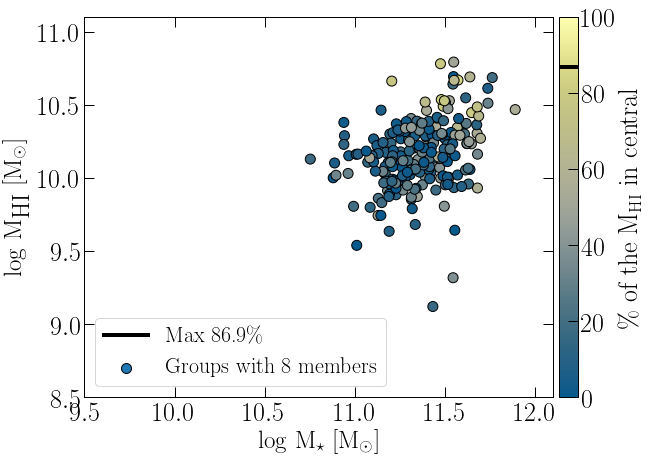

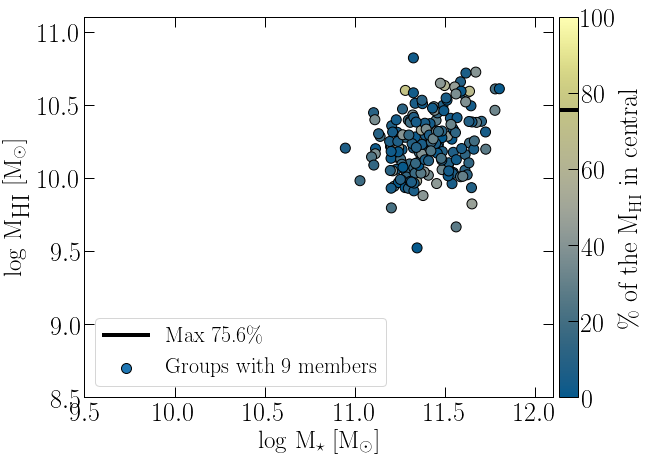

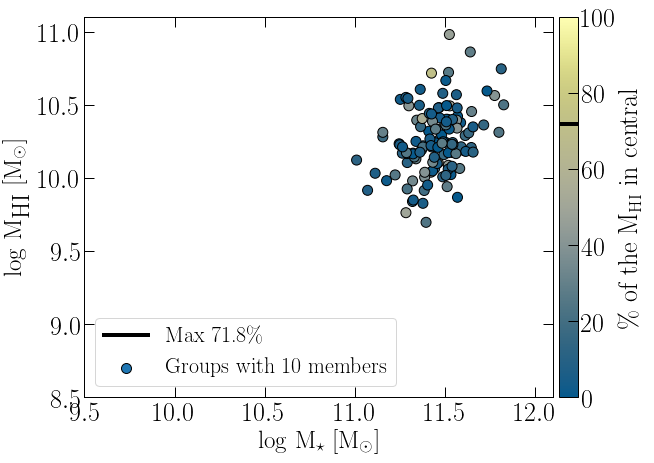

In [100]:
N_sized_group = [3, 4, 5, 6, 7, 8, 9, 10]

for size in N_sized_group:
        
    fig = plt.figure(figsize=(10,7))                                                               
    ax = fig.add_subplot(1,1,1)
    
    cm = nuuk_map
    
    im = plt.scatter(np.log10(df_percent['GroupStellarMass'][df_percent['GroupSize']==size]), np.log10(df_percent['GroupHIMass'][df_percent['GroupSize']==size]), s=100,
                            c=df_percent['Percent'][df_percent['GroupSize']==size], edgecolor='k', cmap=cm, vmin = 0, vmax = 100, label=r'Groups with {0} members'.format(size))
    
    cb = fig.colorbar(im, ax=ax, orientation='vertical', label=r'\% of the M$_{\mathrm{HI}}$ in central',
                pad=0.01)
    
    # Add a line to colourbar to show maxmum percentage
    maximum_perc = max(df_percent['Percent'][df_percent['GroupSize']==size])
    cb.ax.plot([0, 100], [maximum_perc, maximum_perc], 'k', linewidth='4')
    
    plt.plot([], [], 'k', linewidth=4, label=r"Max {:.3g}\%".format(maximum_perc))
    
    #Add a line to indicate mean of the percentages
    #mean_perc = np.mean(df_percent['Percent'][df_percent['GroupSize']==size])
    #cb.ax.plot([0, 100], [median_perc, median_perc], 'k')
    
    ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
    ax.legend(loc=3)
    leg = ax.get_legend()
    leg.legendHandles[0].set_color('k')
    
    plt.ylim(8.5, 11.1)
    plt.xlim(9.5, 12.1)
    outdir = '/home/rdzudzar/scratch/python/plots_mpi/'
    plt.savefig(outdir+'Groups{0}_HIinCentral.png'.format(size))

In [69]:
import seaborn as sns
plt.rcdefaults() #---reset plotting style

In [70]:

import matplotlib.font_manager
matplotlib.font_manager.findSystemFonts(fontpaths=None, fontext='ttf')
fsize = 26
matplotlib.rcParams.update({'font.size': fsize, 'xtick.major.size': 10, 'ytick.major.size': 10, 'xtick.major.width': 1, 'ytick.major.width': 1, 'ytick.minor.size': 5, 'xtick.minor.size': 5, 'xtick.direction': 'in', 'ytick.direction': 'in', 'axes.linewidth': 1, 'text.usetex': True, 'font.family': 'serif', 'font.serif': 'Times New Roman', 'legend.numpoints': 1, 'legend.columnspacing': 1, 'legend.fontsize': fsize-4, 'xtick.top': True, 'ytick.right': True})


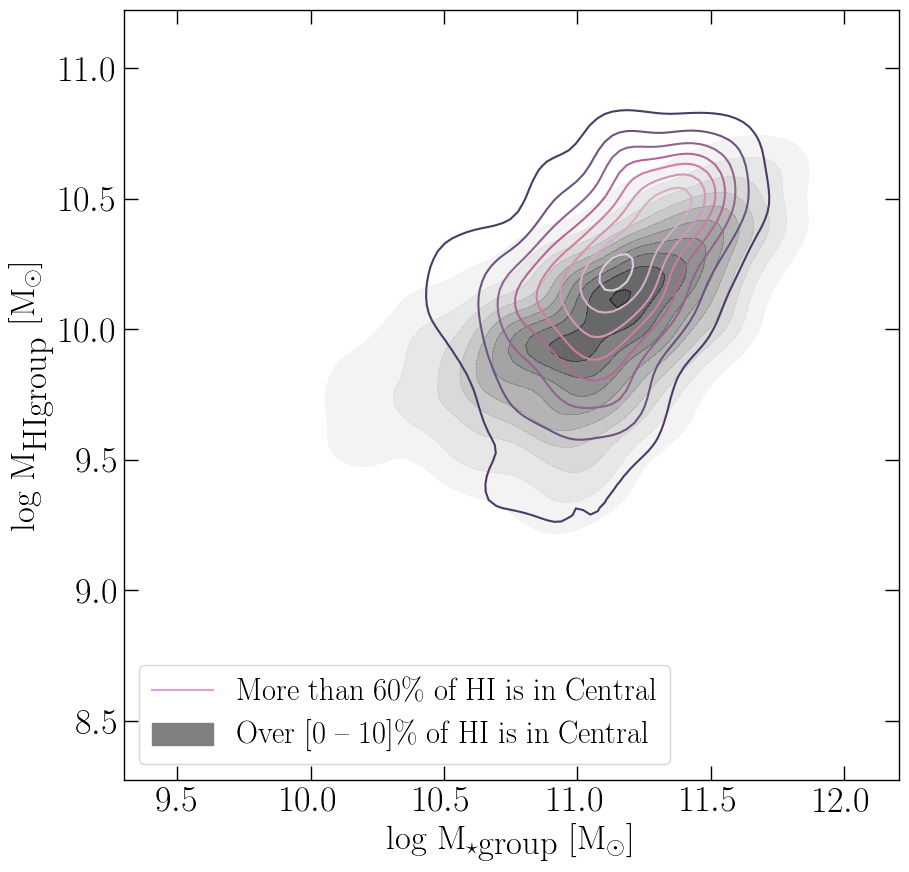

In [71]:
High_percentage = 10
Low_percentage = 0


fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)


#sns.set_style=("white")
#sns.set(font_scale=2)
#sns.set_style=("ticks", {"xtick.major.size":10, "ytick.major.size":10, "xtick.minor.size":6,"ytick.minor.size":6})
sns.set_style=("ticks", {"xtick.major.size":10, "ytick.major.size":10, "xtick.minor.size":6,"ytick.minor.size":6, "lines.linewidth": 2})
#sns.set_style({"xtick.direction": "in","ytick.direction": "in"})

#matplotlib.rcParams.update({'font.size': fsize, 'xtick.major.size': 10, 'ytick.major.size': 10, 'xtick.major.width': 1, 'ytick.major.width': 1, 'ytick.minor.size': 5, 'xtick.minor.size': 5, 'xtick.direction': 'in', 'ytick.direction': 'in', 'axes.linewidth': 1, 'text.usetex': True, 'font.family': 'serif', 'font.serif': 'Times New Roman', 'legend.numpoints': 1, 'legend.columnspacing': 1, 'legend.fontsize': fsize-4, 'xtick.top': True, 'ytick.right': True})

#sns.set_style("white")
sns_plot= sns.kdeplot(np.log10(df_percent['GroupStellarMass'][ (df_percent['Percent'] >= Low_percentage) & (df_percent['Percent'] <= High_percentage)]), 
            np.log10(df_percent['GroupHIMass'][(df_percent['Percent'] >= Low_percentage) & (df_percent['Percent'] <= High_percentage)] ), 
                   shade=True,shade_lowest=False, alpha= 0.7, cmap='Greys', label= 'Over [0 -- {0}]\% of HI is in Central'.format(High_percentage)) #shade=True, shade_lowest=False, 




sns.kdeplot(np.log10(df_percent['GroupStellarMass'][df_percent['Percent'] > 60]), 
            np.log10(df_percent['GroupHIMass'][df_percent['Percent'] >60]),  cmap=acton_map, label= 'More than 60\% of HI is in Central')


ax.set_xlabel(r'log M$_{\star\textrm{group}}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}\textrm{group}}$ [M$_{\odot}$]',fontsize=25)
ax.yaxis.set_ticks_position('both')
ax.xaxis.set_ticks_position('both')

plt.legend(loc=3)
leg = ax.get_legend()
leg.legendHandles[0].set_color('plum')
leg.legendHandles[1].set_color('grey')
#leg.legendHandles[2].set_color('plum')
#plt.ylim(9.1,11)
#fig.savefig('./contour_test.png')

plt.show()


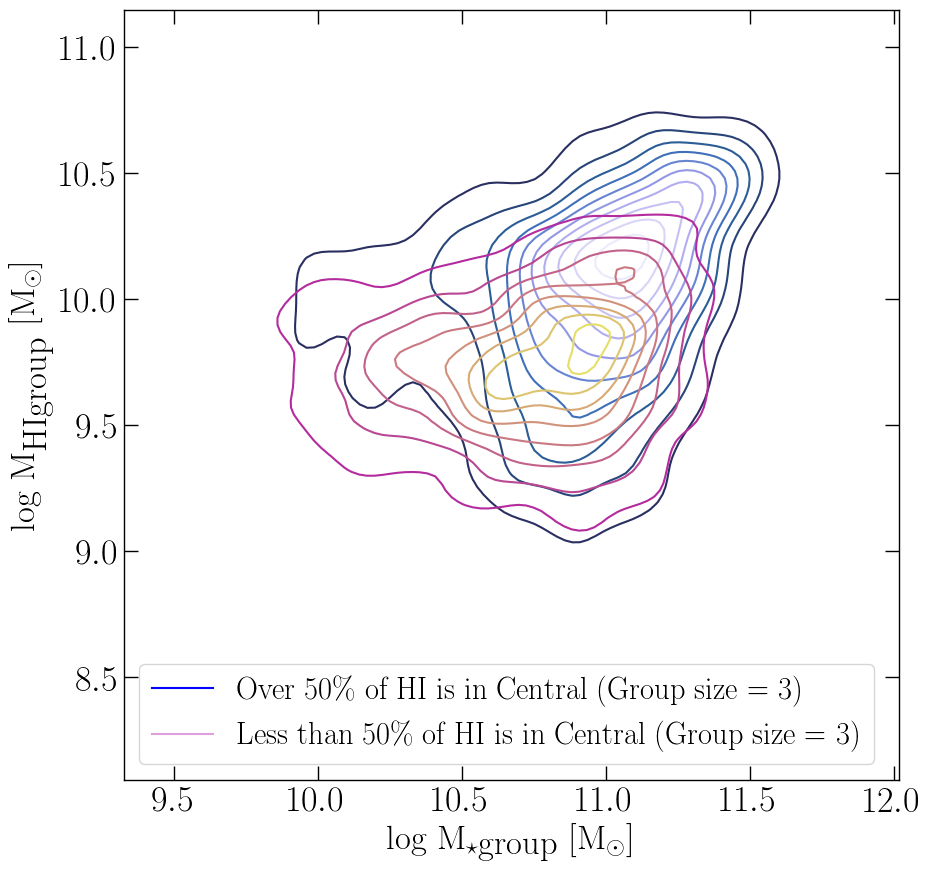

In [72]:

High_percentage = 50
Low_percentage = 50
Nsize_group = 3


fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

#matplotlib.rcParams.update({'font.size': fsize, 'xtick.major.size': 10, 'ytick.major.size': 10, 'xtick.major.width': 1, 'ytick.major.width': 1, 'ytick.minor.size': 5, 'xtick.minor.size': 5, 'xtick.direction': 'in', 'ytick.direction': 'in', 'axes.linewidth': 1, 'text.usetex': True, 'font.family': 'serif', 'font.serif': 'Times New Roman', 'legend.numpoints': 1, 'legend.columnspacing': 1, 'legend.fontsize': fsize-4, 'xtick.top': True, 'ytick.right': True})
#sns.set_style("white")
#matplotlib.rcParams.update({'font.size': fsize, 'xtick.major.size': 10, 'ytick.major.size': 10, 'xtick.major.width': 1, 'ytick.major.width': 1, 'ytick.minor.size': 5, 'xtick.minor.size': 5, 'xtick.direction': 'in', 'ytick.direction': 'in', 'axes.linewidth': 1, 'text.usetex': True, 'font.family': 'serif', 'font.serif': 'Times New Roman', 'legend.numpoints': 1, 'legend.columnspacing': 1, 'legend.fontsize': fsize-4, 'xtick.top': True, 'ytick.right': True})


#sns.set_style("white")
#sns.kdeplot(np.log10(df_percent['GroupStellarMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==5) ]), 
#            np.log10(df_percent['GroupHIMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==5) ]), cmap='Purples', 
#            label= 'Over {0}\% of HI is in Central (Group size = {1})'.format(High_percentage, Nsize_group)) #shade=True, shade_lowest=False, 

#sns.kdeplot(np.log10(df_percent['GroupStellarMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==3) ]), 
#            np.log10(df_percent['GroupHIMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==3) ]), cmap='Blues', 
#            label= 'Over {0}\% of HI is in Central (Group size = {1})'.format(High_percentage, Nsize_group)) #shade=True, shade_lowest=False, 

sns.kdeplot(np.log10(df_percent['GroupStellarMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==Nsize_group) ]), 
            np.log10(df_percent['GroupHIMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==Nsize_group) ]), cmap=devon_map, 
            label= 'Over {0}\% of HI is in Central (Group size = {1})'.format(High_percentage, Nsize_group)) #shade=True, shade_lowest=False, 


sns.kdeplot(np.log10(df_percent['GroupStellarMass'][ (df_percent['Percent'] < Low_percentage) & (df_percent['GroupSize']==Nsize_group) ]), 
            np.log10(df_percent['GroupHIMass'][ (df_percent['Percent'] < Low_percentage) & (df_percent['GroupSize']==Nsize_group) ]), cmap=buda_map, 
            label= 'Less than {0}\% of HI is in Central (Group size = {1})'.format(Low_percentage, Nsize_group))



ax.set_xlabel(r'log M$_{\star\textrm{group}}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}\textrm{group}}$ [M$_{\odot}$]',fontsize=25)
ax.yaxis.set_ticks_position('both')
ax.xaxis.set_ticks_position('both')

plt.legend(loc=3)
leg = ax.get_legend()
leg.legendHandles[0].set_color('blue')
leg.legendHandles[1].set_color('plum')
#leg.legendHandles[2].set_color('plum')
#plt.ylim(9.1,11)
plt.show()


In [66]:
matplotlib.__version__ #has to be 3.0.3; For sure is not working with 2.2.2
#import numpy as np
import pylab
from scipy.stats import skewnorm
from numpy.random import normal, multivariate_normal
from chainconsumer import ChainConsumer

#%matplotlib inline

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
/home/rdzudzar/.local/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
/home/rdzudzar/.local/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


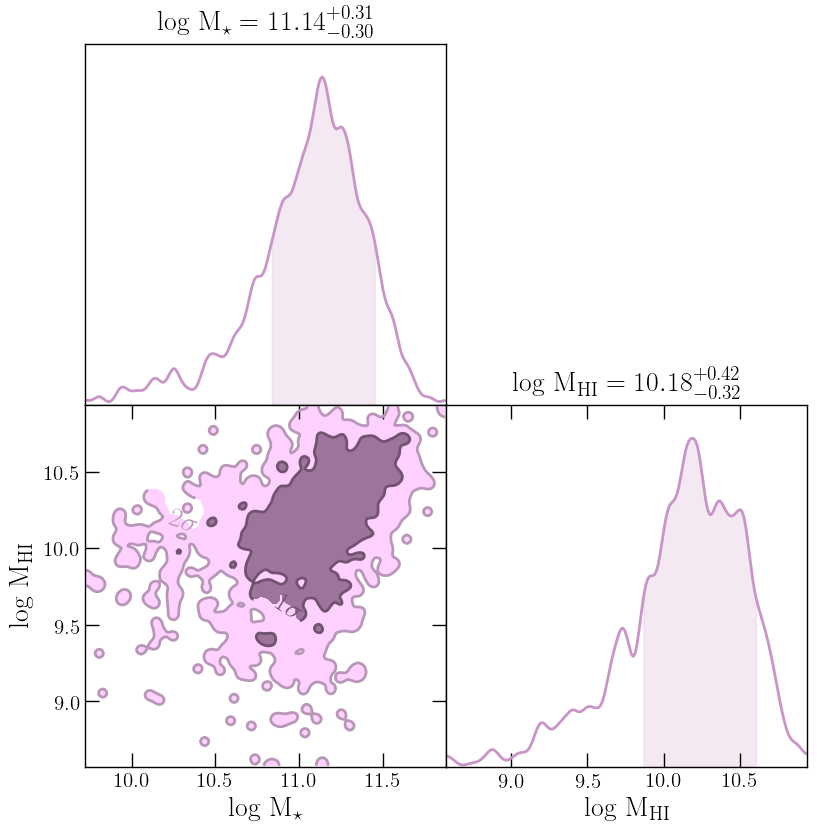

In [67]:
High_percentage = 60
Low_percentage = 50
Nsize_group = 3

x, y = np.log10(df_percent['GroupStellarMass'][df_percent['Percent'] >= High_percentage]), np.log10(df_percent['GroupHIMass'][df_percent['Percent'] >= High_percentage])

parameters = ["$\mathrm{log}$ $\mathrm{M}_{\star}$", "$\mathrm{log}$ $\mathrm{M}_{\mathrm{HI}}$"]
c = ChainConsumer().add_chain([x, y], parameters=parameters, name='Over {0}\% of HI is in Central'.format(High_percentage))

#properties at: https://samreay.github.io/ChainConsumer/chain_api.html
# The default case, so you don't need to specify: sigma2d gives  levels for 1D Gaussians - ie confidence levels of 68% and 95%.
#if sigma2d True : onfidence levels for 2D Gaussians, where 1 and 2 σ represents 39% and 86% confidence levels respectively

c.configure(statistics='max', flip=False, sigma2d=False, diagonal_tick_labels=False,  linewidths=2, linestyles=['-'],
            label_font_size=20, tick_font_size=15, contour_labels='sigma', contour_label_font_size=20, shade_alpha=1, colors='#c994c7', spacing=0)   # max_ticks=4 ; smooth=0

fig = c.plotter.plot()
fig.set_size_inches(5.5 + fig.get_size_inches())  # Resize fig for doco. You don't need this.
plt.show()

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


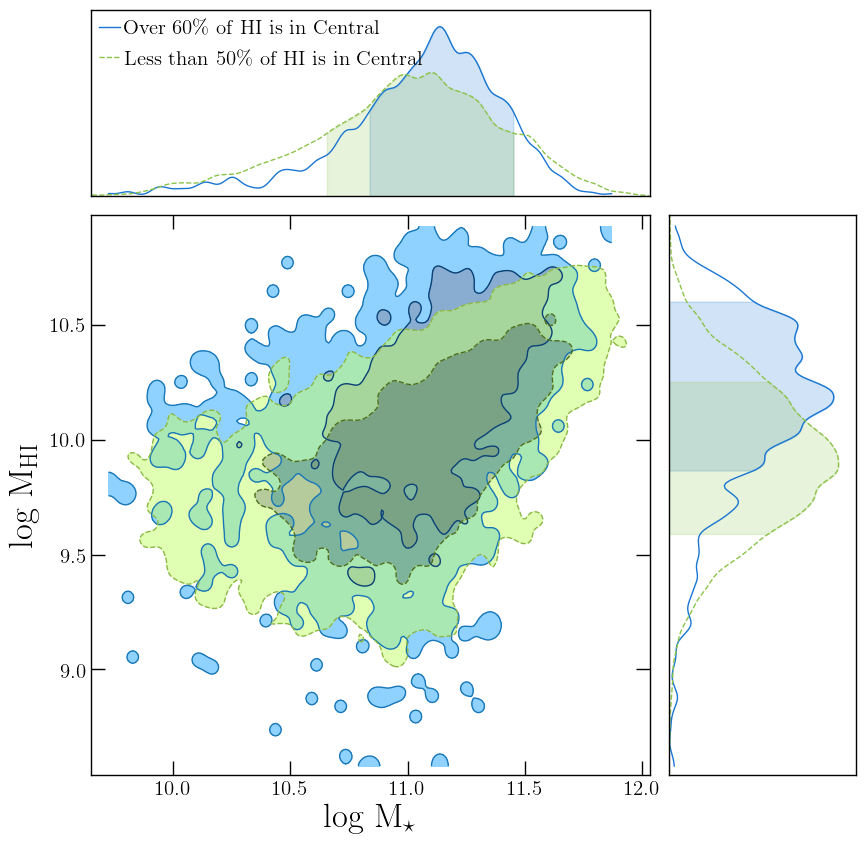

In [68]:
High_percentage = 60
Low_percentage = 50
Nsize_group = 10

x1, y1 = np.log10(df_percent['GroupStellarMass'][df_percent['Percent'] >= High_percentage]), np.log10(df_percent['GroupHIMass'][df_percent['Percent'] >= High_percentage])
x2, y2 = np.log10(df_percent['GroupStellarMass'][df_percent['Percent'] < Low_percentage]), np.log10(df_percent['GroupHIMass'][df_percent['Percent'] < Low_percentage])

parameters = ["$\mathrm{log}$ $\mathrm{M}_{\star}$", "$\mathrm{log}$ $\mathrm{M}_{\mathrm{HI}}$"]

c = ChainConsumer()
c.add_chain([x1, y1], parameters=parameters, name='Over {0}\% of HI is in Central'.format(High_percentage))
c.add_chain([x2, y2], parameters=parameters, name='Less than {0}\% of HI is in Central'.format(Low_percentage))


#Change sigmas to only 1 and it will show only 95%
c.configure(statistics='max', linestyles=["-", "--"], linewidths=[1.0, 1.0],  sigma2d=False, sigmas=[1,2], diagonal_tick_labels=False,
            legend_kwargs={"loc": "upper left", "fontsize": 15},
            legend_color_text=False, legend_location=(0, 0),
           label_font_size=25, tick_font_size=15, contour_label_font_size=20) #colors=['#2b8cbe', '#f4a582'],

fig = c.plotter.plot(figsize=1.5)
fig.set_size_inches(4.5 + fig.get_size_inches())  # Resize fig for doco. You don't need this.

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
/home/rdzudzar/.local/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))
/home/rdzudzar/.local/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


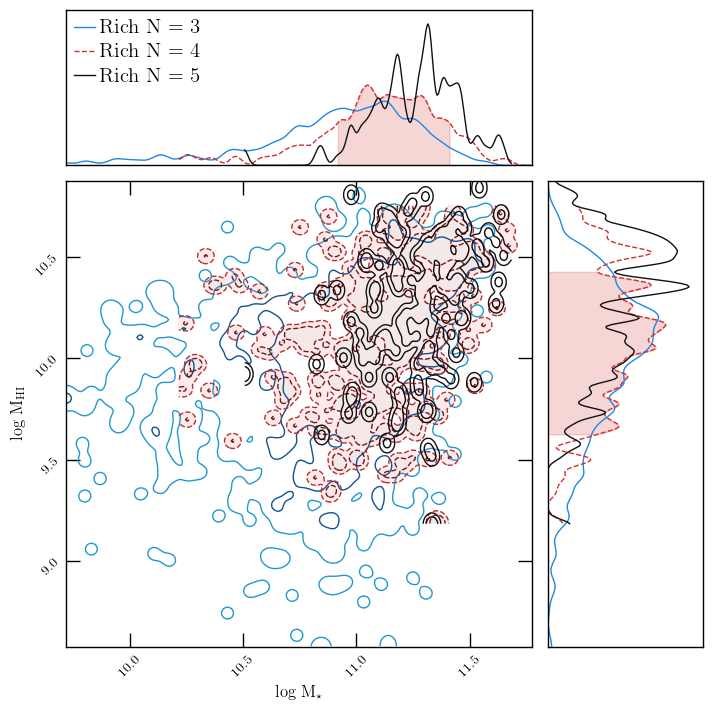

In [69]:
High_percentage = 50
Low_percentage = 50
Nsize_group = 4

x1, y1 = np.log10(df_percent['GroupStellarMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==3) ]), np.log10(df_percent['GroupHIMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==3) ])
    
x2, y2 = np.log10(df_percent['GroupStellarMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==4) ]), np.log10(df_percent['GroupHIMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==4) ])

x3, y3 = np.log10(df_percent['GroupStellarMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==5) ]), np.log10(df_percent['GroupHIMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==5) ])

parameters = ["$\mathrm{log}$ $\mathrm{M}_{\star}$", "$\mathrm{log}$ $\mathrm{M}_{\mathrm{HI}}$"]

c = ChainConsumer()
c.add_chain([x1, y1], parameters=parameters, name="Rich N = 3")
c.add_chain([x2, y2], parameters=parameters, name="Rich N = 4")
c.add_chain([x3, y3], parameters=parameters, name="Rich N = 5")

c.configure(linestyles=["-", "--", "-"], linewidths=[1.0, 1.0, 1.0],
            legend_kwargs={"loc": "upper left", "fontsize": 15},
            legend_color_text=False, legend_location=(0, 0),
            colors=["#1E88E5", "#D32F2F", "#111111"],
            shade=[False, True, True],
            shade_alpha=[0.2, 0.1, 0.0], bar_shade=[False, True, True])
fig = c.plotter.plot()

fig.set_size_inches(4.5 + fig.get_size_inches())  # Resize fig for doco. You don't need this.


# Pair plot

In [73]:
import math

def roundup(x):
    try:
        return  int(math.ceil(x / 10.0)) * 10 # Add whether it will be by increment of 5 or 10 or something third
    except ValueError:
        return -1
    

rounded_per = []
for i in df_percent["Percent"]:
    A = roundup(i)#_test = (central_mass.ravel()/g_m)*100
    rounded_per.append(A)

#print(rounded_per[0:10])


In [74]:
df_pair = pd.DataFrame({'GroupStellarMass'      : np.log10(g_st),
                           'GroupHIMass'        : np.log10(g_m),
                           'Percent'            : percentage,
                           'GroupSize'          : grp_length,
                           'BTTcentral'         : BTT_cen.ravel() ,
                            'Mvircen'           : Mvir_cen.ravel(),
                           'Rvircen'            : Rvir_cen.ravel(),# })
                           'RoundedPercent'     : rounded_per})

In [73]:
@jit
def make_pair_plot(dataframe):
    
    sns.set_style=("ticks", {"xtick.major.size":10, "ytick.major.size":10, "xtick.minor.size":6,"ytick.minor.size":6, "lines.linewidth": 2})
    #sns.set(font_scale=1)
    #sns.set_style("ticks", {"xtick.major.size":10, "ytick.major.size":10,
    #                        "xtick.minor.size":6,"ytick.minor.size":6})
    #sns.set_style({"xtick.direction": "in","ytick.direction": "in"})
    fig = plt.figure(figsize=(10,10))
    
    g = sns.PairGrid(dataframe, diag_sharey=False)
    g.map_lower(sns.kdeplot)
    g.map_upper(sns.scatterplot)
    g.map_diag(sns.kdeplot, lw=3)

# To hide upper scatter plot axies: axis
#for i, j in zip(*np.triu_indices_from(g.axes, 1)):
#    g.axes[i, j].set_visible(False)


INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


<Figure size 1000x1000 with 0 Axes>

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


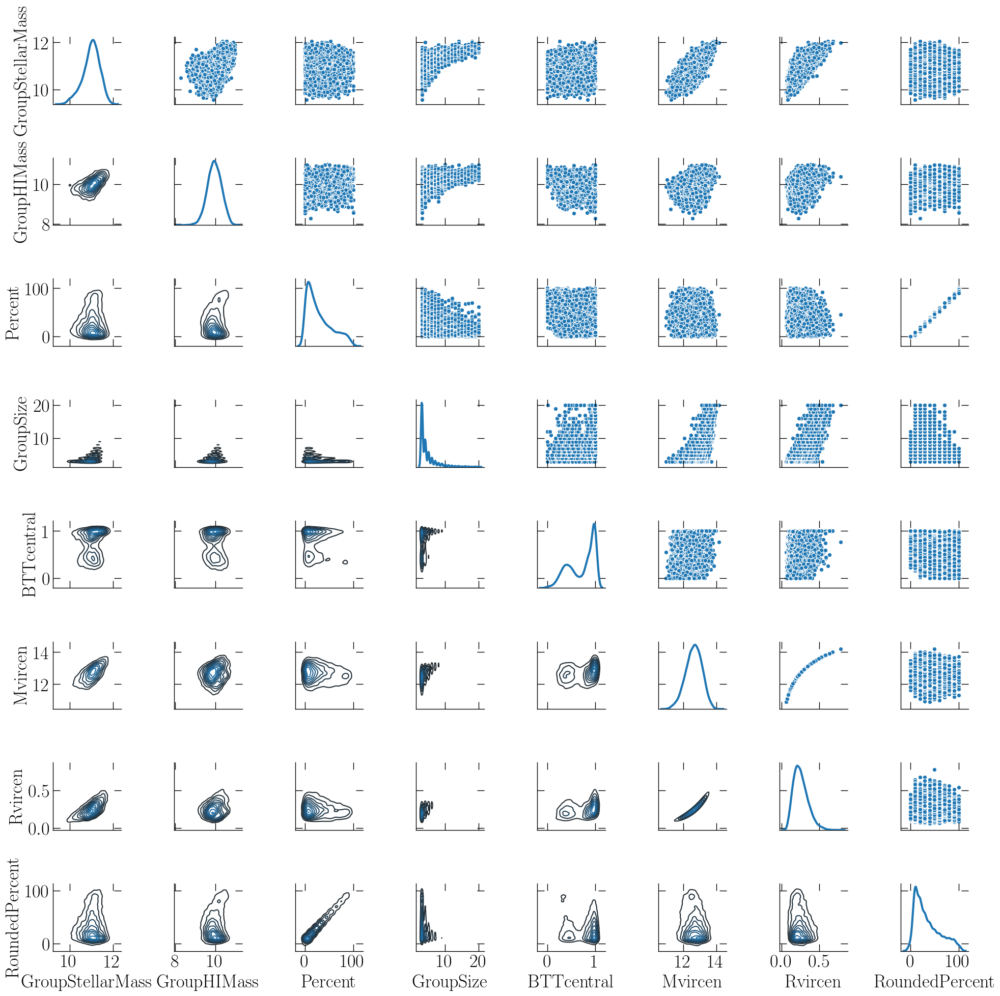

In [74]:
make_pair_plot(df_pair)

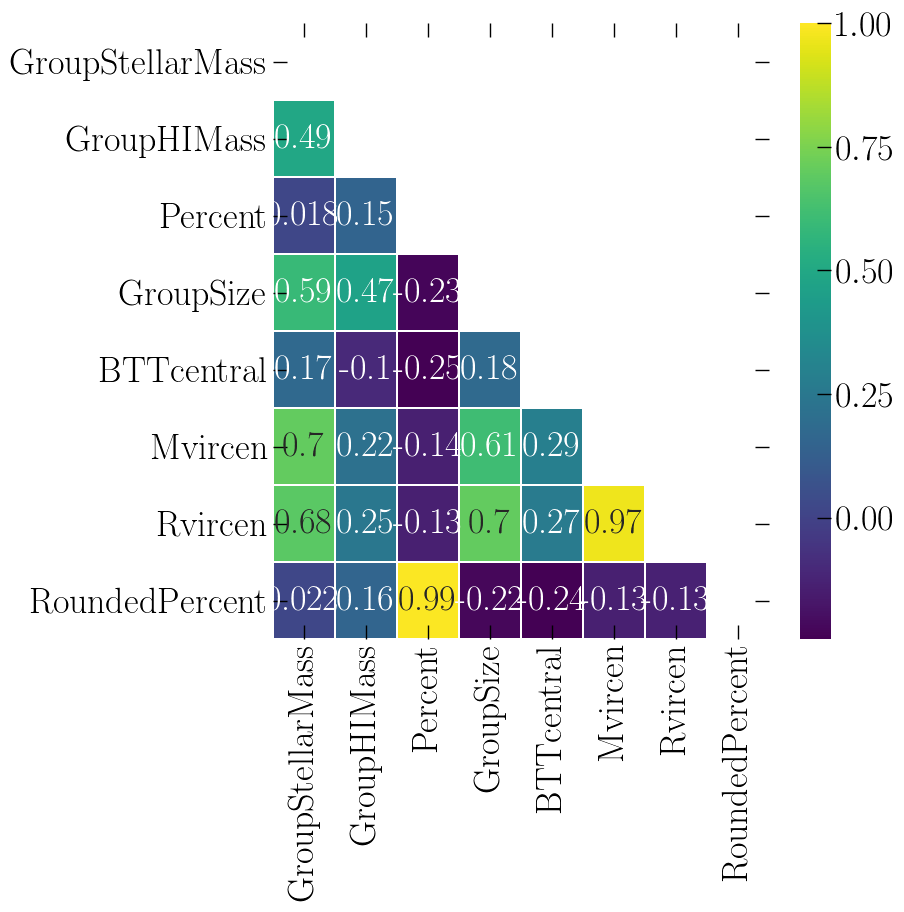

In [75]:
fig = plt.figure(figsize=(8,8))                                                               
ax = fig.add_subplot(1,1,1)

corr = df_pair.corr()

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(corr, annot=True, cmap='viridis',  linewidths=.5, mask=mask, vmax=1,
        xticklabels=corr.columns,
        yticklabels=corr.columns)

In [76]:
from __future__ import unicode_literals
import joypy
from matplotlib import cm


INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


<Figure size 640x640 with 0 Axes>

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


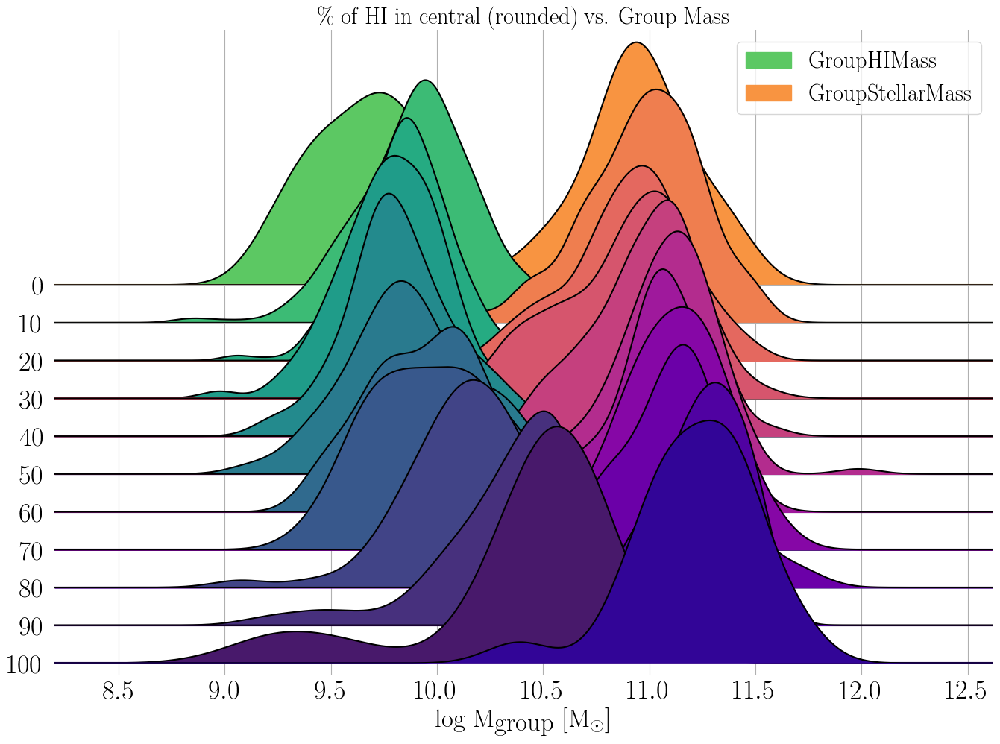

In [77]:
# Import Data
#mpg = pd.read_csv("https://github.com/selva86/datasets/raw/master/mpg_ggplot2.csv")
from matplotlib.colors import LinearSegmentedColormap
# Remove from 0 to 0.15 in the colorbar
interval = np.hstack([np.linspace(0.25, 1)])
colors1 = plt.cm.plasma_r(interval)
cmap = LinearSegmentedColormap.from_list('name', colors1)
cmap.set_under(color='white')
interval = np.hstack([np.linspace(0.25, 1)])
colors2 = plt.cm.viridis_r(interval)
cmap2 = LinearSegmentedColormap.from_list('name', colors2)

# Draw Plot
plt.figure(figsize=(8,8), dpi= 80)
fig, axes = joypy.joyplot(df_pair[df_pair['GroupSize']==4], column=['GroupHIMass', 'GroupStellarMass'], by="RoundedPercent", ylim='own', figsize=(14,10),hist=False, bins=30, overlap=2, 
                          colormap=[cmap2, cmap], grid=True, legend=True)
#axes = joypy.joyplot(df_pair[df_pair['GroupSize']==3], column=['GroupHIMass'], by="RoundedPercent", ylim='own', figsize=(14,10),hist=False, bins=50, overlap=2, colormap=[cm.cividis_r])

# Decoration
plt.title(r'\% of HI in central (rounded) vs. Group Mass', fontsize=22)

axes[-1].set_xlabel(r' log M$_{\textrm{group}}$ [M$_{\odot}$]', fontsize=25)

#plt.xaxis('A')
plt.show()

In [ ]:
joypy.joyplot?

/home/rdzudzar/.local/lib/python3.6/site-packages/ipykernel_launcher.py:8: UserWarning: When passing multiple axes, sharex and sharey are ignored. These settings must be specified when creating axes
  
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
/home/rdzudzar/.local/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: When passing multiple axes, sharex and sharey are ignored. These settings must be specified when creating axes
  # This is added back by InteractiveShellApp.init_path()
/home/rdzudzar/.local/lib/python3.6/site-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppre

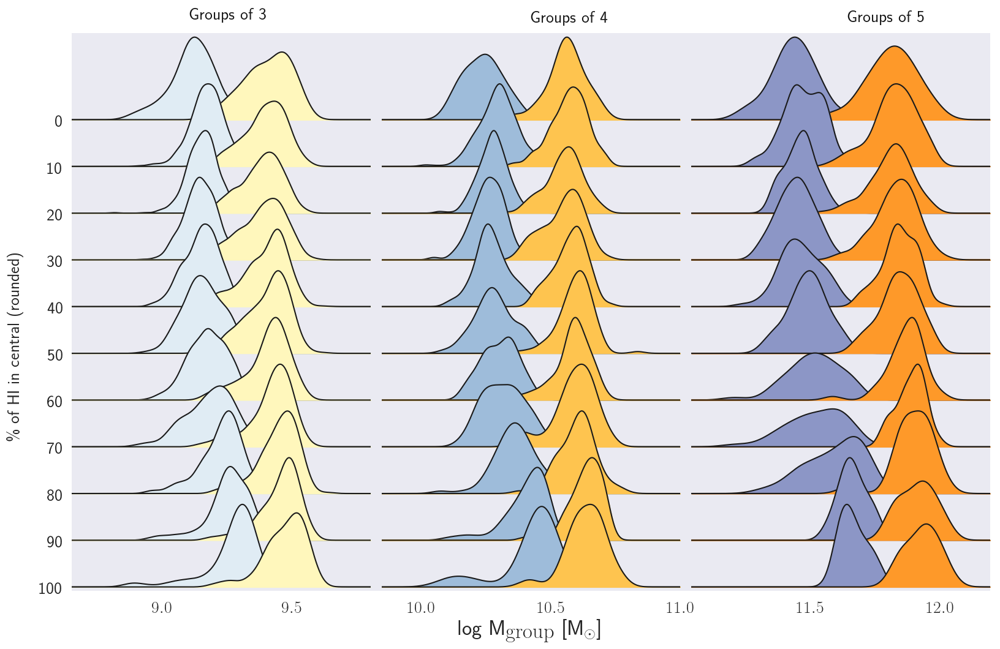

In [191]:
f, axes = plt.subplots(11,3, figsize=(16,10))
first_column = [axes[i][0] for i in range(11)]
second_column = [axes[i][1] for i in range(11)]
third_column = [axes[i][2] for i in range(11)]


joypy.joyplot(df_pair[df_pair['GroupSize']==3], column=['GroupHIMass', 'GroupStellarMass'], by="RoundedPercent", ylim='own', figsize=(14,10),hist=False, bins=50, overlap=1, 
                          color=['#e0ecf4', '#fff7bc'], ax=first_column, ylabelsize=20,xlabelsize=20)

joypy.joyplot(df_pair[df_pair['GroupSize']==4], column=['GroupHIMass', 'GroupStellarMass'], by="RoundedPercent", ylim='own', figsize=(14,10),hist=False, bins=50, overlap=1, 
                          color=['#9ebcda', '#fec44f'], ax=second_column, ylabels=False, xlabelsize=20)
joypy.joyplot(df_pair[df_pair['GroupSize']==5], column=['GroupHIMass', 'GroupStellarMass'], by="RoundedPercent", ylim='own', figsize=(14,10),hist=False, bins=50, overlap=1, 
                          color=['#8c96c6', '#fe9929'], ax=third_column, ylabels=False, xlabelsize=20)

axes[0][0].text(9.5, 1.4, "Groups of 3", color="k", fontsize=20)
axes[0][1].text(10.4, 1.8, "Groups of 4", color="k", fontsize=20)
axes[0][2].text(10.5, 1.7, "Groups of 5", color="k", fontsize=20)

axes[0][0].text(6.5, -2, r'\% of HI in central (rounded)', rotation = 90, fontsize=20)

#plt.title(r'\% of HI in central (rounded) vs. Group Mass', fontsize=22)

plt.xlabel(r' log M$_{\textrm{group}}$ [M$_{\odot}$]', fontsize=25)

f.tight_layout(pad=0) 
#plt.savefig('Test_joy.png')
#f.savefig("./plfoo.pdf", bbox_inches='tight')
plt.show()

In [ ]:
f, axes = plt.subplots(11,3, figsize=(16,10))
first_column = [axes[i][0] for i in range(11)]
second_column = [axes[i][1] for i in range(11)]
third_column = [axes[i][2] for i in range(11)]


joypy.joyplot(df_pair[df_pair['GroupSize']==3], column=['GroupHIMass', 'GroupStellarMass'], by="RoundedPercent", ylim='own', figsize=(14,10),hist=False, bins=50, overlap=1, 
                           ax=first_column, ylabelsize=20,xlabelsize=20, fill=True, colormap=cm.Greys, linecolor='white', background='k')
labels = ["a"]*10
joypy.joyplot(df_pair[df_pair['GroupSize']==4], column=['GroupHIMass', 'GroupStellarMass'], by="RoundedPercent", ylim='own', figsize=(14,10),hist=False, bins=50, overlap=1, 
                           ax=second_column, ylabels=False, xlabelsize=20, fill=True, colormap=cm.RdBu)
joypy.joyplot(df_pair[df_pair['GroupSize']==5], column=['GroupHIMass', 'GroupStellarMass'], by="RoundedPercent", ylim='own', figsize=(14,10),hist=False, bins=50, overlap=1, 
                           ax=third_column, ylabels=False, xlabelsize=20, fill=True, colormap=cmap2)

axes[0][0].text(9.5, 1.4, "Groups of 3", color="k", fontsize=20)
axes[0][1].text(10.4, 1.8, "Groups of 4", color="k", fontsize=20)
axes[0][2].text(10.5, 1.7, "Groups of 5", color="k", fontsize=20)

axes[0][0].text(6.5, -2, r'\% of HI in central (rounded)', rotation = 90, fontsize=20)

#plt.title(r'\% of HI in central (rounded) vs. Group Mass', fontsize=22)

plt.xlabel(r' log M$_{\textrm{group}}$ [M$_{\odot}$]', fontsize=25)

f.tight_layout(pad=0) 
#plt.savefig('Test_joy.png')
#f.savefig("./plfoo.pdf", bbox_inches='tight')
plt.show()

# Also 'joy' plot in seaborn... 
### Messes up with the legend colors ...

In [ ]:
#
#sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})
#
#pal = sns.cubehelix_palette(21, rot=.15, light=.5)
#g = sns.FacetGrid(df_pair[df_pair['GroupSize']==3], row="RoundedPercent", hue='RoundedPercent', aspect=15, height=.7, palette=pal, legend_out=True) #hue='GroupSize'
##g = sns.FacetGrid(df_pair[df_pair['GroupSize']==4], row="RoundedPercent", hue='RoundedPercent', aspect=15, height=.7, palette=pal, legend_out=True) #hue='GroupSize'
#
## Draw the densities in a few steps
#g.map(sns.kdeplot, "GroupHIMass", clip_on=True, shade=True, alpha=0.8, lw=1.5, bw=.1)
#g.map(sns.kdeplot, "GroupStellarMass", clip_on=True, shade=True, lw=2, bw=.1)
#g.map(plt.axhline, y=0, lw=2, clip_on=False)
#
##Define and use a simple function to label the plot in axes coordinates
#def label(x, color, label):
#    ax = plt.gca()
#    ax.text(0, .2, label, fontweight="bold", color=color,
#            ha="left", va="center", transform=ax.transAxes)
#
#g.map(label, 'RoundedPercent')
#
#g.fig.subplots_adjust(hspace=-.25)
#
## Remove axes details that don't play well with overlap
#g.set_titles("")
#g.set(yticks=[])
#g.despine(bottom=True, left=True)
#

# Pair plot for specific parameters

In [ ]:
#sns.set(font_scale=1)
#sns.set_style("ticks", {"xtick.major.size":10, "ytick.major.size":10,
#						"xtick.minor.size":6,"ytick.minor.size":6})
#sns.set_style({"xtick.direction": "in","ytick.direction": "in"})
#
#
## Adding size, hue, palette and specify variables in vars
#variables = ["Percent", "GroupHIMass", "Rvircen"]
#g = sns.pairplot(df_pair, height=5, hue="GroupSize", palette="Purples", vars=variables,
#                plot_kws = {'s': 80, 'edgecolor': 'k'})
##g.map_diag(plt.hist, density=True)
#g._legend.get_title().set_fontsize(20) 
#
#
## Axis Labels
#replacements = {"GroupStellarMass": r'log M$_{\star\textrm{group}}$ [M$_{\odot}$]', 
#                "GroupHIMass"     : r'log M$_{\textrm{HI}\textrm{group}}$ [M$_{\odot}$]',
#                "Percent"         : r'\% of HI in Central',
#                "GroupSize"       : r'Group Size'}
#
#for i in range(len(variables)):
#    for j in range(len(variables)):
#        xlabel = g.axes[i][j].get_xlabel()
#        ylabel = g.axes[i][j].get_ylabel()
#        if xlabel in replacements.keys():
#            g.axes[i][j].set_xlabel(replacements[xlabel], fontsize=17)
#        if ylabel in replacements.keys():
#            g.axes[i][j].set_ylabel(replacements[ylabel], fontsize=17)
#            
##Legend
#for i in range(len(g.fig.get_children()[-1].texts)):
#    label = g.fig.get_children()[-1].texts[i].get_text()
#    if label in replacements.keys():
#        g.fig.get_children()[-1].texts[i].set_text(replacements[label])
#g.fig.get_children()[-1].set_bbox_to_anchor((1.05, 0.5, 0, 0))
#
#


In [ ]:
#sns.set(font_scale=1)
#sns.set_style("ticks", {"xtick.major.size":10, "ytick.major.size":10,
#						"xtick.minor.size":6,"ytick.minor.size":6})
#sns.set_style({"xtick.direction": "in","ytick.direction": "in"})
#
#
## Adding size, hue, palette and specify variables in vars
#variables = ["Percent", "GroupHIMass", "Rvircen"]
#g = sns.pairplot(df_pair, height=5, hue="GroupSize", palette="Purples", vars=variables,
#                plot_kws = {'s': 80, 'edgecolor': 'k'})
##g.map_diag(plt.hist, density=True)
#g._legend.get_title().set_fontsize(20) 
#
#
## Axis Labels
#replacements = {"GroupStellarMass": r'log M$_{\star\textrm{group}}$ [M$_{\odot}$]', 
#                "GroupHIMass"     : r'log M$_{\textrm{HI}\textrm{group}}$ [M$_{\odot}$]',
#                "Percent"         : r'\% of HI in Central',
#                "GroupSize"       : r'Group Size'}
#
#for i in range(len(variables)):
#    for j in range(len(variables)):
#        xlabel = g.axes[i][j].get_xlabel()
#        ylabel = g.axes[i][j].get_ylabel()
#        if xlabel in replacements.keys():
#            g.axes[i][j].set_xlabel(replacements[xlabel], fontsize=17)
#        if ylabel in replacements.keys():
#            g.axes[i][j].set_ylabel(replacements[ylabel], fontsize=17)
#            
##Legend
#for i in range(len(g.fig.get_children()[-1].texts)):
#    label = g.fig.get_children()[-1].texts[i].get_text()
#    if label in replacements.keys():
#        g.fig.get_children()[-1].texts[i].set_text(replacements[label])
#g.fig.get_children()[-1].set_bbox_to_anchor((1.05, 0.5, 0, 0))
#
#



INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


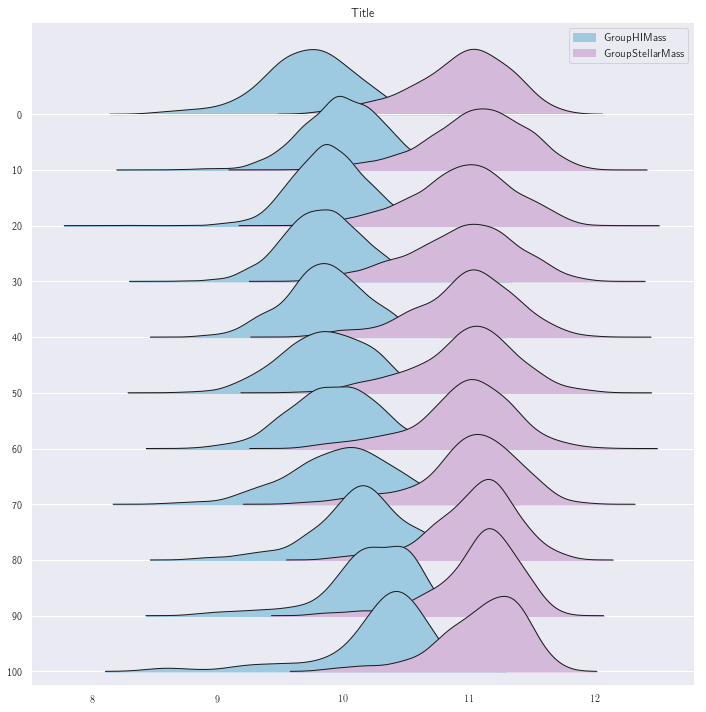

In [84]:
%matplotlib inline
try:
    #labels=[y if y%1==0 else None for y in list(df_pair.GroupHIMass.unique())]
    fig, axes = joypy.joyplot(df_pair, by="RoundedPercent", column=["GroupHIMass","GroupStellarMass"], range_style='own',
                          grid="y", linewidth=1, legend=True, loc="best", figsize=(10,10), overlap=1,
                          title="Title", color=['#9ecae1', '#d4b9da']
                          )        
except ValueError:
    pass  # do nothing!

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


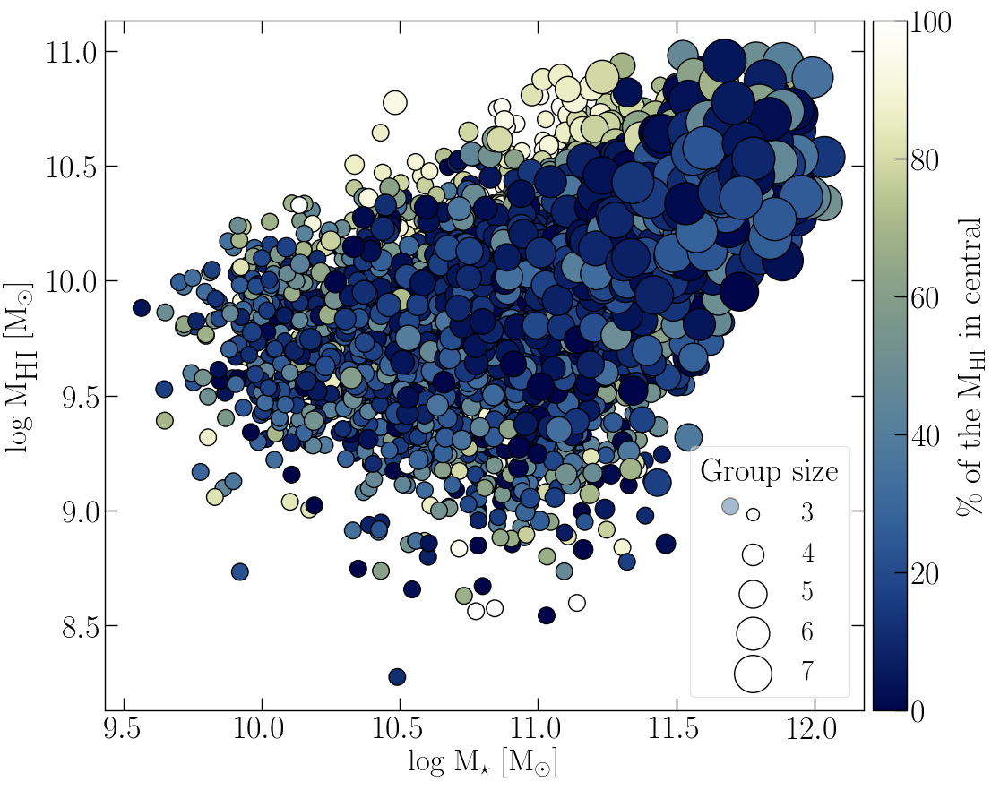

In [78]:

fig = plt.figure(figsize=(13,10))                                                               
ax = fig.add_subplot(1,1,1)

cm = davos_map
#Numpy doesn't know what you might have stored in a object array, 
#df_percent['StellarM'] = df_percent['StellarM'].astype(np.float64) 
#df_percent['HImass'] = df_percent['HImass'].astype(np.float64)

#BE CAREFUL HERE! Constructed sizes are OK for current groups; will need change
#s = 80*df_percent['Group_size']

sizes = [100,300,500,700,900]
im = plt.scatter(np.log10(df_percent['GroupStellarMass']), np.log10(df_percent['GroupHIMass']), s=60*df_percent['GroupSize'],
                        c=df_percent['Percent'], edgecolor='k', cmap=cm, label=r'Groups ($N\geq3$) properties')

fig.colorbar(im, ax=ax, orientation='vertical', label=r'\% of the M$_{\mathrm{HI}}$ in central',
            pad=0.01)

ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
ax.legend(loc=4)
leg = ax.get_legend()
leg.legendHandles[0].set_color('k')

l1 = plt.scatter([],[], s=100, color='white',edgecolors='k')
l2 = plt.scatter([],[], s=300, color='white',edgecolors='k')
l3 = plt.scatter([],[], s=500, color='white',edgecolors='k')
l4 = plt.scatter([],[], s=700, color='white',edgecolors='k')
l5 = plt.scatter([],[], s=900, color='white',edgecolors='k')

labels = ["3", "4", "5", "6", '7']

leg = plt.legend([l1, l2, l3, l4, l5], labels, ncol=1, loc=4, framealpha=0.5)
leg.set_title('Group size')                   
                   
#plt.ylim(6,11)

In [79]:
# Initiate figure and how large it will be
@jit
def HI_group_distribution(groups_dict):
    
    """
    Make 3x3 plot (HI mass vs Stellar mass) with galaxy groups based on the number of galaxies in a group and separate in each group central
    and satellite galaxy.
    
    Parameters
    ==========
    groups_dict: Dictionary. Keyed by the group size. Use: ``groups_dict[group_size]["Centrals"]``
                 Extracts groups with size N and the satellite & central galaxies
                 Created dictionary from (def create_cen_sat_from_groups_dict)
  
    Returns
    =======
    3x3 Figure with M_HI versus M_*
    
    Usage
    =====
    To use type: ``mhi_vs_ms_3x3(updated_dict) ``
                 Where updated_dict is the dictionary that is parsed to plotting function
                 ``updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices)``
    
    """
    
    
    fig, ax = plt.subplots(nrows=4, ncols=4, sharex='col', sharey='row', figsize=(18, 15))
    
    #ax[0][0].plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', color='lightgrey',markersize=8, label='Single galaxies')
    sat_g = []
    # Put plot in row and columns:3by3 are 00, 01, 02, 10, 11, 12, 20, 21, 22 
    row_count = 0
    for size in trange(1, 16, 1): #I'm planning to have 1-9 sized groups. Made to form trange(1, 9, 1) as 3x3 pannels 
            
        if size % 4 == 0:
            row_count += 1
        this_ax = ax[row_count, size%4] #Axis. Created for plotting 3x3 plots
        
        group_size = size+1 # Select number of galaxies per group --- adding +1 because it is counting from 0.
    
        central_gals = groups_dict[group_size]["Centrals"]  #List of integers. Contains indices of central galaxies.  List is obtained through the dictionary. 
        sat_gals = groups_dict[group_size]["Satellites"] #List of integers. Contains indices of satellite galaxies. List is obtained through the dictionary.

        sat_mass = np.sum(G['DiscHI'],axis=1)[sat_gals]
        sat_g.append(sat_gals)
        
        sum_of_all_satellites = np.sum(sat_mass)
        print(sum_of_all_satellites)
        
        sum_satellite_stellar = np.sum(G['StellarMass'][sat_gals])
        
        percentage = (np.sum(G['DiscHI'],axis=1)[central_gals]/(np.sum(G['DiscHI'],axis=1)[central_gals]+sum_of_all_satellites))*100
        #per_cent.append(percentage[0])
        groupHI = (np.sum(G['DiscHI'],axis=1)[central_gals]*1e10/h+1) + sum_of_all_satellites*1e10/h
        groupSt = (G['StellarMass'][central_gals]*1e10/h+1) + sum_satellite_stellar*1e10/h
        
        # Do plotting of groups of N-length; it will be placed on each subplot + +.
        # Centrals

        im = this_ax.scatter(np.log10(groupSt), np.log10(groupHI), s=300,
                        c=percentage, edgecolor='k', cmap=cm)

        # Add label for each sub-plot to know the group size and what is central/satellite
        this_ax.plot([], [], 'o', color='white', label='Groups of %.f' %group_size)
        this_ax.plot([], [], 'o', color='lightgrey', label='Single galaxies')
        this_ax.plot([], [], 'o', color='#1f78b4', markersize=8, label='Satellite')
        this_ax.plot([], [], 'o', color='white', markeredgecolor='#1f78b4', markersize=8, markeredgewidth=2, label='Central')
        #Add legend    
        leg = this_ax.legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)
        
    # Add x and y axis labels only on the plot edges since there will be no space between panels
    for row in range(3):
        this_ax = ax[row,0]
        this_ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
    for col in range(3):
        this_ax = ax[2,col]
        this_ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    # Tight layout and remove spacing between subplots
    plt.tight_layout()
    # My first plot is only single galaxies so I add legend separately
    ax[0][0].legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)

    plt.subplots_adjust(wspace = 0.0, hspace = 0.0)
    plt.show()
    print(sat_g)
    #return fig


# Bulge to total ratio (BTT)

In [87]:
#BTT_cen.ravel().tolist()

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


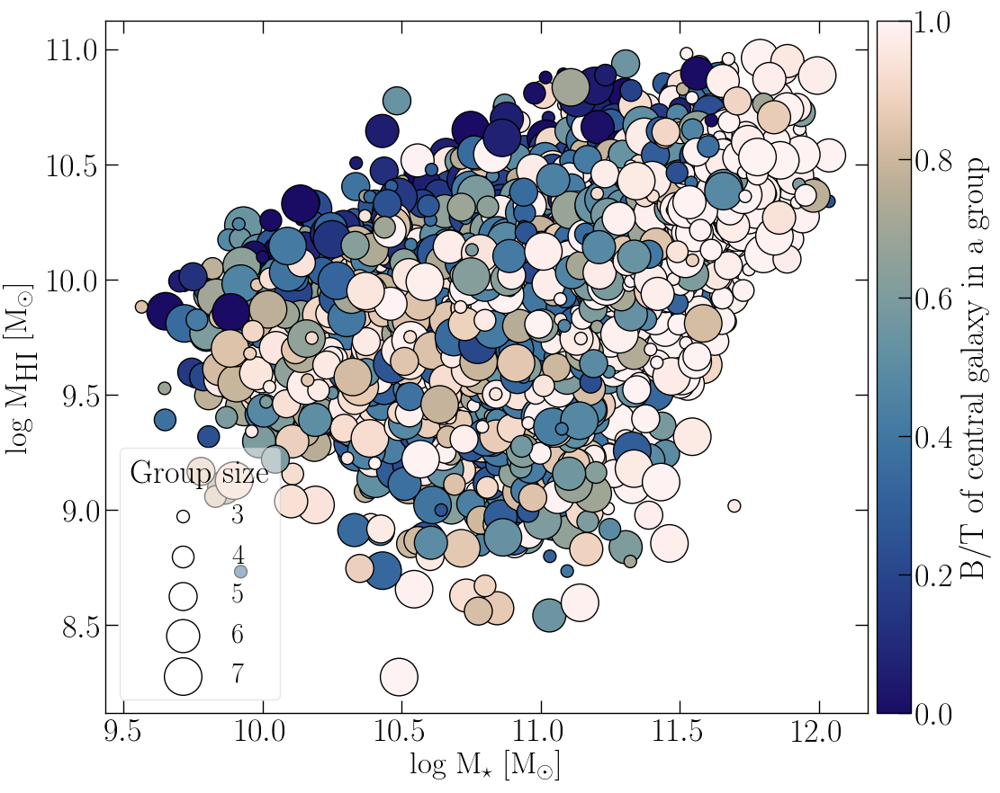

In [80]:

fig = plt.figure(figsize=(13,10))                                                               
ax = fig.add_subplot(1,1,1)

cm = lapaz_map
#Numpy doesn't know what you might have stored in a object array, 
#df_percent['HImass'] = df_percent['HImass'].astype(np.float64)

#BE CAREFUL HERE! Constructed sizes are OK for current groups; will need change
#s = 80*df_percent['Group_size']
sizes = [100,300,500,700,900]
im = plt.scatter(np.log10(df_percent['GroupStellarMass']), np.log10(df_percent['GroupHIMass']), s=sizes,
                        c=BTT_cen.ravel().tolist(), edgecolor='k', cmap=cm, label=r'Groups ($N\geq3$) properties')

fig.colorbar(im, ax=ax, orientation='vertical', label=r'B/T of central galaxy in a group',
            pad=0.01)

ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
ax.legend(loc=3)
leg = ax.get_legend()
leg.legendHandles[0].set_color('k')

l1 = plt.scatter([],[], s=100, color='white',edgecolors='k')
l2 = plt.scatter([],[], s=300, color='white',edgecolors='k')
l3 = plt.scatter([],[], s=500, color='white',edgecolors='k')
l4 = plt.scatter([],[], s=700, color='white',edgecolors='k')
l5 = plt.scatter([],[], s=900, color='white',edgecolors='k')

labels = ["3", "4", "5", "6", '7']

leg = plt.legend([l1, l2, l3, l4, l5], labels, ncol=1, loc=3, framealpha=0.5)
leg.set_title('Group size')                   
                   
#plt.ylim(6,11)

## N times N with B/T

In [81]:
# Initiate figure and how large it will be
@jit
def mhi_vs_ms_3x3_colorbar(groups_dict):
    
    """
    Make 3x3 plot (HI mass vs Stellar mass) with galaxy groups based on the number of galaxies in a group and separate in each group central
    and satellite galaxy.
    
    Parameters
    ==========
    groups_dict: Dictionary. Keyed by the group size. Use: ``groups_dict[group_size]["Centrals"]``
                 Extracts groups with size N and the satellite & central galaxies
                 Created dictionary from (def create_cen_sat_from_groups_dict)
  
    Returns
    =======
    3x3 Figure with M_HI versus M_*
    
    Usage
    =====
    To use type: ``mhi_vs_ms_3x3(updated_dict) ``
                 Where updated_dict is the dictionary that is parsed to plotting function
                 ``updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices)``
    
    """
    
    
    fig, ax = plt.subplots(nrows=4, ncols=5, sharex='col', sharey='row', figsize=(18, 15))
    
    #ax[0][0].plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', color='lightgrey',markersize=8, label='Single galaxies')
    
    cm = berlin_map
    ax[0][0].scatter(np.log10(Mstellar_single_gal), 
                     np.log10(Mcoldgas_single_gal), 
                     c = BTT_single, s=50, edgecolor='k', cmap=cm)
    
    # Put plot in row and columns:3by3 are 00, 01, 02, 10, 11, 12, 20, 21, 22 
    row_count = 0
    for size in trange(1, 20, 1): #I'm planning to have 1-9 sized groups. Made to form trange(1, 9, 1) as 3x3 pannels 
            
        if size % 5 == 0:
            row_count += 1
        this_ax = ax[row_count, size%5] #Axis. Created for plotting 3x3 plots
        
        group_size = size+1 # Select number of galaxies per group --- adding +1 because it is counting from 0.
    
        central_gals = groups_dict[group_size]["Centrals"]  #List of integers. Contains indices of central galaxies.  List is obtained through the dictionary. 
        sat_gals = groups_dict[group_size]["Satellites"] #List of integers. Contains indices of satellite galaxies. List is obtained through the dictionary.
        
        BTT_central = groups_dict[group_size]["Centrals"]
        BTT_satellite = groups_dict[group_size]["Satellites"]
        
        # Plot single galaxies           
        #this_ax.plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', color='lightgrey',markersize=8)
        
            
        # Do plotting of groups of N-length; it will be placed on each subplot + +.
        # Centrals
        
        #im = plt.scatter(np.log10(df_percent['StellarM']+1), np.log10(df_percent['HImass']*1e10/h+1), s=80*df_percent['GroupSize'],
        #                c=df_percent['BTT_central'], edgecolor='k', cmap=cm, label=r'Groups ($N\geq3$) properties')
        
        cm = berlin_map
        this_ax.scatter(np.log10(G['StellarMass'][central_gals]*1e10/h), 
                         np.log10(np.sum(G['DiscHI'],axis=1)[central_gals]*1e10/h), 
                     c = BTT[BTT_central], s=50, edgecolor='k', cmap=cm)    
                     
        # Satellites
        im = this_ax.scatter(np.log10(G['StellarMass'][sat_gals]*1e10/h), 
                         np.log10(np.sum(G['DiscHI'],axis=1)[sat_gals]*1e10/h), 
                         c = BTT[BTT_satellite], s=50, cmap=cm)
    
        # Add label for each sub-plot to know the group size and what is central/satellite
        this_ax.plot([], [], 'o', color='white', label='Groups of %.f' %group_size)

        #Add legend    
        leg = this_ax.legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)
        
    # Add x and y axis labels only on the plot edges since there will be no space between panels
    for row in range(4):
        this_ax = ax[row,0]
        this_ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
    for col in range(5):
        this_ax = ax[3,col]
        this_ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    # Tight layout and remove spacing between subplots
    plt.tight_layout()
    # My first plot is only single galaxies so I add legend separately
    
    # COLORBAR INSIDE SUBPLOT
    #from mpl_toolkits.axes_grid1.inset_locator import inset_axes
    #cbaxes = inset_axes(ax[0][0], width="5%", height="50%", loc='center right') #loc=l, bbox_to_anchor=(0.6,0.5)
    #plt.colorbar(im, cax=cbaxes, ticks=[0.,0.5,1], orientation='vertical')
    #cbaxes.yaxis.set_ticks_position('left')
    
    ax[0][0].plot([], [], 'o', color='white', label='Single galaxies')
    ax[0][0].plot([], [], 'o', color='k', markersize=8, label='Satellite')
    ax[0][0].plot([], [], 'o', color='white', markeredgecolor='k', markersize=8, markeredgewidth=2, label='Central')
    ax[0][0].legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)

    plt.subplots_adjust(wspace = 0.0, hspace = 0.0)

    # COLORBAR for the entire plot
    plt.colorbar(im, ax=ax[:, 4], pad=0.01, label=r'B/T ratio')
    plt.show()
    #return fig


100%|██████████| 19/19 [00:02<00:00,  6.71it/s]
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


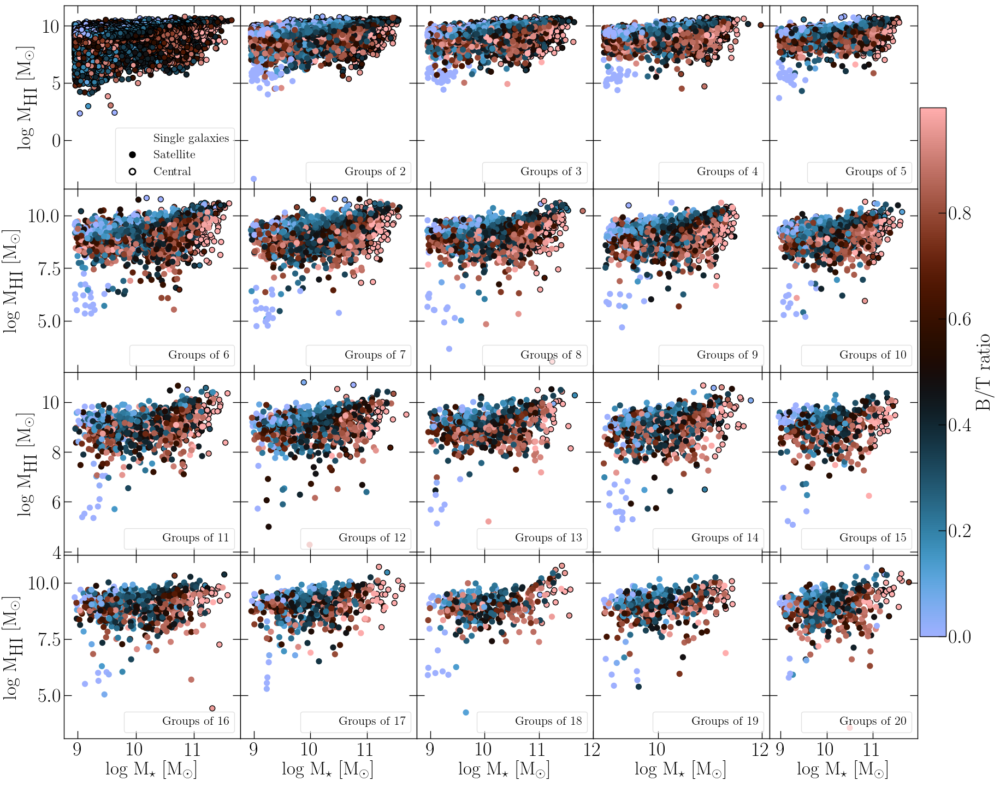

In [82]:
mhi_vs_ms_3x3_colorbar(updated_dict)

In [83]:
BTT_number = 0.6
group_sizes = [3, 4, 5]

#central_gals = updated_dict[group_size]["Centrals"]  #List of integers. Contains indices of central galaxies.  List is obtained through the dictionary. 
#sat_gals = updated_dict[group_size]["Satellites"] #List of integers. Contains indices of satellite galaxies. List is obtained through the dictionary.
#BTT_central = updated_dict[group_size]["Centrals"]
#BTT_satellite = updated_dict[group_size]["Satellites"]
sdef BTT_for_groups(BTT_number, group_size):

    for group_size in group_sizes:
    
        fig = plt.figure(figsize=(7,7))                                                               
        ax = fig.add_subplot(1,1,1)
        
        sns.set_style=("ticks", {"xtick.major.size":10, "ytick.major.size":10, "xtick.minor.size":6,"ytick.minor.size":6, "lines.linewidth": 3})

        sns_plot= sns.kdeplot(np.log10(df_percent['GroupStellarMass'] [ (df_percent["BTT_central"] > BTT_number) & (df_percent['GroupSize']==group_size) ]), 
                    np.log10(df_percent['GroupHIMass'] [ (df_percent["BTT_central"] > BTT_number) & (df_percent['GroupSize']==group_size) ]  ), 
                           shade=True,shade_lowest=False, alpha= 0.5, cmap=grayC_map, label= 'BTTcen $>$ {0}'.format(BTT_number)) #shade=True, shade_lowest=False, 
        
        sns.kdeplot(np.log10(df_percent['GroupStellarMass'][ (df_percent["BTT_central"] <= BTT_number) & (df_percent['GroupSize']==group_size) ]), 
                    np.log10(df_percent['GroupHIMass'][ (df_percent["BTT_central"] <= BTT_number) & (df_percent['GroupSize']==group_size) ]),  cmap=devon_map, label= r'BTTcen $\leq$ {0}'.format(BTT_number))
        
        
        ax.set_xlabel(r'log M$_{\star\textrm{group}}$ [M$_{\odot}$]', fontsize=25)
        ax.set_ylabel(r'log M$_{\textrm{HI}\textrm{group}}$ [M$_{\odot}$]',fontsize=25)
        ax.yaxis.set_ticks_position('both')
        ax.xaxis.set_ticks_position('both')
        
        plt.legend(loc=3)
        leg = ax.get_legend()
        leg.set_title('Group size {0}'.format(group_size)) 
        leg.legendHandles[0].set_color('purple')
        leg.legendHandles[1].set_color('grey')
        #plt.ylim(9.1,11)
        #fig.savefig('./contour_test.png')
        
        plt.show()


INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


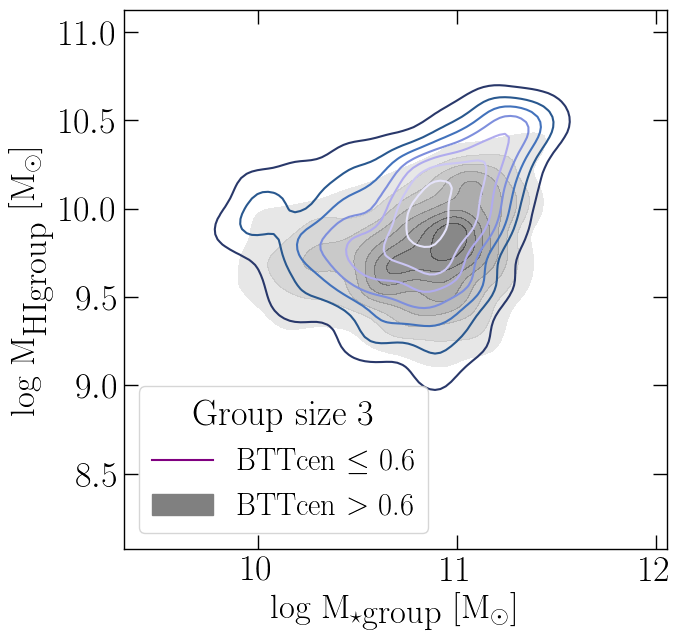

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


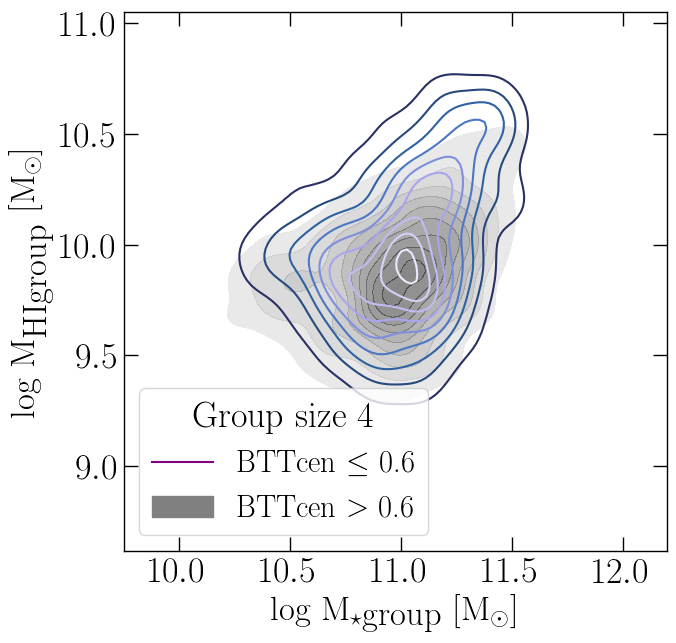

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


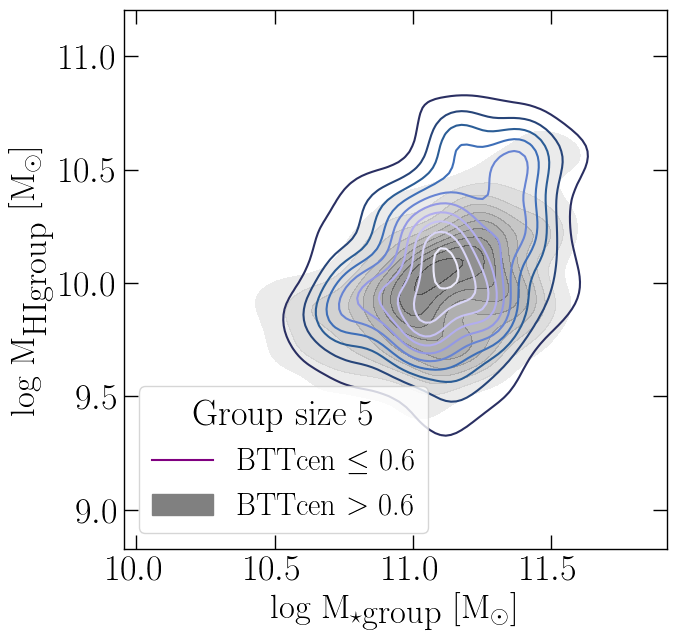

In [84]:
BTT_for_groups(BTT_number, group_sizes)

In [85]:
# Initiate figure and how large it will be
@jit
def BT_distribution(groups_dict):
    
    """
    Make 3x3 plot (HI mass vs Stellar mass) with galaxy groups based on the number of galaxies in a group and separate in each group central
    and satellite galaxy.
    
    Parameters
    ==========
    groups_dict: Dictionary. Keyed by the group size. Use: ``groups_dict[group_size]["Centrals"]``
                 Extracts groups with size N and the satellite & central galaxies
                 Created dictionary from (def create_cen_sat_from_groups_dict)
  
    Returns
    =======
    3x3 Figure with M_HI versus M_*
    
    Usage
    =====
    To use type: ``mhi_vs_ms_3x3(updated_dict) ``
                 Where updated_dict is the dictionary that is parsed to plotting function
                 ``updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices)``
    
    """
    
    
    fig, ax = plt.subplots(figsize=(8,8))
    
    #ax[0][0].plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', color='lightgrey',markersize=8, label='Single galaxies')
    
    # Put plot in row and columns:3by3 are 00, 01, 02, 10, 11, 12, 20, 21, 22 
    
    BTT_c = []
    BTT_s = []
    
    for size in trange(1, 20, 1): #I'm planning to have 1-9 sized groups. Made to form trange(1, 9, 1) as 3x3 pannels 
    
        group_size = size+1 # Select number of galaxies per group --- adding +1 because it is counting from 0.
    
        central_gals = groups_dict[group_size]["Centrals"]  #List of integers. Contains indices of central galaxies.  List is obtained through the dictionary. 
        sat_gals = groups_dict[group_size]["Satellites"] #List of integers. Contains indices of satellite galaxies. List is obtained through the dictionary.
        
        BTT_central = groups_dict[group_size]["Centrals"]
        BTT_satellite = groups_dict[group_size]["Satellites"]
        
        BTT_c.extend(BTT[BTT_central])
        BTT_s.extend(BTT[BTT_satellite])
    
    binwidth=0.1
    bins = np.arange(0, 1.1, binwidth)
    plt.hist(BTT_s, bins=bins, color='#2c7fb8', edgecolor='k', linewidth=1, alpha=0.8, label='Satellite')
    plt.hist(BTT_c, bins=bins, color='white', edgecolor='#2c7fb8', linewidth=4, alpha=0.6, label='Central')

    
    leg = ax.legend(loc=1,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)
    
    ax.set_xlabel(r'B/T ratio',fontsize=25)
    ax.set_ylabel(r'N$_{\textrm{galaxies}}$',fontsize=25)
    
    plt.tight_layout()

    plt.subplots_adjust(wspace = 0.0, hspace = 0.0)
    plt.xlim(-0.05,1.05)
    plt.show()
    #return fig


100%|██████████| 19/19 [00:00<00:00, 2776.81it/s]
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


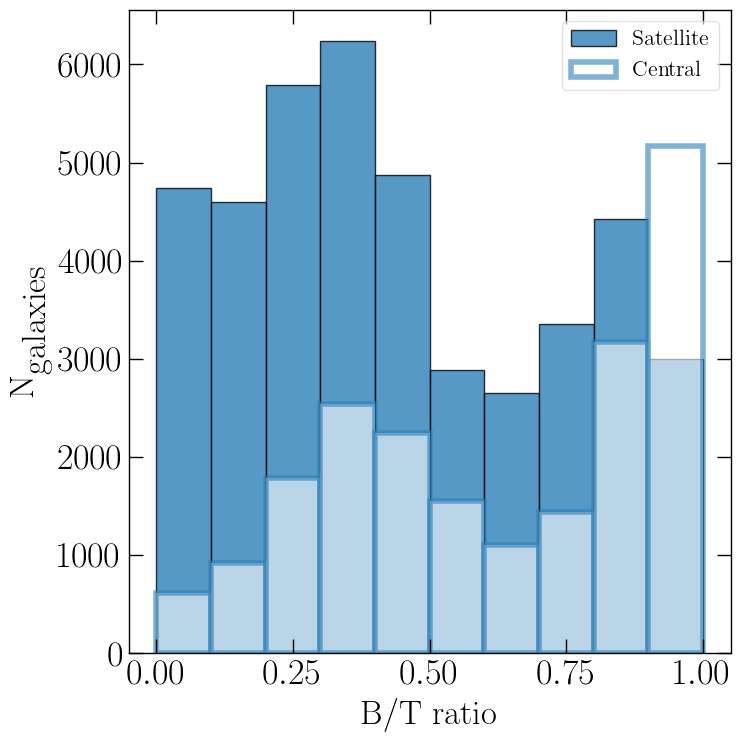

In [86]:
BT_distribution(updated_dict)

In [78]:
# Initiate figure and how large it will be
@jit
def BTT_colorbar(groups_dict):
    
    """
    Make 3x3 plot (HI mass vs Stellar mass) with galaxy groups based on the number of galaxies in a group and separate in each group central
    and satellite galaxy.
    
    Parameters
    ==========
    groups_dict: Dictionary. Keyed by the group size. Use: ``groups_dict[group_size]["Centrals"]``
                 Extracts groups with size N and the satellite & central galaxies
                 Created dictionary from (def create_cen_sat_from_groups_dict)
  
    Returns
    =======
    3x3 Figure with M_HI versus M_*
    
    Usage
    =====
    To use type: ``mhi_vs_ms_3x3(updated_dict) ``
                 Where updated_dict is the dictionary that is parsed to plotting function
                 ``updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices)``
    
    """
    
    cm = lapaz_map
    fig, ax = plt.subplots(figsize=(10, 8))
    
    #ax[0][0].plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', color='lightgrey',markersize=8, label='Single galaxies')
    
    # Put plot in row and columns:3by3 are 00, 01, 02, 10, 11, 12, 20, 21, 22 
    for size in trange(1, 9, 1): #I'm planning to have 1-9 sized groups. Made to form trange(1, 9, 1) as 3x3 pannels 
    
        group_size = size+1 # Select number of galaxies per group --- adding +1 because it is counting from 0.
    
        central_gals = groups_dict[group_size]["Centrals"]  #List of integers. Contains indices of central galaxies.  List is obtained through the dictionary. 
        sat_gals = groups_dict[group_size]["Satellites"] #List of integers. Contains indices of satellite galaxies. List is obtained through the dictionary.
        
        BTT_central = groups_dict[group_size]["Centrals"]
        BTT_satellite = groups_dict[group_size]["Satellites"]
        

       
        ax.scatter(np.log10(G['StellarMass'][central_gals]*1e10/h), 
                         np.log10(np.sum(G['DiscHI'],axis=1)[central_gals]*1e10/h), 
                     c = BTT[BTT_central], s=150, edgecolor='k', linewidth=1, cmap= cm)    
                     
        # Satellites
        ax.scatter(np.log10(G['StellarMass'][sat_gals]*1e10/h), 
                         np.log10(np.sum(G['DiscHI'],axis=1)[sat_gals]*1e10/h), 
                         c = BTT[BTT_satellite], s=150, cmap= cm)
    
        # Add label for each sub-plot to know the group size and what is central/satellite
        #ax.plot([], [], 'o', color='lightgrey', label='Single galaxies')
    ax.plot([], [], 'o', color='#1f78b4', markersize=10, label='Satellite')
    ax.plot([], [], 'o', color='white', markeredgecolor='k', markersize=10, markeredgewidth=3, label='Central')
        #Add legend  
        
    ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
    
    leg = ax.legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)

    plt.tight_layout()

    plt.subplots_adjust(wspace = 0.0, hspace = 0.0)
    
    # COLORBAR for the entire plot
    plt.colorbar(im, ax=ax, pad=0.01, label=r'B/T ratio')
    plt.ylim(2,11.5)
    plt.show()
    #return fig


100%|██████████| 8/8 [00:01<00:00,  6.18it/s]


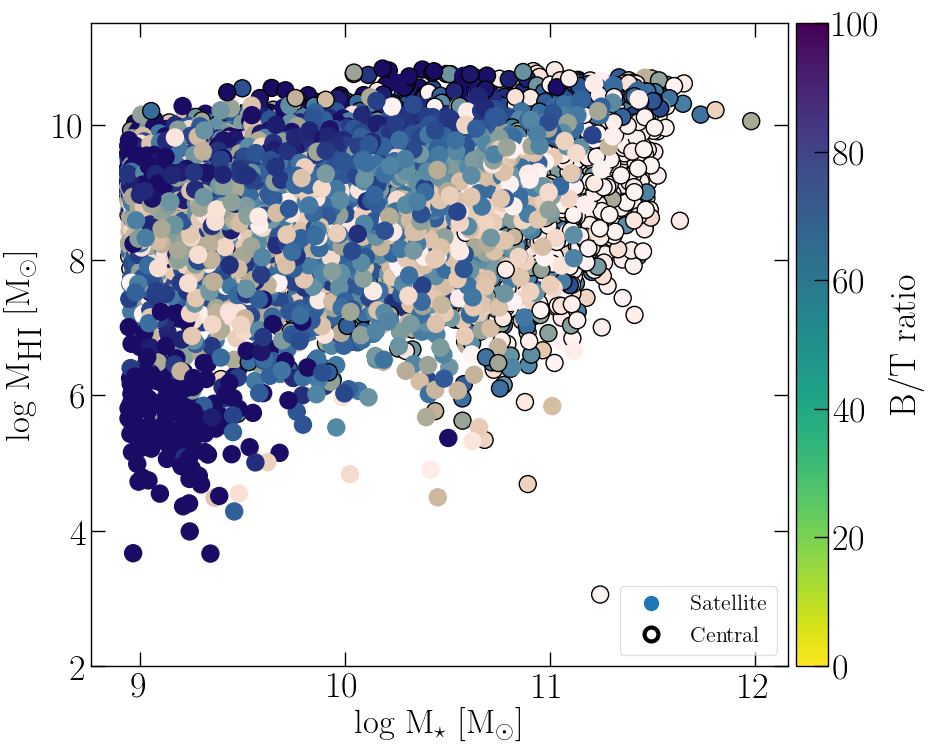

In [79]:
BTT_colorbar(updated_dict)

# How the group look like (Mvir/Rvir/Pos)
#### Make a function to extract parameters

In [95]:
for i in c_ind[0:5]:
    print(i, G['Rvir'][i][0:])


[981] [0.27567366]
[994] [0.18490659]
[1324] [0.18081096]
[1511] [0.08291441]
[2152] [0.14341983]


In [151]:
for i in g_ind[0:5]:
    print(G['Pos'][i][0:])

[[ 14.069526 497.66397   43.96974 ]
 [ 13.939832 497.74933   44.09529 ]
 [ 14.123639 497.45767   44.098263]]
[[ 15.879589 498.96158   43.661137]
 [ 15.938244 499.02756   43.62672 ]
 [ 15.747075 498.91888   43.879242]]
[[  4.3075085  13.855656  499.77805  ]
 [  4.235369   13.813037  499.95203  ]
 [  4.4794354  13.564551  499.93375  ]]
[[ 54.3965    60.635124 499.44687 ]
 [ 54.26466   60.97239  499.54718 ]
 [ 54.440594  60.796658 499.41495 ]]
[[44.460167 51.243183 39.577137]
 [44.319397 51.269867 39.564552]
 [44.5661   51.073048 39.552715]]


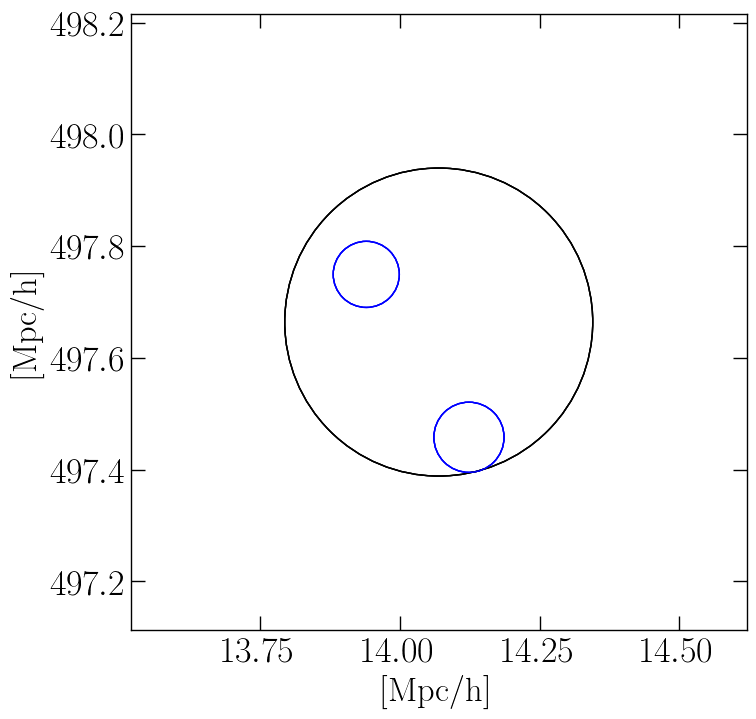

In [156]:

fig, ax = plt.subplots(figsize=(8,8))
for i in each_group:
    #print(G['Pos'][i][0])
    
    
    plt.plot( (G['Pos'][i])[0], (G['Pos'][i])[1], 'ko')
    #plt.plot( G['Pos'][i][0][0], G['Pos'][i][1][0], 'rD', markersize=15, alpha=0.1)
    
    
    circle1 = plt.Circle((14.069526, 497.66397), 0.27567366, color='k', fill=False, clip_on=False)
    circle2 = plt.Circle((13.939832, 497.74933), 0.05918148, color='b', fill=False, clip_on=False)
    circle3 = plt.Circle((14.123639, 497.45767), 0.06282725, color='b', fill=False, clip_on=False)
    
    ax.add_artist(circle1)
    ax.add_artist(circle2)
    ax.add_artist(circle3)
    
    #plt.tight_layout()
    ax.set_aspect('equal')
    plt.xlim(14.069526-2*0.27567366,14.069526+2*0.27567366)
    plt.ylim(497.66397-2*0.27567366, 497.66397+2*0.27567366)
    
    ax.set_xlabel(r'[Mpc/h]', fontsize=25)
    ax.set_ylabel(r'[Mpc/h]',fontsize=25)

In [98]:
two_sided_histogram_rich(perc_richer_central_s_m, perc_richer_central_hi_m, 
                         perc_poorer_central_s_m, perc_poorer_central_hi_m) 

NameError: name 'perc_richer_central_s_m' is not defined

In [ ]:
two_sided_histogram_rich_groups(perc_richer_central_s_m.ravel(), perc_richer_central_hi_m.ravel(), 
                                perc_poorer_central_s_m.ravel(), perc_poorer_central_hi_m.ravel(),
                                perc_richer_sat_s_m, perc_richer_sat_hi_m, 
                                perc_poorer_sat_s_m, perc_poorer_sat_hi_m) 


# Central and satellite (similar Mstar; large MHI difference)
##### Takes too long to run

In [ ]:
#Use dictionary and for each galaxy in "Groups" of 3 show central/satellite index

diff_central_ind = [] #storring where central/satellite is above/below some percentage
norm_diff_central_ind = []

norm_diff_sat_ind = [] #satellites that belong to richer central
diff_sat_ind = [] #satellites that belong to poorer central

diff_groups = []
gr_key = []
per_cent_j1250 = []

#per_cent = [] # How much of HI mass is in central galaxy (in %)
@jit
def find_j1250_like_distribution():
    for i in trange(3,4,1): #starting grom galaxy pairs
        for group_key in updated_dict[i]["Groups"].keys():
            #print(group_key) #group_1 etc
            central_idx = updated_dict[i]["Groups"][group_key]["Centrals"] #give indices
            central_mass = np.log10(np.sum(G['DiscHI'],axis=1)[central_idx]*1e10/h +1) #give masses of these galaxies
            central_star_mass = np.log10(G['StellarMass'][central_idx]*1e10/h +1)
            
            satellite_inds = updated_dict[i]["Groups"][group_key]["Satellites"]
            sat_mass = np.log10(np.sum(G['DiscHI'],axis=1)[satellite_inds]*1e10/h +1)
            sat_star_mass = np.log10(G['StellarMass'][satellite_inds]*1e10/h +1)
            
            
            diff_in_star_mass = abs(central_star_mass - sat_star_mass) #abs difference in stellar masses
            diff_in_hi_mass = abs(central_mass - sat_mass) #abs difference in HI mass

            
            if ((diff_in_star_mass < 0.4).all() & (diff_in_hi_mass > 0.8 ).any()):
                print('diff_st', diff_in_star_mass)
                print('diff_hi', diff_in_hi_mass)
                
                sum_of_all_satellites = np.sum(sat_mass)
                percentage = (central_mass.ravel()/(central_mass+sum_of_all_satellites))*100
               
                print(percentage[0])
                #g_mass = sat_mass+cenral_mas
                #percentage = (central_mass.ravel()/g_mass)*100
                per_cent_j1250.append(percentage[0])
                
                diff_central_ind.append(central_idx[0]) #[0] so its creates a list
                diff_sat_ind.extend(satellite_inds) #it complains and complicates when i want to do .append
                diff_groups.append(updated_dict[i]["Groups"][group_key]['Centrals'][0])
                diff_groups.extend(satellite_inds)
                gr_key.append(group_key)
            else:
    #            print("Sum of the satellites are more massive than central")
                norm_diff_central_ind.append(central_idx[0])
                norm_diff_sat_ind.extend(satellite_inds)
    #        #print(sat_mass > central_mass)


In [ ]:
find_j1250_like_distribution()

In [ ]:
print(diff_groups)
print(gr_key)


In [ ]:
#HI Masses, obtained from the indices: 
diff_central_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[diff_central_ind] *1e10/h )+1)
diff_central_s_m = np.log10( G['StellarMass'][diff_central_ind] *1e10/h +1)

#have to store satellites like this; otherwise it complains
diff_sat_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[diff_sat_ind] *1e10/h )+1)
diff_sat_s_m = np.log10( G['StellarMass'][diff_sat_ind] *1e10/h +1)

#HI Masses, obtained from the indices: 
norm_diff_central_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[norm_diff_central_ind] *1e10/h )+1)
norm_diff_central_s_m = np.log10( G['StellarMass'][norm_diff_central_ind] *1e10/h +1)

#have to store satellites like this; otherwise it complains
norm_diff_sat_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[norm_diff_sat_ind] *1e10/h )+1)
norm_diff_sat_s_m = np.log10( G['StellarMass'][norm_diff_sat_ind] *1e10/h +1)

In [ ]:
two_sided_histogram_difference(diff_central_s_m.ravel(), diff_central_hi_m.ravel(), 
                                norm_diff_central_s_m.ravel(), norm_diff_central_hi_m.ravel(),
                                diff_sat_s_m, diff_sat_hi_m, 
                                norm_diff_sat_s_m, norm_diff_sat_hi_m) 


In [ ]:

fig = plt.figure(figsize=(13,10))                                                               
ax = fig.add_subplot(1,1,1)

cm = plt.cm.get_cmap('YlGnBu')
#Numpy doesn't know what you might have stored in a object array, 
BTT_cen = BTT_cen.astype(np.float64) 
#df_percent['HImass'] = df_percent['HImass'].astype(np.float64)

#BE CAREFUL HERE! Constructed sizes are OK for current groups; will need change
#s = 80*df_percent['Group_size']
sizes = [100,300,500,700,900]
im = plt.scatter(diff_central_s_m.ravel(), diff_central_hi_m.ravel(), s= 300,
                        c=per_cent_j1250 , edgecolor='k', cmap=cm, label=r'Groups ($N\geq3$) properties')

fig.colorbar(im, ax=ax, orientation='vertical', label=r'\% of the M$_{\mathrm{HI}}$ in central',
            pad=0.01)

ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
ax.legend(loc=2)
leg = ax.get_legend()
leg.legendHandles[0].set_color('k')

#l1 = plt.scatter([],[], s=100, color='white',edgecolors='k')
#l2 = plt.scatter([],[], s=300, color='white',edgecolors='k')
#l3 = plt.scatter([],[], s=500, color='white',edgecolors='k')
#l4 = plt.scatter([],[], s=700, color='white',edgecolors='k')
#l5 = plt.scatter([],[], s=900, color='white',edgecolors='k')

#labels = ["3", "4", "5", "6", '7']

#leg = plt.legend([l1, l2, l3, l4, l5], labels, ncol=1, loc=3, framealpha=0.5)
#eg.set_title('Group size')                   
                   
#plt.ylim(6,11)

In [ ]:
item1 = 9
item2 = 12
diff_groups_sm = np.log10( G['StellarMass'][diff_groups] *1e10/h +1)
diff_groups_him = np.log10( (np.sum(G['DiscHI'],axis=1)[diff_groups] *1e10/h) +1)

In [ ]:

two_sided_histogram_difference_groups(diff_central_s_m.ravel(), diff_central_hi_m.ravel(), 
                                norm_diff_central_s_m.ravel(), norm_diff_central_hi_m.ravel(),
                                diff_sat_s_m, diff_sat_hi_m, 
                                norm_diff_sat_s_m, norm_diff_sat_hi_m,
                              diff_groups_sm, diff_groups_him) 

In [ ]:
print(diff_groups)
print(diff_central_ind)
print(gr_key)

In [ ]:
for i in gr_key:
    print(updated_dict[3]["Groups"][i]) #shows indices of Nth group in groups of 3

In [ ]:
#Divide array into n-arrays
#f = lambda diff_groups, n=3: [diff_groups[i:i+n] for i in range(0, len(diff_groups), n)]
#New_groups = f(diff_groups)
#print(New_groups)

# Make HI profiles for HI-rich galaxies

In [146]:
area = np.pi*(G['DiscRadii'][:,1:]**2 - G['DiscRadii'][:,:-1]**2) * 1e12/h**2
R_av = np.sqrt((G['DiscRadii'][:,1:]**2 + G['DiscRadii'][:,:-1]**2) / 2.) * 1e3/h # kpc
Sigma_HI = (G['DiscHI']*1e10/h) / area

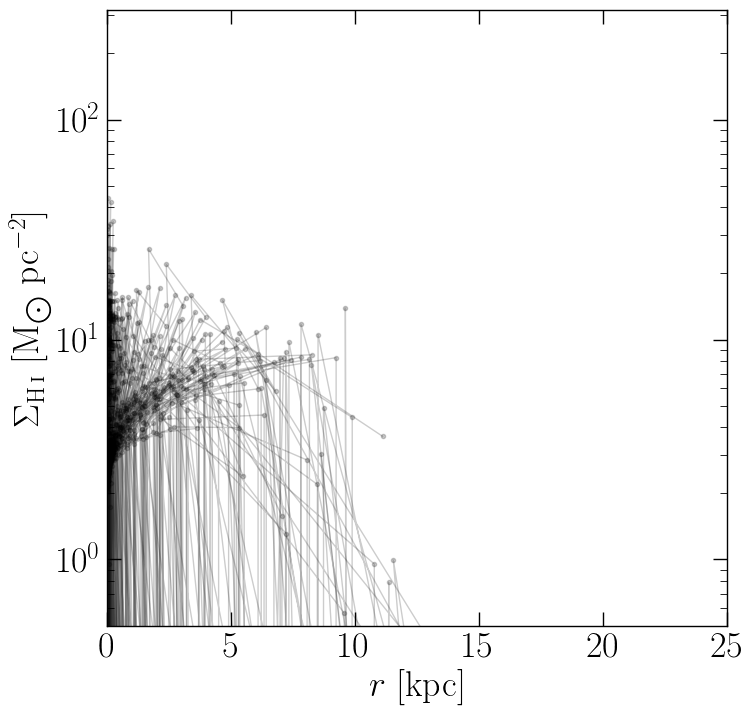

In [115]:
fig, ax = plt.subplots(figsize=(8,8))

ax.plot(R_av[50:100], Sigma_HI[50:100], 'k.-', lw=1, alpha=0.2)
ax.set_yscale('log', nonposy='clip')
ax.set_ylabel(r'$\Sigma_{\rm H\,{\LARGE{\textsc i}}}$ [M$_{\bigodot}$ pc$^{-2}$]')
ax.set_xlabel(r'$r$ [kpc]')
ax.axis([0,25,5e-1,10**2.5])
plt.show();

# Code from A.Stevens

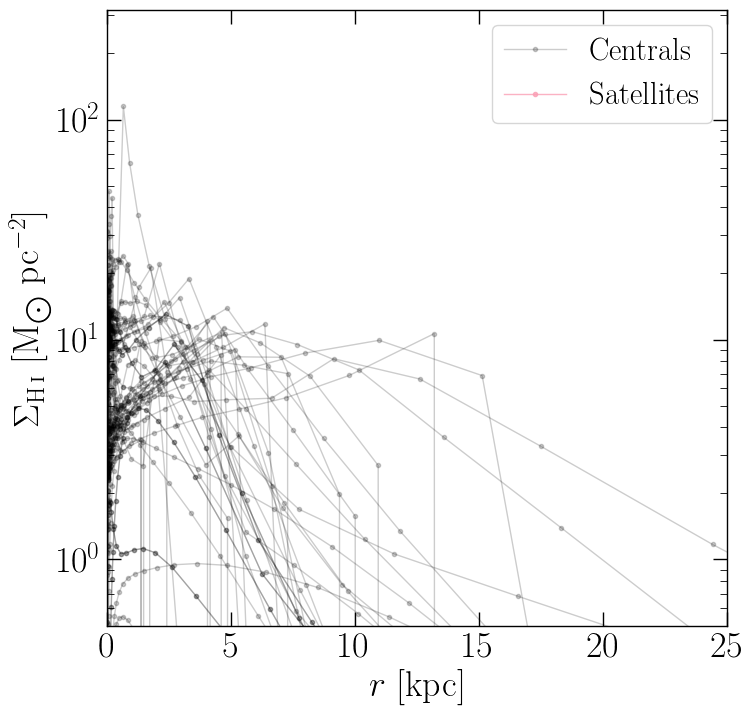

In [145]:
BaryM = (G['ColdGas']/1.3 + G['StellarMass']) * 1e10/h
BaryM_med = np.log10(np.median(BaryM[G['LenMax']>=NpartMed])) #Rob: added >= instead ==
Vel_Profiles = DiscBinEdge[1:] / (G['DiscRadii'][:,1:]*1e3/h)
Vmax = np.max(Vel_Profiles, axis=1)
#Rob: I added c_ind as a selection

#Select central and satellite galaxies
filt_cen = (G['ColdGas'][c_ind]/1.3 > G['StellarMass'][c_ind]) * (BaryM>=BaryM_med-0.11) # Stark data only had gas-dominated galaxies
#filt_sat = (G['ColdGas'][s_ind].ravel()/1.3 > G['StellarMass'][s_ind].ravel()) * (BaryM>=BaryM_med-0.11) # Stark data only had gas-dominated galaxies


Nprof = 50 # Number of profiles to plot
#Older, reported error:
#args = random.sample(np.where(filt)[0], Nprof) if len(filt[filt])>Nprof else np.where(filt)[0]
#Rob: I fixed error placing: list
args_cen = random.sample(list(np.where(filt_cen)[0]), Nprof) if len(filt_cen[filt_cen])>Nprof else np.where(filt_cen)[0]
#args_sat = random.sample(list(np.where(filt_cen)[0]), Nprof) if len(filt_cen[filt_cen])>Nprof else np.where(filt_cen)[0]

fig, ax = plt.subplots(figsize=(8,8))
for a in args_cen:
    ax.plot(R_av[a,:], Sigma_HI[a,:], 'k.-', lw=1, alpha=0.2)
#for a in args_sat:
#    ax.plot(R_av[a,:], Sigma_HI[a,:], 'k.-', lw=1, alpha=0.2)
    
ax.plot([], [], 'k.-', lw=1, alpha=0.2, label='Centrals')
ax.plot([], [], '.-', color='#fa9fb5', lw=1, alpha=0.8, label='Satellites')

ax.set_yscale('log', nonposy='clip')
ax.set_ylabel(r'$\Sigma_{\rm H\,{\LARGE{\textsc i}}}$ [M$_{\bigodot}$ pc$^{-2}$]')
ax.set_xlabel(r'$r$ [kpc]')
ax.axis([0,25,5e-1,10**2.5])
plt.legend()
plt.show();